# DATASET

## Customer DATA

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
customers_orders=pd.read_csv("Customers_Orders_Data.csv", na_values=['\\N',' '])

In [ ]:
customers_orders.tail()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_mrp,product_procurement_sla
1648819,1648819,VPLEYAP3ZYYUVESU,2023-09-27 19:20:31,4.402170e+15,4.402170e+15,2200.0,1,NaN,NaN,COD,7,-9.906343e+17,7.894759e+18,2499,2
1648820,1648820,VPLEYAP3ZYYUVESU,2023-09-28 01:32:58,1.402393e+15,1.402393e+15,2098.0,1,NaN,NaN,COD,10,3.048923e+18,-1.457586e+18,2499,2
1648821,1648821,VPLEYAP3ZYYUVESU,2023-09-29 07:07:57,4.403460e+15,4.403460e+15,2098.0,1,NaN,NaN,COD,5,-4.531404e+18,5.746490e+18,2499,2
1648822,1648822,VPLEYAP3ZYYUVESU,2023-09-29 18:15:45,4.403860e+15,4.403860e+15,2200.0,1,NaN,NaN,COD,3,-8.940464e+18,2.572948e+18,2499,2
1648823,1648823,VPLEYAP3ZYYUVESU,2023-09-29 21:31:37,4.403971e+15,4.403971e+15,2295.0,1,NaN,NaN,COD,5,6.009445e+18,4.383735e+17,2499,2


In [ ]:
# Get the shape of the dataset
rows, columns = customers_orders.shape

print(f'Total Rows: {rows}')
print(f'Total Columns: {columns}')


Total Rows: 1648824
Total Columns: 15


In [ ]:
customers_orders.describe()

,Unnamed: 0,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.643920e+06,1.648824e+06,335852.000000,335853.000000,1.648824e+06,1.643920e+06,1.643920e+06,1.648824e+06,1.648824e+06
mean,8.244115e+05,2.842445e+15,1.375628e+16,2.461124e+03,1.022087e+00,4.575358,5.248299,5.687832e+00,-7.057686e+15,1.002128e+17,4.108309e+03,5.403451e+00
std,4.759746e+05,1.269134e+15,5.594598e+16,5.618842e+03,2.535318e-01,3.382710,12.521473,2.983336e+00,5.327064e+18,5.312979e+18,8.510918e+03,5.346618e+01
min,0.000000e+00,7.633152e+07,1.080165e+08,0.000000e+00,1.000000e+00,-98.000000,-5345.000000,0.000000e+00,-9.223351e+18,-9.221830e+18,0.000000e+00,-1.000000e+00
25%,4.122058e+05,1.602589e+15,1.606725e+15,3.400000e+02,1.000000e+00,3.000000,3.000000,4.000000e+00,-4.616854e+18,-4.414802e+18,7.990000e+02,1.000000e+00
50%,8.244115e+05,2.611825e+15,2.619185e+15,7.500000e+02,1.000000e+00,4.000000,5.000000,6.000000e+00,-1.738055e+16,1.240911e+17,1.599000e+03,2.000000e+00
75%,1.236617e+06,3.610614e+15,4.397706e+15,1.999000e+03,1.000000e+00,6.000000,7.000000,7.000000e+00,4.603580e+18,4.786651e+18,3.499000e+03,3.000000e+00
max,1.648823e+06,5.395077e+15,3.000373e+17,2.269470e+05,5.000000e+01,238.000000,278.000000,1.006000e+03,9.223362e+18,9.222980e+18,2.999990e+05,1.000000e+03


In [ ]:
customers_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 15 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   Unnamed: 0               1648824 non-null  int64  
 1   fsn_id                   1648824 non-null  object 
 2   order_date               1648824 non-null  object 
 3   order_id                 1648824 non-null  float64
 4   order_item_id            1648824 non-null  float64
 5   gmv                      1643920 non-null  float64
 6   units                    1648824 non-null  int64  
 7   deliverybdays            335852 non-null   float64
 8   deliverycdays            335853 non-null   float64
 9   order_payment_type       1648824 non-null  object 
 10  sla                      1648824 non-null  int64  
 11  cust_id                  1643920 non-null  float64
 12  pincode                  1643920 non-null  float64
 13  product_mrp              1648824 non-null 

In [ ]:
# Convert the Order Date to datetime format
customers_orders['order_date'] = pd.to_datetime(customers_orders['order_date'], errors='coerce')

# Filter data from July 2023 to June 2024
customers_orders_filtered = customers_orders[(customers_orders['order_date'] >= '2023-07-01') & (customers_orders['order_date'] <= '2024-06-30')]

# Display the minimum and maximum date
min_date = customers_orders_filtered['order_date'].min()
max_date = customers_orders_filtered['order_date'].max()

print(f'Date Range: {min_date.date()} to {max_date.date()}')

Date Range: 2023-07-01 to 2024-06-29


In [ ]:
customers_orders_filtered.shape

(1644943, 15)

In [ ]:
customers_orders_filtered.loc[:, 'date']= customers_orders_filtered.loc[:, 'order_date'].dt.strftime('%d-%m-%y')

<ipython-input-96-6d030cac68f2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  customers_orders_filtered.loc[:, 'date']= customers_orders_filtered.loc[:, 'order_date'].dt.strftime('%d-%m-%y')


In [ ]:
customers_orders_filtered.loc[:,'time'] = customers_orders_filtered.loc[:, 'order_date'].dt.time

<ipython-input-97-a330caab5e14>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  customers_orders_filtered.loc[:,'time'] = customers_orders_filtered.loc[:, 'order_date'].dt.time


In [ ]:
# Check for missing values in each column
missing_values = customers_orders_filtered.isnull().sum()

print("Missing Values in each column:")
print(missing_values)


Missing Values in each column:
Unnamed: 0                       0
fsn_id                           0
order_date                       0
order_id                         0
order_item_id                    0
gmv                           4904
units                            0
deliverybdays              1312149
deliverycdays              1312148
order_payment_type               0
sla                              0
cust_id                       4904
pincode                       4904
product_mrp                      0
product_procurement_sla          0
date                             0
time                             0
dtype: int64


In [ ]:
customers_orders_filtered.describe()

,Unnamed: 0,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_mrp,product_procurement_sla
count,1.644943e+06,1644943,1.644943e+06,1.644943e+06,1.640039e+06,1.644943e+06,332794.000000,332795.000000,1.644943e+06,1.640039e+06,1.640039e+06,1.644943e+06,1.644943e+06
mean,8.233204e+05,2024-01-09 19:38:18.548040704,2.841767e+15,1.378135e+16,2.460255e+03,1.022098e+00,4.580954,5.252399,5.688765e+00,-6.817757e+15,1.004812e+17,4.107745e+03,5.384293e+00
min,0.000000e+00,2023-07-01 00:36:11,7.633152e+07,1.080165e+08,0.000000e+00,1.000000e+00,-98.000000,-5345.000000,0.000000e+00,-9.223351e+18,-9.221830e+18,0.000000e+00,-1.000000e+00
25%,4.112355e+05,2023-10-16 17:08:23.500000,1.601835e+15,1.605996e+15,3.400000e+02,1.000000e+00,3.000000,3.000000,4.000000e+00,-4.616375e+18,-4.414802e+18,7.990000e+02,1.000000e+00
50%,8.224710e+05,2024-01-06 23:25:09,2.611247e+15,2.618596e+15,7.500000e+02,1.000000e+00,4.000000,5.000000,6.000000e+00,-1.675182e+16,1.257301e+17,1.599000e+03,2.000000e+00
75%,1.234004e+06,2024-03-31 18:08:36,3.610296e+15,4.397723e+15,1.999000e+03,1.000000e+00,6.000000,7.000000,7.000000e+00,4.603707e+18,4.786651e+18,3.499000e+03,3.000000e+00
max,1.648823e+06,2024-06-29 23:59:22,5.395077e+15,3.000373e+17,2.269470e+05,5.000000e+01,238.000000,278.000000,1.006000e+03,9.223362e+18,9.222980e+18,2.999990e+05,1.000000e+03
std,4.760000e+05,NaN,1.269428e+15,5.600953e+16,5.616239e+03,2.536451e-01,3.391790,12.576661,2.983638e+00,5.326928e+18,5.312835e+18,8.509958e+03,5.328687e+01


In [ ]:
customers_orders_filtered.dtypes

,0
Unnamed: 0,int64
fsn_id,object
order_date,datetime64[ns]
order_id,float64
order_item_id,float64
gmv,float64
units,int64
deliverybdays,float64
deliverycdays,float64
order_payment_type,object


In [ ]:
customers_orders_filtered.shape

(1644943, 17)

In [ ]:
customers_orders_filtered.loc[:, 'pincode'] = customers_orders_filtered.loc[:, 'pincode'].abs()

In [ ]:
# Combine 'Order ID' and 'Order Item ID' as a key
customers_orders_filtered.loc[:, 'Order_Combo'] = customers_orders_filtered.loc[:, 'order_id'].astype(str) + '-' + customers_orders_filtered.loc[:, 'order_item_id'].astype(str)

# ✅ Find duplicates ONLY if BOTH 'order_id' and 'order_item_id' match exactly
duplicates = customers_orders_filtered[customers_orders_filtered.duplicated('Order_Combo')]

# ✅ Display the total duplicate records
print("Total Exact Duplicates Found:", len(duplicates))

# ✅ Display the first few duplicates
duplicates.head()

<ipython-input-103-f25b8fcbef59>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  customers_orders_filtered.loc[:, 'Order_Combo'] = customers_orders_filtered.loc[:, 'order_id'].astype(str) + '-' + customers_orders_filtered.loc[:, 'order_item_id'].astype(str)


Total Exact Duplicates Found: 140025


,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_mrp,product_procurement_sla,date,time,Order_Combo
713,713,ACCCX3SU22JG8NJX,2023-10-17 09:35:02,3.419100e+15,3.419100e+15,470.0,1,NaN,NaN,Prepaid,7,9.082469e+18,7.824111e+18,1545,1,17-10-23,09:35:02,3419099777445400.0-3419099777445400.0
718,718,ACCCX3SU22JG8NJX,2023-10-20 09:01:24,1.409641e+15,1.409641e+15,470.0,1,NaN,NaN,COD,7,4.679365e+17,4.692358e+18,1545,1,20-10-23,09:01:24,1409640719662800.0-1409640719662800.0
722,722,ACCCX3SU22JG8NJX,2023-11-04 11:56:07,2.429103e+15,2.429103e+15,470.0,1,NaN,NaN,COD,6,-4.992322e+18,8.661222e+18,1545,1,04-11-23,11:56:07,2429102566635600.0-2429102566635600.0
724,724,ACCCX3SU22JG8NJX,2023-10-22 10:41:11,3.423460e+15,3.423460e+15,470.0,1,NaN,NaN,COD,9,-9.142466e+18,8.210463e+17,1545,1,22-10-23,10:41:11,3423459581510700.0-3423459581510700.0
925,925,ACCCX3SUEACQJ2QG,2023-11-06 19:19:34,2.425446e+15,2.425446e+15,130.0,1,NaN,NaN,COD,7,-1.234912e+18,2.165208e+18,399,2,06-11-23,19:19:34,2425445659528400.0-2425445659528400.0


In [ ]:
# prompt: drop duplicates from customers_orders_filtered which I have identified in above cell

# Drop duplicates based on the 'Order_Combo' column
customers_orders_filtered = customers_orders_filtered.drop_duplicates(subset=['Order_Combo'])

# Verify that duplicates have been removed
print("Total records after removing duplicates:", len(customers_orders_filtered))


Total records after removing duplicates: 1504918


In [ ]:
# Replace missing values (\N) in 'deliverybdays' and 'deliverycdays' with 0
customers_orders_filtered.loc[:, 'deliverybdays'] = customers_orders_filtered.loc[:, 'deliverybdays'].fillna(0)
customers_orders_filtered.loc[:, 'deliverycdays'] = customers_orders_filtered.loc[:, 'deliverycdays'].fillna(0)

In [ ]:
customers_orders_filtered.isnull().sum()

,0
Unnamed: 0,0
fsn_id,0
order_date,0
order_id,0
order_item_id,0
gmv,3950
units,0
deliverybdays,0
deliverycdays,0
order_payment_type,0


In [ ]:
customers_orders_filtered = customers_orders_filtered[(customers_orders_filtered['deliverybdays'] >= 0) & (customers_orders_filtered['deliverycdays'] >= 0)]


In [ ]:
customers_orders_filtered = customers_orders_filtered[customers_orders_filtered.loc[:, 'product_mrp'] != 0.0]

In [ ]:
customers_orders_filtered['cust_id'] = customers_orders_filtered['cust_id'].abs()

<ipython-input-109-f1ed5141032a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  customers_orders_filtered['cust_id'] = customers_orders_filtered['cust_id'].abs()


In [ ]:
customers_orders_filtered = customers_orders_filtered[customers_orders_filtered.loc[:, 'product_procurement_sla'] >= 0]

In [ ]:
customers_orders_filtered = customers_orders_filtered[customers_orders_filtered.loc[:, 'sla'] >= 0]

In [ ]:
customers_orders_filtered = customers_orders_filtered[customers_orders_filtered.loc[:, 'gmv'] != 0.0]

### EDA

In [ ]:
# ✅ Convert specific columns to object type
customers_orders_filtered.loc[:, 'order_id'] = customers_orders_filtered.loc[:, 'order_id'].astype('object')
customers_orders_filtered.loc[:, 'order_item_id'] = customers_orders_filtered.loc[:, 'order_item_id'].astype('object')
customers_orders_filtered.loc[:, 'cust_id'] = customers_orders_filtered.loc[:, 'cust_id'].astype('object')
customers_orders_filtered.loc[:, 'pincode'] = customers_orders_filtered.loc[:, 'pincode'].astype('object')

# ✅ Calculate summary statistics for all numeric columns
summary_stats = customers_orders_filtered.describe()

# ✅ Rename '50%' to 'median'
summary_stats.rename(columns={'50%': 'median'}, inplace=True)

# ✅ Display the summary statistics
print(summary_stats)

<ipython-input-113-e603db43d1bb>:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[3419300926147000.0 1420830839915200.0 2421912925714800.0 ...
 4403459511294400.0 4403860318235600.0 4403971467524500.0]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  customers_orders_filtered.loc[:, 'order_id'] = customers_orders_filtered.loc[:, 'order_id'].astype('object')
<ipython-input-113-e603db43d1bb>:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[3419300926147000.0 1420830839915200.0 2421912925714800.0 ...
 4403459511294400.0 4403860318235600.0 4403971467524500.0]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  customers_orders_filtered.loc[:, 'order_item_id'] = customers_orders_filtered.loc[:, 'order_item_id'].astype('object')
<ipython-input-113-e603db43d1bb>:4: Fu

         Unnamed: 0                     order_date           gmv  \
count  1.435435e+06                        1435435  1.431794e+06   
mean   7.820728e+05  2024-01-19 22:30:15.616940032  2.469597e+03   
min    0.000000e+00            2023-07-01 00:36:11  1.000000e+01   
25%    4.098855e+05            2023-10-30 13:38:36  3.500000e+02   
50%    7.874740e+05            2024-01-22 17:16:53  7.900000e+02   
75%    1.159722e+06     2024-04-09 11:47:36.500000  1.999000e+03   
max    1.543996e+06            2024-06-29 23:59:22  2.269470e+05   
std    4.409003e+05                            NaN  5.579501e+03   

              units  deliverybdays  deliverycdays           sla   product_mrp  \
count  1.435435e+06   1.435435e+06   1.435435e+06  1.435435e+06  1.435435e+06   
mean   1.019625e+00   1.022868e+00   1.190872e+00  5.764194e+00  4.209035e+03   
min    1.000000e+00   0.000000e+00   0.000000e+00  0.000000e+00  4.900000e+01   
25%    1.000000e+00   0.000000e+00   0.000000e+00  4.000000e+00

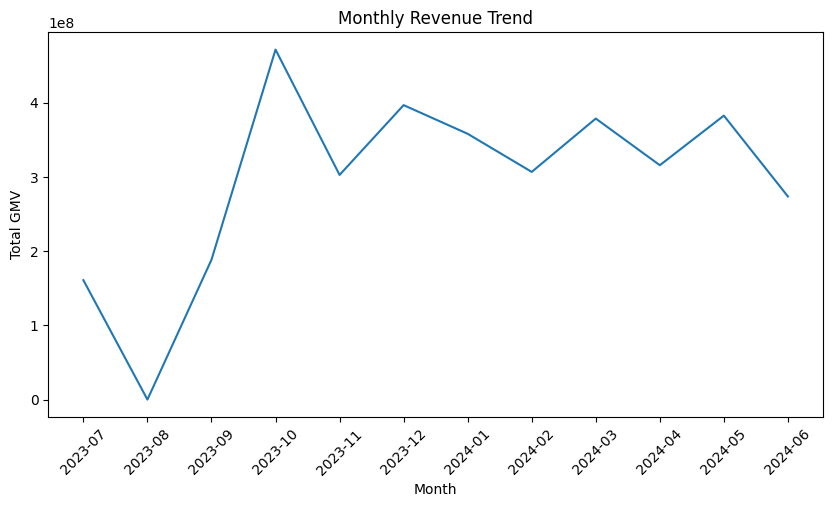

In [ ]:
#monthly revenue trend
customers_orders_filtered['Month'] = customers_orders_filtered['order_date'].dt.to_period('M')
monthly_revenue = customers_orders_filtered.groupby('Month')['gmv'].sum()

plt.figure(figsize=(10,5))
sns.lineplot(x=monthly_revenue.index.astype(str), y=monthly_revenue.values)
plt.xticks(rotation=45)
plt.title("Monthly Revenue Trend")
plt.xlabel("Month")
plt.ylabel("Total GMV")
plt.show()

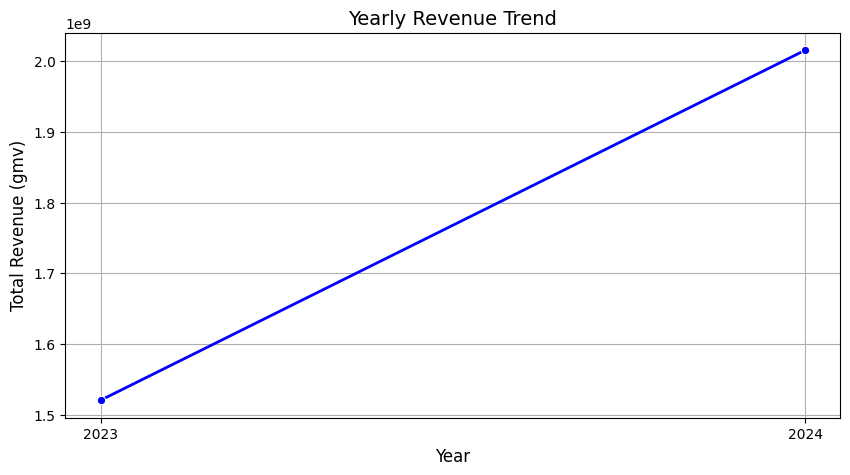

In [ ]:
#yearly revenue trend
# Extract Year from 'Order Date'
customers_orders_filtered['Year'] = customers_orders_filtered['order_date'].dt.year

# Group by Year and Calculate Total Revenue (GMV)
yearly_revenue = customers_orders_filtered.groupby('Year')['gmv'].sum().reset_index()

# Plot Yearly Revenue Trend
plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_revenue['Year'], y=yearly_revenue['gmv'], marker='o', linewidth=2, color='b')

# Customize the plot
plt.title("Yearly Revenue Trend", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Total Revenue (gmv)", fontsize=12)
plt.xticks(yearly_revenue['Year'])
plt.grid(True)

# Show the plot
plt.show()


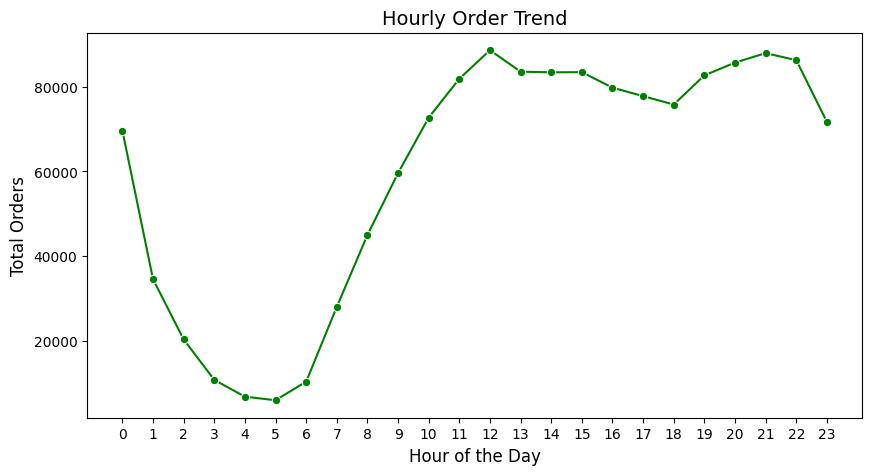

In [ ]:
#order trend
customers_orders_filtered['order_date'] = pd.to_datetime(customers_orders_filtered['order_date'])
customers_orders_filtered['Order Weekday'] = customers_orders_filtered['order_date'].dt.day_name()
customers_orders_filtered['Order Hour'] = customers_orders_filtered['order_date'].dt.hour

#peak ordering hour
# Group by Order Hour
hourly_orders = customers_orders_filtered.groupby('Order Hour')['order_id'].nunique().reset_index()

# Plot Hourly Order Trend
plt.figure(figsize=(10, 5))
sns.lineplot(x=hourly_orders['Order Hour'], y=hourly_orders['order_id'], marker='o', color='g')

# Customize the plot
plt.title("Hourly Order Trend", fontsize=14)
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Total Orders", fontsize=12)
plt.xticks(range(0, 24))  # Show all hours

# Show plot
plt.show()

<ipython-input-117-aadc27bf4116>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=daily_orders['Order Weekday'], y=daily_orders['order_id'], palette="coolwarm")


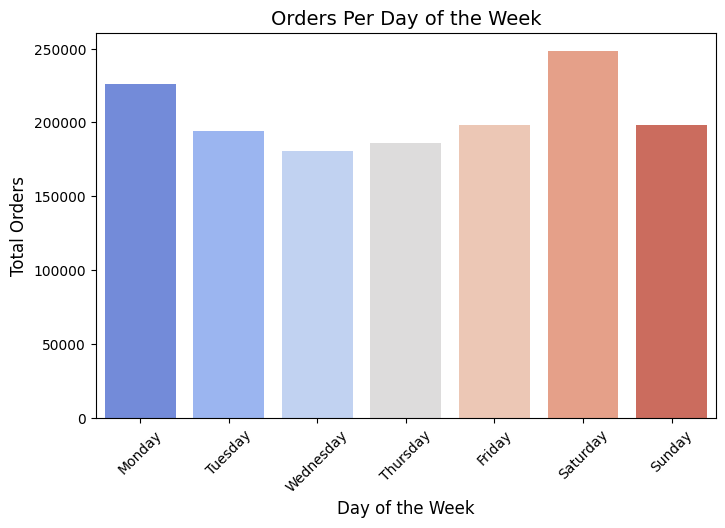

In [ ]:
#Weekly order trend
# Group by Day of the Week
daily_orders = customers_orders_filtered.groupby('Order Weekday')['order_id'].nunique().reset_index()

# Sort days in order
order_days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
daily_orders['Order Weekday'] = pd.Categorical(daily_orders['Order Weekday'], categories=order_days, ordered=True)
daily_orders = daily_orders.sort_values('Order Weekday')

# Plot Daily Order Trend
plt.figure(figsize=(8, 5))
sns.barplot(x=daily_orders['Order Weekday'], y=daily_orders['order_id'], palette="coolwarm")

# Customize the plot
plt.title("Orders Per Day of the Week", fontsize=14)
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Total Orders", fontsize=12)
plt.xticks(rotation=45)

# Show plot
plt.show()


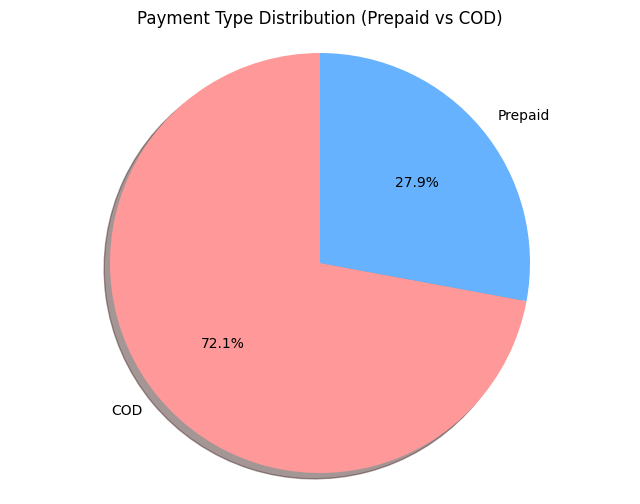

In [ ]:

# ✅ Count the number of orders per Payment Type
payment_counts = customers_orders_filtered['order_payment_type'].value_counts()

# ✅ Plot a Pie Chart for Prepaid vs COD
plt.figure(figsize=(8, 6))
plt.pie(payment_counts, labels=payment_counts.index, autopct='%1.1f%%', startangle=90, colors=['#FF9999','#66B2FF'], shadow=True)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Payment Type Distribution (Prepaid vs COD)')
plt.show()


In [ ]:
customers_orders_filtered.describe()

,Unnamed: 0,order_date,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,Year,Order Hour
count,1.435435e+06,1435435,1.431794e+06,1.435435e+06,1.435435e+06,1.435435e+06,1.435435e+06,1.435435e+06,1.435435e+06,1.435435e+06,1.435435e+06
mean,7.820728e+05,2024-01-19 22:30:15.616940032,2.469597e+03,1.019625e+00,1.022868e+00,1.190872e+00,5.764194e+00,4.209035e+03,5.509269e+00,2.023568e+03,1.405526e+01
min,0.000000e+00,2023-07-01 00:36:11,1.000000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.900000e+01,0.000000e+00,2.023000e+03,0.000000e+00
25%,4.098855e+05,2023-10-30 13:38:36,3.500000e+02,1.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,8.500000e+02,2.000000e+00,2.023000e+03,1.000000e+01
50%,7.874740e+05,2024-01-22 17:16:53,7.900000e+02,1.000000e+00,0.000000e+00,0.000000e+00,6.000000e+00,1.699000e+03,2.000000e+00,2.024000e+03,1.500000e+01
75%,1.159722e+06,2024-04-09 11:47:36.500000,1.999000e+03,1.000000e+00,0.000000e+00,0.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00,2.024000e+03,1.900000e+01
max,1.543996e+06,2024-06-29 23:59:22,2.269470e+05,5.000000e+01,1.470000e+02,1.720000e+02,1.006000e+03,2.999990e+05,1.000000e+03,2.024000e+03,2.300000e+01
std,4.409003e+05,NaN,5.579501e+03,2.395833e-01,2.456040e+00,2.859199e+00,2.997524e+00,8.616137e+03,5.289671e+01,4.953833e-01,6.236797e+00


In [ ]:
customers_orders_filtered.isna().sum()

,0
Unnamed: 0,0
fsn_id,0
order_date,0
order_id,0
order_item_id,0
gmv,3641
units,0
deliverybdays,0
deliverycdays,0
order_payment_type,0


In [ ]:
customers_orders_filtered = customers_orders_filtered.dropna(subset=['gmv'])

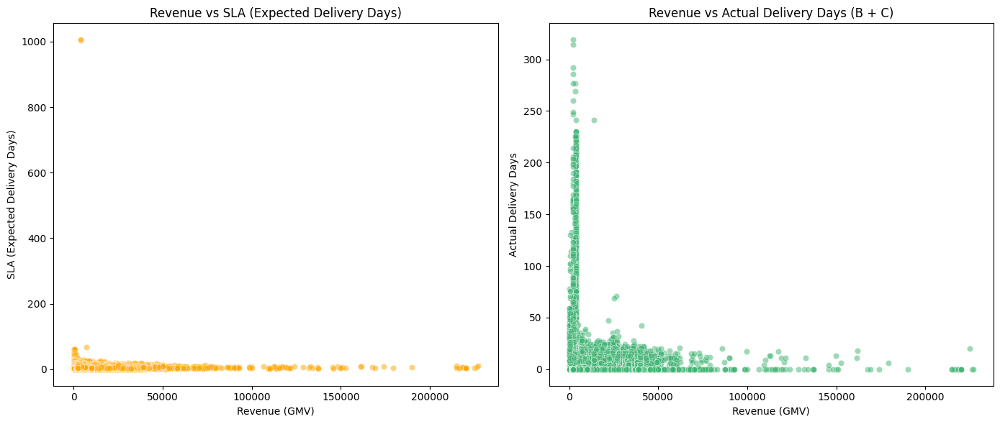

In [ ]:
# Plot 1: Revenue vs SLA
plt.figure(figsize=(14, 6))

# Revenue vs SLA
plt.subplot(1, 2, 1)
sns.scatterplot(x=customers_orders_filtered['gmv'], y=customers_orders_filtered['sla'], alpha=0.5, color='orange')
plt.title('Revenue vs SLA (Expected Delivery Days)')
plt.xlabel('Revenue (GMV)')
plt.ylabel('SLA (Expected Delivery Days)')

# Plot 2: Revenue vs Delivery Days (B + C Combined)
plt.subplot(1, 2, 2)
customers_orders_filtered['total_delivery_days'] = customers_orders_filtered['deliverybdays'] + customers_orders_filtered['deliverycdays']
sns.scatterplot(x=customers_orders_filtered['gmv'], y=customers_orders_filtered['total_delivery_days'], alpha=0.5, color='mediumseagreen')
plt.title('Revenue vs Actual Delivery Days (B + C)')
plt.xlabel('Revenue (GMV)')
plt.ylabel('Actual Delivery Days')

# Add Grid and Show
plt.tight_layout()
plt.show()

### Feature Engineering

In [ ]:
customers_orders_filtered['list_price'] = customers_orders_filtered['gmv'] * customers_orders_filtered['units']

In [ ]:
# Feature Engineering: Create Discount Percentage
customers_orders_filtered['discount_percentage'] = 100 * (customers_orders_filtered['product_mrp'] - customers_orders_filtered['list_price']) / customers_orders_filtered['product_mrp']

In [ ]:
customers_orders_filtered['discount_percentage'] = customers_orders_filtered['discount_percentage'].clip(lower=0)

In [ ]:
customers_orders_filtered.head()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,...,date,time,Order_Combo,Month,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage
0,0,ACCCX3S58G7B5F6P,2023-10-17 15:11:54,3419300926147000.0,3419300926147000.0,6400.0,1,0.0,0.0,COD,...,17-10-23,15:11:54,3419300926147000.0-3419300926147000.0,2023-10,2023,Tuesday,15,0.0,6400.0,10.987483
1,1,ACCCX3S58G7B5F6P,2023-10-19 10:07:22,1420830839915200.0,1420830839915200.0,6900.0,1,0.0,0.0,COD,...,19-10-23,10:07:22,1420830839915200.0-1420830839915200.0,2023-10,2023,Thursday,10,0.0,6900.0,4.033380
2,2,ACCCX3S5AHMF55FV,2023-10-20 15:45:56,2421912925714800.0,2421912925714800.0,1990.0,1,0.0,0.0,COD,...,20-10-23,15:45:56,2421912925714800.0-2421912925714800.0,2023-10,2023,Friday,15,0.0,1990.0,5.192949
3,3,ACCCX3S5AHMF55FV,2023-10-14 12:05:15,4416592101738400.0,4416592101738400.0,1690.0,1,0.0,0.0,Prepaid,...,14-10-23,12:05:15,4416592101738400.0-4416592101738400.0,2023-10,2023,Saturday,12,0.0,1690.0,19.485469
4,4,ACCCX3S5AHMF55FV,2023-10-17 21:25:03,4419525153426400.0,4419525153426400.0,1618.0,1,0.0,0.0,Prepaid,...,17-10-23,21:25:03,4419525153426400.0-4419525153426400.0,2023-10,2023,Tuesday,21,0.0,1618.0,22.915674


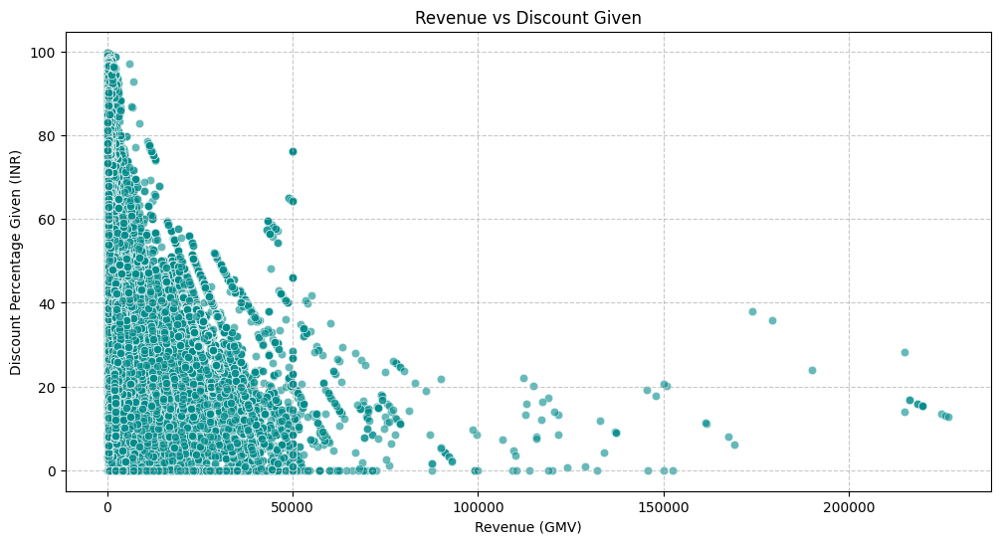

In [ ]:
#  Plot Scatter Plot for Revenue vs Discount
plt.figure(figsize=(12, 6))
sns.scatterplot(x=customers_orders_filtered['gmv'], y=customers_orders_filtered['discount_percentage'], alpha=0.6, color='darkcyan')

#  Set plot title and labels
plt.title('Revenue vs Discount Given')
plt.xlabel('Revenue (GMV)')
plt.ylabel('Discount Percentage Given (INR)')

#  Add grid for better visibility
plt.grid(True, linestyle='--', alpha=0.7)

#  Show the plot
plt.show()

In [ ]:
# Calculate 80th Percentile of GMV
gmv_80th_percentile = customers_orders_filtered['gmv'].quantile(0.8)

# Create Product Type Feature
customers_orders_filtered['product_type'] = customers_orders_filtered['gmv'].apply(lambda x: 'Luxury' if x > gmv_80th_percentile else 'Mass-market')

In [ ]:
#  Feature Engineering: Calculate Customer Purchase Frequency
customers_orders_filtered['purchase_frequency'] = customers_orders_filtered['cust_id'].map(customers_orders_filtered['cust_id'].value_counts())

In [ ]:
#  Feature Engineering: Calculate Average Order Value (AOV)
customers_orders_filtered['average_order_value'] = customers_orders_filtered['gmv'] / customers_orders_filtered['purchase_frequency']

In [ ]:
customers_orders_filtered["Month"] = customers_orders_filtered["order_date"].dt.month

In [ ]:
customers_orders_filtered.columns

Index(['Unnamed: 0', 'fsn_id', 'order_date', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price',
       'discount_percentage', 'product_type', 'purchase_frequency',
       'average_order_value'],
      dtype='object')

In [ ]:
df2 = customers_orders_filtered.copy()

In [ ]:
df2=df2.drop(columns=['order_date'])

In [ ]:
def calculate_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

columns_to_check = ['total_delivery_days', 'deliverybdays', 'deliverycdays']
for column in columns_to_check:
    outliers = calculate_outliers(df2, column)
    outlier_percentage = (len(outliers) / len(df2)) * 100
    print(f"Percentage of outliers in {column}: {outlier_percentage:.2f}%")


Percentage of outliers in total_delivery_days: 22.28%
Percentage of outliers in deliverybdays: 22.16%
Percentage of outliers in deliverycdays: 22.28%


In [ ]:
customers_orders_filtered.shape

(1431794, 28)

In [ ]:
customers_orders_filtered.to_csv("PreProcessed_13.03.2025.csv",index=False)

In [ ]:
preprocessed_data = customers_orders_filtered.copy()

### Analysis




In [ ]:
customers_orders_filtered.head()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,...,Month,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value
0,0,ACCCX3S58G7B5F6P,2023-10-17 15:11:54,3419300926147000.0,3419300926147000.0,6400.0,1,0.0,0.0,COD,...,10,2023,Tuesday,15,0.0,6400.0,10.987483,Luxury,1,6400.0
1,1,ACCCX3S58G7B5F6P,2023-10-19 10:07:22,1420830839915200.0,1420830839915200.0,6900.0,1,0.0,0.0,COD,...,10,2023,Thursday,10,0.0,6900.0,4.033380,Luxury,2,3450.0
2,2,ACCCX3S5AHMF55FV,2023-10-20 15:45:56,2421912925714800.0,2421912925714800.0,1990.0,1,0.0,0.0,COD,...,10,2023,Friday,15,0.0,1990.0,5.192949,Mass-market,1,1990.0
3,3,ACCCX3S5AHMF55FV,2023-10-14 12:05:15,4416592101738400.0,4416592101738400.0,1690.0,1,0.0,0.0,Prepaid,...,10,2023,Saturday,12,0.0,1690.0,19.485469,Mass-market,1,1690.0
4,4,ACCCX3S5AHMF55FV,2023-10-17 21:25:03,4419525153426400.0,4419525153426400.0,1618.0,1,0.0,0.0,Prepaid,...,10,2023,Tuesday,21,0.0,1618.0,22.915674,Mass-market,2,809.0


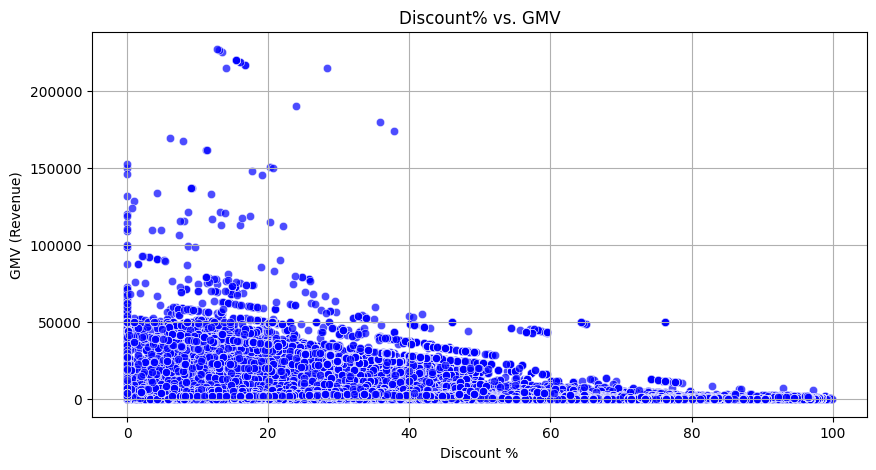

In [ ]:
# Discount% vs gmv
# Convert 'Discount%' to numeric (handle errors)
customers_orders_filtered['discount_percentage'] = pd.to_numeric(customers_orders_filtered['discount_percentage'], errors='coerce')

# Convert 'GMV' and 'Units Sold' to numeric
customers_orders_filtered['gmv'] = pd.to_numeric(customers_orders_filtered['gmv'], errors='coerce')
customers_orders_filtered['units'] = pd.to_numeric(customers_orders_filtered['units'], errors='coerce')

# Scatter Plot: Discount% vs. GMV
plt.figure(figsize=(10, 5))
sns.scatterplot(x=customers_orders_filtered['discount_percentage'], y=customers_orders_filtered['gmv'], alpha=0.7, color='b')
plt.xlabel("Discount %")
plt.ylabel("GMV (Revenue)")
plt.title("Discount% vs. GMV")
plt.grid()
plt.show()

Insight: Does higher discount increase revenue?

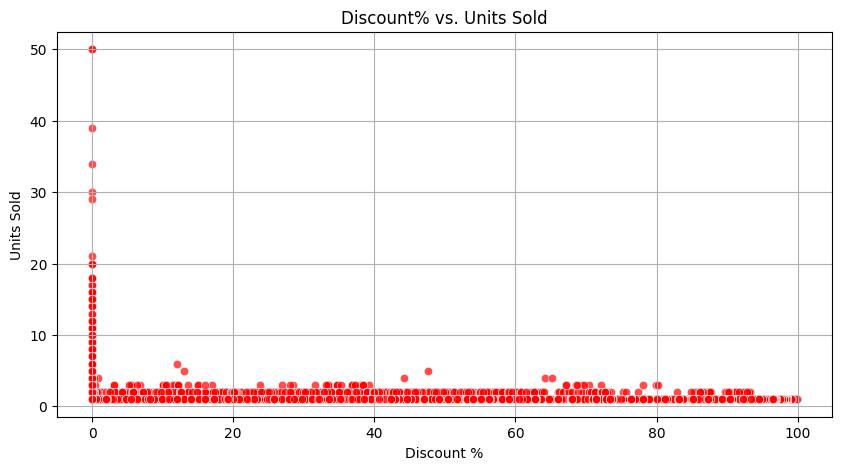

In [ ]:
# discount% vs unit
plt.figure(figsize=(10, 5))
sns.scatterplot(x=customers_orders_filtered['discount_percentage'], y=customers_orders_filtered['units'], alpha=0.7, color='r')
plt.xlabel("Discount %")
plt.ylabel("Units Sold")
plt.title("Discount% vs. Units Sold")
plt.grid()
plt.show()

Insight: Does higher discount increase units sold?

In [ ]:
# correlation coefficient between Discount% and GMV.

correlation = customers_orders_filtered[['discount_percentage', 'gmv']].corr().iloc[0, 1]
print(f"Correlation between Discount% and GMV: {correlation:.2f}")

Correlation between Discount% and GMV: -0.21


Negative coefficient indicates that lower discount increases gmv

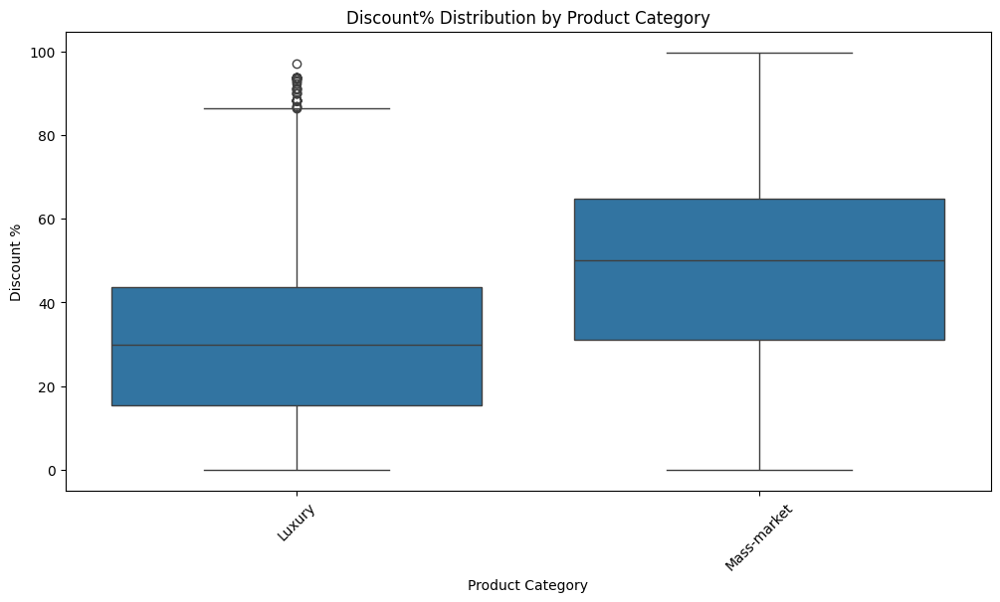

In [ ]:
# Segmenting the data by product category
# Check if 'Product Category' column exists
if 'product_type' in customers_orders_filtered.columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=customers_orders_filtered['product_type'], y=customers_orders_filtered['discount_percentage'])
    plt.xticks(rotation=45)
    plt.title("Discount% Distribution by Product Category")
    plt.xlabel("Product Category")
    plt.ylabel("Discount %")
    plt.show()

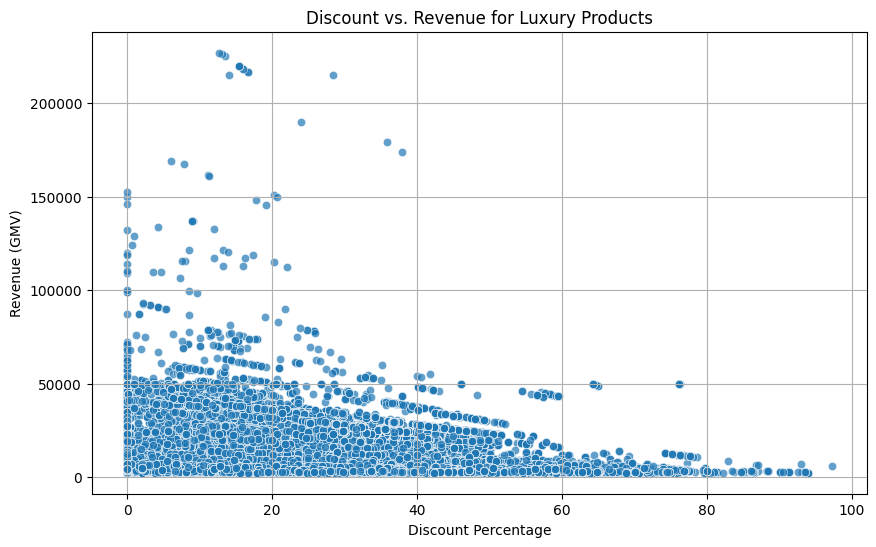

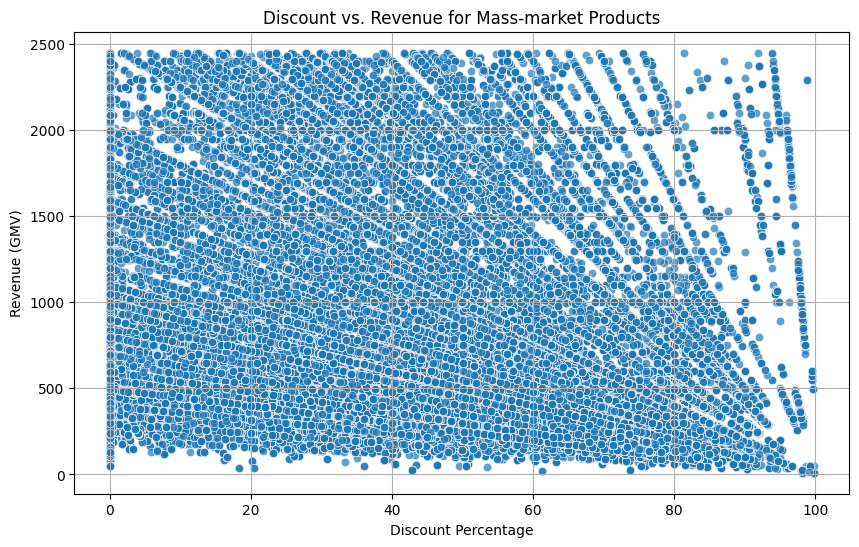

In [ ]:
# Group data by product type
product_types = customers_orders_filtered['product_type'].unique()

for product_type in product_types:
    subset = customers_orders_filtered[customers_orders_filtered['product_type'] == product_type]
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='discount_percentage', y='gmv', data=subset, alpha=0.7)
    plt.title(f'Discount vs. Revenue for {product_type} Products')
    plt.xlabel('Discount Percentage')
    plt.ylabel('Revenue (GMV)')
    plt.grid(True)
    plt.show()


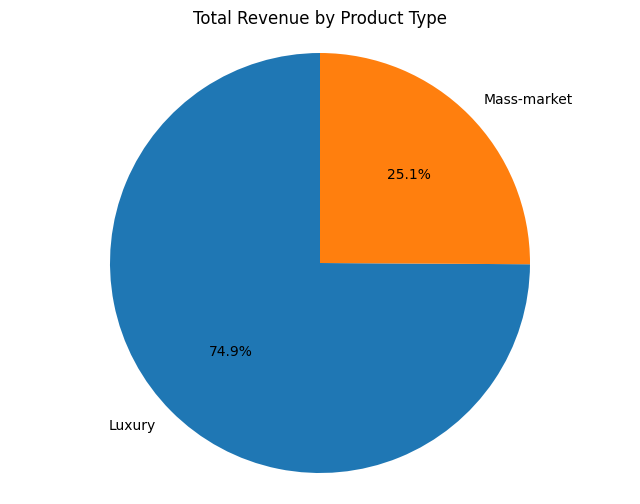

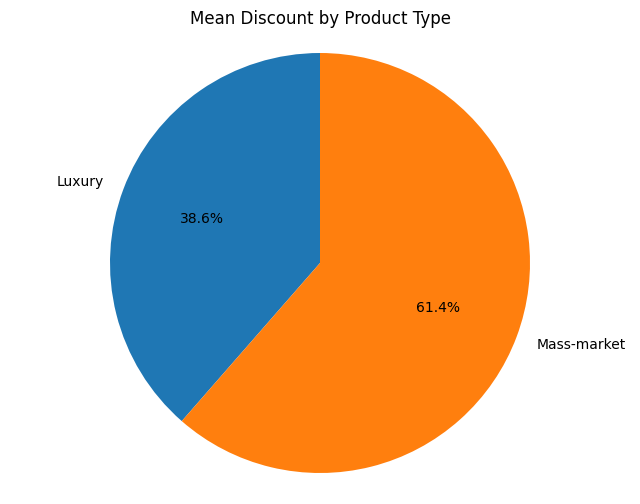

In [ ]:
#  Group data by product type and calculate total revenue
revenue_by_product = customers_orders_filtered.groupby('product_type')['gmv'].sum()

# Create the total revenue pie chart
plt.figure(figsize=(8, 6))
plt.pie(revenue_by_product, labels=revenue_by_product.index, autopct='%1.1f%%', startangle=90)
plt.title('Total Revenue by Product Type')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

# Group data by product type and calculate total discount amount
discount_by_product = customers_orders_filtered.groupby('product_type')['discount_percentage'].mean()

# Create the total discount pie chart
plt.figure(figsize=(8, 6))
plt.pie(discount_by_product, labels=discount_by_product.index, autopct='%1.1f%%', startangle=90)
plt.title('Mean Discount by Product Type')
plt.axis('equal')
plt.show()


Optimal Discount Level

<ipython-input-146-043512fe9fa5>:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  discount_analysis = customers_orders_filtered.groupby('Discount Tier')['gmv'].mean().reset_index()
<ipython-input-146-043512fe9fa5>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=discount_analysis['Discount Tier'], y=discount_analysis['gmv'], palette="coolwarm")


Optimal Discount Tier: 15-20%, Peak Revenue: 4482.06099090874


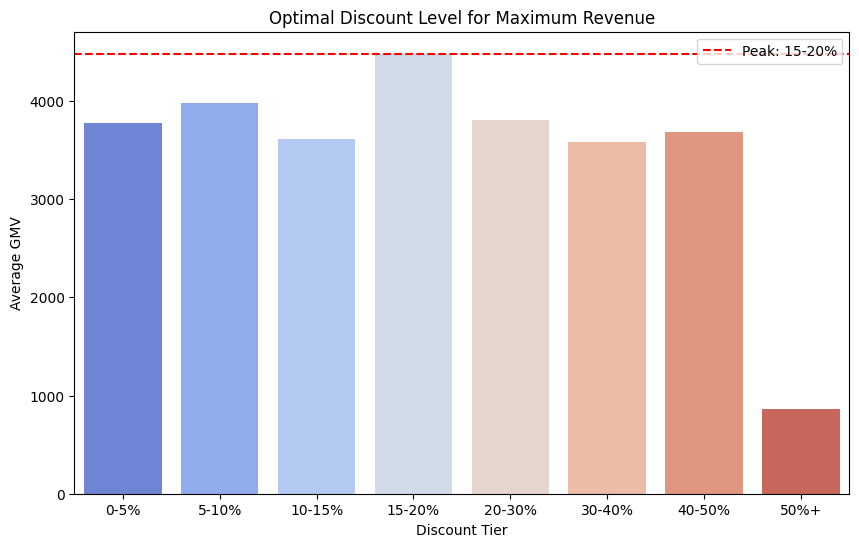

In [ ]:
# Convert 'Discount%' and 'GMV' to numeric (handle errors)
customers_orders_filtered['discount_percentage'] = pd.to_numeric(customers_orders_filtered['discount_percentage'], errors='coerce')
customers_orders_filtered['gmv'] = pd.to_numeric(customers_orders_filtered['gmv'], errors='coerce')

# Create discount bins (tiers)
bins = [0, 5, 10, 15, 20, 30, 40, 50, 100]  # Define discount ranges
labels = ["0-5%", "5-10%", "10-15%", "15-20%", "20-30%", "30-40%", "40-50%", "50%+"]

customers_orders_filtered['Discount Tier'] = pd.cut(customers_orders_filtered['discount_percentage'], bins=bins, labels=labels)

# Group by discount tier and calculate average GMV
discount_analysis = customers_orders_filtered.groupby('Discount Tier')['gmv'].mean().reset_index()

# Find the discount tier where GMV peaks
optimal_discount = discount_analysis.loc[discount_analysis['gmv'].idxmax()]
print(f"Optimal Discount Tier: {optimal_discount['Discount Tier']}, Peak Revenue: {optimal_discount['gmv']}")

# Plot Discount% vs GMV to visualize the peak
plt.figure(figsize=(10, 6))
sns.barplot(x=discount_analysis['Discount Tier'], y=discount_analysis['gmv'], palette="coolwarm")

# Annotate peak discount level
plt.axhline(y=optimal_discount['gmv'], color='r', linestyle="--", label=f"Peak: {optimal_discount['Discount Tier']}")

# Customize plot
plt.xlabel("Discount Tier")
plt.ylabel("Average GMV")
plt.title("Optimal Discount Level for Maximum Revenue")
plt.legend()
plt.show()

In [ ]:
# prompt: perform regression analysis with gmv as dependent variable and discount_percentage as independent variable

import statsmodels.api as sm

# Assuming 'customers_orders_filtered' DataFrame is already loaded and processed

# Prepare the data for regression
X = customers_orders_filtered['discount_percentage']
y = customers_orders_filtered['gmv']

# Add a constant to the independent variable (required for statsmodels)
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the model summary
print(model.summary())

# You can access specific statistics from the model:
# R-squared: model.rsquared
# Coefficients: model.params
# P-values: model.pvalues


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                  0.045
Method:                 Least Squares   F-statistic:                 6.813e+04
Date:                Thu, 20 Mar 2025   Prob (F-statistic):               0.00
Time:                        20:21:14   Log-Likelihood:            -1.4350e+07
No. Observations:             1431794   AIC:                         2.870e+07
Df Residuals:                 1431792   BIC:                         2.870e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                4726.4604    

<ipython-input-148-44b65d9e3b93>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  discount_tier_analysis = customers_orders_filtered.groupby('Discount Tier')['gmv'].mean().reset_index()
<ipython-input-148-44b65d9e3b93>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=discount_tier_analysis['Discount Tier'], y=discount_tier_analysis['gmv'], palette="coolwarm")


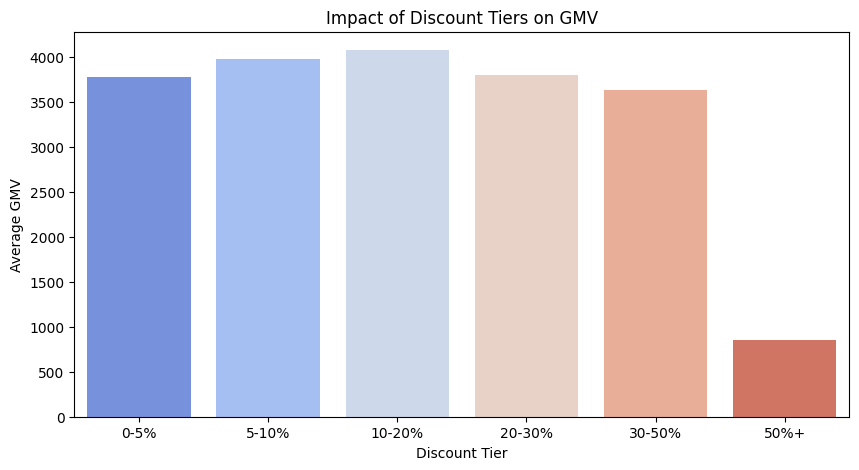

In [ ]:
# Examine the impact of discount tiers on GMV.
# Create discount tiers
bins = [0, 5, 10, 20, 30, 50, 100]
labels = ["0-5%", "5-10%", "10-20%", "20-30%", "30-50%", "50%+"]
customers_orders_filtered['Discount Tier'] = pd.cut(customers_orders_filtered['discount_percentage'], bins=bins, labels=labels)

# Group by discount tiers and calculate average GMV
discount_tier_analysis = customers_orders_filtered.groupby('Discount Tier')['gmv'].mean().reset_index()

# Bar Plot: Discount Tier vs. GMV
plt.figure(figsize=(10, 5))
sns.barplot(x=discount_tier_analysis['Discount Tier'], y=discount_tier_analysis['gmv'], palette="coolwarm")
plt.xlabel("Discount Tier")
plt.ylabel("Average GMV")
plt.title("Impact of Discount Tiers on GMV")
plt.show()

Insight: Does higher discount always result in higher revenue?

<ipython-input-149-ac77a7526f8e>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=customers_orders_filtered['Discount Tier'], y=customers_orders_filtered['gmv'], palette="coolwarm")


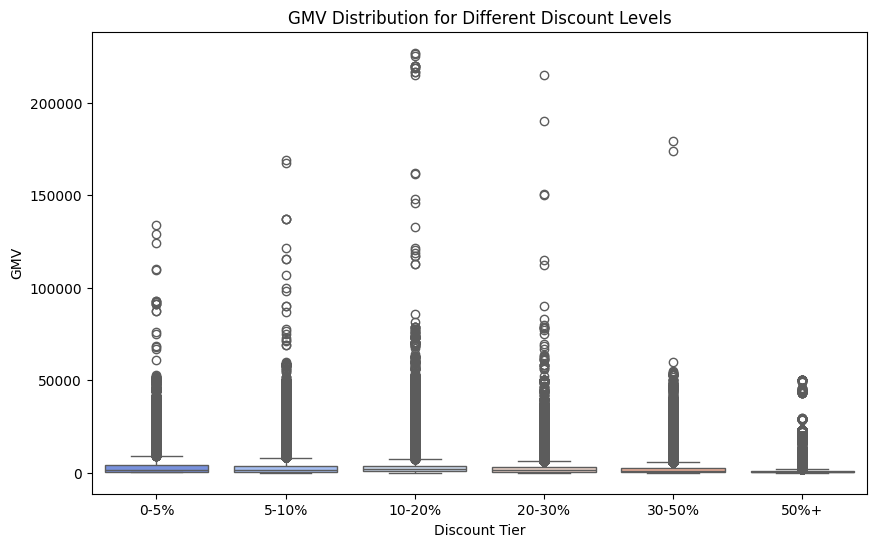

In [ ]:
# Boxplot: GMV Distribution for Different Discount Levels
plt.figure(figsize=(10, 6))
sns.boxplot(x=customers_orders_filtered['Discount Tier'], y=customers_orders_filtered['gmv'], palette="coolwarm")
plt.xlabel("Discount Tier")
plt.ylabel("GMV")
plt.title("GMV Distribution for Different Discount Levels")
plt.show()

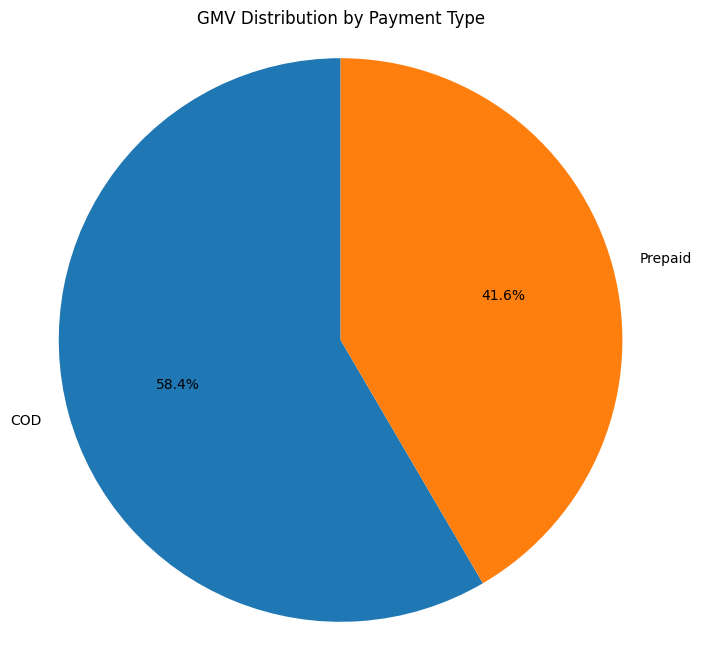

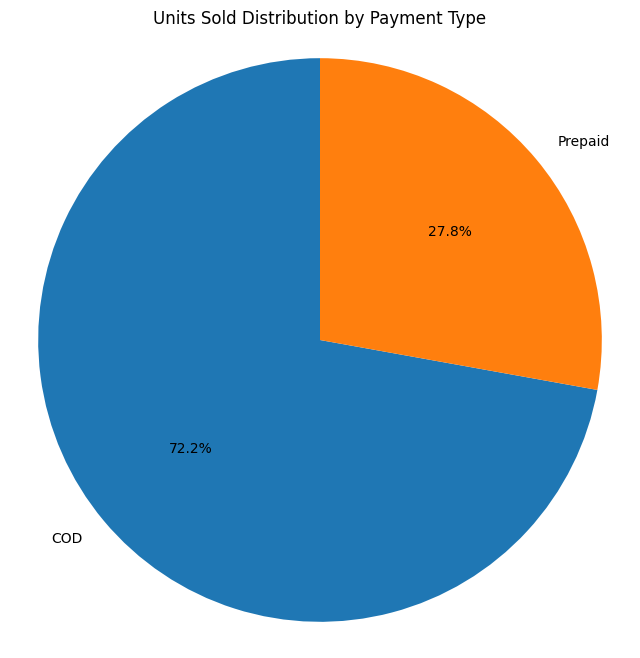

In [ ]:
gmv_units = customers_orders_filtered.groupby("order_payment_type").agg(
    Total_GMV=("gmv", "sum"),
    Total_Units_Sold=("units", "sum")
).reset_index()

# Create a pie chart for GMV distribution by payment type
plt.figure(figsize=(8, 8))  # Adjust figure size as needed
plt.pie(gmv_units['Total_GMV'], labels=gmv_units['order_payment_type'], autopct='%1.1f%%', startangle=90)
plt.title('GMV Distribution by Payment Type')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

# Create a pie chart for Units Sold distribution by payment type
plt.figure(figsize=(8, 8))  # Adjust figure size as needed
plt.pie(gmv_units['Total_Units_Sold'], labels=gmv_units['order_payment_type'], autopct='%1.1f%%', startangle=90)
plt.title('Units Sold Distribution by Payment Type')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


In [ ]:
avg_gmv = customers_orders_filtered.groupby("order_payment_type")["gmv"].mean()
print("\nAverage GMV per Order:")
print(avg_gmv)

# Extract GMV values for each payment type
prepaid_gmv = customers_orders_filtered[customers_orders_filtered["order_payment_type"] == "Prepaid"]["gmv"]
cod_gmv = customers_orders_filtered[customers_orders_filtered["order_payment_type"] == "Cash on Delivery"]["gmv"]
from scipy.stats import ttest_ind
# Perform T-test (Welch's t-test assuming unequal variance)
t_stat, p_value = ttest_ind(prepaid_gmv, cod_gmv, equal_var=False)

# Print T-test results
print(f"\nT-Test Results: t-statistic = {t_stat:.4f}, p-value = {p_value:.4f}")

# Interpretation of p-value
if p_value < 0.05:
    print("Significant difference in average GMV between payment types (p < 0.05).")
else:
    print("No significant difference in average GMV between payment types (p >= 0.05).")


Average GMV per Order:
order_payment_type
COD        1996.236064
Prepaid    3703.804230
Name: gmv, dtype: float64

T-Test Results: t-statistic = nan, p-value = nan
No significant difference in average GMV between payment types (p >= 0.05).


<ipython-input-151-4d7098f23956>:10: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  t_stat, p_value = ttest_ind(prepaid_gmv, cod_gmv, equal_var=False)



High-Frequency vs. Low-Frequency Buyer Distribution:
Frequency_Segment
High-Frequency    1148889
Name: count, dtype: int64


<ipython-input-152-14a9f59b9f12>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="Frequency_Segment", data=customer_orders, palette="coolwarm")


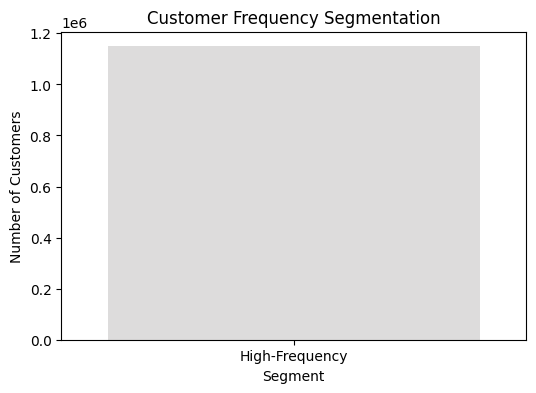

In [ ]:
customer_orders = customers_orders_filtered.groupby("cust_id")["order_id"].nunique().reset_index()
customer_orders.columns = ["cust_id", "Order_Count"]

# Define threshold for high-frequency buyers (Top 25% in order count)
threshold = customer_orders["Order_Count"].quantile(0.75)

# Label customers as 'High-Frequency' or 'Low-Frequency'
customer_orders["Frequency_Segment"] = customer_orders["Order_Count"].apply(
    lambda x: "High-Frequency" if x >= threshold else "Low-Frequency"
)

print("\nHigh-Frequency vs. Low-Frequency Buyer Distribution:")
print(customer_orders["Frequency_Segment"].value_counts())

# Plot Distribution of Frequency Segments
plt.figure(figsize=(6, 4))
sns.countplot(x="Frequency_Segment", data=customer_orders, palette="coolwarm")
plt.title("Customer Frequency Segmentation")
plt.xlabel("Segment")
plt.ylabel("Number of Customers")
plt.show()


Luxury vs. Mass-Market Buyer Distribution:
Market_Segment
Mass-Market    861446
Luxury         287443
Name: count, dtype: int64


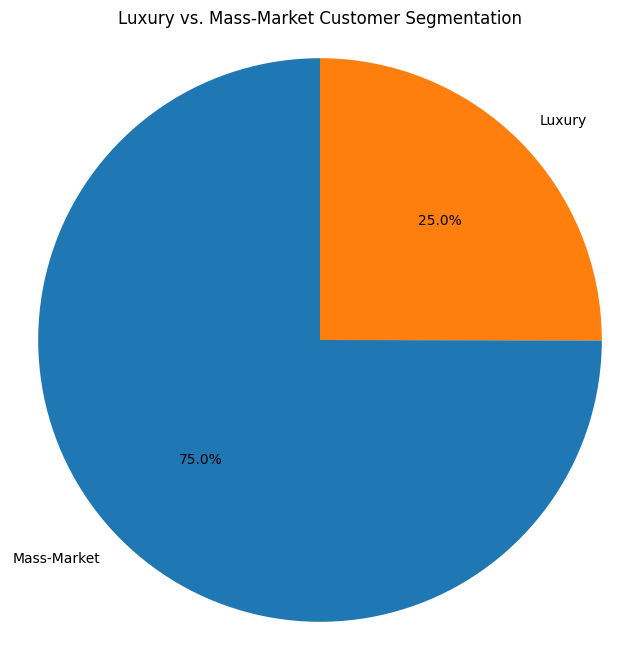

In [ ]:
# Calculate average GMV per order per customer
customer_gmv = customers_orders_filtered.groupby("cust_id")["gmv"].mean().reset_index()  # Changed 'GMV' to 'gmv'
customer_gmv.columns = ["cust_id", "Avg_GMV_per_Order"]
# Define threshold for Luxury buyers (Top 25% in avg GMV per order)
luxury_threshold = customer_gmv["Avg_GMV_per_Order"].quantile(0.75)
# Label customers as 'Luxury' or 'Mass-Market' buyers
customer_gmv["Market_Segment"] = customer_gmv["Avg_GMV_per_Order"].apply(
    lambda x: "Luxury" if x >= luxury_threshold else "Mass-Market"
)
print("\nLuxury vs. Mass-Market Buyer Distribution:")
print(customer_gmv["Market_Segment"].value_counts())
segment_counts = customer_gmv["Market_Segment"].value_counts()

# Create the pie chart
plt.figure(figsize=(8, 8))  # Adjust figure size as needed
plt.pie(segment_counts, labels=segment_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Luxury vs. Mass-Market Customer Segmentation')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()



Prepaid vs. COD Customer Distribution:
Preferred_Payment_Type
Cash on Delivery    803388
Prepaid             345501
Name: count, dtype: int64


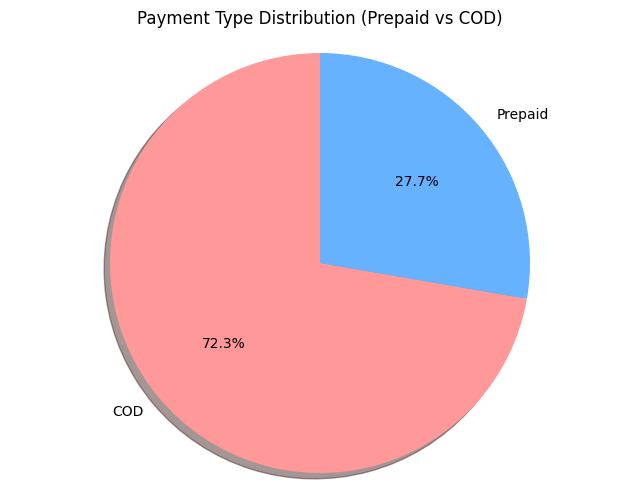

In [ ]:
# # Count how many times each customer used each payment type
customer_payment = customers_orders_filtered.groupby(["cust_id", "order_payment_type"])["gmv"].sum().unstack().fillna(0) # Changed 'Customer_ID' to 'cust_id', 'Order_Payment_Type' to 'order_payment_type', 'GMV' to 'gmv'
# Determine Dominant Payment Type
customer_payment["Preferred_Payment_Type"] = customer_payment.apply(
    lambda x: "Prepaid" if x.get("Prepaid", 0) > x.get("Cash on Delivery", 0) else "Cash on Delivery", axis=1
)
print("\nPrepaid vs. COD Customer Distribution:")
print(customer_payment["Preferred_Payment_Type"].value_counts())

# Count the number of orders per Payment Type
payment_counts = customers_orders_filtered['order_payment_type'].value_counts()

# Plot a Pie Chart for Prepaid vs COD
plt.figure(figsize=(8, 6))
plt.pie(payment_counts, labels=payment_counts.index, autopct='%1.1f%%', startangle=90, colors=['#FF9999','#66B2FF'], shadow=True)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Payment Type Distribution (Prepaid vs COD)')
plt.show()


In [ ]:
# prompt: add order date coloumn in customer miltered data

import pandas as pd
# Assuming 'customers_orders_filtered' DataFrame is already loaded and processed
# Convert 'order_date' column to datetime if it's not already
if not pd.api.types.is_datetime64_any_dtype(customers_orders_filtered['order_date']):
  customers_orders_filtered['order_date'] = pd.to_datetime(customers_orders_filtered['order_date'])

# Add a new column 'Order Date' with the order date
customers_orders_filtered['Order Date'] = customers_orders_filtered['order_date'].dt.date

# Now, customers_orders_filtered DataFrame will have a 'Order Date' column


In [ ]:
preprocessed_data.columns

Index(['Unnamed: 0', 'fsn_id', 'order_date', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price',
       'discount_percentage', 'product_type', 'purchase_frequency',
       'average_order_value'],
      dtype='object')


Customer Repeat Purchase Rate: 16.09%

Factors Influencing Customer Churn:
                 gmv     units
Churned                       
False    2492.198690  1.019203
True     2432.016642  1.020297


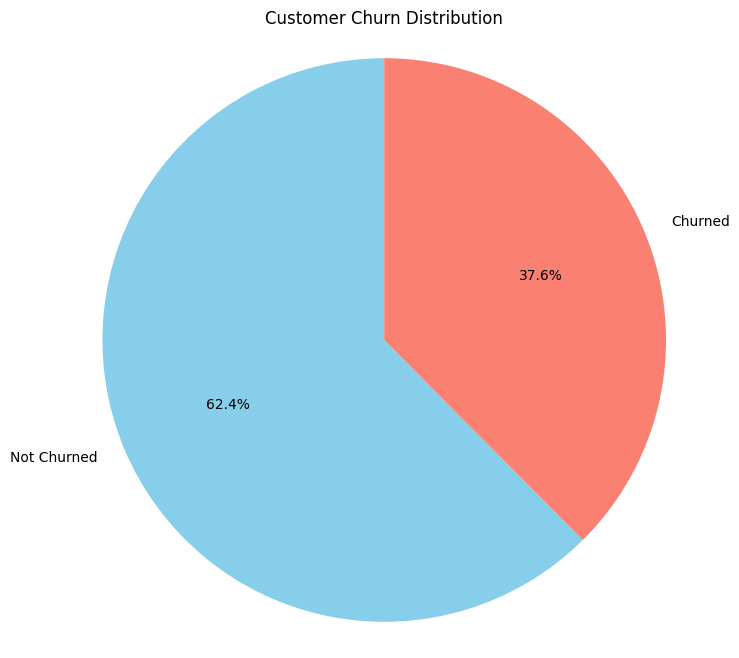

In [ ]:
# prompt: # 1️⃣ Customer Repeat Purchase Rate ###
# # Count number of unique orders per customer
customer_orders = customers_orders_filtered.groupby("cust_id")["order_id"].nunique().reset_index()  # Changed column names
repeat_rate = customer_orders[customer_orders["order_id"] > 1].shape[0] / customer_orders.shape[0]  # Changed column name
print(f"\nCustomer Repeat Purchase Rate: {repeat_rate:.2%}")
# ### 2️⃣ Identifying Factors Influencing Customer Churn ###
# # Define churned customers as those with only 1 order
customers_orders_filtered["Last_Purchase_Date"] = pd.to_datetime(customers_orders_filtered["order_date"])  # Changed column name
last_purchase = customers_orders_filtered.groupby("cust_id")["Last_Purchase_Date"].max().reset_index()  # Changed column name
# Define churn threshold (e.g., no purchase in last 6 months)
churn_threshold = customers_orders_filtered["Last_Purchase_Date"].max() - pd.DateOffset(months=6)
last_purchase["Churned"] = last_purchase["Last_Purchase_Date"] < churn_threshold
# Merge churn data with customer attributes
df = customers_orders_filtered.merge(last_purchase[["cust_id", "Churned"]], on="cust_id", how="left")  # Changed column name
# Compare churned vs. retained customers
churn_factors = df.groupby("Churned")[["gmv", "units"]].mean()  # Changed column names
print("\nFactors Influencing Customer Churn:")
print(churn_factors)

# Group data by customer churn status
churn_counts = df["Churned"].value_counts()

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(churn_counts, labels=["Not Churned", "Churned"], autopct='%1.1f%%', startangle=90, colors=['skyblue', 'salmon'])
plt.title('Customer Churn Distribution')
plt.axis('equal')
plt.show()



High-Value vs. Low-Value Customer Distribution:
Value_Segment
Low-Value     861192
High-Value    287697
Name: count, dtype: int64


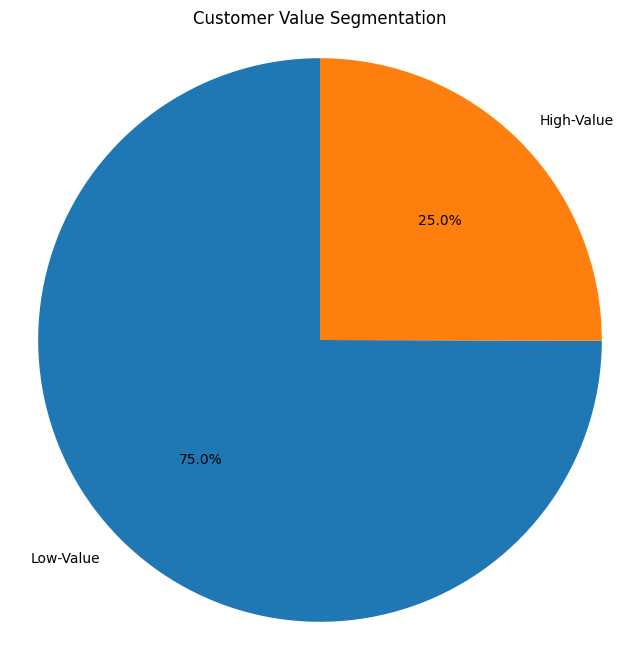

In [ ]:
df["AOV"] = df["gmv"] / df["units"]  # Changed column names
# Group customers by their AOV and frequency
customer_value = df.groupby("cust_id").agg(
    Total_Orders=("order_id", "nunique"),  # Changed column names
    AOV=("AOV", "mean"),
    Total_GMV=("gmv", "sum")  # Changed column name
).reset_index()
# Define thresholds for high-value customers (top 25% in both AOV & frequency)
aov_threshold = customer_value["AOV"].quantile(0.75)
frequency_threshold = customer_value["Total_Orders"].quantile(0.75)
# Label customers as 'High-Value' or 'Low-Value'
customer_value["Value_Segment"] = customer_value.apply(
    lambda x: "High-Value" if x["AOV"] >= aov_threshold and x["Total_Orders"] >= frequency_threshold else "Low-Value",
    axis=1
)
print("\nHigh-Value vs. Low-Value Customer Distribution:")
print(customer_value["Value_Segment"].value_counts())
# Value Segmentation Pie Chart
segment_counts = customer_value["Value_Segment"].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(segment_counts, labels=segment_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Customer Value Segmentation')
plt.axis('equal')
plt.show()


In [ ]:
if 'total_delivery_time' not in customers_orders_filtered.columns:
    customers_orders_filtered['total_delivery_time'] = customers_orders_filtered['deliverybdays'] + customers_orders_filtered['deliverycdays']

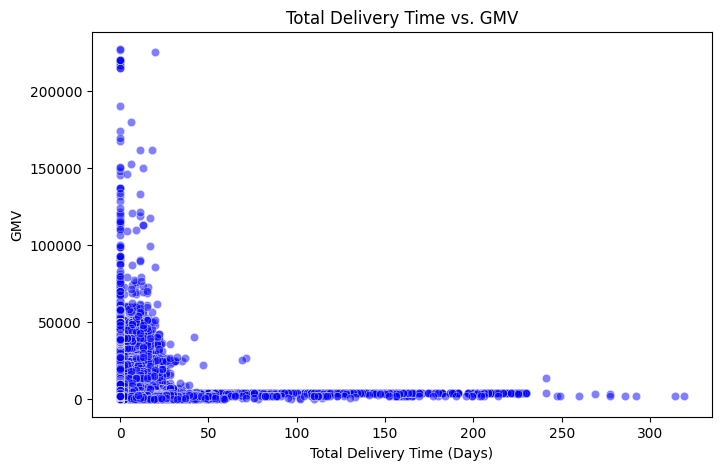


Correlation between Total Delivery Time and GMV: -0.03 (p-value: 0.00000)

Average GMV by Delivery Type:
Delivery_Type
Long     2384.285097
Short    2494.048269
Name: gmv, dtype: float64


<ipython-input-160-4ca7c84d6aaf>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Delivery_Type", y="gmv", data=customers_orders_filtered, palette="coolwarm")  # Changed 'GMV' to 'gmv'


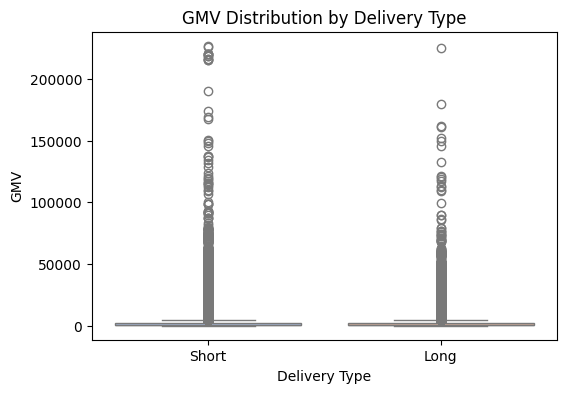

In [ ]:
from scipy.stats import pearsonr

## 1️⃣ Relationship Between Total Delivery Time & GMV ###
# Convert delivery time to numeric if needed
customers_orders_filtered["total_delivery_time"] = pd.to_numeric(customers_orders_filtered["total_delivery_time"], errors="coerce")

# Scatter plot of Delivery Time vs. GMV
plt.figure(figsize=(8, 5))
sns.scatterplot(data=customers_orders_filtered, x="total_delivery_time", y="gmv", alpha=0.5, color="blue")
plt.title("Total Delivery Time vs. GMV")
plt.xlabel("Total Delivery Time (Days)")
plt.ylabel("GMV")
plt.show()

# Compute Pearson correlation
corr, p_value = pearsonr(customers_orders_filtered["total_delivery_time"].dropna(), customers_orders_filtered["gmv"].dropna())  # Changed 'GMV' to 'gmv'
print(f"\nCorrelation between Total Delivery Time and GMV: {corr:.2f} (p-value: {p_value:.5f})")

### 2️⃣ Impact of Longer Delivery Times on Revenue ###
# Define short vs. long delivery categories
threshold = customers_orders_filtered["total_delivery_time"].median()
customers_orders_filtered["Delivery_Type"] = customers_orders_filtered["total_delivery_time"].apply(lambda x: "Short" if x <= threshold else "Long")

# Compare Average GMV between Short and Long Delivery Types
gmv_comparison = customers_orders_filtered.groupby("Delivery_Type")["gmv"].mean()  # Changed 'GMV' to 'gmv'
print("\nAverage GMV by Delivery Type:")
print(gmv_comparison)

# Boxplot for GMV distribution across delivery types
plt.figure(figsize=(6, 4))
sns.boxplot(x="Delivery_Type", y="gmv", data=customers_orders_filtered, palette="coolwarm")  # Changed 'GMV' to 'gmv'
plt.title("GMV Distribution by Delivery Type")
plt.xlabel("Delivery Type")
plt.ylabel("GMV")
plt.show()

#### Revenue

In [ ]:
# ✅ Convert order date to datetime format
customers_orders_filtered['order_date'] = pd.to_datetime(customers_orders_filtered['order_date'])

# ✅ Extract Year-Month for Monthly Revenue
customers_orders_filtered['year_month'] = customers_orders_filtered['order_date'].dt.to_period('M')

# ✅ Define Canada Holidays List
canada_holidays = {
    '2023-07-01': 'Canada Day',
    '2023-08-03': 'Civic Holiday',
    '2023-09-07': 'Labour Day',
    '2023-10-12': 'Thanksgiving',
    '2023-10-31': 'Halloween',
    '2023-11-11': 'Remembrance Day',
    '2023-12-25': 'Christmas Day',
    '2023-12-26': 'Boxing Day',
    '2024-01-01': "New Year's Day",
    '2024-02-14': "Valentine's Day",
    '2024-02-15': "Islander Day",
    '2024-02-15': "Louis Riel Day",
    '2024-02-15': "Heritage Day",
    '2024-02-15': "Family Day",
    '2024-02-29': "Leap Day",
    '2024-03-17': "St. Patrick's Day",
    '2024-03-25': "Good Friday",
    '2024-03-28': "Easter Monday",
    '2024-05-08': "Mother's Day",
    '2024-05-23': "Victoria Day",
    '2024-06-19': "Father's Day",
    '2024-06-21': "Aboriginal Day",
    '2024-06-24': "St. Jean Baptiste Day"
}


In [ ]:
# Map holidays based on order date
customers_orders_filtered['holiday_name'] = customers_orders_filtered['order_date'].dt.date.astype(str).map(canada_holidays)

In [ ]:
# Calculate Monthly Revenue
monthly_revenue = customers_orders_filtered.groupby('year_month')['gmv'].sum().reset_index()
monthly_revenue.columns = ['year_month', 'monthly_revenue']

# Calculate Revenue During Holidays
holiday_revenue = customers_orders_filtered[customers_orders_filtered['holiday_name'].notna()].groupby('holiday_name')['gmv'].sum().reset_index()
holiday_revenue.columns = ['holiday_name', 'holiday_revenue']


In [ ]:
# Print All Revenues Individually
print("\n--- Monthly Revenue ---")
print(monthly_revenue)

print("\n  --- Holiday Revenue --- ")
print(holiday_revenue)

print("\n  --- Total Revenue During Holidays --- ")
print("Total Holiday Revenue: ₹", holiday_revenue['holiday_revenue'].sum())

print("\n  --- Total Revenue Overall --- ")
print("Total Revenue: ₹", customers_orders_filtered['gmv'].sum())


--- Monthly Revenue ---
   year_month  monthly_revenue
0     2023-07     1.609970e+08
1     2023-08     2.066050e+05
2     2023-09     1.884747e+08
3     2023-10     4.714783e+08
4     2023-11     3.026965e+08
5     2023-12     3.966766e+08
6     2024-01     3.580672e+08
7     2024-02     3.067742e+08
8     2024-03     3.785997e+08
9     2024-04     3.157730e+08
10    2024-05     3.825398e+08
11    2024-06     2.736713e+08

  --- Holiday Revenue --- 
             holiday_name  holiday_revenue
0          Aboriginal Day     8.896390e+06
1              Boxing Day     9.422604e+06
2              Canada Day     2.074700e+04
3           Christmas Day     9.083698e+06
4           Civic Holiday     2.728000e+03
5           Easter Monday     1.057782e+07
6              Family Day     8.691114e+06
7            Father's Day     9.107609e+06
8             Good Friday     8.689820e+06
9               Halloween     7.083673e+06
10             Labour Day     6.400064e+06
11               Leap Day   

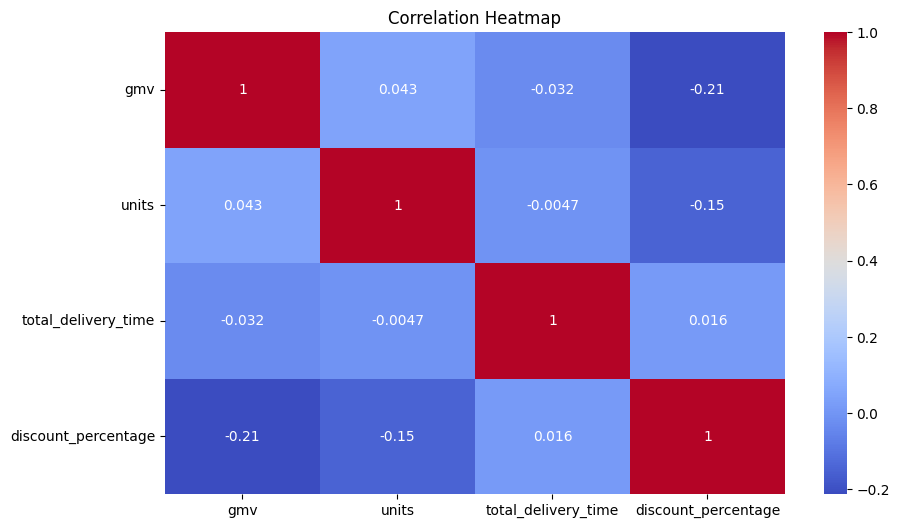

In [ ]:
# ✅ Correlation Heatmap
plt.figure(figsize=(10, 6))
corr = customers_orders_filtered[['gmv', 'units', 'total_delivery_time', 'discount_percentage']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

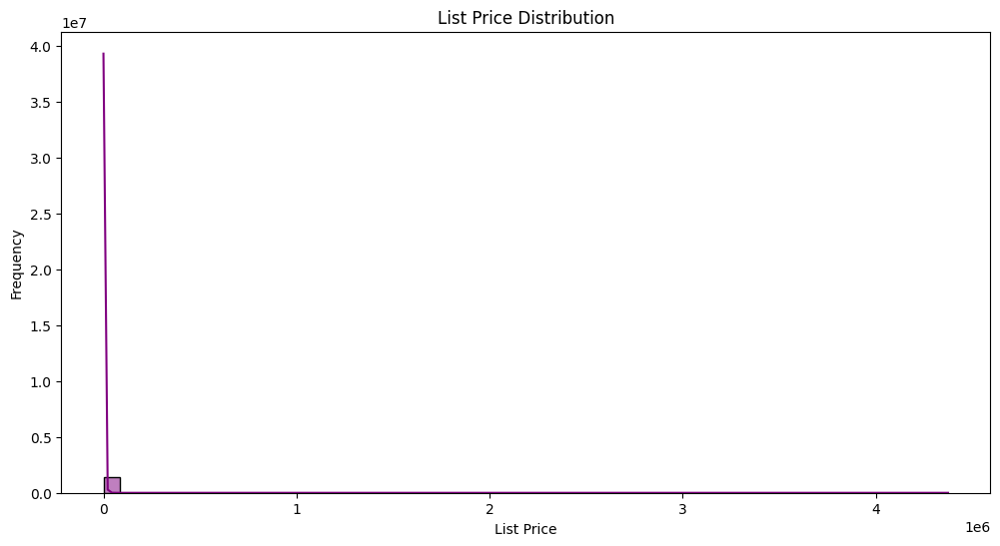

In [ ]:
# ✅ Visualize List Price Distribution
plt.figure(figsize=(12, 6))
sns.histplot(customers_orders_filtered['list_price'], bins=50, kde=True, color='purple')
plt.title('List Price Distribution')
plt.xlabel('List Price')
plt.ylabel('Frequency')
plt.show()

In [ ]:
df_struc = pd.read_csv("Sales_Calendar_NoMonth.csv")
df_struc

,Year,Start Date,End Date
0,2023,18-07-2023,19-07-2023
1,2023,15-08-2023,17-08-2023
2,2023,28-08-2023,30-08-2023
3,2023,15-10-2023,17-10-2023
4,2023,07-11-2023,14-11-2023
5,2023,25-12-2023,31-12-2023
6,2024,01-01-2024,03-01-2024
7,2024,20-01-2024,22-01-2024
8,2024,01-02-2024,02-02-2024
9,2024,14-02-2024,15-02-2024


payday checking function

In [ ]:
def check_payday(date):
    """
    Takes a date string in 'dd-mm-yyyy' format and returns:
    - 1 if the day is '01' or '15'
    - 0 otherwise
    """
    day = date.split('-')[0]  # Extract the day part
    return 1 if day in ["01", "15"] else 0


print(check_payday("17-03-2024"))


0


week_number finding function for an input date

In [ ]:
from datetime import datetime
def get_week_number(date_str):
    # Parse the date string in dd-mm-yyyy format to a datetime object
    date_obj = datetime.strptime(date_str, "%d-%m-%Y")
    # Extract the ISO week number from the date
    week_number = date_obj.isocalendar()[1]
    return week_number


In [ ]:
df_holidays = pd.read_csv("holidays.csv")
df_holidays

,Occasion,Date
0,Canada Day,01-07-2023
1,Civic Holiday,03-08-2023
2,Labour Day,07-09-2023
3,Thanksgiving,12-10-2023
4,Halloween,31-10-2023
5,Remembrance Day,11-11-2023
6,Christmas Day,25-12-2023
7,Boxing Day,26-12-2023
8,New Year's Day,01-01-2024
9,Islander Day,15-02-2024


In [ ]:
print(get_week_number(df_holidays["Date"][1]))
print(get_week_number(df_holidays["Date"][8]))

31
1


Making Function to check if an input date is in a holiday week

In [ ]:
holiday_weekset_2023=set()
for i in range(len(df_holidays)):
  if(df_holidays["Date"][i][6:10]=="2023"):
    holiday_weekset_2023.add(get_week_number(df_holidays["Date"][i]))

holiday_weekset_2024=set()
for i in range(len(df_holidays)):
  if(df_holidays["Date"][i][6:10]=="2024"):
    holiday_weekset_2024.add(get_week_number(df_holidays["Date"][i]))

print(holiday_weekset_2023)
print(holiday_weekset_2024)

{36, 41, 44, 45, 52, 26, 31}
{1, 7, 8, 9, 11, 13, 19, 21, 26}


In [ ]:
def holiday_week_flagger(date):
  if date[6:10]=="2023":
    if get_week_number(date) in holiday_weekset_2023:
      return 1
    else:
      return 0
  else:
    if get_week_number(date) in holiday_weekset_2024:
      return 1
    else:
      return 0

Making Function to check if an input date is in a payday week

In [ ]:
payday_weeks_2023 = set()
payday_weeks_2024 = set()
for month in range(7, 13):
    for day in [1, 15]:
        # Create a datetime object for the given date
        dt = datetime(2023, month, day)
        # Get the ISO week number and add it to the set
        week_number = dt.isocalendar()[1]
        payday_weeks_2023.add(week_number)

for month in range(1, 8):
    for day in [1, 15]:
        dt = datetime(2024, month, day)
        week_number = dt.isocalendar()[1]
        payday_weeks_2024.add(week_number)

print(payday_weeks_2023)
print(payday_weeks_2024)

{33, 35, 37, 39, 41, 44, 46, 48, 50, 26, 28, 31}
{1, 3, 5, 7, 9, 11, 14, 16, 18, 20, 22, 24, 27, 29}


In [ ]:
def payday_week_flagger(date):
  if date[6:10]=="2023":
    if get_week_number(date) in payday_weeks_2023:
      return 1
    else:
      return 0
  else:
    if get_week_number(date) in payday_weeks_2024:
      return 1
    else:
      return 0

In [ ]:
customers_orders_filtered.shape

(1431794, 35)

##media



In [ ]:
file_path = "Media data-Sale Calendar-NPS Scores_Data.xlsx"

In [ ]:
df_media = pd.read_excel(file_path, sheet_name='Media Investment', skiprows=2)
df_media

,Unnamed: 0,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,2023,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,NaN,2023,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,NaN,2023,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,NaN,2023,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,NaN,2023,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN
5,NaN,2023,12,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,NaN,NaN
6,NaN,2024,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000
7,NaN,2024,2,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN
8,NaN,2024,3,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545
9,NaN,2024,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,NaN,NaN


In [ ]:
df_media = pd.read_excel(file_path, sheet_name="Media Investment", skiprows=2)  # Adjust skiprows if needed

# Rename columns manually (from your expected format)
df_media.columns = ["Index", "Year", "Month", "Total Investment", "TV", "Digital", "Sponsorship",
              "Content Marketing", "Online Marketing", "Affiliates", "SEM", "Radio", "Other"]

df_media = df_media.dropna(how='all', axis=1)

df_media = df_media.reset_index(drop=True)



In [ ]:
# Handle missing values
df_media.fillna(0, inplace=True)

In [ ]:
numeric_cols = df_media.select_dtypes(include=['number']).columns.tolist()
numeric_cols.remove("Total Investment")
df_media["Total Investment"] = df_media[numeric_cols].sum(axis=1)-df_media["Year"]-df_media["Month"]
print(df_media.head())

   Year  Month  Total Investment        TV    Digital  Sponsorship  \
0  2023      7         17.061775  0.215330   2.533014     7.414270   
1  2023      8          5.064306  0.006438   1.278074     1.063332   
2  2023      9         96.254380  3.879504   1.356528    62.787651   
3  2023     10        170.156297  6.144711  12.622480    84.672532   
4  2023     11         51.216220  4.220630   1.275469    14.172116   

   Content Marketing  Online Marketing  Affiliates        SEM  Radio  Other  
0           0.000933          1.327278    0.547254   5.023697    0.0    0.0  
1           0.000006          0.129244    0.073684   2.513528    0.0    0.0  
2           0.610292         16.379990    5.038266   6.202149    0.0    0.0  
3           3.444075         24.371778    6.973711  31.927011    0.0    0.0  
4           0.168633         19.561574    6.595767   5.222032    0.0    0.0  


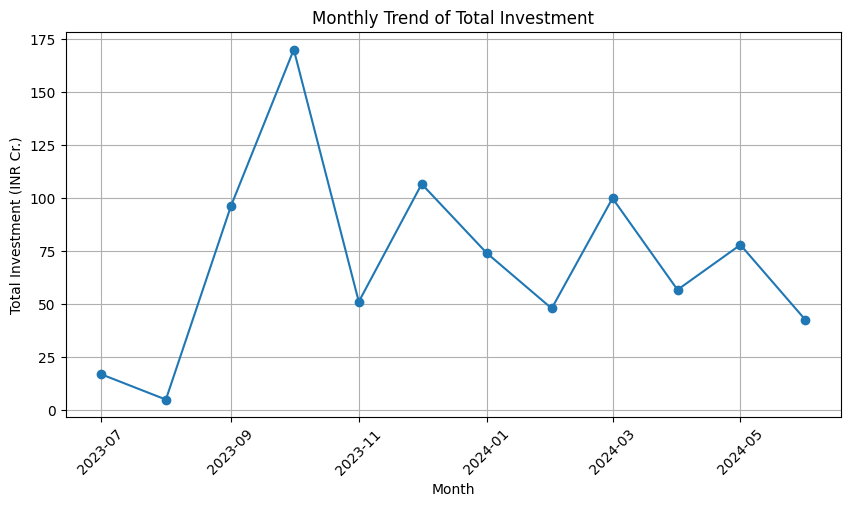

In [ ]:
# Ensure the dataframe has Year, Month, and Total Investment columns
df_media["Date"] = pd.to_datetime(df_media[["Year", "Month"]].assign(day=1))

# Plot the investment trend
plt.figure(figsize=(10, 5))
plt.plot(df_media["Date"], df_media["Total Investment"], marker='o', linestyle='-')

# Formatting the plot
plt.xlabel("Month")
plt.ylabel("Total Investment (INR Cr.)")
plt.title("Monthly Trend of Total Investment")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [ ]:
def plot_investment_breakdown(df, investment_cols):
    # Sum investments for each channel
    investment_breakdown = df[investment_cols].sum()

    # Plot Bar Chart
    plt.figure(figsize=(10, 6))
    investment_breakdown.sort_values(ascending=False).plot(kind="bar", color=["blue", "orange", "green", "red", "purple"])
    plt.xlabel("Media Channel")
    plt.ylabel("Total Investment (INR Cr.)")
    plt.title("Breakdown of Investment by Channel")
    plt.xticks(rotation=45)
    plt.grid(axis="y")
    plt.show()
    print("\n\n")
    # Plot Pie Chart
    plt.figure(figsize=(8, 8))
    investment_breakdown.plot(kind="pie", autopct="%1.1f%%", colors=["blue", "orange", "green", "red", "purple"])
    plt.ylabel("")  # Hide y-axis label for better readability
    plt.title("Investment Distribution by Channel")
    plt.show()

# Example Usage
# Define investment columns (Modify based on your dataset)
investment_columns = ["TV", "Digital", "Sponsorship","Content Marketing", "Online Marketing", "Affiliates", "SEM", "Radio", "Other"]


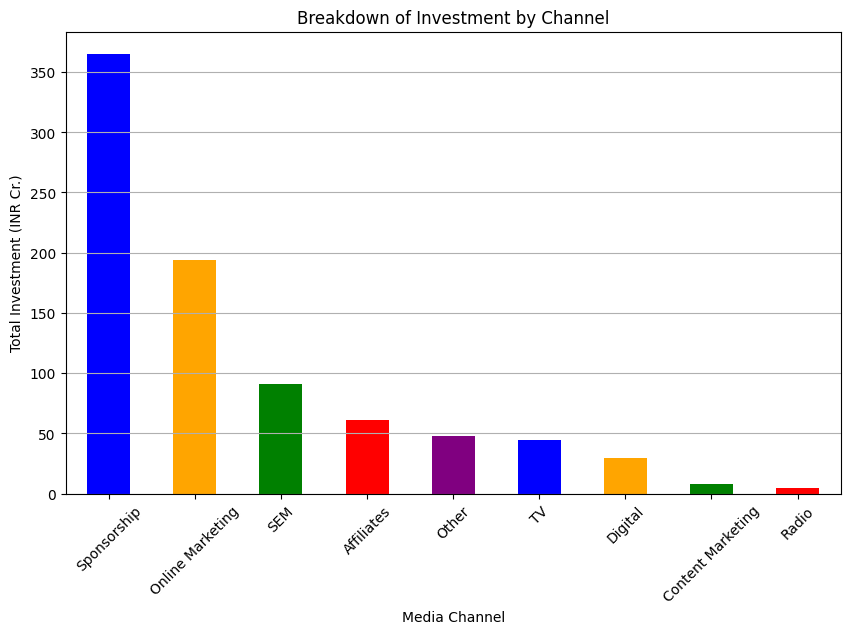

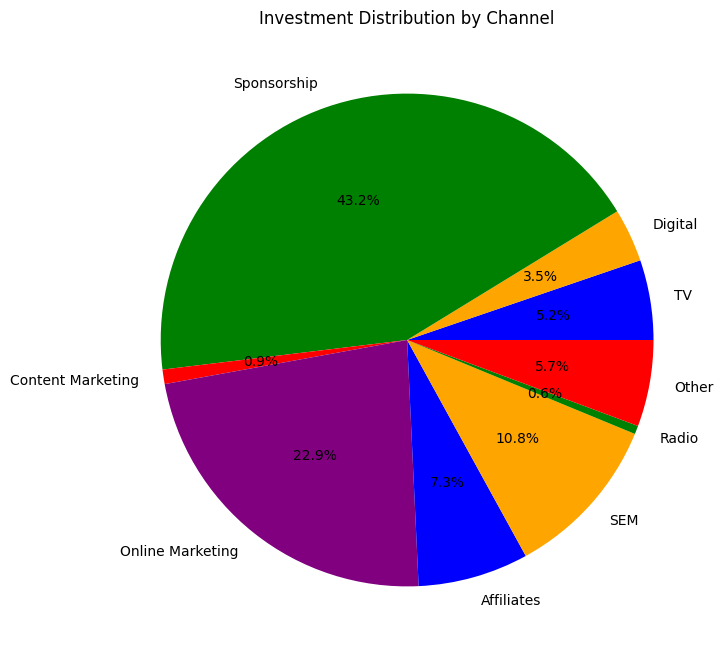

In [ ]:
plot_investment_breakdown(df_media, investment_columns)

In [ ]:
DF_fin=preprocessed_data.copy()

In [ ]:
DF_fin.shape

(1431794, 28)

In [ ]:
DF_fin["Month"]=DF_fin['Year'].astype(str) + '-'+DF_fin['Month'].astype(str).str.zfill(2)


In [ ]:
# DF_fin['year_month'] = pd.to_datetime(DF_fin['date'],errors='coerce').dt.to_period('M')
monthly_revenue = ((DF_fin.groupby('Month')['gmv'].sum())/10000000).reset_index()
#monthly_revenue.columns = ['year_month', 'monthly_revenue']

In [ ]:
print(monthly_revenue)
print(monthly_revenue.shape)

      Month        gmv
0   2023-07  16.099696
1   2023-08   0.020660
2   2023-09  18.847465
3   2023-10  47.147829
4   2023-11  30.269649
5   2023-12  39.667655
6   2024-01  35.806716
7   2024-02  30.677422
8   2024-03  37.859974
9   2024-04  31.577302
10  2024-05  38.253984
11  2024-06  27.367131
(12, 2)


In [ ]:
# First, let's split the 'Month' column in the monthly_revenue dataframe
# to match the format in df_media
monthly_revenue['Year'] = monthly_revenue['Month'].str.split('-').str[0].astype(int)
monthly_revenue['Month_Num'] = monthly_revenue['Month'].str.split('-').str[1].astype(int)

# Now create a temporary key for joining in both dataframes
monthly_revenue['merge_key'] = monthly_revenue['Year'].astype(str) + '_' + monthly_revenue['Month_Num'].astype(str)
df_media['merge_key'] = df_media['Year'].astype(str) + '_' + df_media['Month'].astype(str)

# Merge the dataframes on the merge_key
df_media = df_media.merge(
    monthly_revenue[['merge_key', 'gmv']],
    on='merge_key',
    how='left'
)

# Rename the 'gmv' column to 'Monthly_revenue'
df_media = df_media.rename(columns={'gmv': 'Monthly_revenue'})

# Drop the temporary merge_key column
df_media = df_media.drop('merge_key', axis=1)

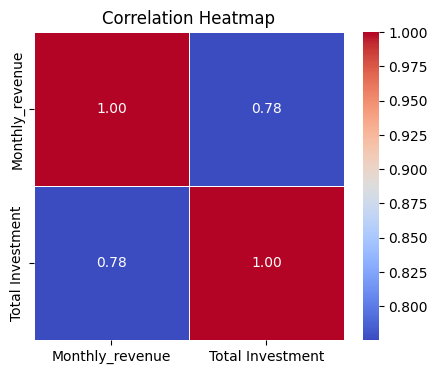

In [ ]:
selected_cols = ['Monthly_revenue', 'Total Investment']
corr_matrix = df_media[selected_cols].corr()

# Plot heatmap
plt.figure(figsize=(5, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
# Define High and Low Spending Groups (Using Median Split)
median_spend = df_media['Total Investment'].median()
df_media['Spending_Category'] = df_media['Total Investment'].apply(lambda x: 'High' if x > median_spend else 'Low')

print(df_media[['Total Investment', 'Spending_Category']].head())

   Total Investment Spending_Category
0         17.061775               Low
1          5.064306               Low
2         96.254380              High
3        170.156297              High
4         51.216220               Low


In [ ]:
# Compare revenue in high vs low spending groups
print(df_media.groupby('Spending_Category')['Monthly_revenue'].describe())

                   count       mean        std        min        25%  \
Spending_Category                                                      
High                 6.0  36.263937   9.381839  18.847465  36.320030   
Low                  6.0  22.668643  12.485495   0.020660  18.916555   

                         50%        75%        max  
Spending_Category                                   
High               38.056979  39.314237  47.147829  
Low                28.818390  30.575478  31.577302  


<ipython-input-108-8752d8f36c71>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_media['Spending_Category'], y=df_media['Monthly_revenue'], palette=['blue', 'red'])


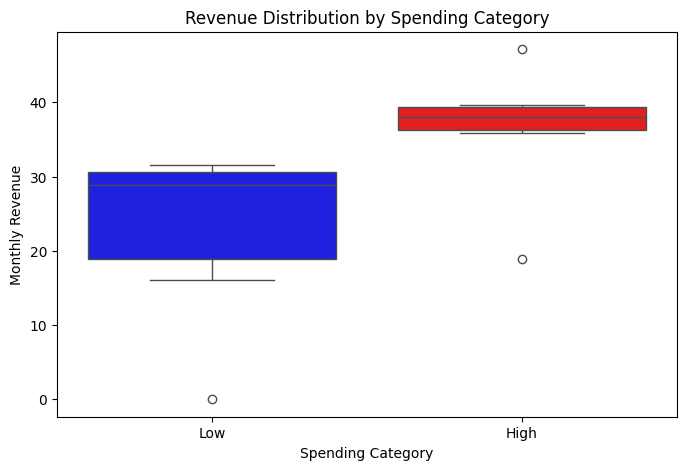

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.boxplot(x=df_media['Spending_Category'], y=df_media['Monthly_revenue'], palette=['blue', 'red'])
plt.title("Revenue Distribution by Spending Category")
plt.xlabel("Spending Category")
plt.ylabel("Monthly Revenue")
plt.show()

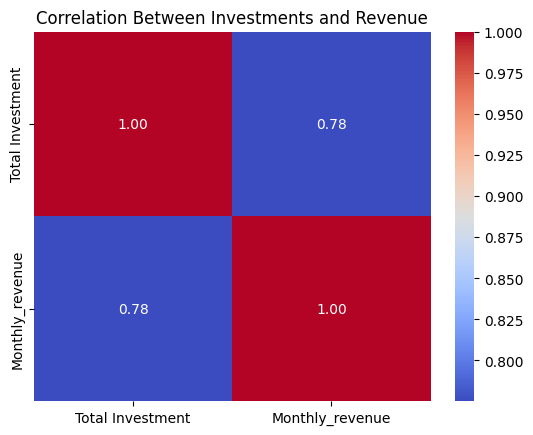

In [ ]:
corr_matrix = df_media[['Total Investment', 'Monthly_revenue']].corr()
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between Investments and Revenue")
plt.show()


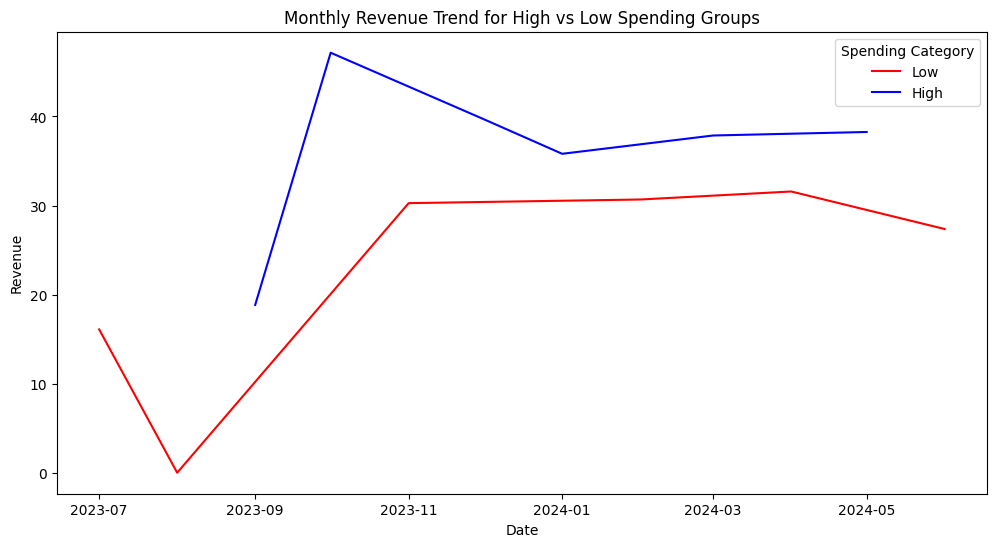

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_media, x='Date', y='Monthly_revenue', hue='Spending_Category', palette=['red', 'blue'])
plt.title("Monthly Revenue Trend for High vs Low Spending Groups")
plt.xlabel("Date")
plt.ylabel("Revenue")
plt.legend(title="Spending Category")
plt.show()

### Feature Engg.

In [ ]:
df_media['marketing_efficiency_score'] = (df_media['Monthly_revenue'] - df_media['Total Investment']) / df_media['Total Investment']

In [ ]:
# Select relevant columns
investment_cols = ['TV', 'Digital', 'Sponsorship', 'Content Marketing',
                   'Online Marketing', 'Affiliates', 'SEM', 'Radio', 'Other']

# Create a new DataFrame with Year and Month
df_percentage = df_media[['Year', 'Month']].copy()

# Compute percentage investment for each channel
for col in investment_cols:
    df_percentage[f'{col}_Inv_Percent'] = (df_media[col] / df_media['Total Investment']) * 100

# Display new DataFrame
print(df_percentage.head())


   Year  Month  TV_Inv_Percent  Digital_Inv_Percent  Sponsorship_Inv_Percent  \
0  2023      7        1.262062            14.846132                43.455441   
1  2023      8        0.127126            25.236896                20.996593   
2  2023      9        4.030470             1.409315                65.230955   
3  2023     10        3.611216             7.418168                49.761621   
4  2023     11        8.240807             2.490361                27.671148   

   Content Marketing_Inv_Percent  Online Marketing_Inv_Percent  \
0                       0.005468                      7.779247   
1                       0.000125                      2.552063   
2                       0.634041                     17.017397   
3                       2.024065                     14.323171   
4                       0.329257                     38.194100   

   Affiliates_Inv_Percent  SEM_Inv_Percent  Radio_Inv_Percent  \
0                3.207485        29.444166               

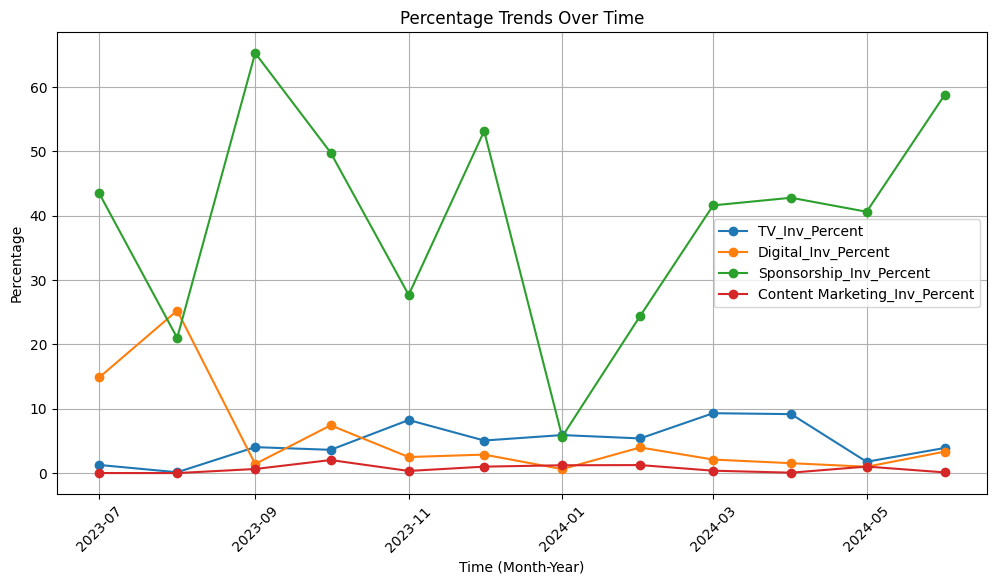

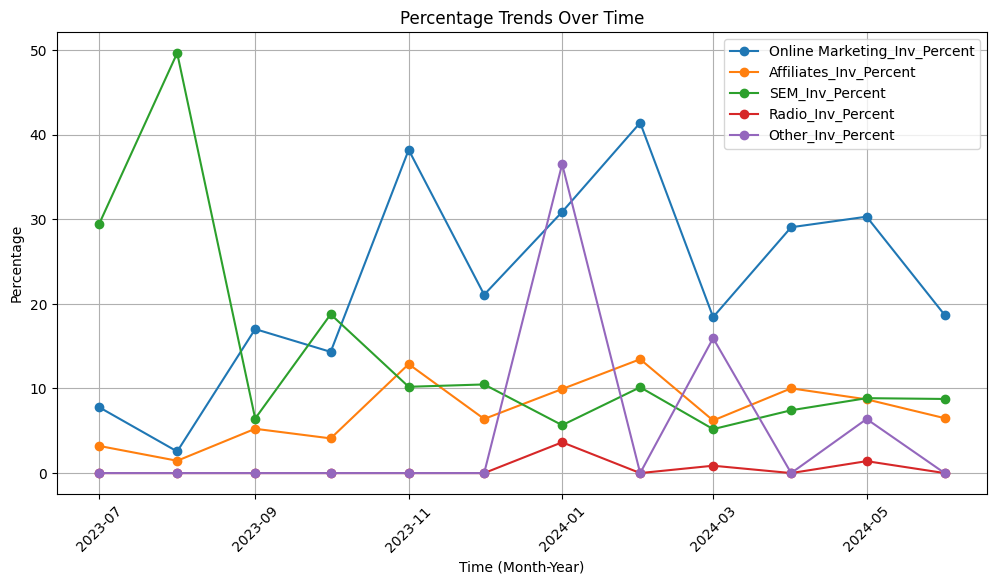

In [ ]:
df_percentage["date"] = pd.to_datetime(df_percentage["Year"].astype(str) + "-" + df_percentage["Month"].astype(str))

# Set the datetime column as index
df_percentage.set_index("date", inplace=True)

# Plotting
plt.figure(figsize=(12, 6))
for column in df_percentage.columns[2:6]:
    plt.plot(df_percentage.index, df_percentage[column], marker='o', label=column)

plt.xlabel("Time (Month-Year)")
plt.ylabel("Percentage")
plt.title("Percentage Trends Over Time")
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
print("\n")

plt.figure(figsize=(12, 6))
for column in df_percentage.columns[6:11]:
    plt.plot(df_percentage.index, df_percentage[column], marker='o', label=column)

plt.xlabel("Time (Month-Year)")
plt.ylabel("Percentage")
plt.title("Percentage Trends Over Time")
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)


plt.show()
df_percentage.reset_index(inplace=True)
df_percentage.drop(columns=["date"], inplace=True)

Sales_Calendar part

In [ ]:
from datetime import datetime
sale_periods = [
    ("18-07-2023", "19-07-2023"),
    ("15-08-2023", "17-08-2023"),
    ("28-08-2023", "30-08-2023"),
    ("15-10-2023", "17-10-2023"),
    ("07-11-2023", "14-11-2023"),
    ("25-12-2023", "03-01-2024"),
    ("20-01-2024", "22-01-2024"),
    ("01-02-2024", "02-02-2024"),
    ("20-02-2024", "21-02-2024"),
    ("14-02-2024", "15-02-2024"),
    ("07-03-2024", "09-03-2024"),
    ("25-05-2024", "27-05-2024"),
]
# Convert into datetime format
#Aligning with Orders Data
sale_periods = [(pd.to_datetime(start), pd.to_datetime(end)) for start, end in sale_periods]
sale_periods = [(pd.to_datetime(start), pd.to_datetime(end)) for start, end in sale_periods]


def is_sale_period(date_str):
    date_str = date_str[0:6] + "20" + date_str[6:]
    """Returns 1 if the date (dd-mm-yyyy) falls within a sale period, else 0."""
    date = datetime.strptime(date_str, "%d-%m-%Y")  # Convert date string to datetime

    for start_str, end_str in sale_periods:
        # start = datetime.strptime(start_str)  # Convert start string
        # end = datetime.strptime(end_str)  # Convert end string

        if start_str <= date <= end_str:
            return 1
    return 0


# Apply the function to create a new column
DF_fin["Sale_Period_Flag"] = DF_fin["date"].apply(is_sale_period)
DF_fin.head()
## --- EDA: Revenue Comparison (Sale vs Non-Sale Days) ---

# Aggregate revenue by sale period flag
revenue_comparison = DF_fin.groupby("Sale_Period_Flag")["gmv"].sum().reset_index() # revenue column is the outcome of sheet1.

# Map flag values to labels for clarity
revenue_comparison["Period"] = revenue_comparison["Sale_Period_Flag"].map({0: "Non-Sale Days", 1: "Sale Days"})

print("Revenue Comparison Data:")
print(revenue_comparison)

# Plot revenue comparison using a barplot
plt.figure(figsize=(8, 5))
sns.barplot(x="Period", y="gmv", data=revenue_comparison, palette="viridis")
plt.title("Revenue Comparison: Sale Days vs. Non-Sale Days")
plt.xlabel("Period")
plt.ylabel("Total Revenue")
plt.tight_layout()
plt.show()

In [ ]:
DF_fin.head()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,...,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value,Sale_Period_Flag
0,0,ACCCX3S58G7B5F6P,2023-10-17 15:11:54,3419300926147000.0,3419300926147000.0,6400.0,1,0.0,0.0,COD,...,2023,Tuesday,15,0.0,6400.0,10.987483,Luxury,1,6400.0,1
1,1,ACCCX3S58G7B5F6P,2023-10-19 10:07:22,1420830839915200.0,1420830839915200.0,6900.0,1,0.0,0.0,COD,...,2023,Thursday,10,0.0,6900.0,4.033380,Luxury,2,3450.0,1
2,2,ACCCX3S5AHMF55FV,2023-10-20 15:45:56,2421912925714800.0,2421912925714800.0,1990.0,1,0.0,0.0,COD,...,2023,Friday,15,0.0,1990.0,5.192949,Mass-market,1,1990.0,1
3,3,ACCCX3S5AHMF55FV,2023-10-14 12:05:15,4416592101738400.0,4416592101738400.0,1690.0,1,0.0,0.0,Prepaid,...,2023,Saturday,12,0.0,1690.0,19.485469,Mass-market,1,1690.0,1
4,4,ACCCX3S5AHMF55FV,2023-10-17 21:25:03,4419525153426400.0,4419525153426400.0,1618.0,1,0.0,0.0,Prepaid,...,2023,Tuesday,21,0.0,1618.0,22.915674,Mass-market,2,809.0,1


In [ ]:
revenue_comparison.head()

,Sale_Period_Flag,gmv,Period
0,0,1.700465e+09,Non-Sale Days
1,1,1.835490e+09,Sale Days


In [ ]:
DF_fin["Sale_Period_Flag"].sum()/len(DF_fin)

np.float64(0.518218402926678)

Units Sold Comparison Data:
   Sale_Period_Flag  Units_Sold         Period
0                 0      702819  Non-Sale Days
1                 1      757058      Sale Days


<ipython-input-295-ee06b586c223>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




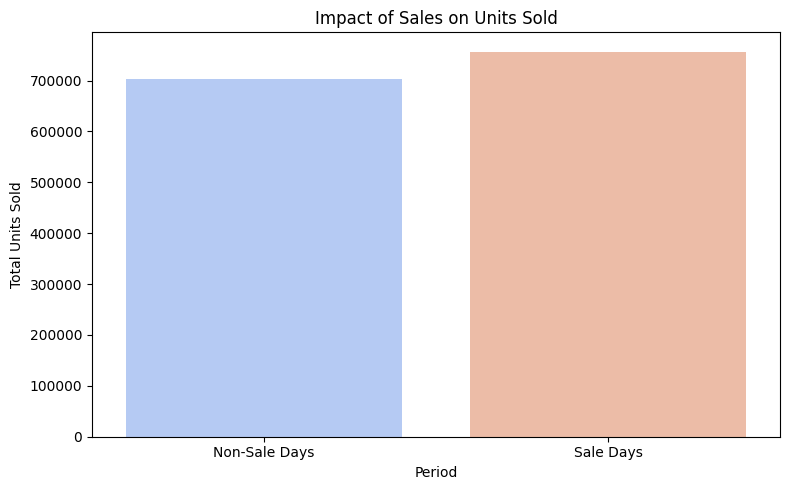

<ipython-input-295-ee06b586c223>:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




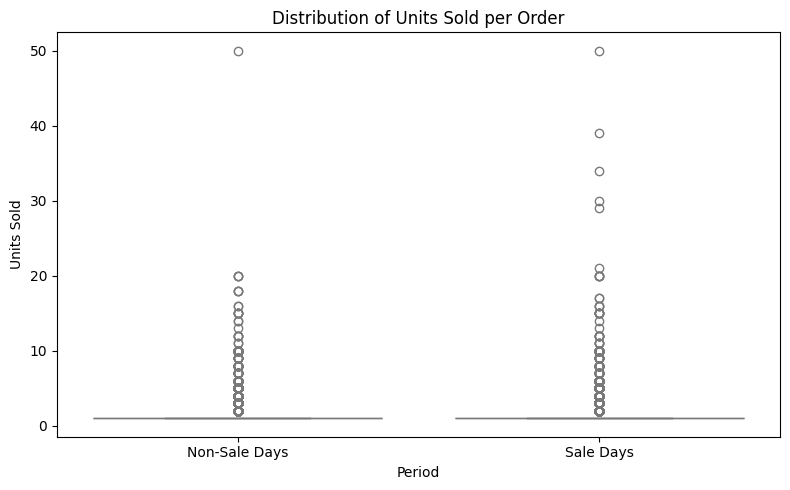

In [ ]:
# --- EDA: Impact of Sales on Units Sold ---

# Aggregate units sold by sale period flag
DF_fin.rename(columns={'units': 'Units_Sold'}, inplace=True)
units_sold_comparison = DF_fin.groupby("Sale_Period_Flag")["Units_Sold"].sum().reset_index()

# Map the flag values to meaningful labels
units_sold_comparison["Period"] = units_sold_comparison["Sale_Period_Flag"].map({0: "Non-Sale Days", 1: "Sale Days"})

print("Units Sold Comparison Data:")
print(units_sold_comparison)

# Plot a bar plot to compare units sold on sale days vs. non-sale days
plt.figure(figsize=(8, 5))
sns.barplot(x="Period", y="Units_Sold", data=units_sold_comparison, palette="coolwarm")
plt.title("Impact of Sales on Units Sold")
plt.xlabel("Period")
plt.ylabel("Total Units Sold")
plt.tight_layout()
plt.show()

# --- Additional Analysis: Distribution of Units Sold per Order ---

# For a more granular analysis, visualize the distribution of units sold per order using a boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x="Sale_Period_Flag", y="Units_Sold", data=DF_fin, palette="coolwarm")
plt.xticks([0, 1], ["Non-Sale Days", "Sale Days"])
plt.title("Distribution of Units Sold per Order")
plt.xlabel("Period")
plt.ylabel("Units Sold")
plt.tight_layout()
plt.show()



Discount Boost (Sale - Non-Sale): -0.73


<ipython-input-296-af3308af4640>:23: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




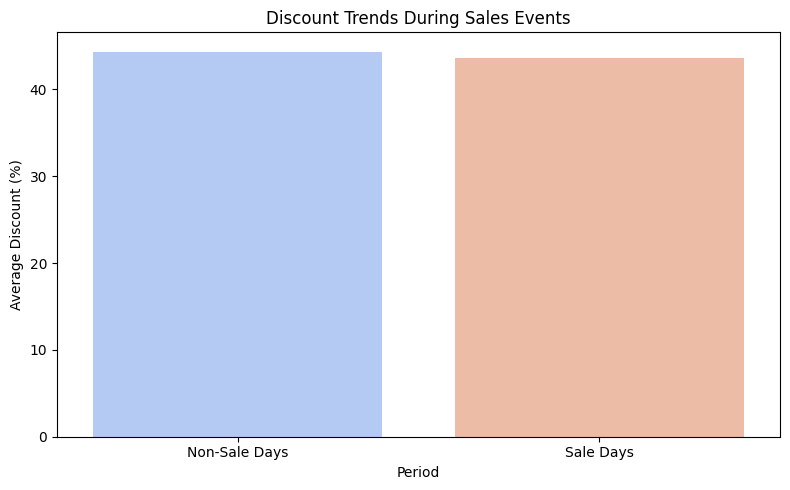

<ipython-input-296-af3308af4640>:32: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




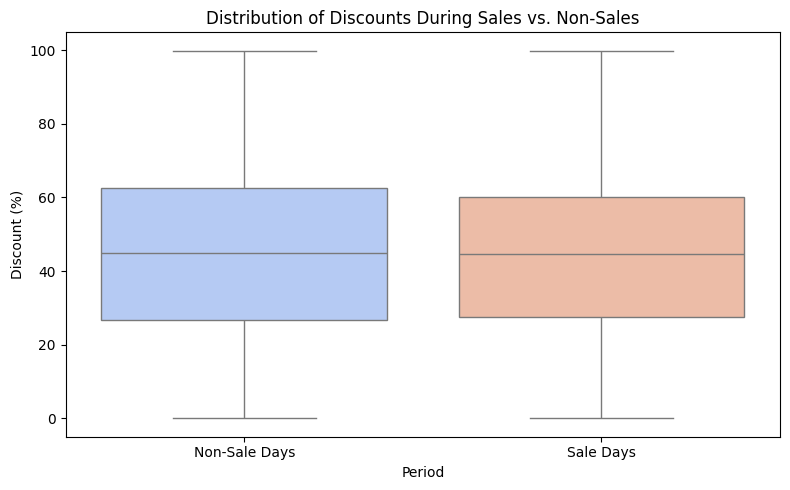

In [ ]:
# Load the dataset
# orders = pd.read_csv("PreProcessed.csv", parse_dates=["order_date"], dayfirst=True)  #Remove This Line as the column is added above
# orders.rename(columns={'order_date': 'Order_Date'}, inplace=True) # Rename after loading #Remove This Line as the column is added above

# Ensure the "Discount" column exists
DF_fin.rename(columns={'discount_percentage': 'Discount'}, inplace=True)
if "Discount" not in DF_fin.columns:
    raise ValueError("Discount column not found in dataset")

# Compute average discount during sale vs. non-sale periods

discount_trends = DF_fin.groupby("Sale_Period_Flag")["Discount"].mean().reset_index()
discount_trends["Period"] = discount_trends["Sale_Period_Flag"].map({0: "Non-Sale Days", 1: "Sale Days"})

# Compute Discount Boost
discount_boost = discount_trends.loc[discount_trends["Sale_Period_Flag"] == 1, "Discount"].values[0] - \
                 discount_trends.loc[discount_trends["Sale_Period_Flag"] == 0, "Discount"].values[0]

print(f"Discount Boost (Sale - Non-Sale): {discount_boost:.2f}")

# Plot discount trends
plt.figure(figsize=(8, 5))
sns.barplot(x="Period", y="Discount", data=discount_trends, palette="coolwarm")
plt.title("Discount Trends During Sales Events")
plt.xlabel("Period")
plt.ylabel("Average Discount (%)")
plt.tight_layout()
plt.show()

# Boxplot to visualize discount distributions
plt.figure(figsize=(8, 5))
sns.boxplot(x="Sale_Period_Flag", y="Discount", data=DF_fin, palette="coolwarm")
plt.xticks([0, 1], ["Non-Sale Days", "Sale Days"])
plt.title("Distribution of Discounts During Sales vs. Non-Sales")
plt.xlabel("Period")
plt.ylabel("Discount (%)")
plt.tight_layout()
plt.show()


In [ ]:
# Ensure 'Sale_Period_Flag' and 'Revenue' (renamed from 'gmv') exist
if "Sale_Period_Flag" not in DF_fin.columns or "gmv" not in DF_fin.columns:
    raise ValueError("Required columns not found in dataset")

# Calculate revenue during sale and non-sale periods
revenue_during_sale = DF_fin[DF_fin["Sale_Period_Flag"] == 1]["gmv"].sum()  # Use 'Revenue' instead of 'gmv'
revenue_non_sale = DF_fin[DF_fin["Sale_Period_Flag"] == 0]["gmv"].sum()  # Use 'Revenue' instead of 'gmv'

# Compute revenue uplift
revenue_uplift = revenue_during_sale - revenue_non_sale

print(f"Revenue Uplift During Sales: {revenue_uplift/10000000} crores")

Revenue Uplift During Sales: 13.502472149486708 crores


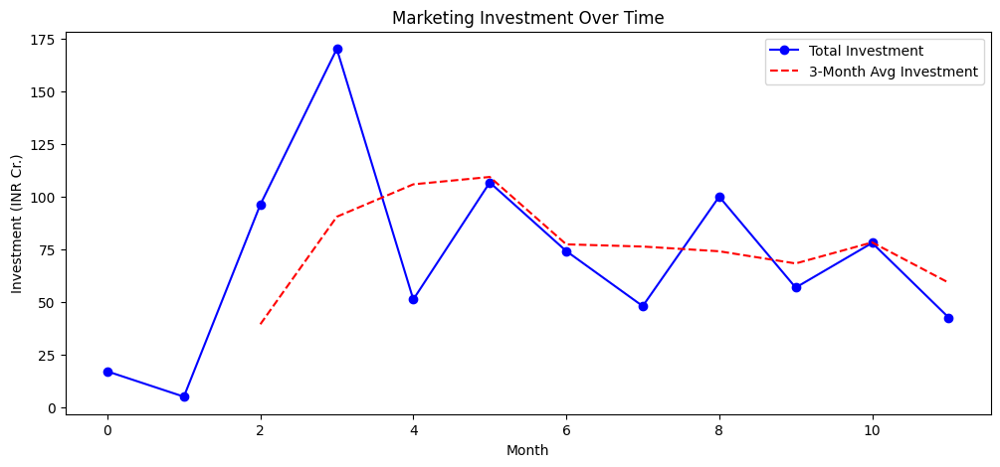

In [ ]:
# Compute lag features separately
investment_lag_1 = df_media['Total Investment'].shift(1)
investment_lag_2 = df_media['Total Investment'].shift(2)
investment_lag_3 = df_media['Total Investment'].shift(3)

# Compute 3-month moving average separately
investment_3M_MA = df_media['Total Investment'].rolling(window=3).mean()

# Plot investment trends
plt.figure(figsize=(12, 5))
plt.plot(df_media['Total Investment'], label="Total Investment", marker='o', color="blue")
plt.plot(investment_3M_MA, label="3-Month Avg Investment", linestyle="dashed", color="red")
plt.legend()
plt.title("Marketing Investment Over Time")
plt.xlabel("Month")
plt.ylabel("Investment (INR Cr.)")
plt.show()

In [ ]:
import statsmodels.api as sm

# Adding constant for intercept
X = sm.add_constant(df_media["Total Investment"])
y = df_media["Monthly_revenue"]

# Fit regression model
model = sm.OLS(y, X).fit()

# Print model summary
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:        Monthly_revenue   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     15.06
Date:                Fri, 21 Mar 2025   Prob (F-statistic):            0.00305
Time:                        14:12:31   Log-Likelihood:                -41.491
No. Observations:                  12   AIC:                             86.98
Df Residuals:                      10   BIC:                             87.95
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.8781      4.694  

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:418: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=12 observations were given.
  return hypotest_fun_in(*args, **kwds)


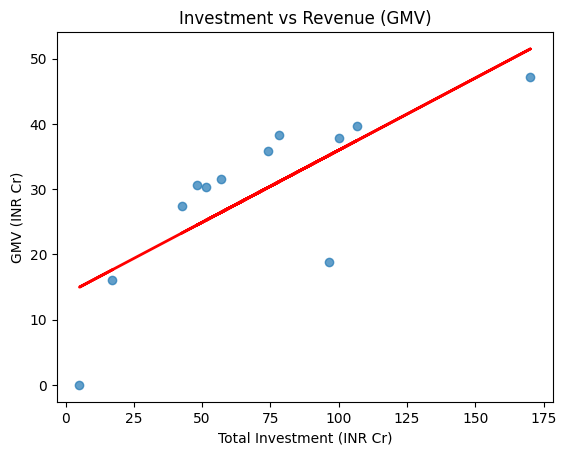

In [ ]:
plt.scatter(df_media["Total Investment"], df_media["Monthly_revenue"], alpha=0.7)
plt.xlabel("Total Investment (INR Cr)")
plt.ylabel("GMV (INR Cr)")
plt.title("Investment vs Revenue (GMV)")

# Plot regression line
plt.plot(df_media["Total Investment"], model.predict(X), color="red", linewidth=2)

plt.show()

In [ ]:
# Extract Total Investment (Ensure df_media is sorted)
total_investment = df_media['Total Investment'].values

# Extract Monthly Revenue (GMV)
gmv = monthly_revenue['gmv'].values

# Avoid division by zero errors
roi = np.where(total_investment != 0, ((gmv - total_investment) / total_investment) * 100, np.nan)

# Create a DataFrame for analysis
roi_df = pd.DataFrame({
    'Month': monthly_revenue['Month'],  # Use available months
    'Monthly_Revenue': gmv,
    'Total_Investment': total_investment,
    'ROI (%)': roi
})

print(roi_df)

      Month  Monthly_Revenue  Total_Investment    ROI (%)
0   2023-07        16.099696         17.061775  -5.638798
1   2023-08         0.020660          5.064306 -99.592037
2   2023-09        18.847465         96.254380 -80.419109
3   2023-10        47.147829        170.156297 -72.291458
4   2023-11        30.269649         51.216220 -40.898316
5   2023-12        39.667655        106.745312 -62.838972
6   2024-01        35.806716         74.196000 -51.740369
7   2024-02        30.677422         48.052000 -36.157867
8   2024-03        37.859974        100.024621 -62.149346
9   2024-04        31.577302         56.848241 -44.453336
10  2024-05        38.253984         78.057000 -50.992244
11  2024-06        27.367131         42.651938 -35.836138


In [ ]:
print("\nTop 5 High-ROI Months:")
print(roi_df.sort_values(by='ROI (%)', ascending=False).head(5))

print("\nBottom 5 Low-ROI Months:")
print(roi_df.sort_values(by='ROI (%)', ascending=True).head(5))


Top 5 High-ROI Months:
      Month  Monthly_Revenue  Total_Investment    ROI (%)
0   2023-07        16.099696         17.061775  -5.638798
11  2024-06        27.367131         42.651938 -35.836138
7   2024-02        30.677422         48.052000 -36.157867
4   2023-11        30.269649         51.216220 -40.898316
9   2024-04        31.577302         56.848241 -44.453336

Bottom 5 Low-ROI Months:
     Month  Monthly_Revenue  Total_Investment    ROI (%)
1  2023-08         0.020660          5.064306 -99.592037
2  2023-09        18.847465         96.254380 -80.419109
3  2023-10        47.147829        170.156297 -72.291458
5  2023-12        39.667655        106.745312 -62.838972
8  2024-03        37.859974        100.024621 -62.149346


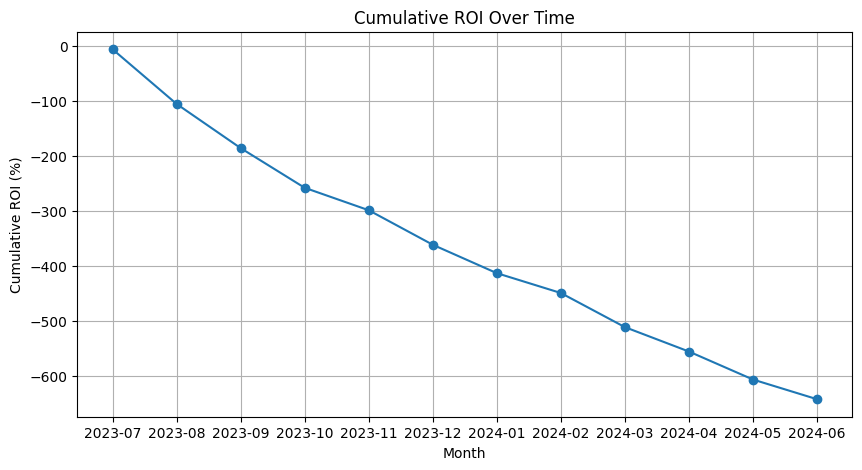

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(roi_df['Month'], roi_df['ROI (%)'].cumsum(), marker='o', linestyle='-')
plt.xlabel("Month")
plt.ylabel("Cumulative ROI (%)")
plt.title("Cumulative ROI Over Time")
plt.grid(True)
plt.show()

In [ ]:
df_media["ROI (%)"] = roi_df["ROI (%)"].values


In [ ]:
df_media.to_csv("df_media_fixed.csv", index=False, encoding="utf-8")


In [ ]:
from datetime import datetime, timedelta
import calendar

In [ ]:
monthly_df = {
    'Month': ['July\'23', 'Aug\'23', 'Sept\'23', 'Oct\'23', 'Nov\'23', 'Dec\'23',
              'Jan\'24', 'Feb\'24', 'Mar\'24', 'Apr\'24', 'May\'24', 'June\'24'],
    'NPS': [54.6, 60.0, 46.9, 44.4, 47.0, 45.8, 47.1, 50.3, 49.0, 51.8, 47.3, 50.5],
    'Stock_Index': [1177, 1206, 1101, 1210, 1233, 1038, 1052, 1222, 1015, 1242, 1228, 1194]
}

In [ ]:
monthly_df = pd.DataFrame(monthly_df)

In [ ]:
month_to_num = {
    'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04', 'May': '05', 'June': '06',
    'July': '07', 'Aug': '08', 'Sept': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'
}

In [ ]:
# Replace full month names with abbreviations
monthly_df['Month'] = monthly_df['Month'].replace({
    "July": "Jul",
    "Sept": "Sep",
    "June": "Jun"
}, regex=True)

# Convert 'Month' to datetime format using the correct format string
monthly_df['Month'] = pd.to_datetime(monthly_df['Month'], format="%b'%y")

# Convert 'Month' back to the desired format
monthly_df['Month'] = monthly_df['Month'].dt.strftime("%b'%y")

print(monthly_df)
# Custom function to convert month names to datetime
def convert_month_year(date_str):
    try:
        return pd.to_datetime(date_str, format="%b'%y")
    except ValueError:
        return pd.to_datetime(date_str, format="%B'%y")

# Apply the custom function to the 'Month' column
monthly_df['Month'] = monthly_df['Month'].apply(convert_month_year)


In [ ]:
# Convert the 'Month' column to datetime and then format it to "%m-%y"
monthly_df['Month'] = pd.to_datetime(monthly_df['Month'], format="%Y-%m-%d").dt.strftime("%m-%y")


In [ ]:
monthly_df.head()

,Month,NPS,Stock_Index
0,07-23,54.6,1177
1,08-23,60.0,1206
2,09-23,46.9,1101
3,10-23,44.4,1210
4,11-23,47.0,1233


In [ ]:
df=DF_fin.copy()

In [ ]:

df['month_year'] = pd.to_datetime(df['date'], format='%d-%m-%y').dt.strftime('%m-%y')



In [ ]:
df1 = df[['gmv','month_year']]

In [ ]:
# Group by 'month_year' and sum the 'gmv' values
revenue_df = df.groupby('month_year')['gmv'].sum().reset_index()

# Rename the columns
revenue_df.columns = ['month_year', 'revenue']

print(revenue_df.head())

  month_year       revenue
0      01-24  3.580672e+08
1      02-24  3.067742e+08
2      03-24  3.785997e+08
3      04-24  3.157730e+08
4      05-24  3.825398e+08


In [ ]:
# Convert 'month_year' to datetime format for proper sorting
revenue_df['month_year'] = pd.to_datetime(revenue_df['month_year'], format='%m-%y')

# Sort by 'month_year' in ascending order
revenue_df = revenue_df.sort_values(by='month_year').reset_index(drop=True)

# Convert 'month_year' back to the original format if needed
revenue_df['month_year'] = revenue_df['month_year'].dt.strftime('%m-%y')

print(revenue_df.head())

  month_year       revenue
0      07-23  1.609970e+08
1      08-23  2.066050e+05
2      09-23  1.884747e+08
3      10-23  4.714783e+08
4      11-23  3.026965e+08


In [ ]:
monthly_df['revenue'] = revenue_df['revenue']

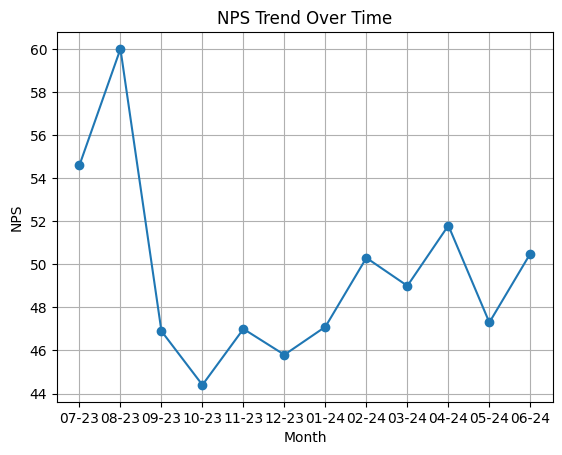

In [ ]:
import matplotlib.pyplot as plt
plt.plot(monthly_df['Month'], monthly_df['NPS'], marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('NPS')
plt.title('NPS Trend Over Time')
plt.grid(True)
plt.show()

The correlation between monthly revenue and NPS is: -0.8499360251782445


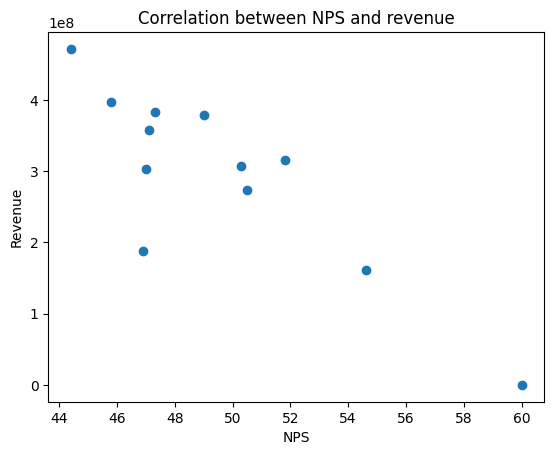

In [ ]:
# Calculate the correlation between monthly revenue growth and NPS
correlation = monthly_df['revenue'].corr(monthly_df['NPS'])

print(f"The correlation between monthly revenue and NPS is: {correlation}")

# visualize the relationship
import matplotlib.pyplot as plt
plt.scatter(monthly_df['NPS'], monthly_df['revenue'])
plt.xlabel('NPS')
plt.ylabel('Revenue')
plt.title('Correlation between NPS and revenue')
plt.show()

In [ ]:
%pip install nbformat>=4.2.0
import nbformat
import plotly.graph_objects as go

# Create a numeric index for Month to use as the X-axis
month_index = list(range(len(monthly_df)))

# Create a 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=month_index,
        y=monthly_df['NPS'],
        z=monthly_df['revenue'],
        text=monthly_df['Month'],
        mode='markers+lines+text',
        textposition='top center',
        marker=dict(size=5, color=list(month_index), colorscale='Viridis', showscale=True)
    )
])

fig.update_layout(
    scene=dict(
        xaxis_title='Month',
        yaxis_title='NPS',
        zaxis_title='Revenue',
        xaxis=dict(
            tickvals=month_index,
            ticktext=monthly_df['Month']
        )
    ),
    width=1000,   # Increased width in pixels
    height=800,   # Increased height in pixels
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

The correlation between Stock_Index and revenue is: -0.20318509869118132


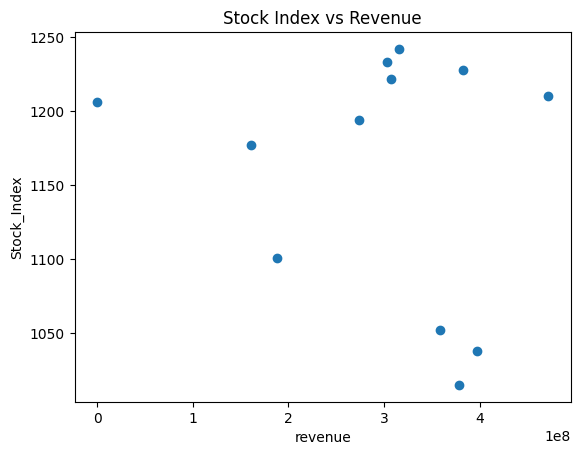

In [ ]:
# Calculate the correlation between monthly revenue growth and NPS
correlation = monthly_df['revenue'].corr(monthly_df['Stock_Index'])

print(f"The correlation between Stock_Index and revenue is: {correlation}")

import matplotlib.pyplot as plt
plt.scatter(monthly_df['revenue'], monthly_df['Stock_Index'])
plt.xlabel('revenue')
plt.ylabel('Stock_Index')
plt.title('Stock Index vs Revenue')
plt.show()

In [ ]:
# Create a numeric index for Month to use as the X-axis
month_index = list(range(len(monthly_df)))

# Create a 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=month_index,
        y=monthly_df['Stock_Index'],
        z=monthly_df['revenue'],
        text=monthly_df['Month'],
        mode='markers+lines+text',
        textposition='top center',
        marker=dict(size=5, color=list(month_index), colorscale='Viridis', showscale=True)
    )
])

fig.update_layout(
    scene=dict(
        xaxis_title='Month',
        yaxis_title='Stock_Index',
        zaxis_title='Revenue',
        xaxis=dict(
            tickvals=month_index,
            ticktext=monthly_df['Month']
        )
    ),
    width=1000,   # Increased width in pixels
    height=800,   # Increased height in pixels
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

In [ ]:
# Calculate NPS Growth Rate for each month using the formula:
# ((Current Month NPS - Previous Month NPS) / Previous Month NPS) * 100
monthly_df['NPS_Growth_Rate'] = (monthly_df['NPS'].diff() / monthly_df['NPS'].shift(1)) * 100
monthly_df

,Month,NPS,Stock_Index,revenue,NPS_Growth_Rate
0,07-23,54.6,1177,1.609970e+08,NaN
1,08-23,60.0,1206,2.066050e+05,9.890110
2,09-23,46.9,1101,1.884747e+08,-21.833333
3,10-23,44.4,1210,4.714783e+08,-5.330490
4,11-23,47.0,1233,3.026965e+08,5.855856
5,12-23,45.8,1038,3.966766e+08,-2.553191
6,01-24,47.1,1052,3.580672e+08,2.838428
7,02-24,50.3,1222,3.067742e+08,6.794055
8,03-24,49.0,1015,3.785997e+08,-2.584493
9,04-24,51.8,1242,3.157730e+08,5.714286


In [ ]:
# Create a numeric index for Month to use as the X-axis
month_index = list(range(len(monthly_df)))

# Create a 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=month_index,
        y=monthly_df['Stock_Index'],
        z=monthly_df['revenue'],
        text=monthly_df['Month'],
        mode='markers+lines+text',
        textposition='top center',
        marker=dict(size=5, color=list(month_index), colorscale='Viridis', showscale=True)
    )
])

fig.update_layout(
    scene=dict(
        xaxis_title='Month',
        yaxis_title='Stock_Index',
        zaxis_title='Revenue',
        xaxis=dict(
            tickvals=month_index,
            ticktext=monthly_df['Month']
        )
    ),
    width=1000,   # Increased width in pixels
    height=800,   # Increased height in pixels
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

In [ ]:
# Calculate NPS Growth Rate for each month using the formula:
# ((Current Month NPS - Previous Month NPS) / Previous Month NPS) * 100
monthly_df['NPS_Growth_Rate'] = (monthly_df['NPS'].diff() / monthly_df['NPS'].shift(1)) * 100


In [ ]:
# Calculate month-over-month absolute changes
monthly_df['Revenue_Change'] = monthly_df['revenue'].diff()
monthly_df['NPS_Change'] = monthly_df['NPS'].diff()

# Calculate month-over-month percentage changes
monthly_df['Revenue_Pct_Change'] = monthly_df['revenue'].pct_change() * 100
monthly_df['NPS_Pct_Change'] = monthly_df['NPS'].pct_change() * 100



The correlation between NPS % Change and Revenue % Change is: -0.7728231404598194


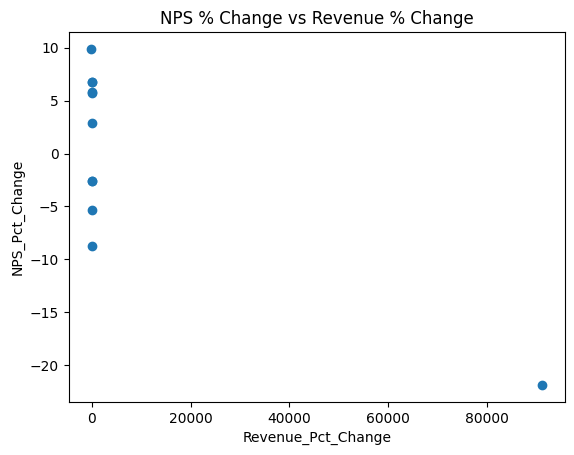

In [ ]:
# Calculate the correlation between monthly revenue growth and NPS
correlation = monthly_df['Revenue_Pct_Change'].corr(monthly_df['NPS_Pct_Change'])

print(f"The correlation between NPS % Change and Revenue % Change is: {correlation}")

import matplotlib.pyplot as plt
plt.scatter(monthly_df['Revenue_Pct_Change'], monthly_df['NPS_Pct_Change'])
plt.xlabel('Revenue_Pct_Change')
plt.ylabel('NPS_Pct_Change')
plt.title('NPS % Change vs Revenue % Change')
plt.show()

In [ ]:
# Create a numeric index for Month to use as the X-axis
month_index = list(range(len(monthly_df)))

# Create a 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=month_index,
        y=monthly_df['NPS_Pct_Change'],
        z=monthly_df['Revenue_Pct_Change'],
        text=monthly_df['Month'],
        mode='markers+lines+text',
        textposition='top center',
        marker=dict(size=5, color=list(month_index), colorscale='Viridis', showscale=True)
    )
])

fig.update_layout(
    scene=dict(
        xaxis_title='Month',
        yaxis_title='NPS_Pct_Change',
        zaxis_title='Revenue_Pct_Change',
        xaxis=dict(
            tickvals=month_index,
            ticktext=monthly_df['Month']
        )
    ),
    width=1000,   # Increased width in pixels
    height=800,   # Increased height in pixels
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

In [ ]:
# Calculate the rolling standard deviation for 'Stock_Index' using a 2-month window
monthly_df['Stock_Index_Rolling_Std'] = monthly_df['Stock_Index'].rolling(window=2).std()

In [ ]:
# Calculate Stock Price Volatility as the rolling standard deviation of Stock_Index (using a 2-month window)
stock_volatility = monthly_df['Stock_Index'].rolling(window=2).std()
print("Stock Price Volatility (Rolling STD of Stock_Index):")
print(stock_volatility)

The correlation between NPS % Change and Revenue % Change is: -0.7728231404598194


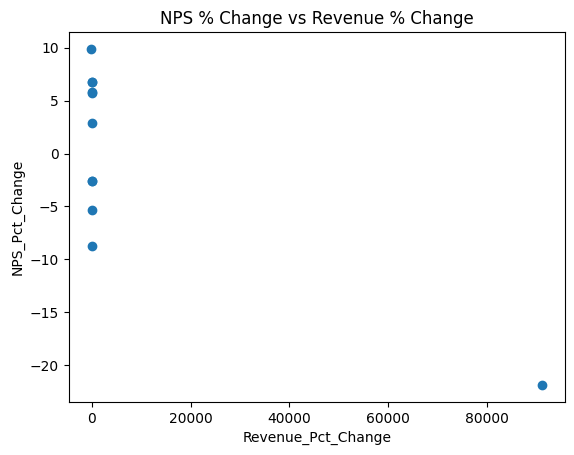

In [ ]:
# Calculate the correlation between monthly revenue growth and NPS
correlation = monthly_df['Revenue_Pct_Change'].corr(monthly_df['NPS_Pct_Change'])

print(f"The correlation between NPS % Change and Revenue % Change is: {correlation}")

import matplotlib.pyplot as plt
plt.scatter(monthly_df['Revenue_Pct_Change'], monthly_df['NPS_Pct_Change'])
plt.xlabel('Revenue_Pct_Change')
plt.ylabel('NPS_Pct_Change')
plt.title('NPS % Change vs Revenue % Change')
plt.show()

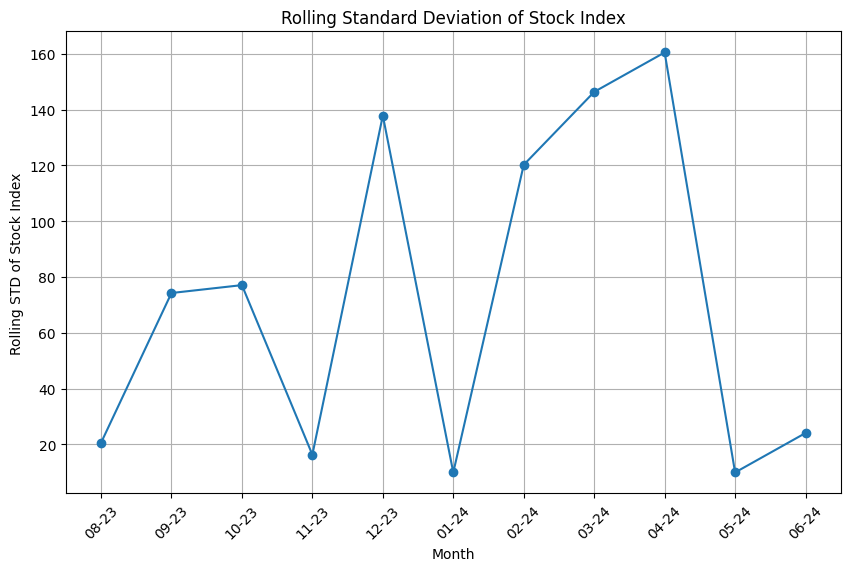

In [ ]:
# Plot the rolling standard deviation of the Stock Index from monthly_data.
plt.figure(figsize=(10, 6))
plt.plot(monthly_df['Month'].astype(str), monthly_df['Stock_Index_Rolling_Std'], marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('Rolling STD of Stock Index')
plt.title('Rolling Standard Deviation of Stock Index')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

### Sales_calender & holiday

In [ ]:
df_struc = pd.read_csv("Sales_Calendar_NoMonth.csv")


In [ ]:
def check_payday(date):
    """
    Takes a date string in 'dd-mm-yyyy' format and returns:
    - 1 if the day is '01' or '15'
    - 0 otherwise
    """
    day = date.split('-')[0]  # Extract the day part
    return 1 if day in ["01", "15"] else 0


print(check_payday("17-03-2024"))


In [ ]:
df_holidays = pd.read_csv("holidays.csv")


In [ ]:
from datetime import datetime

def get_week_number(date_str):
    # Parse the date string in dd-mm-yyyy format to a datetime object
    date_obj = datetime.strptime(date_str, "%d-%m-%Y")
    # Extract the ISO week number from the date
    week_number = date_obj.isocalendar()[1]
    return week_number

print(get_week_number(df_holidays["Date"][1]))
print(get_week_number(df_holidays["Date"][8]))

31
1


In [ ]:
holiday_weekset_2023=set()
for i in range(len(df_holidays)):
  if(df_holidays["Date"][i][6:10]=="2023"):
    holiday_weekset_2023.add(get_week_number(df_holidays["Date"][i]))

print(holiday_weekset_2023)

holiday_weekset_2024=set()
for i in range(len(df_holidays)):
  if(df_holidays["Date"][i][6:10]=="2024"):
    holiday_weekset_2024.add(get_week_number(df_holidays["Date"][i]))

print(holiday_weekset_2024)

{36, 41, 44, 45, 52, 26, 31}
{1, 7, 8, 9, 11, 13, 19, 21, 26}


In [ ]:
def holiday_week_flagger(date):
  if date[6:10]=="2023":
    if get_week_number(date) in holiday_weekset_2023:
      return 1
    else:
      return 0
  else:
    if get_week_number(date) in holiday_weekset_2024:
      return 1
    else:
      return 0

In [ ]:
payday_weeks_2023 = set()
payday_weeks_2024 = set()
for month in range(7, 13):
    for day in [1, 15]:
        # Create a datetime object for the given date
        dt = datetime(2023, month, day)
        # Get the ISO week number and add it to the set
        week_number = dt.isocalendar()[1]
        payday_weeks_2023.add(week_number)

for month in range(1, 8):
    for day in [1, 15]:
        dt = datetime(2024, month, day)
        week_number = dt.isocalendar()[1]
        payday_weeks_2024.add(week_number)

print(payday_weeks_2023)
print(payday_weeks_2024)

In [ ]:
def payday_week_flagger(date):
  if date[6:10]=="2023":
    if get_week_number(date) in payday_weeks_2023:
      return 1
    else:
      return 0
  else:
    if get_week_number(date) in payday_weeks_2024:
      return 1
    else:
      return 0

In [ ]:
# Converting to datetime with the correct format
DF_fin['date'] = pd.to_datetime(DF_fin['date'], format='%d-%m-%y')

# Converting back to the desired format
DF_fin['date'] = DF_fin['date'].dt.strftime('%d-%m-%Y')


In [ ]:
DF_fin.columns

Index(['Unnamed: 0', 'fsn_id', 'order_id', 'order_item_id', 'gmv',
       'Units_Sold', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price', 'Discount',
       'product_type', 'purchase_frequency', 'average_order_value',
       'Sale_Period_Flag'],
      dtype='object')

In [ ]:
DF_fin.shape

(1431794, 28)

In [ ]:
(DF_fin["date"][0])

'17-10-2023'

In [ ]:
(DF_fin["date"][0])

In [ ]:
df=DF_fin.copy()
df.shape

In [ ]:
df['isPaydayWeek'] = df['date'].apply(payday_week_flagger)

In [ ]:
df['isPaydayWeek'].sum()/df.shape[0]

So more than 41% of orders are in payday weeks

In [ ]:
df['isHolidayWeek'] = df['date'].apply(holiday_week_flagger)

In [ ]:
df['isHolidayWeek'].sum()/df.shape[0]

Around 31% of orders have been done on holiday weeks

Only 1st and 15th of a month are paydays..

In [ ]:
holiday_dates = set(df_holidays['Date'])

In [ ]:
# Group by date and sum GMV
date_gmv_sum = DF_fin.groupby('date')['gmv'].sum()

# Create the set of tuples
date_gmv_tuples = set(date_gmv_sum.items())

len(date_gmv_tuples)

##G3

In [ ]:
import pandas as pd
from datetime import datetime, timedelta

In [ ]:
final = pd.read_csv('output_fin.csv')

In [ ]:
final.shape

(1431794, 31)

In [ ]:
final.columns

Index(['Unnamed: 0', 'fsn_id', 'order_id', 'order_item_id', 'gmv',
       'Units_Sold', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price', 'Discount',
       'product_type', 'purchase_frequency', 'average_order_value',
       'Sale_Period_Flag', 'isPaydayWeek', 'isHolidayWeek', 'isHoliday'],
      dtype='object')

In [ ]:
final.head().T

,0,1,2,3,4
Unnamed: 0,0,1,2,3,4
fsn_id,ACCCX3S58G7B5F6P,ACCCX3S58G7B5F6P,ACCCX3S5AHMF55FV,ACCCX3S5AHMF55FV,ACCCX3S5AHMF55FV
order_id,3419300926147000.0,1420830839915200.0,2421912925714800.0,4416592101738400.0,4419525153426400.0
order_item_id,3419300926147000.0,1420830839915200.0,2421912925714800.0,4416592101738400.0,4419525153426400.0
gmv,6400.0,6900.0,1990.0,1690.0,1618.0
Units_Sold,1,1,1,1,1
deliverybdays,0.0,0.0,0.0,0.0,0.0
deliverycdays,0.0,0.0,0.0,0.0,0.0
order_payment_type,COD,COD,COD,Prepaid,Prepaid
sla,5,7,10,4,6


In [ ]:
preprocessed_data=pd.read_csv("/content/PreProcessed_13.03.2025.csv")

In [ ]:
preprocessed_data.shape

(1431794, 27)

In [ ]:
df = preprocessed_data.copy()
df.head()

,Unnamed: 0,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,...,Month,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value
0,0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,...,10,2023,Tuesday,15,0.0,6400.0,10.987483,Luxury,1,6400.0
1,1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,...,10,2023,Thursday,10,0.0,6900.0,4.033380,Luxury,2,3450.0
2,2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,...,10,2023,Friday,15,0.0,1990.0,5.192949,Mass-market,1,1990.0
3,3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,...,10,2023,Saturday,12,0.0,1690.0,19.485469,Mass-market,1,1690.0
4,4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,...,10,2023,Tuesday,21,0.0,1618.0,22.915674,Mass-market,2,809.0


In [ ]:

# Assuming 'order_date' is the column name in your customer_order_filtered DataFrame
df['order_date'] = customers_orders_filtered['order_date']


In [ ]:
final.shape

(1431794, 31)

In [ ]:
final.columns

Index(['Unnamed: 0', 'fsn_id', 'order_id', 'order_item_id', 'gmv',
       'Units_Sold', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price', 'Discount',
       'product_type', 'purchase_frequency', 'average_order_value',
       'Sale_Period_Flag', 'isPaydayWeek', 'isHolidayWeek', 'isHoliday'],
      dtype='object')

In [ ]:
final['deliverybdays'] = final['deliverybdays'].replace('\\N', 0)
final['deliverycdays'] = final['deliverycdays'].replace('\\N', 0)

In [ ]:
# Convert the 'order_date' column to string type before using .str.split
df['Date'], df['Time'] = df['order_date'].astype(str).str.split(' ', n=1, expand=True).values.T
df.head()

,Unnamed: 0,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,...,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value,order_date,Date,Time
0,0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,...,15,0.0,6400.0,10.987483,Luxury,1,6400.0,2023-10-17 15:11:54,2023-10-17,15:11:54
1,1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,...,10,0.0,6900.0,4.033380,Luxury,2,3450.0,2023-10-19 10:07:22,2023-10-19,10:07:22
2,2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,...,15,0.0,1990.0,5.192949,Mass-market,1,1990.0,2023-10-20 15:45:56,2023-10-20,15:45:56
3,3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,...,12,0.0,1690.0,19.485469,Mass-market,1,1690.0,2023-10-14 12:05:15,2023-10-14,12:05:15
4,4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,...,21,0.0,1618.0,22.915674,Mass-market,2,809.0,2023-10-17 21:25:03,2023-10-17,21:25:03


In [ ]:
holiday = pd.read_excel('Canada Holiday List.xlsx')

In [ ]:
for i in range(0,23):
  date_str=holiday['Day'][i]
  date_obj=datetime.strptime(date_str,"%B %d, %Y")
  formatted_data=date_obj.strftime("%d-%m-%Y")

  holiday.loc[i, 'formatted_day'] = formatted_data

holidays = list(holiday['formatted_day'])
#df['isHoliday'] = df['Date'].isin(holidays).astype(int)


In [ ]:
holiday.to_csv('holiday_formatted.csv', index=False)

In [ ]:
holidays

['01-07-2023',
 '03-08-2023',
 '07-09-2023',
 '12-10-2023',
 '31-10-2023',
 '11-11-2023',
 '25-12-2023',
 '26-12-2023',
 '01-01-2024',
 '15-02-2024',
 '15-02-2024',
 '15-02-2024',
 '15-02-2024',
 '14-02-2024',
 '29-02-2024',
 '17-03-2024',
 '25-03-2024',
 '28-03-2024',
 '08-05-2024',
 '23-05-2024',
 '19-06-2024',
 '21-06-2024',
 '24-06-2024']

In [ ]:
holidays = list(holiday['formatted_day'])
holiday_weeks = [pd.to_datetime(date).isocalendar().week for date in holidays]

print(holiday_weeks)


[1, 10, 27, 49, 44, 45, 52, 52, 1, 7, 7, 7, 7, 7, 9, 11, 13, 13, 32, 21, 25, 25, 26]


<ipython-input-319-5cef9f307560>:2: UserWarning:

Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [ ]:
preprocessed_data.columns

Index(['Unnamed: 0', 'fsn_id', 'order_id', 'order_item_id', 'gmv', 'units',
       'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla',
       'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', 'date',
       'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday', 'Order Hour',
       'total_delivery_days', 'list_price', 'discount_percentage',
       'product_type', 'purchase_frequency', 'average_order_value'],
      dtype='object')

In [ ]:
final = final.drop(['Unnamed: 0'], axis = 1)

In [ ]:
final.shape

(1431794, 30)

In [ ]:
final['date']

,date
0,17-10-2023
1,19-10-2023
2,20-10-2023
3,14-10-2023
4,17-10-2023
...,...
1431789,27-09-2023
1431790,28-09-2023
1431791,29-09-2023
1431792,29-09-2023


In [ ]:
holiday['formatted_day'] = holiday['Day'].apply(lambda x: datetime.strptime(x, "%B %d, %Y"))

holiday_week_dates = set()
for date in holiday['formatted_day']:
    for offset in range(-3, 4):
        holiday_week_dates.add(date + timedelta(days=offset))

final['Holiday_Week'] = final['date'].isin(holiday_week_dates).astype(int)

In [ ]:
final['Holiday_Week'].unique()

array([0])

In [ ]:
final['gmv'] = pd.to_numeric(df['gmv'], errors='coerce')

gmv_summary = final.groupby('Holiday_Week')['gmv'].sum()

gmv_non_holiday = gmv_summary.get(0, 0)
gmv_holiday = gmv_summary.get(1, 0)

print(f"GMV on Non-Holiday Weeks: {gmv_non_holiday}")
print(f"GMV on Holiday Weeks: {gmv_holiday}")

GMV on Non-Holiday Weeks: 3535954822.8353252
GMV on Holiday Weeks: 0


In [ ]:
gmv_summary = df.groupby('Holiday_Week')['gmv'].mean()

avg_gmv_non_holiday = gmv_summary.get(0, 0)
avg_gmv_holiday = gmv_summary.get(1, 0)
print(f"Average GMV on Non-Holiday Weeks: {avg_gmv_non_holiday}")
print(f"Average GMV on Holiday Weeks: {avg_gmv_holiday}")

Average GMV on Non-Holiday Weeks: 2469.5974580388834
Average GMV on Holiday Weeks: 0


In [ ]:
volume_summary = df.groupby('Holiday_Week')['units'].mean()

avg_volume_non_holiday = volume_summary.get(0, 0)
avg_volume_holiday = volume_summary.get(1, 0)
print(f"Average Volume on Non-Holiday Weeks: {avg_volume_non_holiday}")
print(f"Average Volume on Holiday Weeks: {avg_volume_holiday}")

Average Volume on Non-Holiday Weeks: 1.0229227160266547
Average Volume on Holiday Weeks: 1.0218936713747562


In [ ]:
sku = pd.read_csv('SKU_details.csv')

In [ ]:
sku.head()

,fsn_id,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical
0,ACCCX3S58G7B5F6P,CE,CameraAccessory,CameraAccessory,CameraTripod
1,ACCCX3S5AHMF55FV,CE,CameraAccessory,CameraAccessory,CameraTripod
2,ACCCX3S5JGAJETYR,CE,CameraAccessory,CameraAccessory,CameraTripod
3,ACCCX3SG2GG9YYAH,CE,CameraAccessory,CameraAccessory,Lens
4,ACCCX3SGAR6NNBMR,CE,CameraAccessory,CameraAccessory,Lens


In [ ]:
final = final.merge(sku, on='fsn_id', how='inner')
final.head()

,fsn_id,order_id,order_item_id,gmv,Units_Sold,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,...,average_order_value,Sale_Period_Flag,isPaydayWeek,isHolidayWeek,isHoliday,Holiday_Week,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical
0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,1.012991e+18,...,6400.0,1,0,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,8.990325e+18,...,3450.0,1,0,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,1.040443e+18,...,1990.0,1,0,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,7.604961e+18,...,1690.0,1,1,1,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,2.894557e+18,...,809.0,1,0,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod


In [ ]:
final.shape

(1431794, 35)

In [ ]:
final.columns

Index(['fsn_id', 'order_id', 'order_item_id', 'gmv', 'Units_Sold',
       'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla',
       'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', 'date',
       'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday', 'Order Hour',
       'total_delivery_days', 'list_price', 'Discount', 'product_type',
       'purchase_frequency', 'average_order_value', 'Sale_Period_Flag',
       'isPaydayWeek', 'isHolidayWeek', 'isHoliday', 'Holiday_Week',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical'],
      dtype='object')

In [ ]:
holiday_week_df = final[final['Holiday_Week'] == 1]

holiday_volume_summary = holiday_week_df.groupby('product_analytic_category')['Units_Sold'].sum()

print("The categorical volume summary for holidays:\n", holiday_volume_summary)

The categorical volume summary for holidays:
 Series([], Name: Units_Sold, dtype: int64)


In [ ]:
df.head()

,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,...,product_mrp,product_procurement_sla,Date,Time,isHoliday,Holiday_Week,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical
0,ACCCX3S58G7B5F6P,3.420000e+15,3.420000e+15,6400.0,1,0,0,COD,5,-1.01E+18,...,7190,0,2023-10-17,15:11,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
1,ACCCX3S58G7B5F6P,1.420000e+15,1.420000e+15,6900.0,1,0,0,COD,7,-8.99E+18,...,7190,0,2023-10-19,10:07,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
2,ACCCX3S5AHMF55FV,2.420000e+15,2.420000e+15,1990.0,1,0,0,COD,10,-1.04E+18,...,2099,3,2023-10-20,15:45,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod
3,ACCCX3S5AHMF55FV,4.420000e+15,4.420000e+15,1690.0,1,0,0,Prepaid,4,-7.60E+18,...,2099,3,2023-10-14,12:05,0,1,CE,CameraAccessory,CameraAccessory,CameraTripod
4,ACCCX3S5AHMF55FV,4.420000e+15,4.420000e+15,1618.0,1,0,0,Prepaid,6,2.89E+18,...,2099,3,2023-10-17,21:25,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod


In [ ]:
holiday['week_number'] = holiday['formatted_day'].apply(lambda x: x.isocalendar().week)
holiday_dict = holiday.groupby('week_number')['Occassion'].apply(list).to_dict()
holidays_week = holiday['week_number'].tolist()
holidays_week

[26,
 31,
 36,
 41,
 44,
 45,
 52,
 52,
 1,
 7,
 7,
 7,
 7,
 7,
 9,
 11,
 13,
 13,
 19,
 21,
 25,
 25,
 26]

In [ ]:
final['date']

,date
0,17-10-2023
1,19-10-2023
2,20-10-2023
3,14-10-2023
4,17-10-2023
...,...
1431789,27-09-2023
1431790,28-09-2023
1431791,29-09-2023
1431792,29-09-2023


In [ ]:
final['date'] = pd.to_datetime(final['date'], format='%d-%m-%Y')

# Extract ISO week number
final['week_number'] = final['date'].apply(lambda x: x.isocalendar()[1])

final['date']


,date
0,2023-10-17
1,2023-10-19
2,2023-10-20
3,2023-10-14
4,2023-10-17
...,...
1431789,2023-09-27
1431790,2023-09-28
1431791,2023-09-29
1431792,2023-09-29


In [ ]:
final['week_number'] = final['date'].apply(lambda x: x.isocalendar().week)
final.head().T

,0,1,2,3,4
fsn_id,ACCCX3S58G7B5F6P,ACCCX3S58G7B5F6P,ACCCX3S5AHMF55FV,ACCCX3S5AHMF55FV,ACCCX3S5AHMF55FV
order_id,3419300926147000.0,1420830839915200.0,2421912925714800.0,4416592101738400.0,4419525153426400.0
order_item_id,3419300926147000.0,1420830839915200.0,2421912925714800.0,4416592101738400.0,4419525153426400.0
gmv,6400.0,6900.0,1990.0,1690.0,1618.0
Units_Sold,1,1,1,1,1
deliverybdays,0.0,0.0,0.0,0.0,0.0
deliverycdays,0.0,0.0,0.0,0.0,0.0
order_payment_type,COD,COD,COD,Prepaid,Prepaid
sla,5,7,10,4,6
cust_id,1012991307785880064.0,8990324579055120384.0,1040442942046599936.0,7604960843527140352.0,2894557208345299968.0


In [ ]:
final['gmv'] = final['gmv'].astype(float)
gmv_sum_by_week = final[final['week_number'].isin(holidays_week)].groupby('week_number')['gmv'].sum().reset_index()
print(gmv_sum_by_week)

    week_number           gmv
0             1  6.596710e+07
1             7  6.626728e+07
2             9  6.896777e+07
3            11  7.755740e+07
4            13  6.745373e+07
5            19  6.888162e+07
6            21  1.220187e+08
7            25  6.202869e+07
8            26  6.502858e+07
9            31  5.923317e+06
10           36  4.358207e+07
11           41  7.987180e+07
12           44  5.228196e+07
13           45  1.479022e+08
14           52  6.634798e+07


In [ ]:
preprocessed_data['order_date']=customers_orders_filtered['order_date']

In [ ]:
final = final.drop(columns = 'Holiday_Week')

In [ ]:
final.head().T

,0,1,2,3,4
fsn_id,ACCCX3S58G7B5F6P,ACCCX3S58G7B5F6P,ACCCX3S5AHMF55FV,ACCCX3S5AHMF55FV,ACCCX3S5AHMF55FV
order_id,3419300926147000.0,1420830839915200.0,2421912925714800.0,4416592101738400.0,4419525153426400.0
order_item_id,3419300926147000.0,1420830839915200.0,2421912925714800.0,4416592101738400.0,4419525153426400.0
gmv,6400.0,6900.0,1990.0,1690.0,1618.0
Units_Sold,1,1,1,1,1
deliverybdays,0.0,0.0,0.0,0.0,0.0
deliverycdays,0.0,0.0,0.0,0.0,0.0
order_payment_type,COD,COD,COD,Prepaid,Prepaid
sla,5,7,10,4,6
cust_id,1012991307785880064.0,8990324579055120384.0,1040442942046599936.0,7604960843527140352.0,2894557208345299968.0


<ipython-input-348-eca5fa71a64f>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




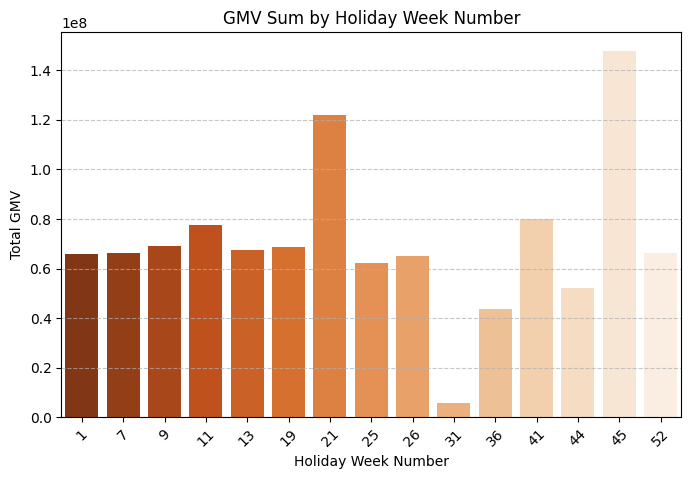

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='week_number', y='gmv', data=gmv_sum_by_week, palette='Oranges_r')

plt.xlabel('Holiday Week Number')
plt.ylabel('Total GMV')
plt.title('GMV Sum by Holiday Week Number')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
finally_ = final.copy()

<ipython-input-351-c883f60a7b8a>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




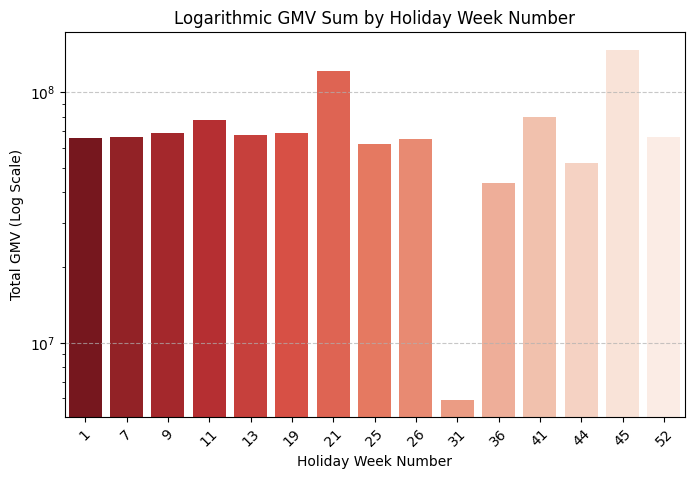

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='week_number', y='gmv', data=gmv_sum_by_week, palette='Reds_r')

plt.yscale('log')

plt.xlabel('Holiday Week Number')
plt.ylabel('Total GMV (Log Scale)')
plt.title('Logarithmic GMV Sum by Holiday Week Number')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

<ipython-input-352-86960434c90a>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




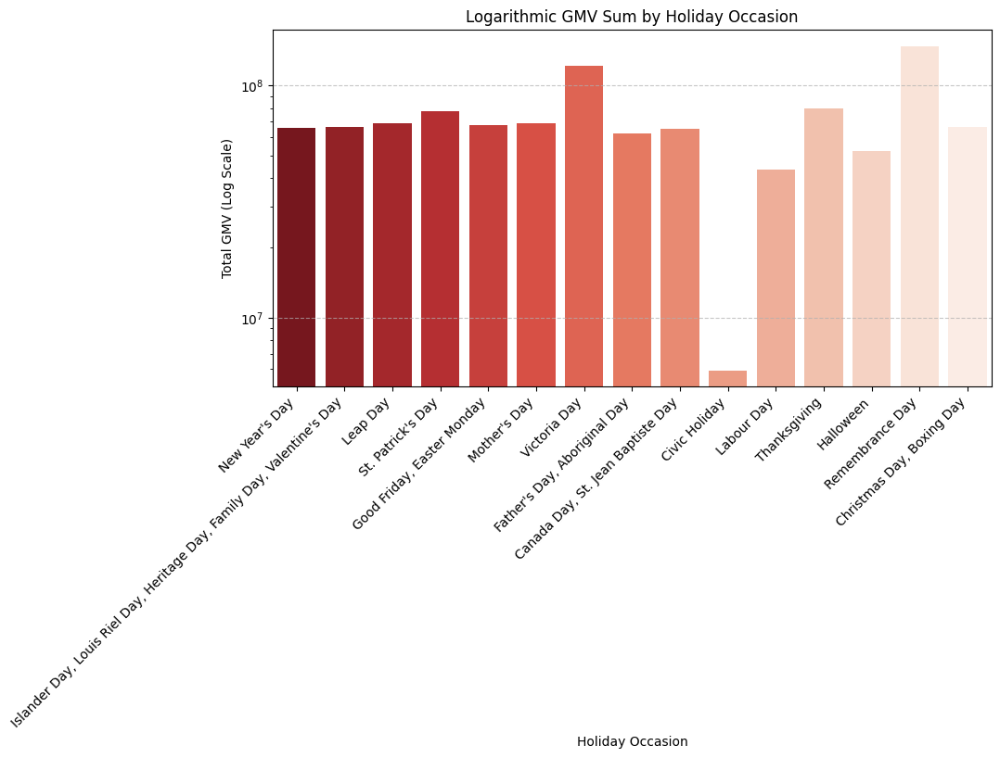

In [ ]:
gmv_sum_by_week['holiday_label'] = gmv_sum_by_week['week_number'].map(holiday_dict)

gmv_sum_by_week['holiday_label'] = gmv_sum_by_week['holiday_label'].apply(lambda x: ', '.join(x) if isinstance(x, list) else str(x))

plt.figure(figsize=(10, 5))
sns.barplot(x='holiday_label', y='gmv', data=gmv_sum_by_week, palette='Reds_r')

plt.yscale('log')

plt.xlabel('Holiday Occasion')
plt.ylabel('Total GMV (Log Scale)')
plt.title('Logarithmic GMV Sum by Holiday Occasion')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:

holiday = holiday.drop(columns='Day')
holiday

,Occassion,formatted_day,week_number
0,Canada Day,2023-07-01,26
1,Civic Holiday,2023-08-03,31
2,Labour Day,2023-09-07,36
3,Thanksgiving,2023-10-12,41
4,Halloween,2023-10-31,44
5,Remembrance Day,2023-11-11,45
6,Christmas Day,2023-12-25,52
7,Boxing Day,2023-12-26,52
8,New Year's Day,2024-01-01,1
9,Islander Day,2024-02-15,7


In [ ]:
def holiday_analysis(customer_data, holiday_data):
  customer_data['deliverybdays'] = customer_data['deliverybdays'].replace('\\N', 0)
  customer_data['deliverycdays'] = customer_data['deliverycdays'].replace('\\N', 0)

  customer_data[['Date', 'Time']] = customer_data.pop('order_date').str.split(' ', expand=True)

  def get_formatted_day(data):
    for i in range(0,23):
      date_str=data['Day'][i]
      date_obj=datetime.strptime(date_str,"%B %d, %Y")
      formatted_data=date_obj.strftime("%d-%m-%Y")
      data.loc[i, 'formatted_day'] = formatted_data

    return data

  holiday_data=get_formatted_day(holiday_data)

  holidays = list(holiday_data['formatted_day'])
  customer_data['isHoliday']=customer_data['Date'].isin(holidays).astype(int)

  holiday_data['week_number'] = holiday_data['formatted_day'].apply(lambda x: x.isocalendar().week)

In [ ]:
def getHolidayWeeks(holiday_data):
  holiday_dict = holiday_data.groupby('week_number')['Occassion'].apply(list).to_dict()
  holidays_week = holiday_data['week_number'].tolist()

  return holiday_dict, holidays_week

In [ ]:
def plotHolidaysVsRevenue(customer_data, holiday_data):
  holiday_dict, holidays_week = getHolidayWeeks(holiday_data)
  customer_data['week_number'] = customer_data['Date'].apply(lambda x: x.isocalendar().week)
  customer_data['gmv'] = customer_data['gmv'].astype(float)
  gmv_sum_by_week = customer_data[customer_data['week_number'].isin(holidays_week)].groupby('week_number')['gmv'].sum().reset_index()
  plt.figure(figsize=(8, 5))
  sns.barplot(x='week_number', y='gmv', data=gmv_sum_by_week, palette='Oranges_r')

  plt.xlabel('Holiday Week Number')
  plt.ylabel('Total GMV')
  plt.title('GMV Sum by Holiday Week Number')
  plt.xticks(rotation=45)
  plt.grid(axis='y', linestyle='--', alpha=0.7)

  plt.show()

In [ ]:
def plotLogHolidaysVsRevenue(customer_data, holiday_data):
  holiday_dict, holidays_week = getHolidayWeeks(holiday_data)
  customer_data['week_number'] = customer_data['Date'].apply(lambda x: x.isocalendar().week)
  customer_data['gmv'] = customer_data['gmv'].astype(float)
  gmv_sum_by_week['holiday_label'] = gmv_sum_by_week['week_number'].map(holiday_dict)
  gmv_sum_by_week['holiday_label'] = gmv_sum_by_week['holiday_label'].apply(lambda x: ', '.join(x) if isinstance(x, list) else str(x))
  plt.figure(figsize=(10, 5))
  sns.barplot(x='holiday_label', y='gmv', data=gmv_sum_by_week, palette='Reds_r')
  plt.yscale('log')
  plt.xlabel('Holiday Occasion')
  plt.ylabel('Total GMV (Log Scale)')
  plt.title('Logarithmic GMV Sum by Holiday Occasion')
  plt.xticks(rotation=45, ha='right')
  plt.grid(axis='y', linestyle='--', alpha=0.7)
  plt.show()

In [ ]:
customer_data=final.copy()
holiday_data=pd.read_excel('Canada Holiday List.xlsx')
SKU_details=pd.read_csv('SKU_details.csv')
customer_data.shape

(1431794, 35)

In [ ]:
final['date']

,date
0,2023-10-17
1,2023-10-19
2,2023-10-20
3,2023-10-14
4,2023-10-17
...,...
1431789,2023-09-27
1431790,2023-09-28
1431791,2023-09-29
1431792,2023-09-29


In [ ]:
def holiday_analysis(customer_data: pd.DataFrame, holiday_data: pd.DataFrame, SKU_details: pd.DataFrame):

    #customer_data[['Date', 'Time']] = customer_data.pop('order_date').astype(str).str.split(' ', expand=True)

    holiday_data['formatted_day'] = holiday_data['Day'].apply(lambda x: datetime.strptime(x, "%B %d, %Y").strftime("%d-%m-%Y"))

    holidays = list(holiday_data['formatted_day'])
    customer_data['isHoliday'] = customer_data['date'].isin(holidays).astype(int)

    holiday_data['formatted_day'] = holiday_data['Day'].apply(lambda x: datetime.strptime(x, "%B %d, %Y"))
    holiday_weeks = [date.isocalendar().week for date in holiday_data['formatted_day']]
    # Convert customer 'Date' column from string format "dd-mm-YYYY" to datetime
    customer_data['date'] = pd.to_datetime(customer_data['date'], format="%Y-%m-%d")

# Convert holiday_data 'Day' column to datetime objects and get the week numbers
    holiday_data['formatted_day'] = holiday_data['Day'].apply(lambda x: datetime.strptime(x, "%B %d, %Y"))
    holiday_weeks = holiday_data['formatted_day'].apply(lambda x: x.isocalendar().week).unique()

   # Mark customer_data['Holiday_Week'] as 1 if the week number is in holiday_weeks, else 0
    customer_data['Holiday_Week'] = customer_data['date'].dt.isocalendar().week.isin(holiday_weeks).astype(int)



    customer_data['gmv'] = pd.to_numeric(customer_data['gmv'], errors='coerce')

    gmv_summary = customer_data.groupby('Holiday_Week')['gmv'].sum()
    print(f"GMV on Non-Holiday Weeks: {gmv_summary.get(0, 0)}")
    print(f"GMV on Holiday Weeks: {gmv_summary.get(1, 0)}")

    volume_summary = customer_data.groupby('Holiday_Week')['Units_Sold'].mean()
    print(f"Average Volume on Non-Holiday Weeks: {volume_summary.get(0, 0)}")
    print(f"Average Volume on Holiday Weeks: {volume_summary.get(1, 0)}")

    avg_gmv_summary = customer_data.groupby('Holiday_Week')['gmv'].mean()
    print(f"Average GMV on Non-Holiday Weeks: {avg_gmv_summary.get(0, 0)}")
    print(f"Average GMV on Holiday Weeks: {avg_gmv_summary.get(1, 0)}")


    return customer_data


In [ ]:
#holiday_week_df = customer_data[customer_data['Holiday_Week'] == 1]
holiday_week_df.columns


Index(['fsn_id', 'order_id', 'order_item_id', 'gmv', 'Units_Sold',
       'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla',
       'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', 'date',
       'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday', 'Order Hour',
       'total_delivery_days', 'list_price', 'Discount', 'product_type',
       'purchase_frequency', 'average_order_value', 'Sale_Period_Flag',
       'isPaydayWeek', 'isHolidayWeek', 'isHoliday',
       'product_analytic_super_category_x', 'product_analytic_category_x',
       'product_analytic_sub_category_x', 'product_analytic_vertical_x',
       'week_number', 'Holiday_Week', 'product_analytic_super_category_y',
       'product_analytic_category_y', 'product_analytic_sub_category_y',
       'product_analytic_vertical_y'],
      dtype='object')

The categorical volume summary for holidays:
 product_analytic_category_x
Camera                 24525
CameraAccessory        70597
EntertainmentSmall    254018
GameCDDVD              29329
GamingHardware         64944
Name: Units_Sold, dtype: int64


<ipython-input-412-c8c967847ef7>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




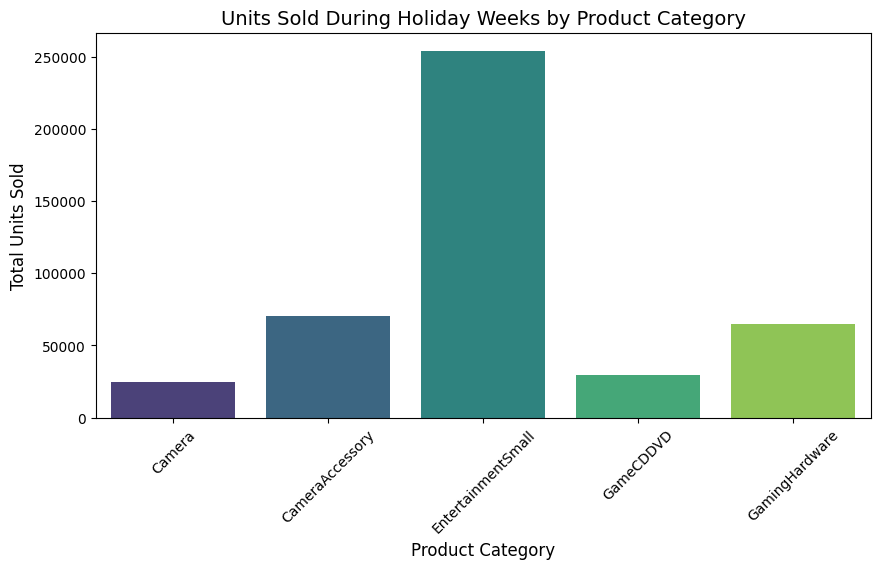

    week_number           gmv
0             1  6.596710e+07
1             7  6.626728e+07
2             9  6.896777e+07
3            11  7.755740e+07
4            13  6.745373e+07
5            19  6.888162e+07
6            21  1.220187e+08
7            25  6.202869e+07
8            26  6.502858e+07
9            31  5.923317e+06
10           36  4.358207e+07
11           41  7.987180e+07
12           44  5.228196e+07
13           45  1.479022e+08
14           52  6.634798e+07


<ipython-input-412-c8c967847ef7>:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




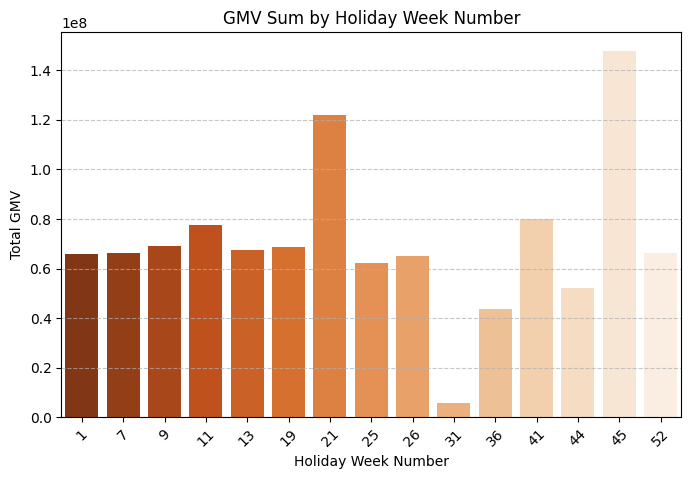

<ipython-input-412-c8c967847ef7>:36: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




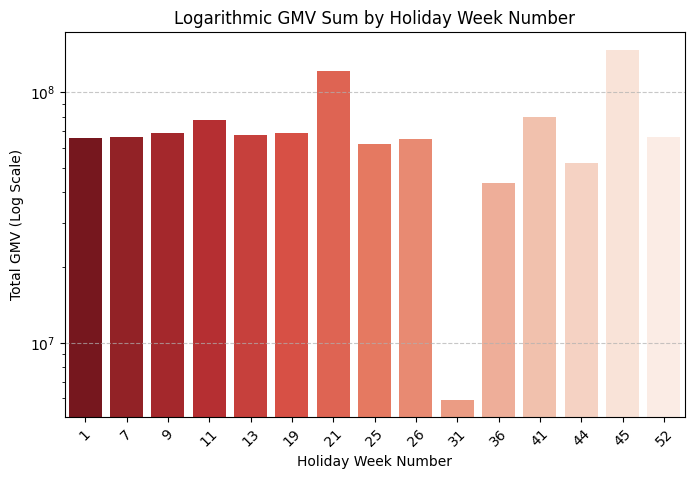

<ipython-input-412-c8c967847ef7>:51: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




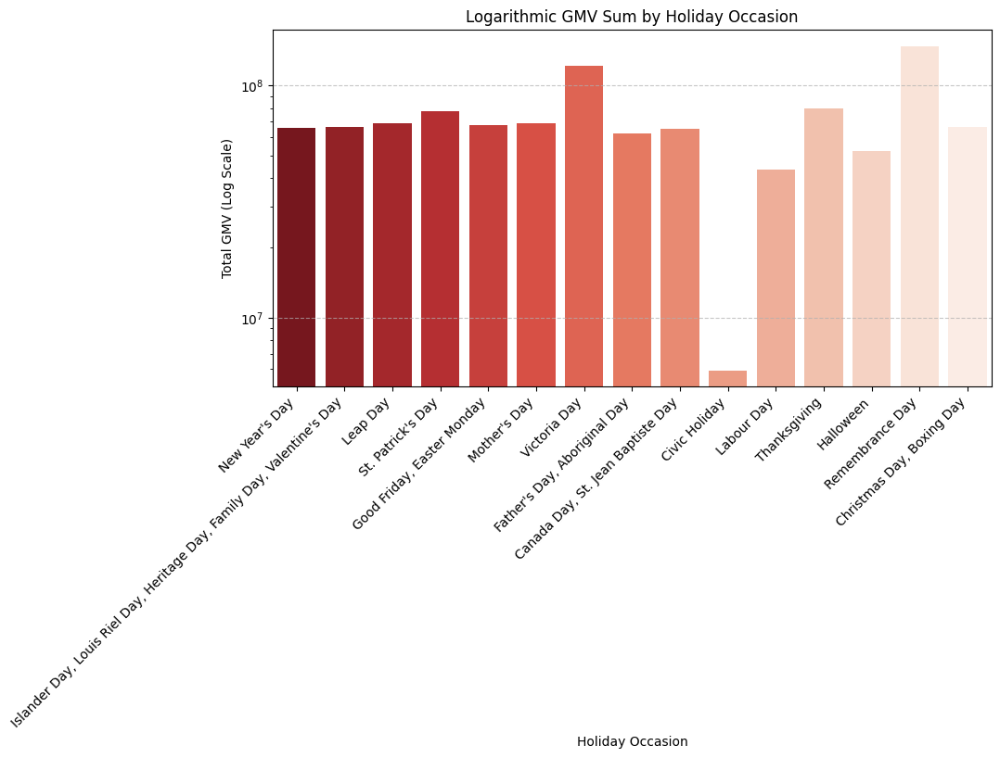

In [ ]:
#merge SKU details
customer_data = customer_data.merge(SKU_details, on='fsn_id', how='inner')

holiday_week_df = customer_data[customer_data['Holiday_Week'] == 1]
holiday_volume_summary = holiday_week_df.groupby('product_analytic_category_x')['Units_Sold'].sum()
print("The categorical volume summary for holidays:\n", holiday_volume_summary)

#categorical sales summary
plt.figure(figsize=(10, 5))
sns.barplot(x=holiday_volume_summary.index, y=holiday_volume_summary.values, palette="viridis")
plt.xlabel("Product Category", fontsize=12)
plt.ylabel("Total Units Sold", fontsize=12)
plt.title("Units Sold During Holiday Weeks by Product Category", fontsize=14)
plt.xticks(rotation=45)
plt.show()

# map weeks in customer data
customer_data['week_number'] = customer_data['date'].apply(lambda x: x.isocalendar().week)

# GMV sum by holiday week
gmv_sum_by_week = customer_data[customer_data['week_number'].isin(holidays_week)].groupby('week_number')['gmv'].sum().reset_index()
print(gmv_sum_by_week)

# GMV sum by holiday week plot
plt.figure(figsize=(8, 5))
sns.barplot(x='week_number', y='gmv', data=gmv_sum_by_week, palette='Oranges_r')
plt.xlabel('Holiday Week Number')
plt.ylabel('Total GMV')
plt.title('GMV Sum by Holiday Week Number')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#log scale GMV plot
plt.figure(figsize=(8, 5))
sns.barplot(x='week_number', y='gmv', data=gmv_sum_by_week, palette='Reds_r')
plt.yscale('log')
plt.xlabel('Holiday Week Number')
plt.ylabel('Total GMV (Log Scale)')
plt.title('Logarithmic GMV Sum by Holiday Week Number')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#map GMV to holidays
gmv_sum_by_week['holiday_label'] = gmv_sum_by_week['week_number'].map(holiday_dict)
gmv_sum_by_week['holiday_label'] = gmv_sum_by_week['holiday_label'].apply(lambda x: ', '.join(x) if isinstance(x, list) else str(x))

#GMV by holiday plot
plt.figure(figsize=(10, 5))
sns.barplot(x='holiday_label', y='gmv', data=gmv_sum_by_week, palette='Reds_r')
plt.yscale('log')
plt.xlabel('Holiday Occasion')
plt.ylabel('Total GMV (Log Scale)')
plt.title('Logarithmic GMV Sum by Holiday Occasion')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
holiday_analysis(customer_data,holiday_data,SKU_details)

<ipython-input-407-d9f64b556d32>:8: FutureWarning:

The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.



GMV on Non-Holiday Weeks: 2475874637.348834
GMV on Holiday Weeks: 1060080185.4864914
Average Volume on Non-Holiday Weeks: 1.0195982450051457
Average Volume on Holiday Weeks: 1.0196496408105449
Average GMV on Non-Holiday Weeks: 2483.508943842205
Average GMV on Holiday Weeks: 2437.7056612270653


,fsn_id,order_id,order_item_id,gmv,Units_Sold,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,...,Sale_Period_Flag,isPaydayWeek,isHolidayWeek,isHoliday,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,week_number,Holiday_Week
0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,1.012991e+18,...,1,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod,42,0
1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,8.990325e+18,...,1,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod,42,0
2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,1.040443e+18,...,1,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod,42,0
3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,7.604961e+18,...,1,1,1,0,CE,CameraAccessory,CameraAccessory,CameraTripod,41,1
4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,2.894557e+18,...,1,0,0,0,CE,CameraAccessory,CameraAccessory,CameraTripod,42,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1431789,VPLEYAP3ZYYUVESU,4.402170e+15,4.402170e+15,2200.0,1,0.0,0.0,COD,7,9.906343e+17,...,1,1,0,0,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,39,0
1431790,VPLEYAP3ZYYUVESU,1.402393e+15,1.402393e+15,2098.0,1,0.0,0.0,COD,10,3.048923e+18,...,1,1,0,0,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,39,0
1431791,VPLEYAP3ZYYUVESU,4.403460e+15,4.403460e+15,2098.0,1,0.0,0.0,COD,5,4.531404e+18,...,1,1,0,0,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,39,0
1431792,VPLEYAP3ZYYUVESU,4.403860e+15,4.403860e+15,2200.0,1,0.0,0.0,COD,3,8.940464e+18,...,1,1,0,0,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,39,0


In [ ]:
nps = pd.read_excel("Media data-Sale Calendar-NPS Scores_Data.xlsx", sheet_name="Monthly NPS Score", skiprows = 1)
nps = nps.T
nps

,0,1
Unnamed: 0,NPS,Stock Index
July'23,54.599588,1177.0
Aug'23,59.987101,1206.0
Sept'23,46.925419,1101.0
Oct'23,44.398389,1210.0
Nov'23,47.0,1233.0
Dec'23,45.8,1038.0
Jan'24,47.093031,1052.0
Feb'24,50.327406,1222.0
Mar'24,49.02055,1015.0


In [ ]:
nps['Month'] = nps[0]
nps.head()

,0,1,Month
Unnamed: 0,NPS,Stock Index,NPS
July'23,54.599588,1177.0,54.599588
Aug'23,59.987101,1206.0,59.987101
Sept'23,46.925419,1101.0,46.925419
Oct'23,44.398389,1210.0,44.398389


##Product_hirarchy_details


In [ ]:
product_hierarchy=pd.read_csv('Product_Hierarchy_Details.csv')
product_hierarchy.replace({' ': np.nan, '\\N': np.nan}, inplace=True)
customer_orders=preprocessed_data.copy()
customer_orders.replace({' ': np.nan, '\\N': np.nan}, inplace=True)
sku=pd.read_csv('SKU_details.csv')
sku.replace({' ': np.nan, '\\N': np.nan}, inplace=True)

In [ ]:
merged_df = customer_orders.merge(sku[['fsn_id', 'product_analytic_category']], on='fsn_id', how='left')
merged_df['gmv'] = pd.to_numeric(merged_df['gmv'], errors='coerce')
merged_df['gmv'] = merged_df.groupby('product_analytic_category')['gmv'].transform(lambda x: x.fillna(x.median()))

In [ ]:
category_gmv=merged_df.drop(['Unnamed: 0','units','order_id', 'order_item_id', 'deliverybdays','deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', ],axis=1)
category_gmv['gmv'] = pd.to_numeric(category_gmv['gmv'], errors='coerce')
category_gmv_grouped = category_gmv.groupby('product_analytic_category', as_index=False)['gmv'].sum()
category_gmv_grouped

,product_analytic_category,gmv
0,Camera,1.548167e+09
1,CameraAccessory,2.589979e+08
2,EntertainmentSmall,1.163520e+09
3,GameCDDVD,1.763779e+08
4,GamingHardware,3.888914e+08


### Luxury Vs Mass-Product Sales

In [ ]:
import numpy as np

# Ensure GMV is numeric
merged_df['gmv'] = pd.to_numeric(merged_df['gmv'], errors='coerce')

# Compute the 80th percentile GMV threshold
threshold = np.percentile(merged_df['gmv'].dropna(), 80)

# Assign Product Type based on GMV
merged_df['Product_Type'] = merged_df['gmv'].apply(lambda x: 'Luxury' if x > threshold else 'Mass-market')

# Display results
print(merged_df[['fsn_id', 'gmv', 'Product_Type']])

                   fsn_id     gmv Product_Type
0        ACCCX3S58G7B5F6P  6400.0       Luxury
1        ACCCX3S58G7B5F6P  6900.0       Luxury
2        ACCCX3S5AHMF55FV  1990.0  Mass-market
3        ACCCX3S5AHMF55FV  1690.0  Mass-market
4        ACCCX3S5AHMF55FV  1618.0  Mass-market
...                   ...     ...          ...
1431789  VPLEYAP3ZYYUVESU  2200.0  Mass-market
1431790  VPLEYAP3ZYYUVESU  2098.0  Mass-market
1431791  VPLEYAP3ZYYUVESU  2098.0  Mass-market
1431792  VPLEYAP3ZYYUVESU  2200.0  Mass-market
1431793  VPLEYAP3ZYYUVESU  2295.0  Mass-market

[1431794 rows x 3 columns]


In [ ]:
sales_summary = merged_df.groupby('Product_Type', as_index=False)['gmv'].sum()
sales_summary

,Product_Type,gmv
0,Luxury,2.648606e+09
1,Mass-market,8.873483e+08


<ipython-input-424-72e2dea894c1>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




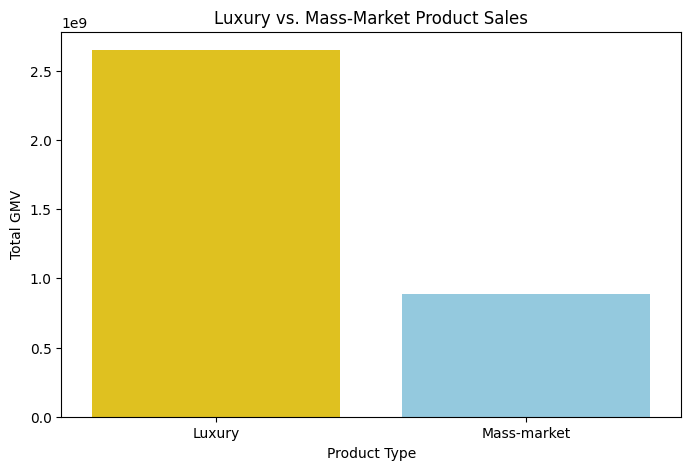

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(data=sales_summary, x='Product_Type', y='gmv', palette=['gold', 'skyblue'])
plt.xlabel('Product Type')
plt.ylabel('Total GMV')
plt.title('Luxury vs. Mass-Market Product Sales')
plt.show()

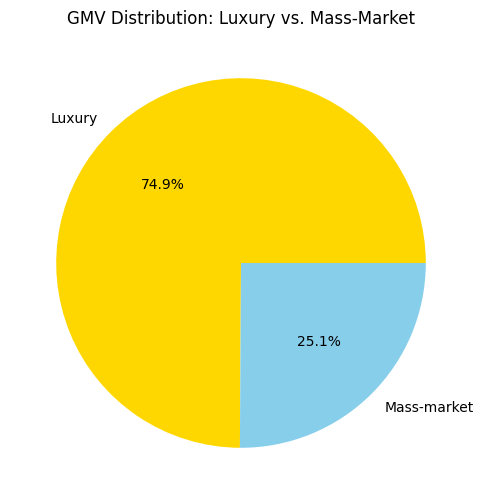

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(sales_summary['gmv'], labels=sales_summary['Product_Type'], autopct='%1.1f%%', colors=['gold', 'skyblue'])
plt.title('GMV Distribution: Luxury vs. Mass-Market')
plt.show()

### product Category

<ipython-input-426-887055c7b50a>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




Text(0.5, 1.0, 'GMV by Product Category')

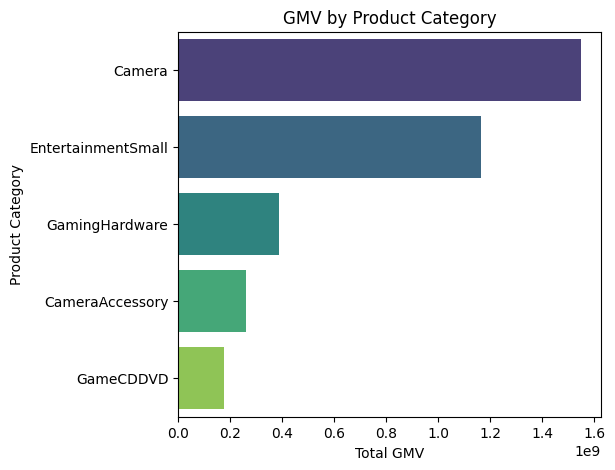

In [ ]:
category_gmv_grouped = category_gmv_grouped.sort_values(by='gmv', ascending=False)

# Set figure size
plt.figure(figsize=(12, 5))

# Bar chart
plt.subplot(1, 2, 1)
sns.barplot(data=category_gmv_grouped, x='gmv', y='product_analytic_category', palette='viridis')
plt.xlabel('Total GMV')
plt.ylabel('Product Category')
plt.title('GMV by Product Category')

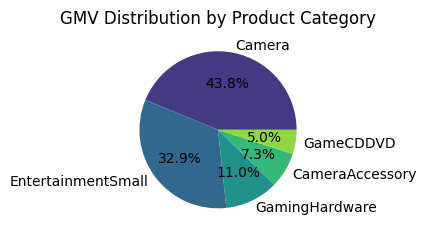

In [ ]:
plt.subplot(1, 2, 2)
plt.pie(category_gmv_grouped['gmv'], labels=category_gmv_grouped['product_analytic_category'], autopct='%1.1f%%', colors=sns.color_palette("viridis", len(category_gmv_grouped)))
plt.title('GMV Distribution by Product Category')

# Show plots
plt.tight_layout()
plt.show()

###Discount on Different Categories

In [ ]:
# Replace 0 with median product_mrp within the same category
merged_df.loc[merged_df['product_mrp'] == 0, 'product_mrp'] = merged_df.groupby('product_analytic_category')['product_mrp'].transform(lambda x: x.replace(0, x.median()))

In [ ]:
# Ensure product_mrp and list_price are numeric
merged_df['product_mrp'] = pd.to_numeric(merged_df['product_mrp'], errors='coerce')
merged_df['list_price'] = pd.to_numeric(merged_df['gmv'] / merged_df['units'], errors='coerce')  # Assuming GMV = list_price * units

# Calculate Discount Percentage
merged_df['Discount%'] = 100 * (merged_df['product_mrp'] - merged_df['list_price']) / merged_df['product_mrp']

# Display relevant columns
print(merged_df[['fsn_id', 'product_mrp', 'list_price', 'Discount%']])

                   fsn_id  product_mrp  list_price  Discount%
0        ACCCX3S58G7B5F6P         7190      6400.0  10.987483
1        ACCCX3S58G7B5F6P         7190      6900.0   4.033380
2        ACCCX3S5AHMF55FV         2099      1990.0   5.192949
3        ACCCX3S5AHMF55FV         2099      1690.0  19.485469
4        ACCCX3S5AHMF55FV         2099      1618.0  22.915674
...                   ...          ...         ...        ...
1431789  VPLEYAP3ZYYUVESU         2499      2200.0  11.964786
1431790  VPLEYAP3ZYYUVESU         2499      2098.0  16.046419
1431791  VPLEYAP3ZYYUVESU         2499      2098.0  16.046419
1431792  VPLEYAP3ZYYUVESU         2499      2200.0  11.964786
1431793  VPLEYAP3ZYYUVESU         2499      2295.0   8.163265

[1431794 rows x 4 columns]


In [ ]:
category_discount = merged_df.groupby('product_analytic_category', as_index=False).agg(
    {'Discount%': 'mean', 'gmv': 'sum'}
).sort_values(by='Discount%', ascending=False)
category_discount

,product_analytic_category,Discount%,gmv
1,CameraAccessory,49.703437,2.589979e+08
2,EntertainmentSmall,45.811226,1.163520e+09
4,GamingHardware,43.375384,3.888914e+08
0,Camera,32.696597,1.548167e+09
3,GameCDDVD,30.992120,1.763779e+08


<ipython-input-431-23619094a55c>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




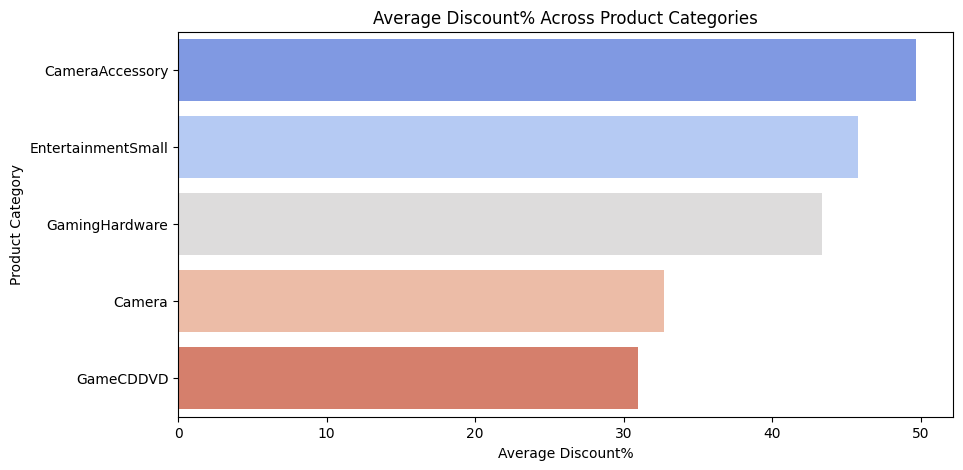

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(data=category_discount, x='Discount%', y='product_analytic_category', palette='coolwarm')
plt.xlabel('Average Discount%')
plt.ylabel('Product Category')
plt.title('Average Discount% Across Product Categories')
plt.show()

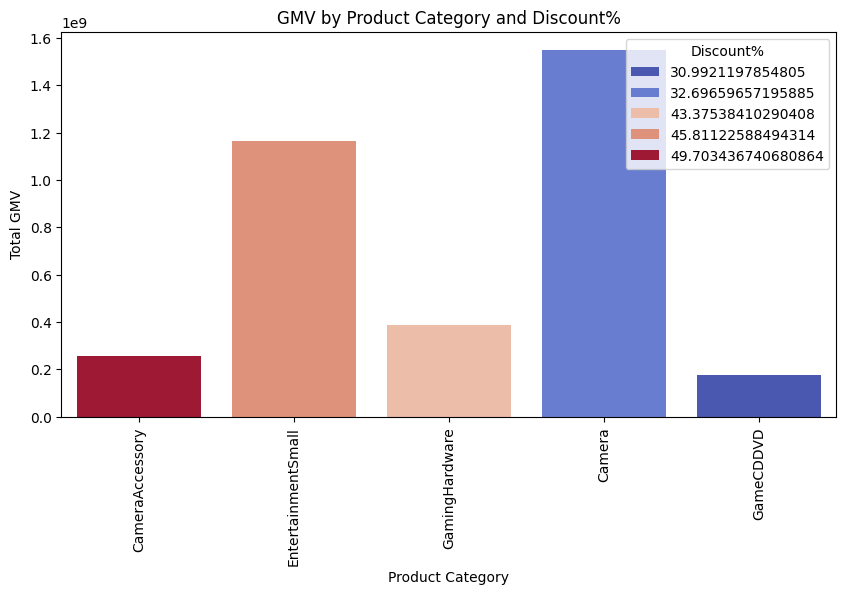

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(data=category_discount, x='product_analytic_category', y='gmv', hue='Discount%', palette='coolwarm')
plt.xticks(rotation=90)
plt.xlabel('Product Category')
plt.ylabel('Total GMV')
plt.title('GMV by Product Category and Discount%')
plt.legend(title="Discount%")
plt.show()

###**Feature Engineering**

####Product Category Performance Score = (Total Revenue from Category)/ (Total Units Sold)

In [ ]:
# Calculate Performance Score
category_performance = merged_df.groupby('product_analytic_category', as_index=False).agg(
    {'gmv': 'sum', 'units': 'sum'}
)

# Avoid division by zero
category_performance['Performance_Score'] = category_performance['gmv'] / category_performance['units']
category_performance = category_performance.sort_values(by='Performance_Score', ascending=False)

# Display results
category_performance

,product_analytic_category,gmv,units,Performance_Score
0,Camera,1.548167e+09,86695,17857.632920
3,GameCDDVD,1.763779e+08,95824,1840.644691
4,GamingHardware,3.888914e+08,213314,1823.093588
2,EntertainmentSmall,1.163520e+09,835530,1392.553370
1,CameraAccessory,2.589979e+08,228514,1133.400568


<ipython-input-434-ac44aeeea336>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




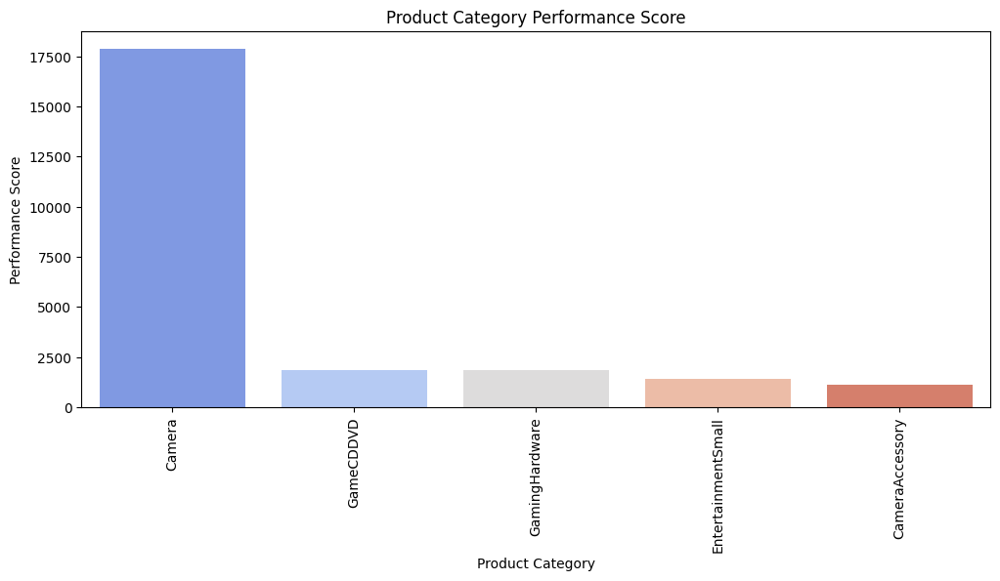

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 5))
sns.barplot(data=category_performance, x='product_analytic_category', y='Performance_Score', palette='coolwarm')
plt.xticks(rotation=90)
plt.xlabel('Product Category')
plt.ylabel('Performance Score')
plt.title('Product Category Performance Score')
plt.show()

**Top 10% Best-Selling Products = Based on revenue percentile**

In [ ]:
import numpy as np

# Calculate the 90th percentile threshold for GMV
threshold = np.percentile(merged_df['gmv'], 90)

# Identify the top 10% best-selling products
top_products = merged_df[merged_df['gmv'] >= threshold]

In [ ]:
top_products_agg = top_products.groupby('fsn_id', as_index=False).agg({'gmv': 'sum'}).sort_values(by='gmv', ascending=False)

<ipython-input-437-618b1a6a81d6>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




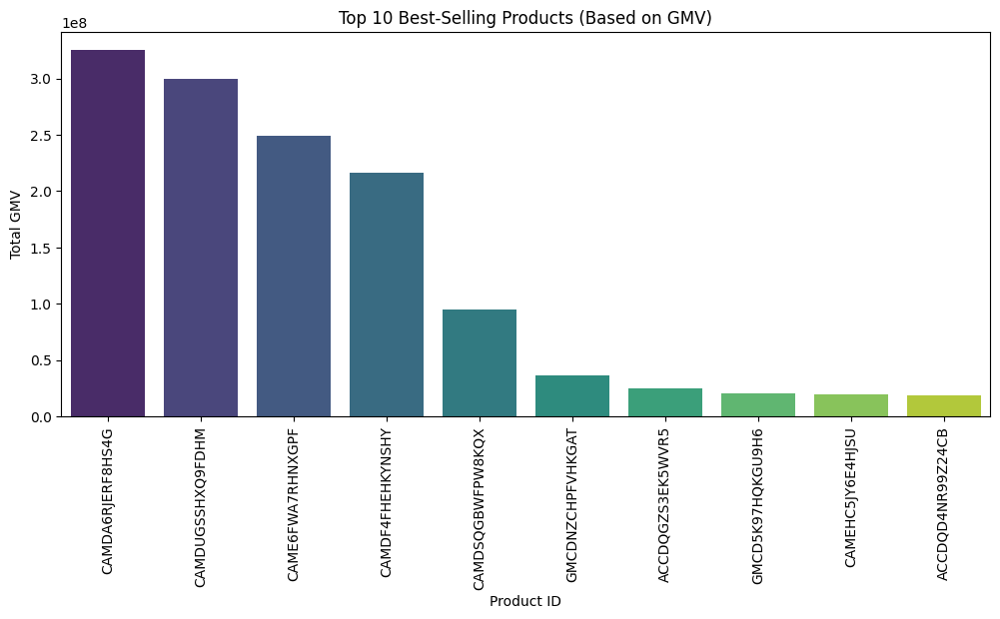

In [ ]:
plt.figure(figsize=(12, 5))
sns.barplot(data=top_products_agg.head(10), x='fsn_id', y='gmv', palette='viridis')
plt.xticks(rotation=90)
plt.xlabel('Product ID')
plt.ylabel('Total GMV')
plt.title('Top 10 Best-Selling Products (Based on GMV)')
plt.show()

###Plots

In [ ]:
# Create a flag for High-Discount Products
merged_df['High_Discount_Flag'] = (merged_df['Discount%'] > 50).astype(int)

# Check distribution
merged_df['High_Discount_Flag'].value_counts()

,count
High_Discount_Flag,
0,805452
1,626342


<ipython-input-439-a5289dea6b71>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




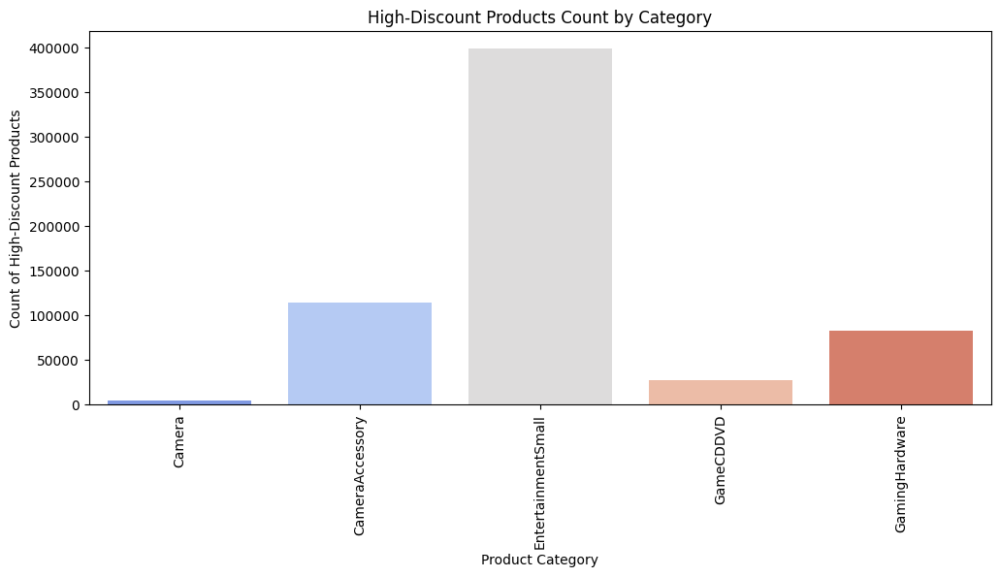

In [ ]:
category_discount_count = merged_df.groupby('product_analytic_category')['High_Discount_Flag'].sum().reset_index()

plt.figure(figsize=(12, 5))
sns.barplot(data=category_discount_count, x='product_analytic_category', y='High_Discount_Flag', palette='coolwarm')
plt.xticks(rotation=90)
plt.xlabel('Product Category')
plt.ylabel('Count of High-Discount Products')
plt.title('High-Discount Products Count by Category')
plt.show()

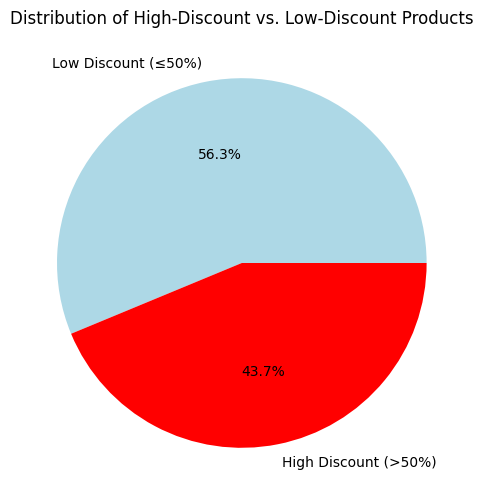

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(merged_df['High_Discount_Flag'].value_counts(), labels=['Low Discount (≤50%)', 'High Discount (>50%)'], autopct='%1.1f%%', colors=['lightblue', 'red'])
plt.title('Distribution of High-Discount vs. Low-Discount Products')
plt.show()

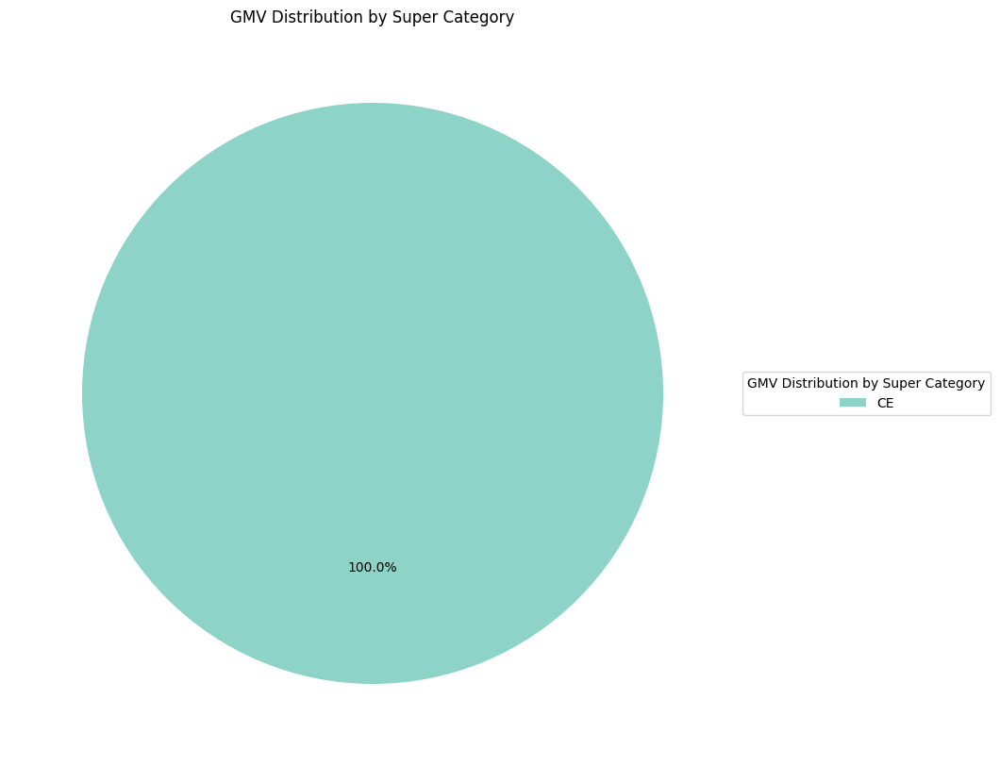

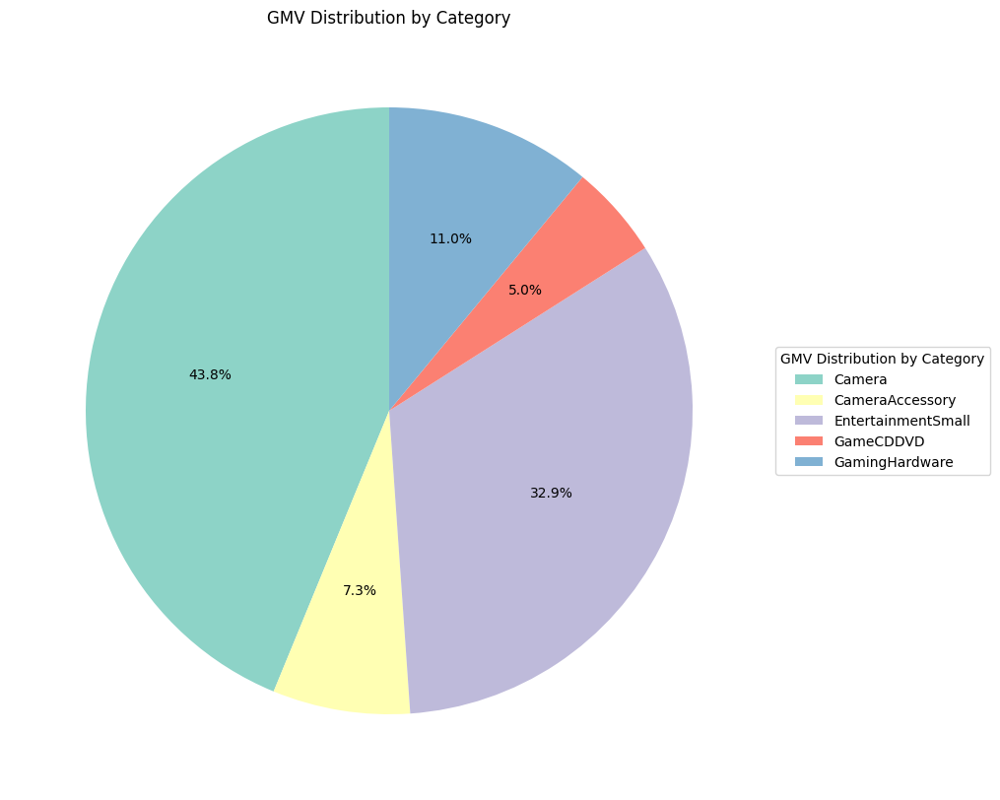

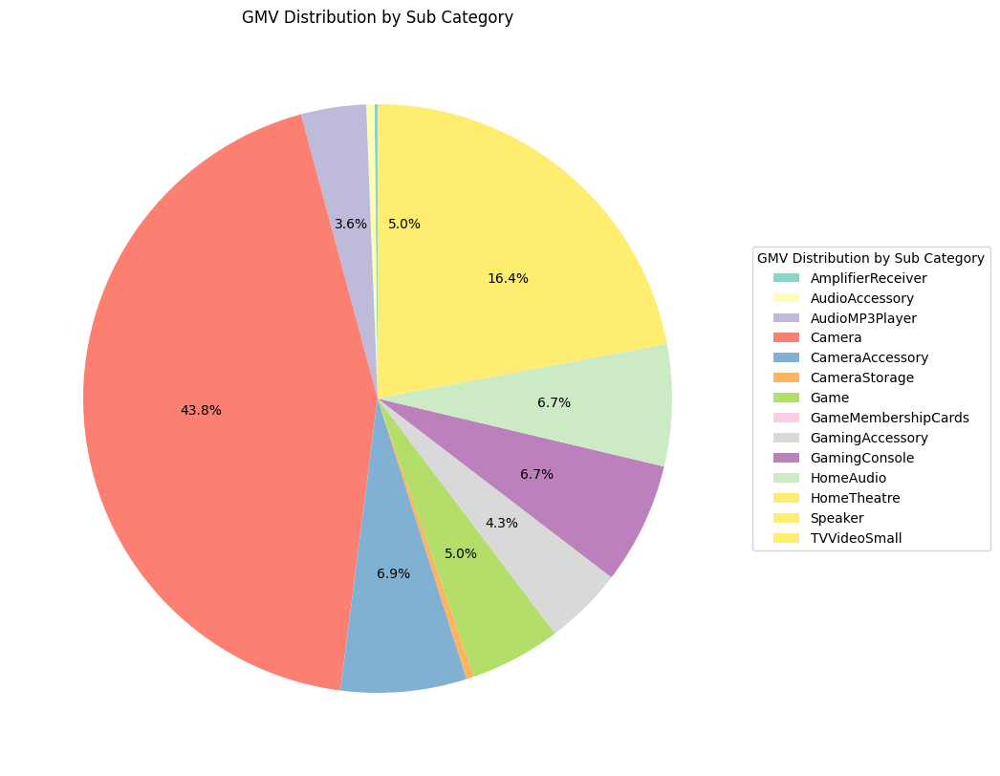

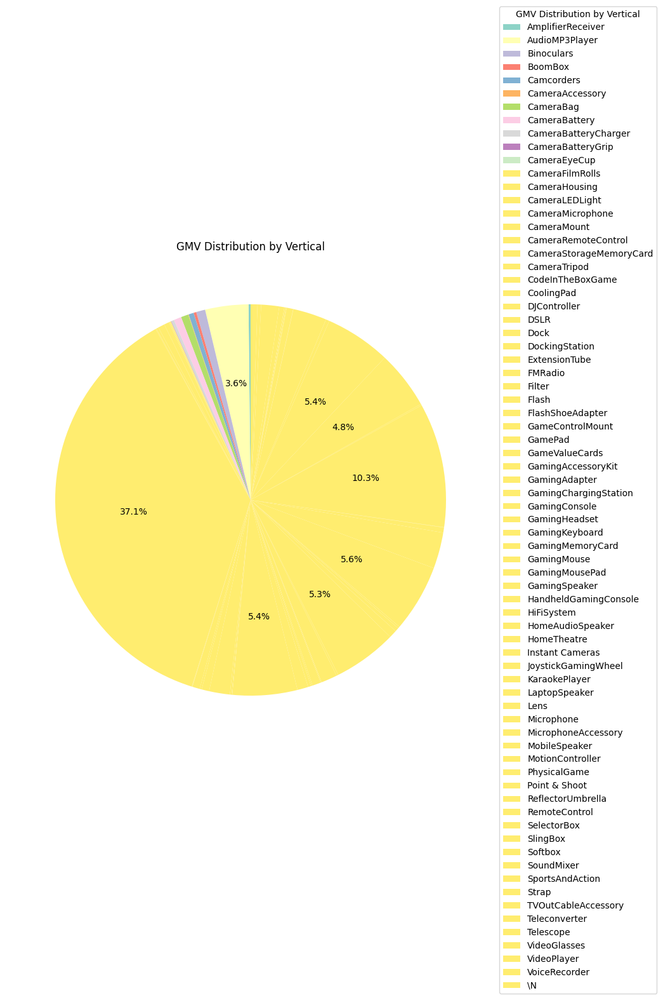

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Group by different category levels and calculate GMV sum
grouped_super =final.groupby("product_analytic_super_category")["gmv"].sum()
grouped_category = final.groupby("product_analytic_category")["gmv"].sum()
grouped_sub_category = final.groupby("product_analytic_sub_category")["gmv"].sum()
grouped_vertical = final.groupby("product_analytic_vertical")["gmv"].sum()

# Function to plot pie charts with legends
def plot_pie(data, title):

    def autopct_format(pct):
        return f"{pct:.1f}%" if pct >= 3.1 else ""

    plt.figure(figsize=(10, 10))

    # Generate colors manually using viridis colormap
    colors = plt.get_cmap("Set3")(range(len(data)))

    wedges, texts, autotexts = plt.pie(
        data, labels=None, autopct=autopct_format, startangle=90, colors=colors
    )

    # Adding legend with labels
    plt.legend(data.index, title=title, loc="center left", bbox_to_anchor=(1, 0.5))

    plt.title(title)
    plt.ylabel("")  # Hide y-label
    plt.show()

# Plot Pie Charts
plot_pie(grouped_super, "GMV Distribution by Super Category")
plot_pie(grouped_category, "GMV Distribution by Category")
plot_pie(grouped_sub_category, "GMV Distribution by Sub Category")
plot_pie(grouped_vertical, "GMV Distribution by Vertical")


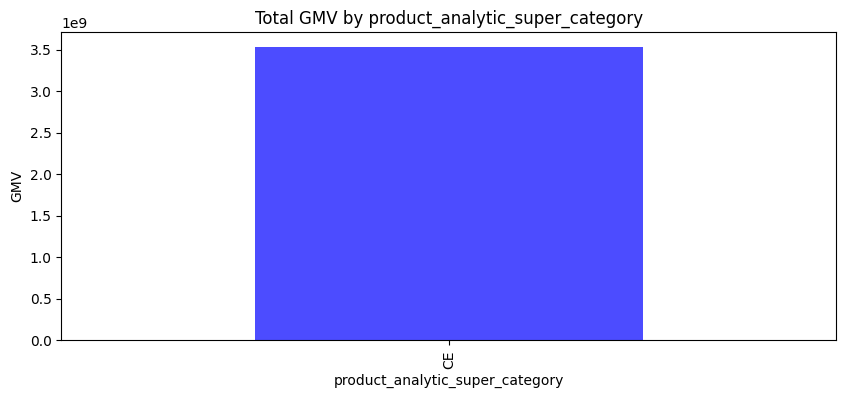

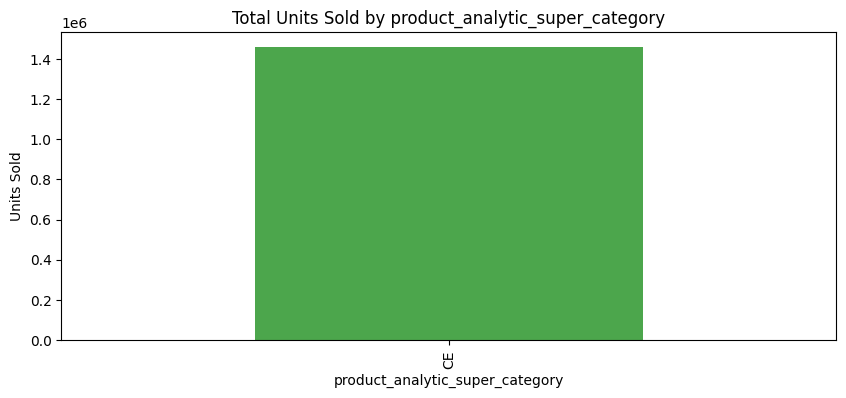

🔹 Top-Performing product_analytic_super_category: CE (GMV: 3535954822.84)
🔹 Bottom-Performing product_analytic_super_category: CE (GMV: 3535954822.84)
🔹 Average Product MRP by product_analytic_super_category:
 product_analytic_super_category
CE    4209.984387
Name: product_mrp, dtype: float64


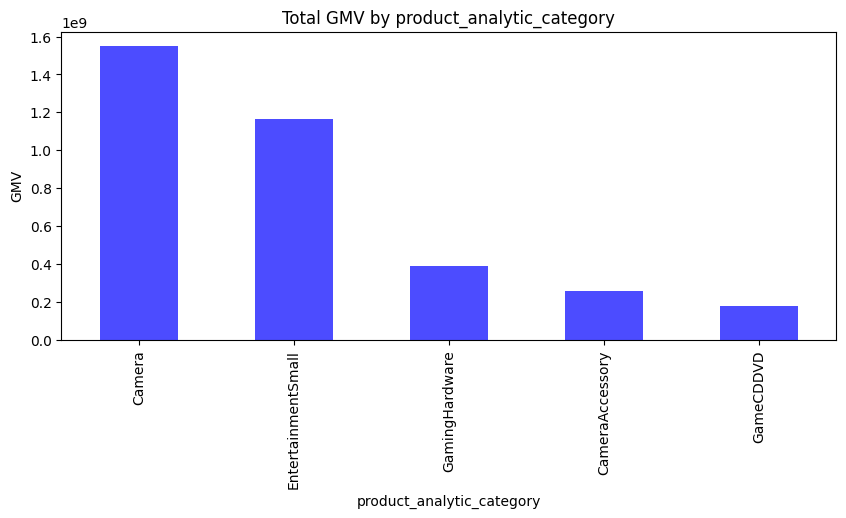

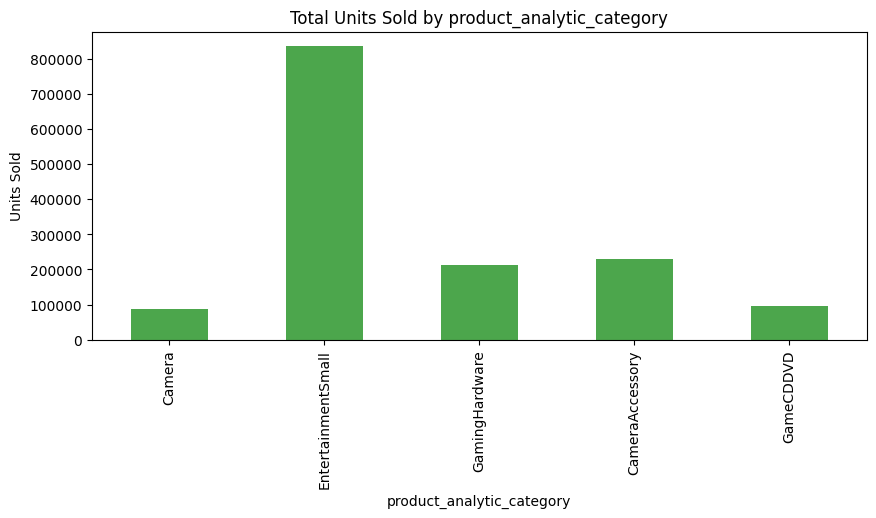

🔹 Top-Performing product_analytic_category: Camera (GMV: 1548167485.97)
🔹 Bottom-Performing product_analytic_category: GameCDDVD (GMV: 176377936.84)
🔹 Average Product MRP by product_analytic_category:
 product_analytic_category
Camera                27816.221076
EntertainmentSmall     2722.856309
GamingHardware         3204.043035
CameraAccessory        2164.691461
GameCDDVD              2778.512634
Name: product_mrp, dtype: float64


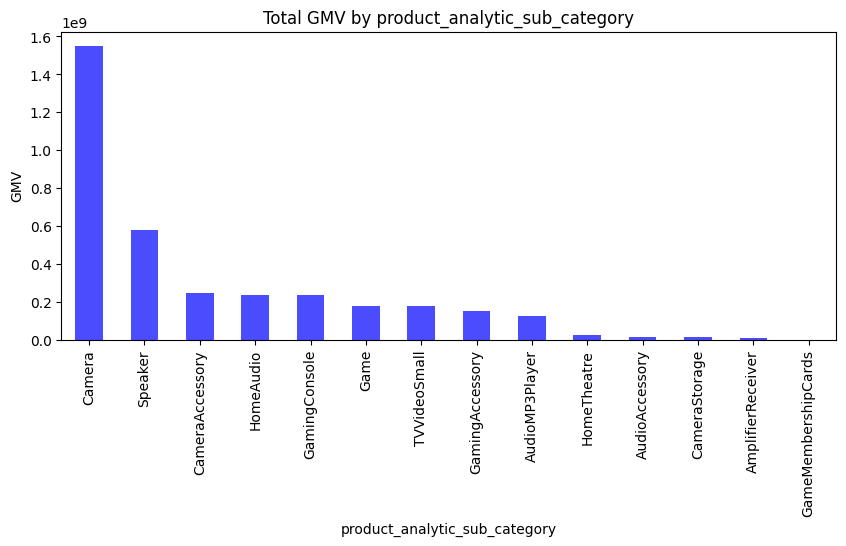

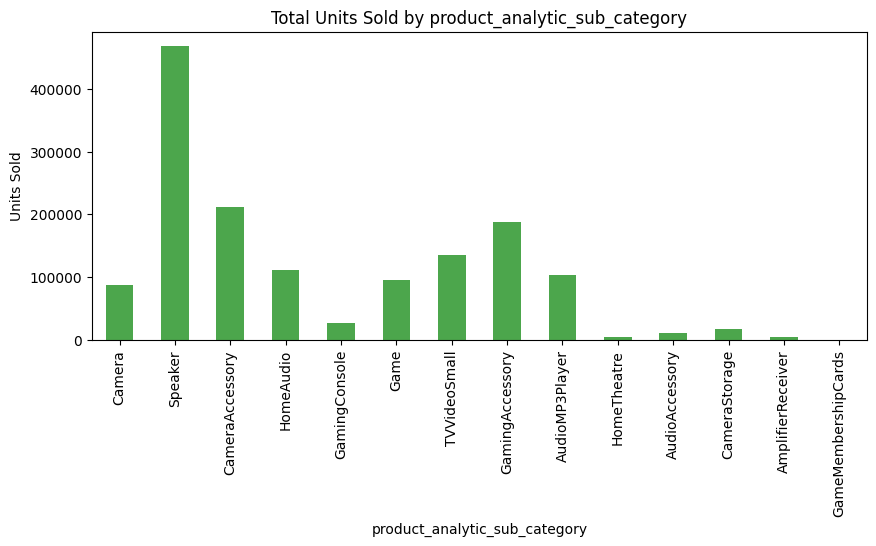

🔹 Top-Performing product_analytic_sub_category: Camera (GMV: 1548167485.97)
🔹 Bottom-Performing product_analytic_sub_category: GameMembershipCards (GMV: 40264.00)
🔹 Average Product MRP by product_analytic_sub_category:
 product_analytic_sub_category
Camera                 27816.221076
Speaker                 2540.025258
CameraAccessory         2188.692491
HomeAudio               3788.285406
GamingConsole          11475.548688
Game                    2780.118232
TVVideoSmall            2295.598854
GamingAccessory         2029.854823
AudioMP3Player          2735.523030
HomeTheatre             8906.085528
AudioAccessory          2240.491893
CameraStorage           1855.028371
AmplifierReceiver       3073.572725
GameMembershipCards     1014.376471
Name: product_mrp, dtype: float64


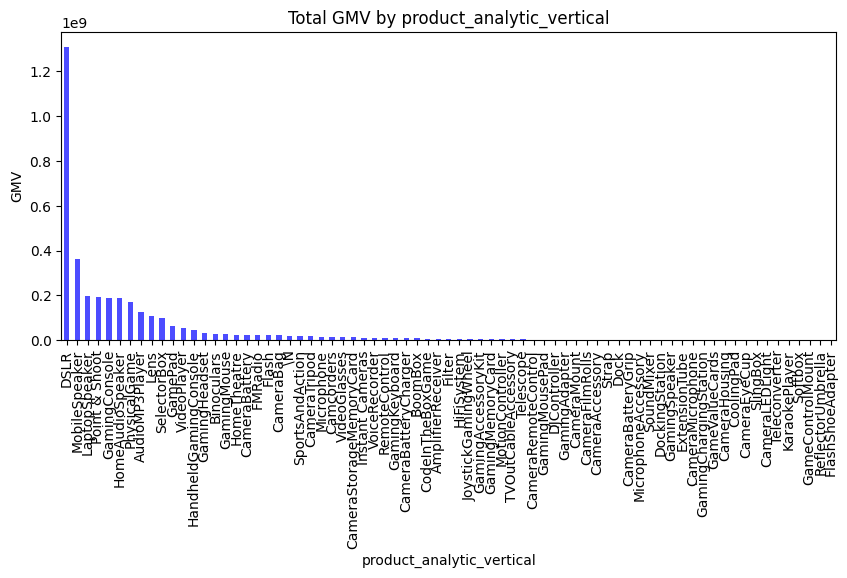

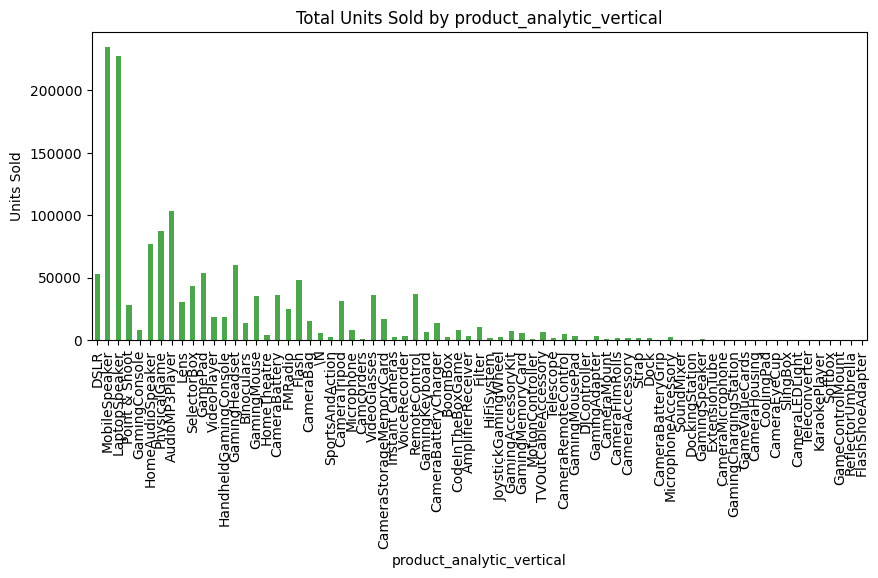

🔹 Top-Performing product_analytic_vertical: DSLR (GMV: 1310340400.23)
🔹 Bottom-Performing product_analytic_vertical: FlashShoeAdapter (GMV: 450.00)
🔹 Average Product MRP by product_analytic_vertical:
 product_analytic_vertical
DSLR                 39384.696411
MobileSpeaker         3155.340828
LaptopSpeaker         1725.076918
Point & Shoot         8839.034491
GamingConsole        28911.858564
                         ...     
KaraokePlayer        10000.000000
Softbox               1204.666667
GameControlMount      3499.000000
ReflectorUmbrella      699.000000
FlashShoeAdapter       390.000000
Name: product_mrp, Length: 73, dtype: float64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of category levels
category_levels = ["product_analytic_super_category",
                   "product_analytic_category",
                   "product_analytic_sub_category",
                   "product_analytic_vertical"]

# Function to analyze GMV, Units Sold, and Avg MRP
def analyze_category(category):
    grouped = final.groupby(category).agg({"gmv": "sum", "Units_Sold": "sum", "product_mrp": "mean"})
    grouped = grouped.sort_values(by="gmv", ascending=False)  # Sort by GMV

    # Plot GMV bar chart
    plt.figure(figsize=(10, 4))
    grouped["gmv"].plot(kind="bar", color="blue", alpha=0.7)
    plt.title(f"Total GMV by {category}")
    plt.ylabel("GMV")
    plt.xticks(rotation=90)
    plt.show()

    # Plot Units Sold bar chart
    plt.figure(figsize=(10, 4))
    grouped["Units_Sold"].plot(kind="bar", color="green", alpha=0.7)
    plt.title(f"Total Units Sold by {category}")
    plt.ylabel("Units Sold")
    plt.xticks(rotation=90)
    plt.show()

    # Display top and bottom-performing categories
    top_category = grouped.iloc[0]  # Highest GMV
    bottom_category = grouped.iloc[-1]  # Lowest GMV

    print(f"🔹 Top-Performing {category}: {grouped.index[0]} (GMV: {top_category['gmv']:.2f})")
    print(f"🔹 Bottom-Performing {category}: {grouped.index[-1]} (GMV: {bottom_category['gmv']:.2f})")
    print(f"🔹 Average Product MRP by {category}:\n", grouped["product_mrp"])

# Run analysis for all 4 category levels
for cat in category_levels:
    analyze_category(cat)


In [ ]:
prepro_sku=final.copy()

In [ ]:
prepro_sku['order_date']=customers_orders_filtered['order_date']


🔹 Fastest-Growing product_analytic_super_category Categories:
 product_analytic_super_category
CE    73252.135812
Name: gmv_growth_rate, dtype: float64

🔹 Most Discount-Sensitive product_analytic_super_category Categories:
 product_analytic_super_category
CE    0.443125
Name: discount_rate, dtype: float64


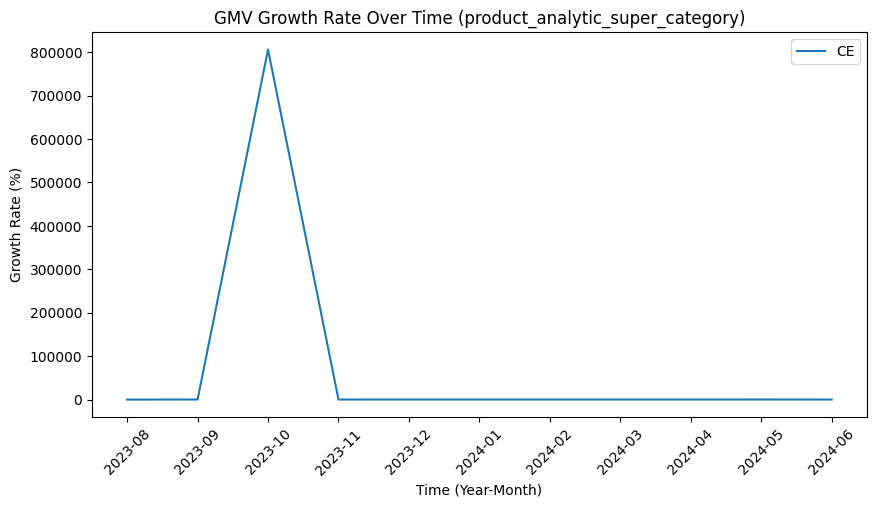


🔹 Fastest-Growing product_analytic_category Categories:
 product_analytic_category
Camera                207735.730536
GamingHardware        115345.369645
CameraAccessory       104100.835628
GameCDDVD              74602.778627
EntertainmentSmall     34871.204408
Name: gmv_growth_rate, dtype: float64

🔹 Most Discount-Sensitive product_analytic_category Categories:
 product_analytic_category
CameraAccessory       0.497034
EntertainmentSmall    0.458112
GamingHardware        0.433754
Camera                0.326966
GameCDDVD             0.309921
Name: discount_rate, dtype: float64


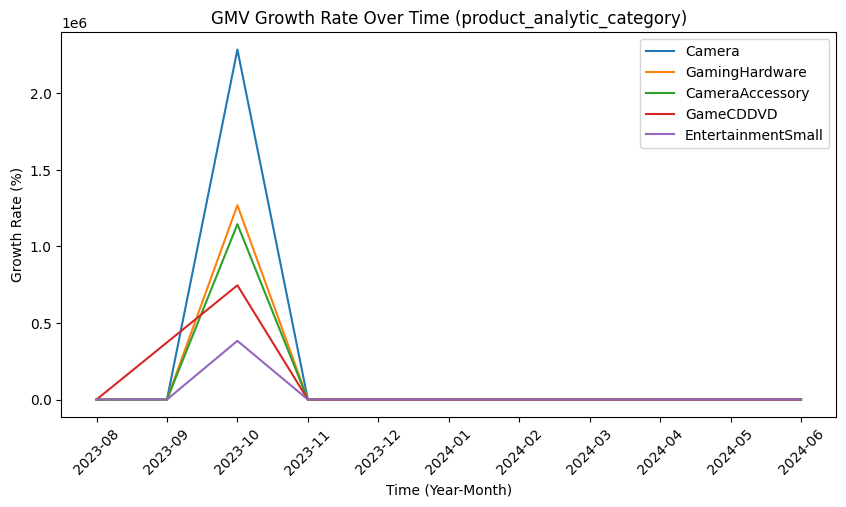


🔹 Fastest-Growing product_analytic_sub_category Categories:
 product_analytic_sub_category
Camera             207735.730536
CameraAccessory    184323.699490
AudioMP3Player     168130.768751
HomeAudio          105558.781066
Game                74602.781233
Name: gmv_growth_rate, dtype: float64

🔹 Most Discount-Sensitive product_analytic_sub_category Categories:
 product_analytic_sub_category
GameMembershipCards    0.517461
AudioMP3Player         0.510908
CameraAccessory        0.500051
TVVideoSmall           0.473666
Speaker                0.467344
Name: discount_rate, dtype: float64


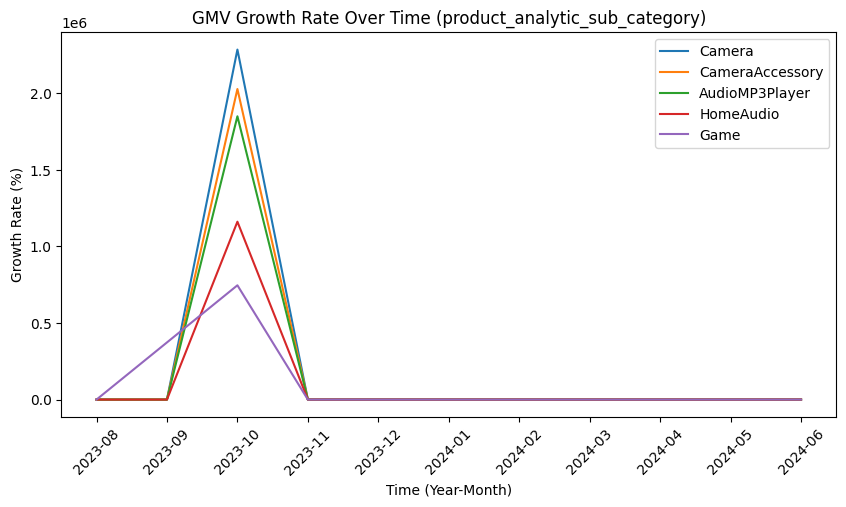


🔹 Fastest-Growing product_analytic_vertical Categories:
 product_analytic_vertical
Lens                554846.210157
AudioMP3Player      168130.768751
HomeAudioSpeaker     87752.196944
PhysicalGame         70081.890119
CameraTripod         63180.940146
Name: gmv_growth_rate, dtype: float64

🔹 Most Discount-Sensitive product_analytic_vertical Categories:
 product_analytic_vertical
CameraTripod     0.709009
Flash            0.688622
GamingHeadset    0.632704
VideoGlasses     0.604176
\N               0.594679
Name: discount_rate, dtype: float64


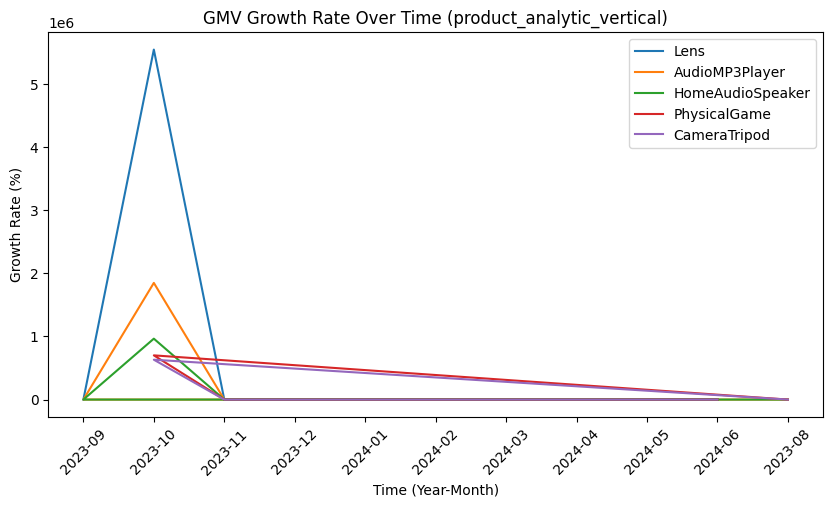

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate Discount Rate: (MRP - Selling Price) / MRP
prepro_sku["discount_rate"] = (prepro_sku["product_mrp"] - prepro_sku["gmv"] / prepro_sku["Units_Sold"]) / prepro_sku["product_mrp"]

# Convert date column to datetime format (if available)
prepro_sku["order_date"] = pd.to_datetime(prepro_sku["order_date"])  # Replace with actual date column name

# Extract Year-Month for time-based analysis
prepro_sku["year_month"] = prepro_sku["order_date"].dt.to_period("M")

# List of category levels
category_levels = ["product_analytic_super_category",
                   "product_analytic_category",
                   "product_analytic_sub_category",
                   "product_analytic_vertical"]

# Function to calculate growth rate and analyze discounts
def analyze_growth_and_discount(category):
    # Aggregate GMV and discount rate by time period
    monthly_data = prepro_sku.groupby([category, "year_month"]).agg({"gmv": "sum", "discount_rate": "mean"}).reset_index()

    # Calculate GMV Growth Rate (Percentage Change)
    monthly_data["gmv_growth_rate"] = monthly_data.groupby(category)["gmv"].pct_change() * 100

    # Find fastest-growing categories
    avg_growth = monthly_data.groupby(category)["gmv_growth_rate"].mean().sort_values(ascending=False)
    print(f"\n🔹 Fastest-Growing {category} Categories:\n", avg_growth.head(5))

    # Find most discount-sensitive categories
    avg_discount = prepro_sku.groupby(category)["discount_rate"].mean().sort_values(ascending=False)
    print(f"\n🔹 Most Discount-Sensitive {category} Categories:\n", avg_discount.head(5))

    # Plot GMV Growth Rate for top 5 growing categories
    top_categories = avg_growth.head(5).index
    plt.figure(figsize=(10, 5))
    for cat in top_categories:
        subset = monthly_data[monthly_data[category] == cat]
        plt.plot(subset["year_month"].astype(str), subset["gmv_growth_rate"], label=cat)

    plt.title(f"GMV Growth Rate Over Time ({category})")
    plt.xlabel("Time (Year-Month)")
    plt.ylabel("Growth Rate (%)")
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

# Run analysis for all 4 category levels
for cat in category_levels:
    analyze_growth_and_discount(cat)


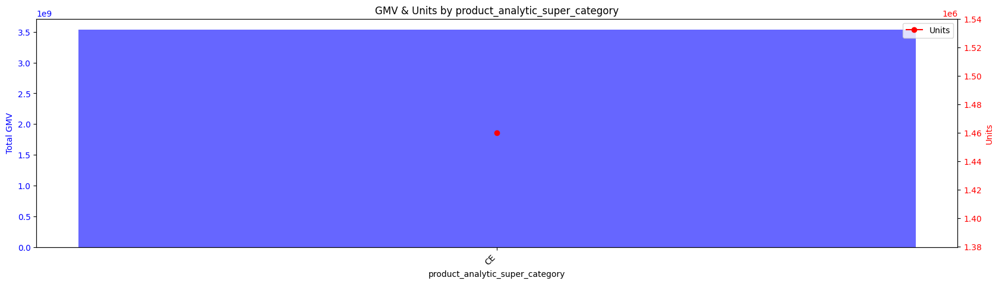

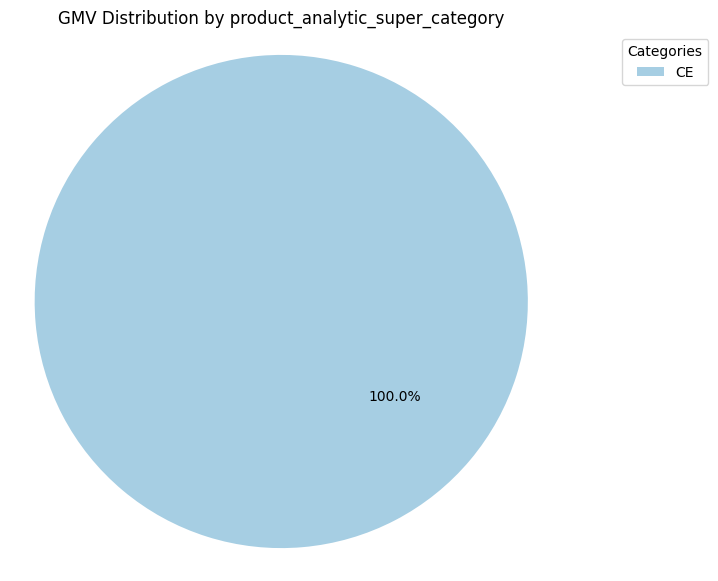

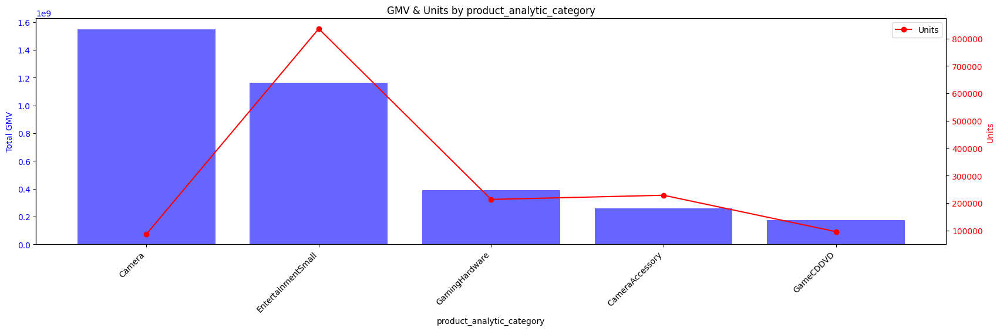

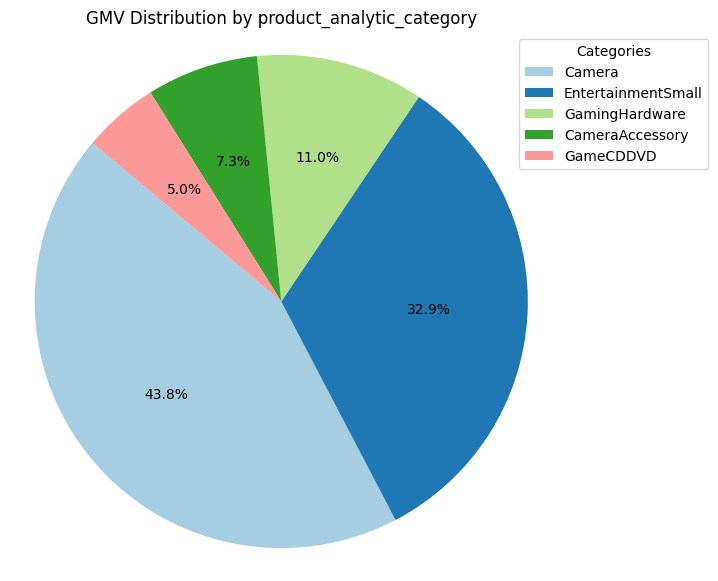

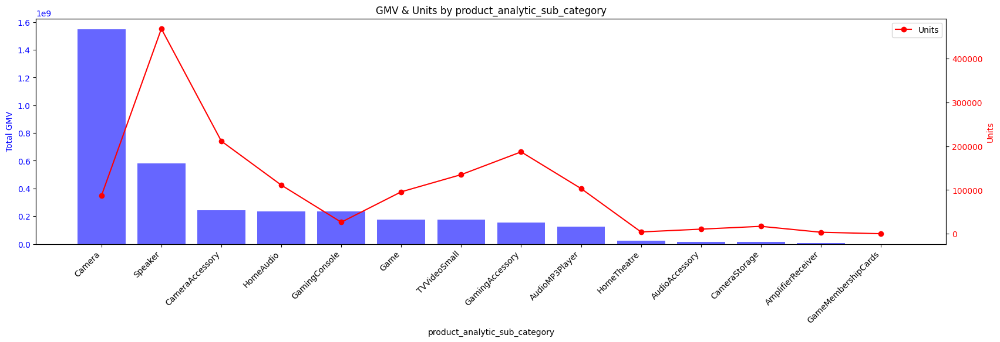

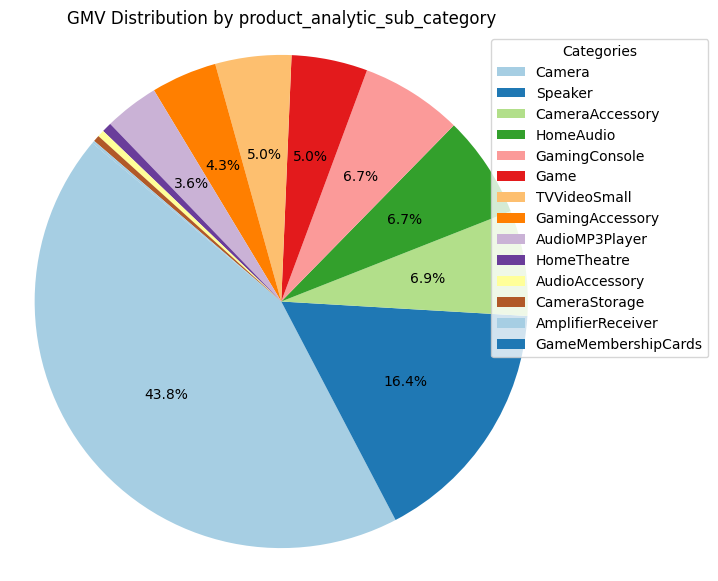

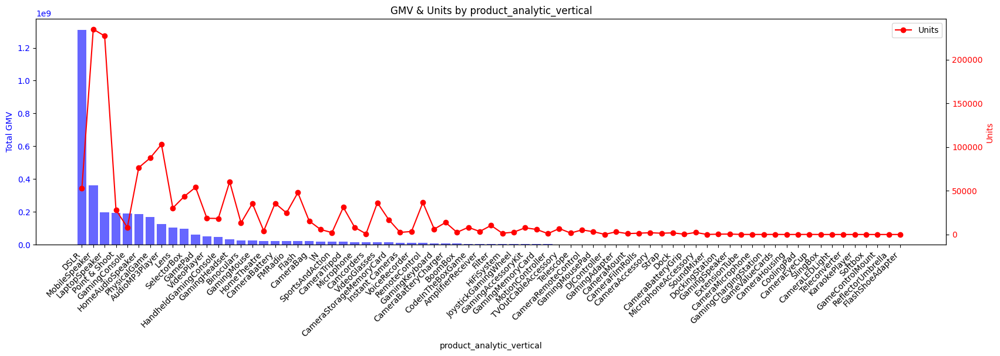

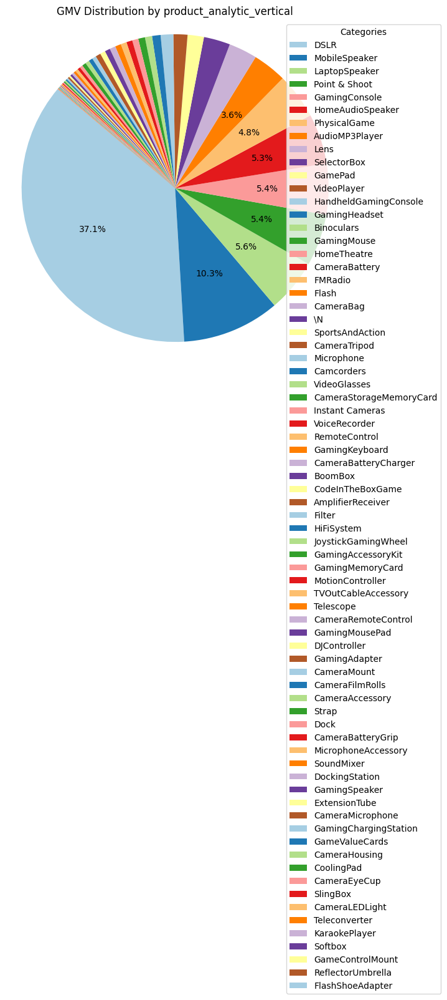

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of category levels
category_levels = ["product_analytic_super_category",
                   "product_analytic_category",
                   "product_analytic_sub_category",
                   "product_analytic_vertical"]

# Function to generate bar and pie charts
def visualize_gmv_units(category):
    # Aggregate GMV & Units
    category_data = prepro_sku.groupby(category).agg({"gmv": "sum", "Units_Sold": "sum"}).reset_index()

    # Sort by GMV (Descending)
    category_data = category_data.sort_values(by="gmv", ascending=False)

    # 🔹 **Bar Chart: GMV & Units**
    fig, ax1 = plt.subplots(figsize=(20, 5))

    ax1.bar(category_data[category], category_data["gmv"], color="blue", alpha=0.6, label="Total GMV")
    ax1.set_xlabel(category)
    ax1.set_ylabel("Total GMV", color="blue")
    ax1.tick_params(axis="y", labelcolor="blue")
    plt.xticks(rotation=45, ha="right")

    # Second y-axis for Units
    ax2 = ax1.twinx()
    ax2.plot(category_data[category], category_data["Units_Sold"], color="red", marker="o", label="Units")
    ax2.set_ylabel("Units", color="red")
    ax2.tick_params(axis="y", labelcolor="red")

    plt.title(f"GMV & Units by {category}")
    plt.legend()
    plt.show()
    print()
    # 🔹 **Pie Chart: Percentage of Total GMV**
    # plt.figure(figsize=(7, 7))
    # plt.pie(category_data["gmv"], labels=category_data[category], autopct="%1.1f%%", startangle=140, colors=plt.cm.Paired.colors)
    # plt.title(f"GMV Distribution by {category}")
    # plt.axis("equal")  # Equal aspect ratio ensures that pie is drawn as a circle
    # plt.show()

    fig, ax = plt.subplots(figsize=(7, 7))

    def autopct_format(pct):
       return f"{pct:.1f}%" if pct >= 3.1 else ""

    wedges, texts, autotexts = ax.pie(
        category_data["gmv"],
        labels=[None] * len(category_data),  # Remove labels from slices
        autopct= autopct_format,
        startangle=140,
        colors=plt.cm.Paired.colors
    )

    # Add a legend in the top-right corner
    ax.legend(category_data[category], title="Categories", loc="upper right", bbox_to_anchor=(1.3, 1))

    plt.title(f"GMV Distribution by {category}")
    plt.axis("equal")  # Equal aspect ratio ensures the pie is drawn as a circle
    plt.show()

# Generate visualizations for all 4 category levels
for cat in category_levels:
    visualize_gmv_units(cat)


##Weather DATA


###Preprocessing + Merging

In [ ]:
df1=pd.read_csv('/content/Weather Data ONTARIO-2023.csv')
df2=pd.read_csv('/content/Weather Data ONTARIO-2024.csv')

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 389 entries, 0 to 388
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Station Name  387 non-null    object
 1   AMHERSTBURG   384 non-null    object
 2   Unnamed: 2    366 non-null    object
 3   Unnamed: 3    366 non-null    object
 4   Unnamed: 4    230 non-null    object
 5   Unnamed: 5    217 non-null    object
 6   Unnamed: 6    14 non-null     object
 7   Unnamed: 7    191 non-null    object
 8   Unnamed: 8    40 non-null     object
 9   Unnamed: 9    191 non-null    object
 10  Unnamed: 10   40 non-null     object
 11  Unnamed: 11   191 non-null    object
 12  Unnamed: 12   40 non-null     object
 13  Unnamed: 13   191 non-null    object
 14  Unnamed: 14   40 non-null     object
 15  Unnamed: 15   230 non-null    object
 16  Unnamed: 16   8 non-null      object
 17  Unnamed: 17   230 non-null    object
 18  Unnamed: 18   10 non-null     object
 19  Unnamed:

In [ ]:
df1.columns
null_counts = df1.isnull().sum()
columns_to_drop = null_counts[null_counts > 370].index
df1.drop(columns=columns_to_drop, inplace=True)
df1.columns

Index(['Station Name', 'AMHERSTBURG', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4',
       'Unnamed: 5', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10',
       'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14',
       'Unnamed: 15', 'Unnamed: 17', 'Unnamed: 19', 'Unnamed: 21'],
      dtype='object')

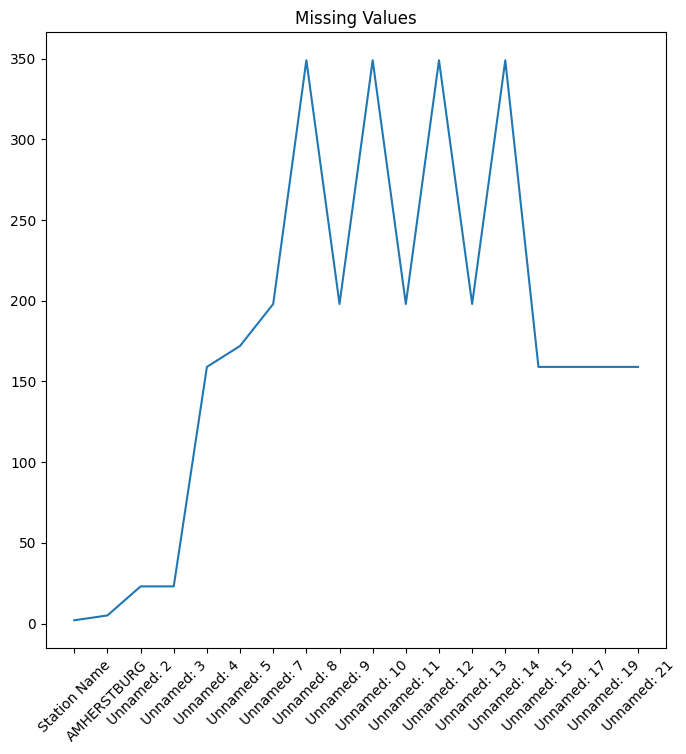

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(df1.isnull().sum())
plt.xticks(rotation=45)
plt.title('Missing Values')
plt.show()

In [ ]:
df1.describe(include=['object'])  # For categorical features

,Station Name,AMHERSTBURG,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 17,Unnamed: 19,Unnamed: 21
count,387,384,366,366,230,217,191,40,191,40,191,40,191,40,230,230,230,230
unique,387,20,13,32,2,76,68,2,102,2,70,2,34,2,51,8,51,14
top,31-12-2023,2023,01,01,†,27,14,M,20.8,M,0,M,0,M,0,0,0,0
freq,1,365,31,12,229,11,9,39,7,39,87,39,104,39,158,218,148,207


In [ ]:
new_columns = df1.iloc[23].tolist()
new_columns

['Date/Time',
 'Year',
 'Month',
 'Day',
 'Data Quality',
 'Max Temp (°C)',
 'Min Temp (°C)',
 'Min Temp Flag',
 'Mean Temp (°C)',
 'Mean Temp Flag',
 'Heat Deg Days (°C)',
 'Heat Deg Days Flag',
 'Cool Deg Days (°C)',
 'Cool Deg Days Flag',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

In [ ]:
df1.columns = new_columns
df1.drop(df1.index[0:24], inplace=True)

In [ ]:
d = {
    'Province': 'ONTARIO',
    'Latitude': '42.1',
    'Longitude': '-83.09',
    'Elevation': '182',
    'Climate Identifier': '6130257',

    'A': 'Accumulated',
    'C': 'Precipitation occurred, amount uncertain',
    'E': 'Estimated',
    'F': 'Accumulated and estimated',
    'L': 'Precipitation may or may not have occurred',
    'M': 'Missing',
    'N': 'Temperature missing but known to be > 0',
    'S': 'More than one occurrence',
    'T': 'Trace',
    'Y': 'Temperature missing but known to be < 0',
    '[empty]': 'No data available',
    '^': 'The value displayed is based on incomplete data',
    '†': 'Data that is not subject to review by the National Climate Archives',
    'Station Name': 'AMHERSTBURG'
}

print(d)

{'Province': 'ONTARIO', 'Latitude': '42.1', 'Longitude': '-83.09', 'Elevation': '182', 'Climate Identifier': '6130257', 'A': 'Accumulated', 'C': 'Precipitation occurred, amount uncertain', 'E': 'Estimated', 'F': 'Accumulated and estimated', 'L': 'Precipitation may or may not have occurred', 'M': 'Missing', 'N': 'Temperature missing but known to be > 0', 'S': 'More than one occurrence', 'T': 'Trace', 'Y': 'Temperature missing but known to be < 0', '[empty]': 'No data available', '^': 'The value displayed is based on incomplete data', '†': 'Data that is not subject to review by the National Climate Archives', 'Station Name': 'AMHERSTBURG'}


In [ ]:
col_to_drop=['Min Temp Flag','Heat Deg Days Flag','Cool Deg Days Flag']
df1.drop(columns=col_to_drop, inplace=True)

In [ ]:
df1.drop(columns=['Mean Temp Flag'], inplace=True)

In [ ]:
for column in df1.columns:
    print(column, ':', df1[column].nunique())

Date/Time : 365
Year : 1
Month : 12
Day : 31
Data Quality : 1
Max Temp (°C) : 75
Min Temp (°C) : 67
Mean Temp (°C) : 101
Heat Deg Days (°C) : 69
Cool Deg Days (°C) : 33
Total Rain (mm) : 50
Total Snow (cm) : 7
Total Precip (mm) : 50
Snow on Grnd (cm) : 13


In [ ]:
df1['Data Quality'] = df1['Data Quality'].notnull().astype(int)

In [ ]:
df1['Date/Time'] = pd.to_datetime(df1['Date/Time'], format='%d-%m-%Y', errors='coerce')

In [ ]:
for col in df1.columns:
    try:
        if(col!='Date/Time'):
          df1[col] = pd.to_numeric(df1[col], errors='coerce').astype(float)
    except (ValueError, TypeError):
        print(f"Could not convert column '{col}' to float. Skipping...")

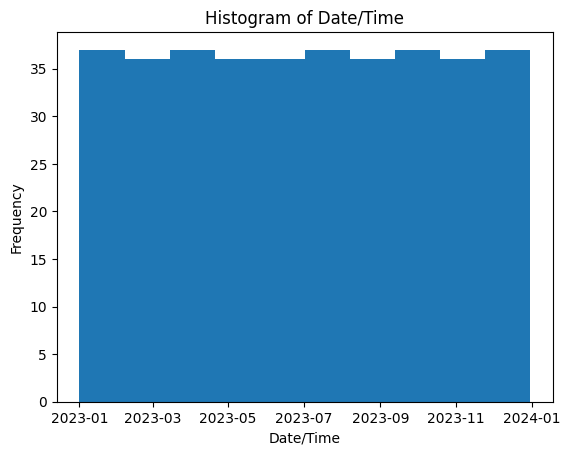

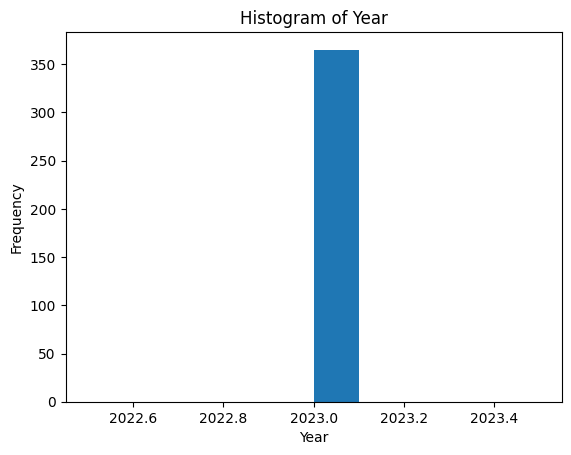

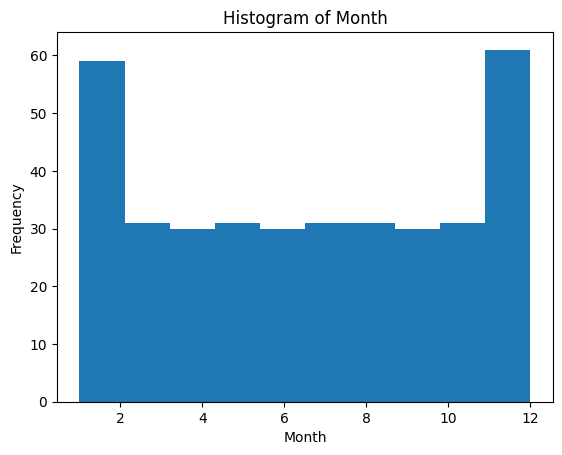

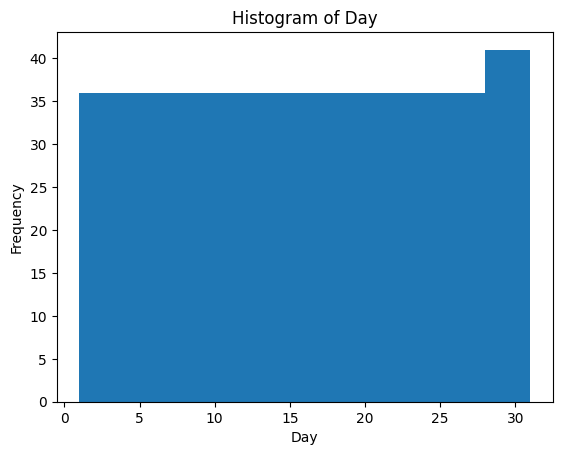

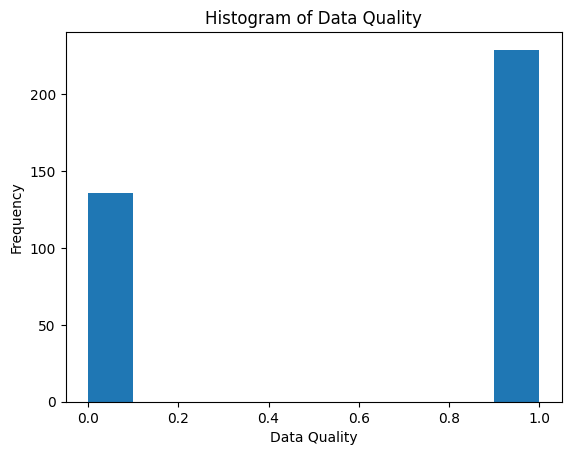

...

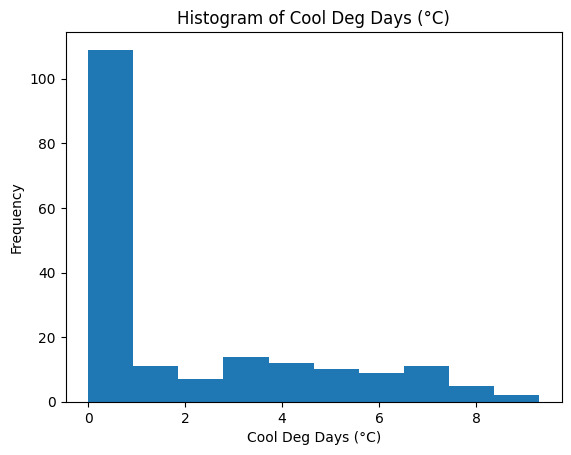

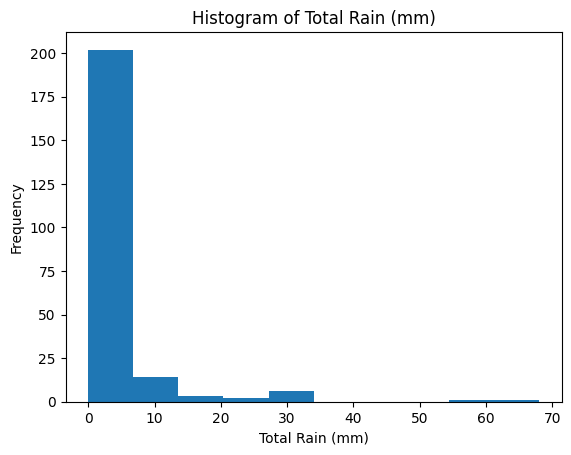

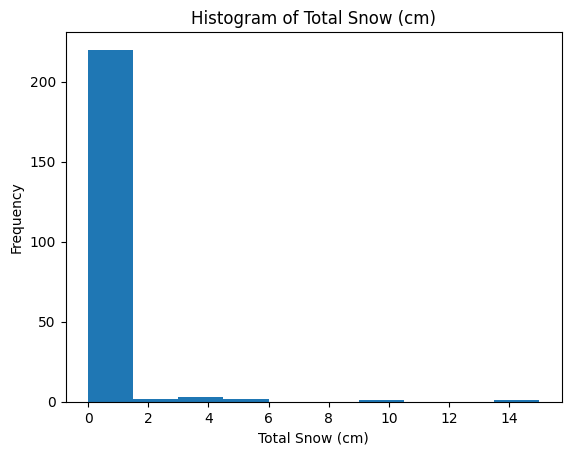

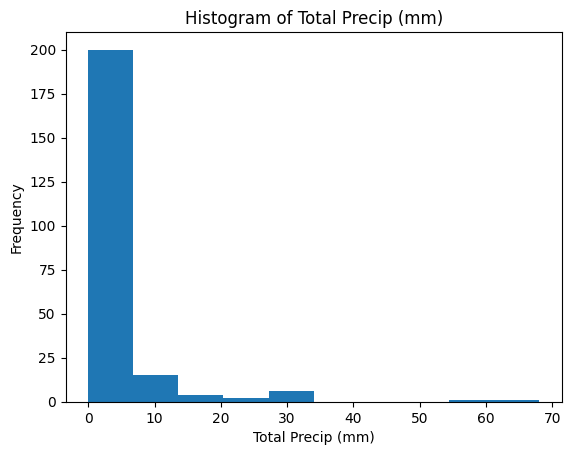

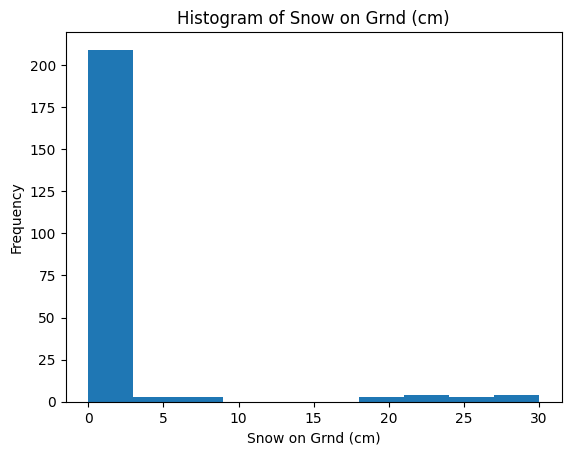

In [ ]:
for col in df1.columns:
    if df1[col].dtype != object:  # Check if the column is numerical
        plt.hist(df1[col])
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.title(f'Histogram of {col}')  # Use f-string for title formatting
        plt.show()

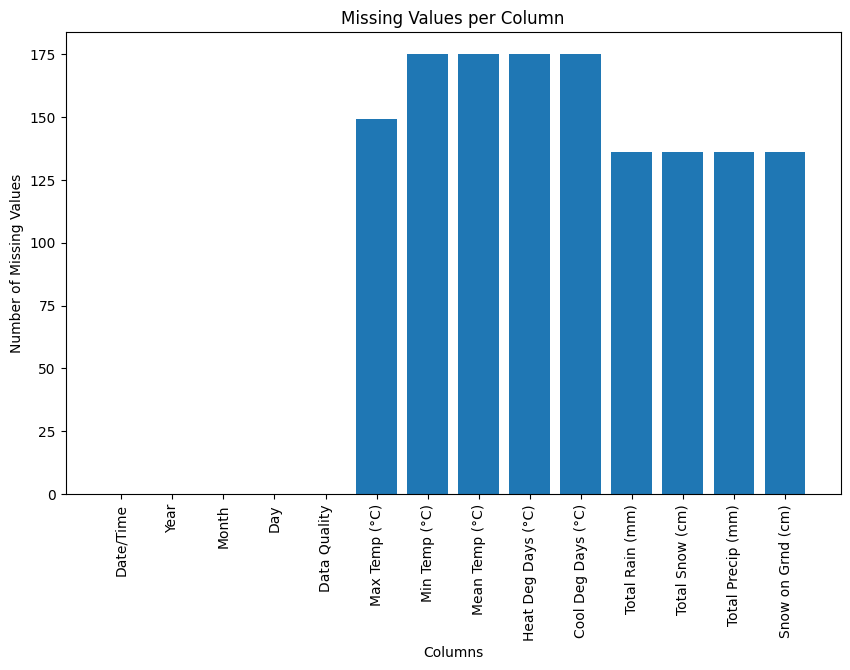

In [ ]:
# Check for missing values in each column
df1.isnull().sum()

# Visualize missing values (optional)
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.bar(df1.columns, df1.isnull().sum())
plt.xticks(rotation=90)
plt.title('Missing Values per Column')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.show()

# Handle missing values (choose an appropriate method)
# - Imputation: Fill missing values with mean, median, mode, etc.
# - Deletion: Remove rows or columns with missing values.

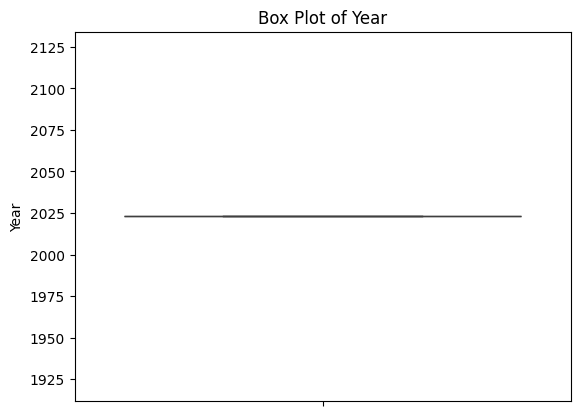

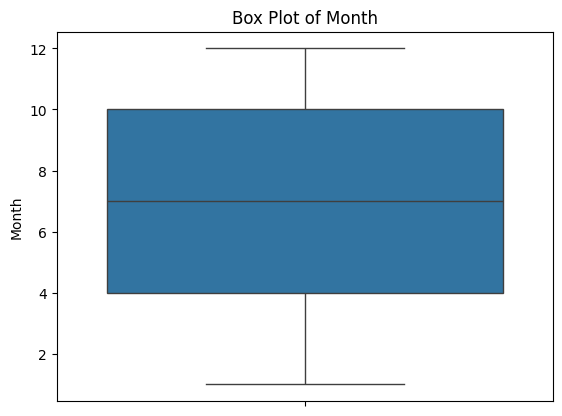

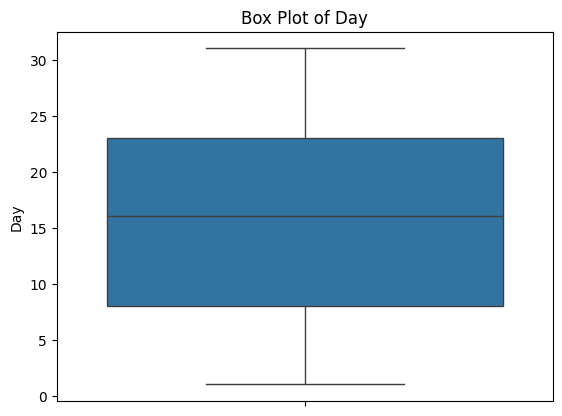

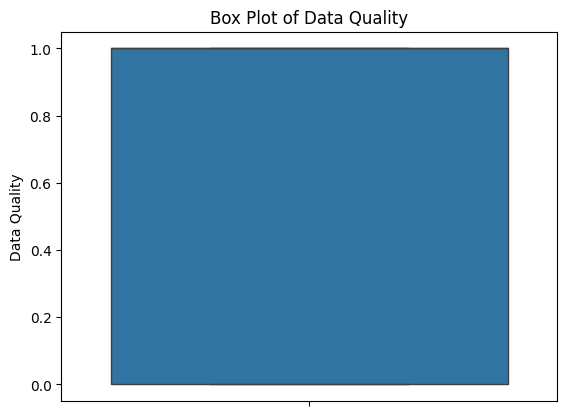

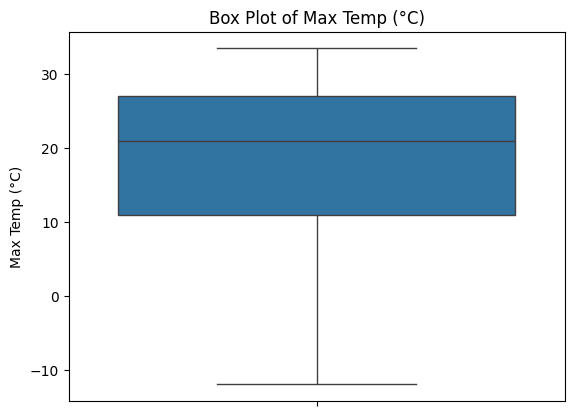

...

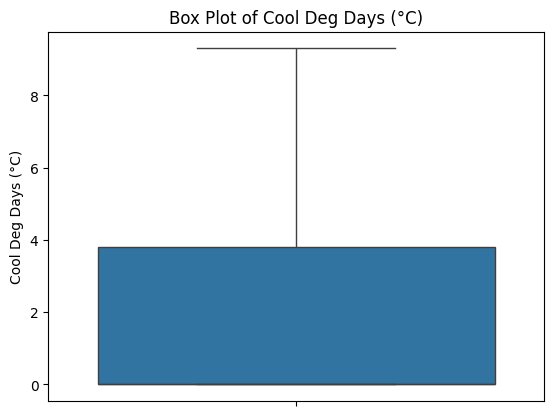

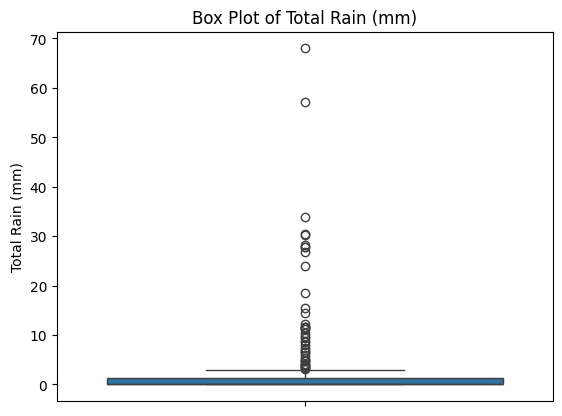

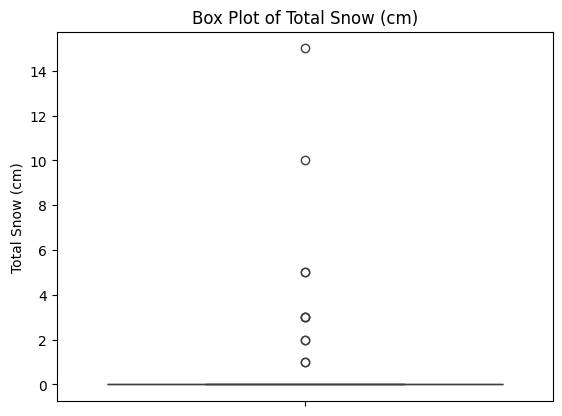

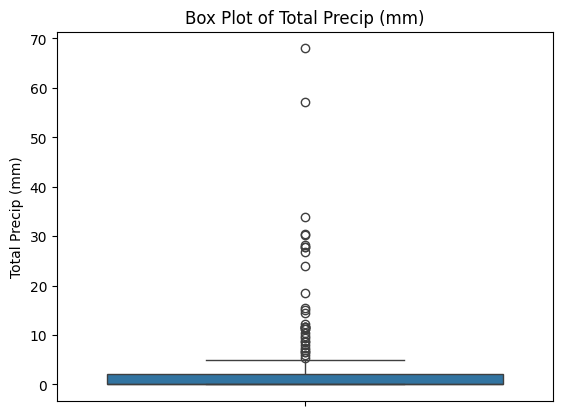

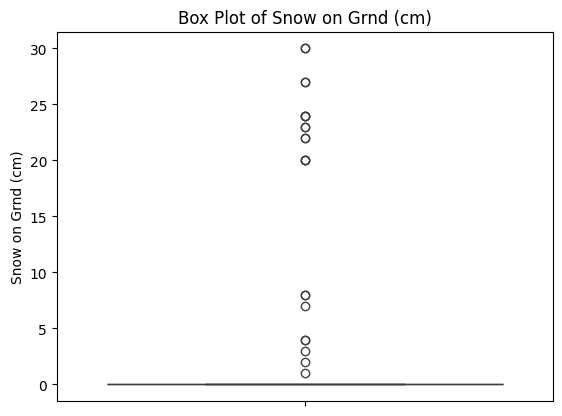

In [ ]:
for column in df1.select_dtypes(include=['number']).columns:
    sns.boxplot(y=df1[column])
    plt.title(f'Box Plot of {column}')
    plt.show()

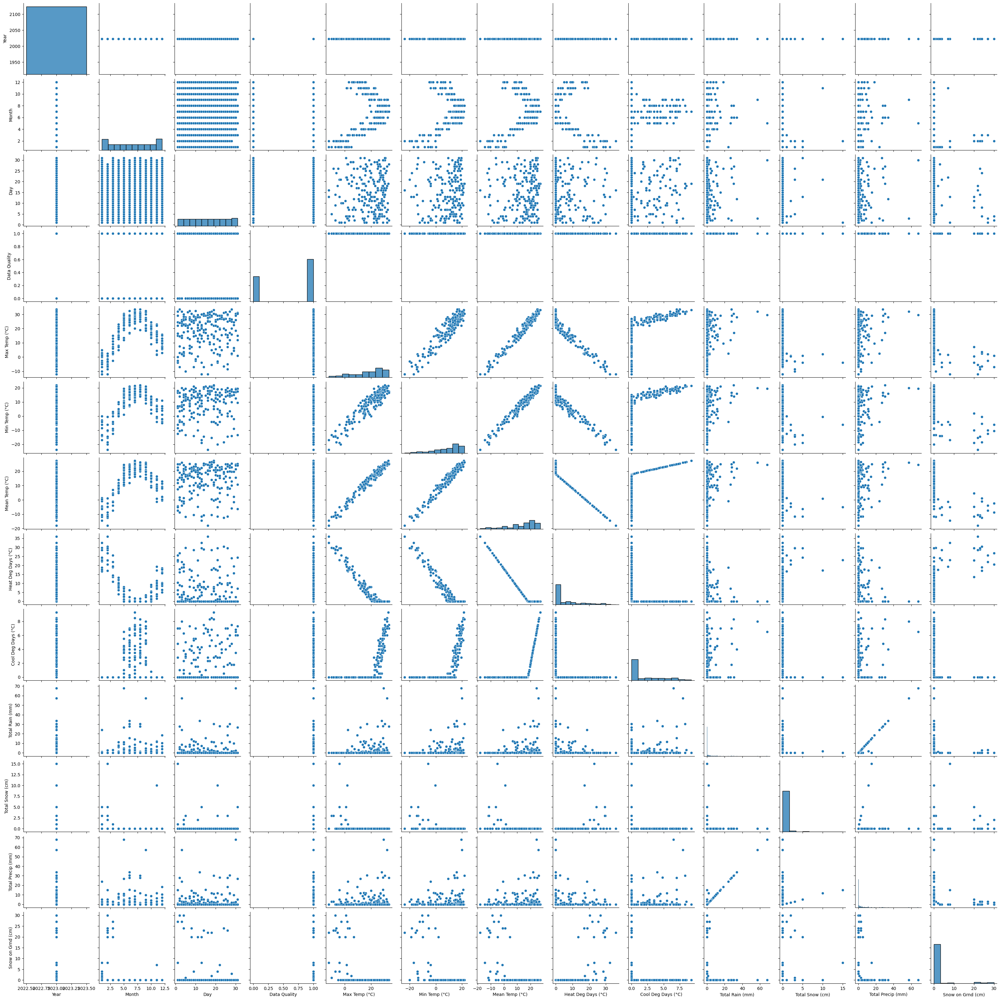

In [ ]:
sns.pairplot(df1.select_dtypes(include=['number']))
plt.show()

In [ ]:
df1.dropna(subset=['Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],how='all', inplace=True) #possible fix, needs context
df1.isna().sum()

,0
Date/Time,0
Year,0
Month,0
Day,0
Data Quality,0
Max Temp (°C),13
Min Temp (°C),39
Mean Temp (°C),39
Heat Deg Days (°C),39
Cool Deg Days (°C),39


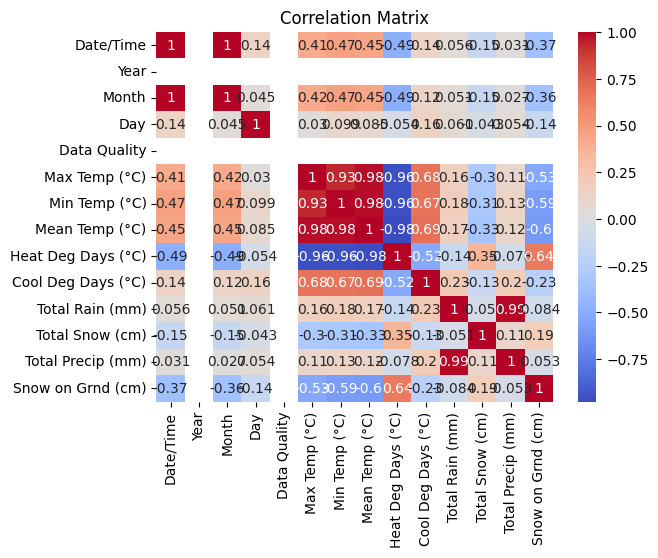

In [ ]:
# Calculate correlation matrix
correlation_matrix = df1.corr()

# Visualize correlation matrix as a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

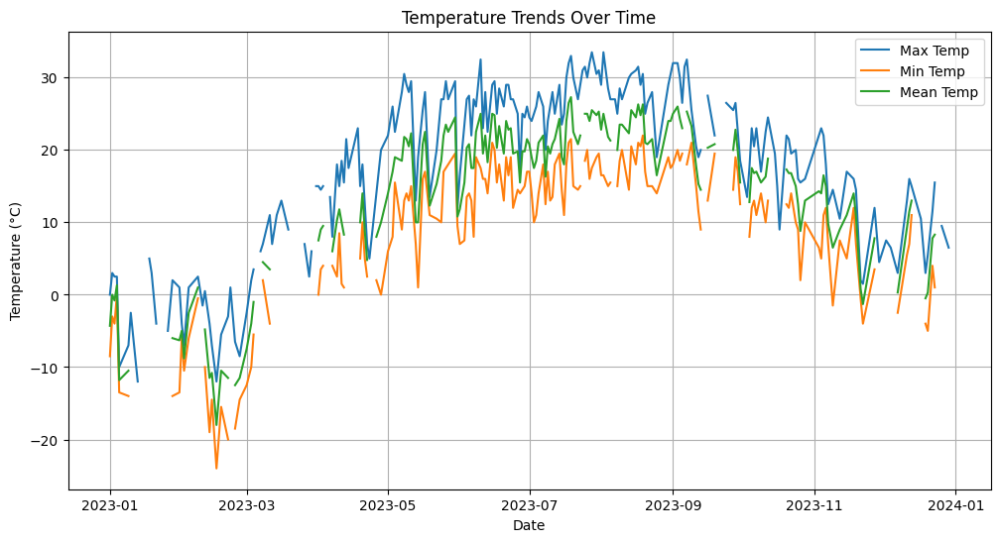

In [ ]:


# Assuming your DataFrame is named df1 and the columns are as mentioned
plt.figure(figsize=(12, 6))  # Adjust figure size if needed

plt.plot(df1['Date/Time'], df1['Max Temp (°C)'], label='Max Temp')
plt.plot(df1['Date/Time'], df1['Min Temp (°C)'], label='Min Temp')
plt.plot(df1['Date/Time'], df1['Mean Temp (°C)'], label='Mean Temp')

plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Trends Over Time')
plt.legend()  # Show legend to identify lines
plt.grid(True)  # Add grid for better readability

plt.show()


In [ ]:
df1.isna().sum()

,0
Date/Time,0
Year,0
Month,0
Day,0
Data Quality,0
Max Temp (°C),13
Min Temp (°C),39
Mean Temp (°C),39
Heat Deg Days (°C),39
Cool Deg Days (°C),39


In [ ]:
columns_to_interpolate = ['Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)']
for column in columns_to_interpolate:
    df1[column] = df1[column].rolling(window=10, center=True, min_periods=1).mean()

In [ ]:
df1['Range of Temp'] = df1['Max Temp (°C)'] - df1['Min Temp (°C)']

In [ ]:
# Function to calculate Heat Deg Days and Cool Deg Days
def calculate_deg_days(mean_temp):
    diff = mean_temp - 18
    if diff > 0:
        return 0, abs(diff)  # Heat Deg Days, Cool Deg Days
    else:
        return abs(diff), 0  # Heat Deg Days, Cool Deg Days

# Apply the function to rows with missing values
for index in df1[df1['Heat Deg Days (°C)'].isnull()].index:
    mean_temp = df1.loc[index, 'Mean Temp (°C)']
    heat_deg_days, cool_deg_days = calculate_deg_days(mean_temp)
    df1.loc[index, 'Heat Deg Days (°C)'] = heat_deg_days
    df1.loc[index, 'Cool Deg Days (°C)'] = cool_deg_days

In [ ]:
df1.isna().sum()

,0
Date/Time,0
Year,0
Month,0
Day,0
Data Quality,0
Max Temp (°C),0
Min Temp (°C),0
Mean Temp (°C),0
Heat Deg Days (°C),0
Cool Deg Days (°C),0


In [ ]:
df1.to_csv('weather_data_2023.csv', index=False)

In [ ]:
cod=preprocessed_data.copy()
cod.head()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,...,Month,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value
0,0,ACCCX3S58G7B5F6P,2023-10-17 15:11:54,3419300926147000.0,3419300926147000.0,6400.0,1,0.0,0.0,COD,...,10,2023,Tuesday,15,0.0,6400.0,10.987483,Luxury,1,6400.0
1,1,ACCCX3S58G7B5F6P,2023-10-19 10:07:22,1420830839915200.0,1420830839915200.0,6900.0,1,0.0,0.0,COD,...,10,2023,Thursday,10,0.0,6900.0,4.033380,Luxury,2,3450.0
2,2,ACCCX3S5AHMF55FV,2023-10-20 15:45:56,2421912925714800.0,2421912925714800.0,1990.0,1,0.0,0.0,COD,...,10,2023,Friday,15,0.0,1990.0,5.192949,Mass-market,1,1990.0
3,3,ACCCX3S5AHMF55FV,2023-10-14 12:05:15,4416592101738400.0,4416592101738400.0,1690.0,1,0.0,0.0,Prepaid,...,10,2023,Saturday,12,0.0,1690.0,19.485469,Mass-market,1,1690.0
4,4,ACCCX3S5AHMF55FV,2023-10-17 21:25:03,4419525153426400.0,4419525153426400.0,1618.0,1,0.0,0.0,Prepaid,...,10,2023,Tuesday,21,0.0,1618.0,22.915674,Mass-market,2,809.0


In [ ]:
cod.shape

(1431794, 28)

In [ ]:
cod.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1431794 entries, 0 to 1543996
Data columns (total 28 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   Unnamed: 0               1431794 non-null  int64         
 1   fsn_id                   1431794 non-null  object        
 2   order_date               1431794 non-null  datetime64[ns]
 3   order_id                 1431794 non-null  object        
 4   order_item_id            1431794 non-null  object        
 5   gmv                      1431794 non-null  float64       
 6   units                    1431794 non-null  int64         
 7   deliverybdays            1431794 non-null  float64       
 8   deliverycdays            1431794 non-null  float64       
 9   order_payment_type       1431794 non-null  object        
 10  sla                      1431794 non-null  int64         
 11  cust_id                  1431794 non-null  object        
 12  pinco

In [ ]:
preprocessed_data.columns

Index(['Unnamed: 0', 'fsn_id', 'order_date', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price',
       'discount_percentage', 'product_type', 'purchase_frequency',
       'average_order_value'],
      dtype='object')

In [ ]:
preprocessed_data['order_date']=customers_orders_filtered['order_date']

In [ ]:
df=cod[['order_date','gmv']]
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1431794 entries, 0 to 1543996
Data columns (total 2 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   order_date  1431794 non-null  datetime64[ns]
 1   gmv         1431794 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 32.8 MB


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
w24=pd.read_csv("/content/Weather Data ONTARIO-2024.csv")

In [ ]:
null_counts = w24.isnull().sum()
columns_to_drop = null_counts[null_counts > 380].index
w24.drop(columns=columns_to_drop, inplace=True)
d=dict(zip(w24['Station Name'].head(22).tolist(),w24['AMHERSTBURG'].head(22).tolist()))
d['Station Name']='AMHERSTBURG'

In [ ]:
w24=w24.iloc[22:]
w24.index=(range(0,len(w24)))
w24=w24.iloc[1:]
new_columns = w24.iloc[0].tolist()
w24.columns = new_columns
w24 = w24.drop(w24.index[0])
w24 = w24.reset_index(drop=True)

In [ ]:
w24.dropna(subset=['Data Quality', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],how='all', inplace=True)

In [ ]:
w24['Data Quality'] = w24['Data Quality'].notnull().astype(int)
w24['Date/Time'] = pd.to_datetime(w24['Date/Time'], format='%d-%m-%Y', errors='coerce')

In [ ]:
for col in w24.columns:
    try:
        if(col!='Date/Time'):
          w24[col] = pd.to_numeric(w24[col], errors='coerce').astype(float)
    except (ValueError, TypeError):
        print(f"Could not convert column '{col}' to float. Skipping...")

In [ ]:
w24['Snow on Grnd (cm)']=w24['Snow on Grnd (cm)'].astype('float64')
w24.info()
columns_to_interpolate = ['Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)']
for column in columns_to_interpolate:
    w24[column] = w24[column].rolling(window=10, center=True, min_periods=1).mean()
def calculate_deg_days(mean_temp):
    diff = mean_temp - 18
    if diff > 0:
        return 0, abs(diff)
    else:
        return abs(diff), 0

for index in w24[w24['Heat Deg Days (°C)'].isnull()].index:
    mean_temp = w24.loc[index, 'Mean Temp (°C)']
    heat_deg_days, cool_deg_days = calculate_deg_days(mean_temp)
    w24.loc[index, 'Heat Deg Days (°C)'] = heat_deg_days
    w24.loc[index, 'Cool Deg Days (°C)'] = cool_deg_days


<class 'pandas.core.frame.DataFrame'>
Index: 227 entries, 7 to 365
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           227 non-null    datetime64[ns]
 1   Year                227 non-null    float64       
 2   Month               227 non-null    float64       
 3   Day                 227 non-null    float64       
 4   Data Quality        227 non-null    float64       
 5   Max Temp (°C)       226 non-null    float64       
 6   Min Temp (°C)       219 non-null    float64       
 7   Mean Temp (°C)      219 non-null    float64       
 8   Heat Deg Days (°C)  219 non-null    float64       
 9   Cool Deg Days (°C)  219 non-null    float64       
 10  Total Rain (mm)     227 non-null    float64       
 11  Total Snow (cm)     227 non-null    float64       
 12  Total Precip (mm)   227 non-null    float64       
 13  Snow on Grnd (cm)   227 non-null    float64       
dtyp

In [ ]:
w23=pd.read_csv('/content/weather_data_2023.csv')
w23['Date/Time'] = pd.to_datetime(w23['Date/Time'])
#w23 = w23.set_index('Date/Time')
w = pd.concat([w23, w24], ignore_index=True)
w['Date/Time'] = pd.to_datetime(w['Date/Time'])
w.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Range of Temp
0,2023-01-01,2023.0,1.0,1.0,1.0,-0.400000,-5.800000,-3.12,22.3,0.0,0.0,0.0,0.0,0.0,5.400000
1,2023-01-02,2023.0,1.0,2.0,1.0,-1.500000,-7.166667,-4.35,18.0,0.0,0.0,0.0,0.0,0.0,5.666667
2,2023-01-03,2023.0,1.0,3.0,1.0,-1.642857,-7.166667,-4.35,18.8,0.0,24.0,0.0,24.0,0.0,5.523810
3,2023-01-04,2023.0,1.0,4.0,1.0,-2.937500,-8.571429,-5.80,16.7,0.0,0.0,1.0,1.0,0.0,5.633929
4,2023-01-05,2023.0,1.0,5.0,1.0,-2.937500,-8.571429,-5.80,29.8,0.0,0.0,3.0,3.0,1.0,5.633929


In [ ]:
w23=pd.read_csv('/content/weather_data_2023.csv')
w23['Date/Time'] = pd.to_datetime(w23['Date/Time'])
#w23 = w23.set_index('Date/Time')
w = pd.concat([w23, w24], ignore_index=True)
w['Date/Time'] = pd.to_datetime(w['Date/Time'])
w.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Range of Temp
0,2023-01-01,2023.0,1.0,1.0,1.0,-0.400000,-5.800000,-3.12,22.3,0.0,0.0,0.0,0.0,0.0,5.400000
1,2023-01-02,2023.0,1.0,2.0,1.0,-1.500000,-7.166667,-4.35,18.0,0.0,0.0,0.0,0.0,0.0,5.666667
2,2023-01-03,2023.0,1.0,3.0,1.0,-1.642857,-7.166667,-4.35,18.8,0.0,24.0,0.0,24.0,0.0,5.523810
3,2023-01-04,2023.0,1.0,4.0,1.0,-2.937500,-8.571429,-5.80,16.7,0.0,0.0,1.0,1.0,0.0,5.633929
4,2023-01-05,2023.0,1.0,5.0,1.0,-2.937500,-8.571429,-5.80,29.8,0.0,0.0,3.0,3.0,1.0,5.633929


In [ ]:
w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456 entries, 0 to 455
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           456 non-null    datetime64[ns]
 1   Year                456 non-null    float64       
 2   Month               456 non-null    float64       
 3   Day                 456 non-null    float64       
 4   Data Quality        456 non-null    float64       
 5   Max Temp (°C)       456 non-null    float64       
 6   Min Temp (°C)       456 non-null    float64       
 7   Mean Temp (°C)      456 non-null    float64       
 8   Heat Deg Days (°C)  456 non-null    float64       
 9   Cool Deg Days (°C)  456 non-null    float64       
 10  Total Rain (mm)     456 non-null    float64       
 11  Total Snow (cm)     456 non-null    float64       
 12  Total Precip (mm)   456 non-null    float64       
 13  Snow on Grnd (cm)   456 non-null    float64       

In [ ]:
cod.shape

(1431794, 28)

In [ ]:
df = cod[['order_date', 'gmv']]
df['Date/Time'] = pd.to_datetime(df['order_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df.drop(columns='order_date', inplace=True)
df['Date'] = df['Date/Time'].dt.date
df['gmv'] = pd.to_numeric(df['gmv'], errors='coerce')
df = df.groupby('Date')['gmv'].sum().reset_index()
df.rename(columns={'Date': 'Date/Time'}, inplace=True)
df['Date/Time'] = pd.to_datetime(df['Date/Time'])
w_filtered = w[(w['Date/Time'] >= '2023-07-01') & (w['Date/Time'] <= '2024-06-30')]

wdata = pd.merge(df, w_filtered, on='Date/Time', how='left')

<ipython-input-333-dccec4b31e77>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date/Time'] = pd.to_datetime(df['order_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
<ipython-input-333-dccec4b31e77>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns='order_date', inplace=True)
<ipython-input-333-dccec4b31e77>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

In [ ]:
wdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358 entries, 0 to 357
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           358 non-null    datetime64[ns]
 1   gmv                 358 non-null    float64       
 2   Year                207 non-null    float64       
 3   Month               207 non-null    float64       
 4   Day                 207 non-null    float64       
 5   Data Quality        207 non-null    float64       
 6   Max Temp (°C)       207 non-null    float64       
 7   Min Temp (°C)       207 non-null    float64       
 8   Mean Temp (°C)      207 non-null    float64       
 9   Heat Deg Days (°C)  207 non-null    float64       
 10  Cool Deg Days (°C)  207 non-null    float64       
 11  Total Rain (mm)     207 non-null    float64       
 12  Total Snow (cm)     207 non-null    float64       
 13  Total Precip (mm)   207 non-null    float64       

In [ ]:
wdata.set_index('Date/Time',inplace=True)
wdata['Year']=wdata.index.year
wdata['Month']=wdata.index.month
wdata['Day']=wdata.index.day

In [ ]:
columns_to_interpolate = ['Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Total Rain (mm)',
                          'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)']
for column in columns_to_interpolate:
    wdata[column] = wdata[column].rolling(window=10, center=True, min_periods=1).mean()
def calculate_deg_days(mean_temp):
    diff = mean_temp - 18
    if diff > 0:
        return 0, abs(diff)
    else:
        return abs(diff), 0

for index in wdata[wdata['Heat Deg Days (°C)'].isnull()].index:
    mean_temp = wdata.loc[index, 'Mean Temp (°C)']
    heat_deg_days, cool_deg_days = calculate_deg_days(mean_temp)
    wdata.loc[index, 'Heat Deg Days (°C)'] = heat_deg_days
    wdata.loc[index, 'Cool Deg Days (°C)'] = cool_deg_days

In [ ]:
wdata['Range of Temp'] = wdata['Max Temp (°C)'] - wdata['Min Temp (°C)']

In [ ]:
wdata['Deviation']=wdata['Heat Deg Days (°C)']+wdata['Cool Deg Days (°C)']
wdata.drop(columns=['Heat Deg Days (°C)','Cool Deg Days (°C)'],inplace=True)
wdata['gmv'] = wdata['gmv'].fillna(0)

In [ ]:
# Calculate 33rd and 67th percentiles for each month
monthly_percentiles = wdata.groupby(['Year', 'Month'])['Total Precip (mm)'].agg([lambda x: x.quantile(0.33), lambda x: x.quantile(0.67)]).reset_index()
monthly_percentiles.columns = ['Year', 'Month', '33rdPercentile', '67thPercentile']

def categorize_precipitation_percentile(row):
    p33 = monthly_percentiles.loc[(monthly_percentiles['Year'] == row['Year']) & (monthly_percentiles['Month'] == row['Month']), '33rdPercentile'].iloc[0]
    p67 = monthly_percentiles.loc[(monthly_percentiles['Year'] == row['Year']) & (monthly_percentiles['Month'] == row['Month']), '67thPercentile'].iloc[0]

    if row['Total Precip (mm)'] < p33:
        return 'Low'
    elif row['Total Precip (mm)'] < p67:
        return 'Medium'
    else:
        return 'High'

wdata['PrecipitationCategory'] = wdata.apply(categorize_precipitation_percentile, axis=1)

In [ ]:
monthly_percentiles = wdata.groupby(['Year', 'Month'])['Mean Temp (°C)'].agg([lambda x: x.quantile(0.33), lambda x: x.quantile(0.67)]).reset_index()
monthly_percentiles.columns = ['Year', 'Month', '33rdPercentile', '67thPercentile']

def categorize_temp_percentile(row):
    p33 = monthly_percentiles.loc[(monthly_percentiles['Year'] == row['Year']) & (monthly_percentiles['Month'] == row['Month']), '33rdPercentile'].iloc[0]
    p67 = monthly_percentiles.loc[(monthly_percentiles['Year'] == row['Year']) & (monthly_percentiles['Month'] == row['Month']), '67thPercentile'].iloc[0]

    if row['Mean Temp (°C)'] < p33:
        return 'Low'
    elif row['Mean Temp (°C)'] < p67:
        return 'Medium'
    else:
        return 'High'

wdata['TemperatureCategory'] = wdata.apply(categorize_temp_percentile, axis=1)

In [ ]:
for d in wdata['PrecipitationCategory']:
  if(d=='Low'):
    wdata['PrecipitationCategory']=wdata['PrecipitationCategory'].replace(d,0)
  elif(d=='Medium'):
    wdata['PrecipitationCategory']=wdata['PrecipitationCategory'].replace(d,1)
  else:
    wdata['PrecipitationCategory']=wdata['PrecipitationCategory'].replace(d,2)
for d in wdata['TemperatureCategory']:
  if(d=='Low'):
    wdata['TemperatureCategory']=wdata['TemperatureCategory'].replace(d,0)
  elif(d=='Medium'):
    wdata['TemperatureCategory']=wdata['TemperatureCategory'].replace(d,1)
  else:
    wdata['TemperatureCategory']=wdata['TemperatureCategory'].replace(d,2)

<ipython-input-341-c6c3ea8014a0>:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  wdata['PrecipitationCategory']=wdata['PrecipitationCategory'].replace(d,2)
<ipython-input-341-c6c3ea8014a0>:14: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  wdata['TemperatureCategory']=wdata['TemperatureCategory'].replace(d,2)


In [ ]:
wdata.to_csv('/content/df.csv')

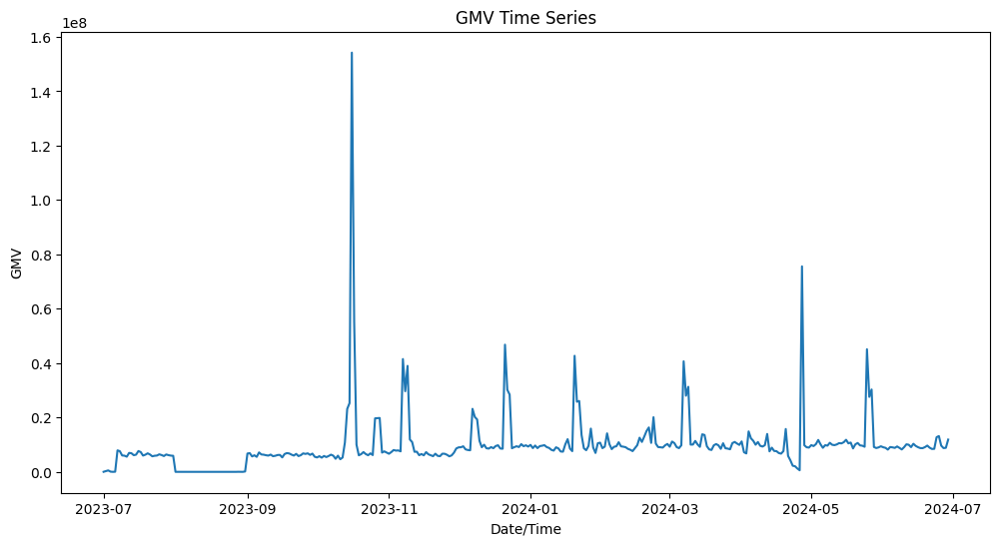

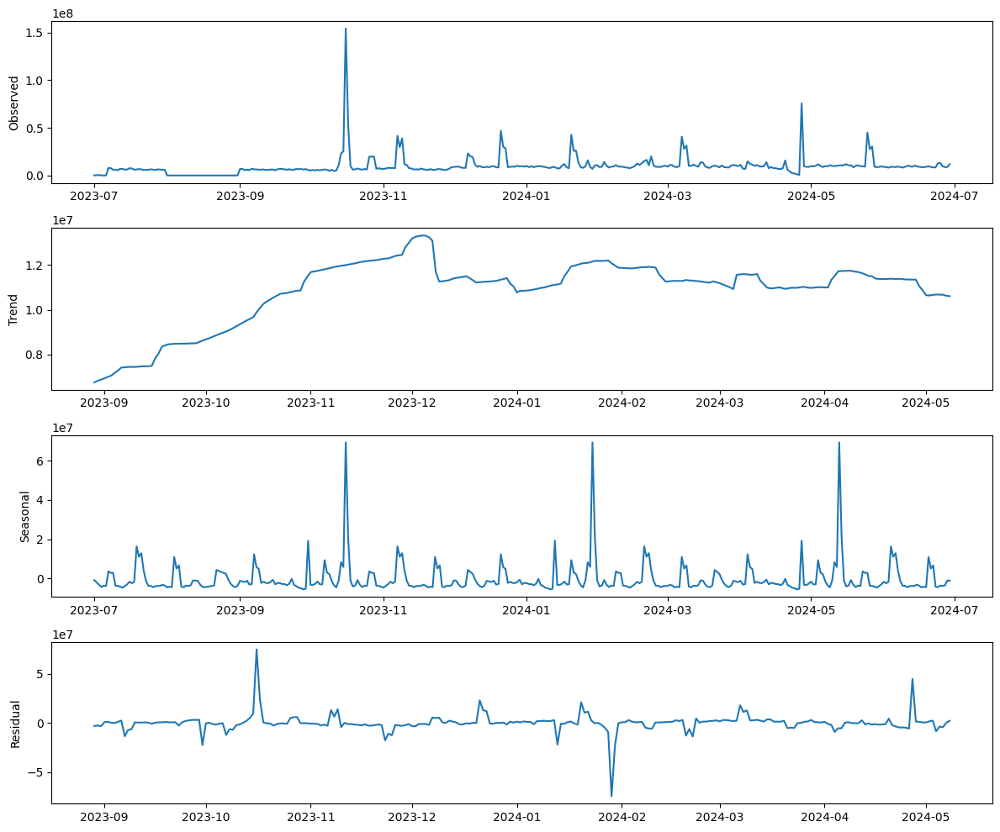

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

plt.figure(figsize=(12, 6))
plt.plot(wdata.index, wdata['gmv'])
plt.title('GMV Time Series')
plt.xlabel('Date/Time')
plt.ylabel('GMV')
plt.show()

# 2. Decompose the time series:
decomposition = sm.tsa.seasonal_decompose(wdata['gmv'], model='additive', period=105)  # Adjust period if needed

# Plot the decomposed components:
fig, axes = plt.subplots(4, 1, figsize=(12, 10))
axes[0].plot(decomposition.observed)
axes[0].set_ylabel('Observed')
axes[1].plot(decomposition.trend)
axes[1].set_ylabel('Trend')
axes[2].plot(decomposition.seasonal)
axes[2].set_ylabel('Seasonal')
axes[3].plot(decomposition.resid)
axes[3].set_ylabel('Residual')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor

X = wdata[['Mean Temp (°C)', 'Range of Temp', 'Deviation', 'PrecipitationCategory', 'TemperatureCategory', 'Year', 'Month', 'Day']]
y = wdata['gmv']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(f_regression, k=5)),
    ('model', XGBRegressor())
])


pipeline.fit(X_train, y_train)
score = pipeline.score(X_test, y_test)
print(f"Model score: {score}")


selected_features = X.columns[pipeline.named_steps['feature_selection'].get_support()]
print(f"Selected features: {selected_features}")

Model score: -0.01676215844996376
Selected features: Index(['Mean Temp (°C)', 'Range of Temp', 'Deviation', 'PrecipitationCategory',
       'Year'],
      dtype='object')


###EDA and data visualisation

In [ ]:
#df.reset_index(drop=True, inplace=True)
df.index

RangeIndex(start=0, stop=358, step=1)

In [ ]:
df.head()

,Date/Time,gmv
0,2023-07-01,20747.0
1,2023-07-03,534059.0
2,2023-07-04,79378.0
3,2023-07-05,1899.0
4,2023-07-06,52545.0


In [ ]:
import pandas as pd
#df=pd.read_csv('/content/df.csv')
df=wdata
df['Extreme Temp Flag']=[1 if x<-3 or x>23 else 0 for x in df['Mean Temp (°C)']]
df['Rain Flag']=[1 if x>0 else 0 for x in df['Total Rain (mm)']]
df['Snow Flag']=[1 if x>0 else 0 for x in df['Total Snow (cm)']]
df['7DayAvgTemp'] = df['Mean Temp (°C)'].rolling(window=7, center=True, min_periods=1).mean()
df['YesterdayMeanTemp'] = df['Mean Temp (°C)'].shift(1)
df['YesterdayTotalPrecip'] = df['Total Precip (mm)'].shift(1)
#df.index = pd.to_datetime(df.index)
# df['Date/Time']=df.index
df.reset_index(inplace=True,drop=False)
df['Week'] = df['Date/Time'].dt.isocalendar().week
df['DayOfWeek'] = df['Date/Time'].dt.dayofweek

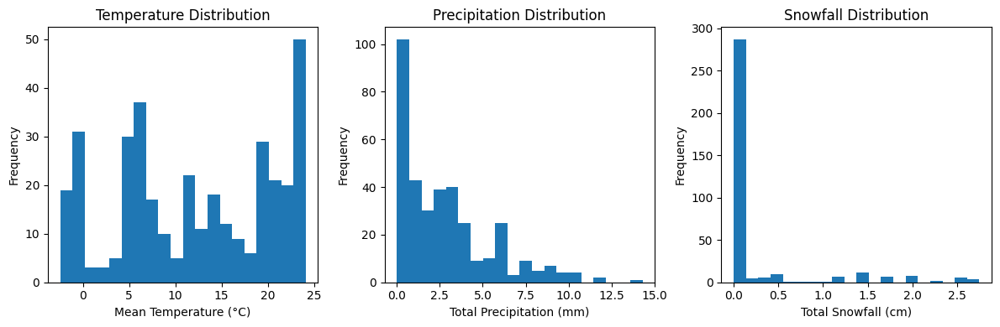

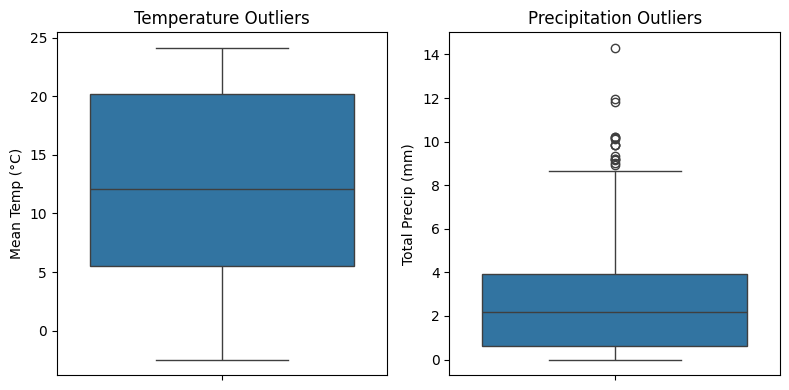

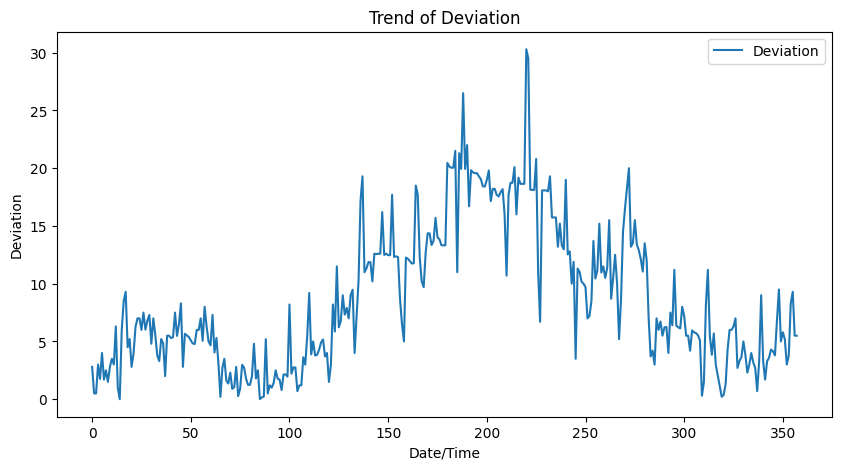

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.hist(df['Mean Temp (°C)'], bins=20)
plt.title('Temperature Distribution')
plt.xlabel('Mean Temperature (°C)')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(df['Total Precip (mm)'], bins=20)
plt.title('Precipitation Distribution')
plt.xlabel('Total Precipitation (mm)')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(df['Total Snow (cm)'], bins=20)
plt.title('Snowfall Distribution')
plt.xlabel('Total Snowfall (cm)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# 2. Boxplots for Outliers
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
sns.boxplot(y=df['Mean Temp (°C)'])
plt.title('Temperature Outliers')

plt.subplot(1, 2, 2)
sns.boxplot(y=df['Total Precip (mm)'])
plt.title('Precipitation Outliers')
plt.tight_layout()
plt.show()

# 3. Trends in Degree Days
plt.figure(figsize=(10, 5))
plt.plot(df.index, df['Deviation'], label='Deviation')
plt.title('Trend of Deviation')
plt.xlabel('Date/Time')
plt.ylabel('Deviation')
plt.legend()
plt.show()

<ipython-input-349-4050b25db6b8>:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby('Season')['Mean Temp (°C)'].mean().plot(kind='bar')


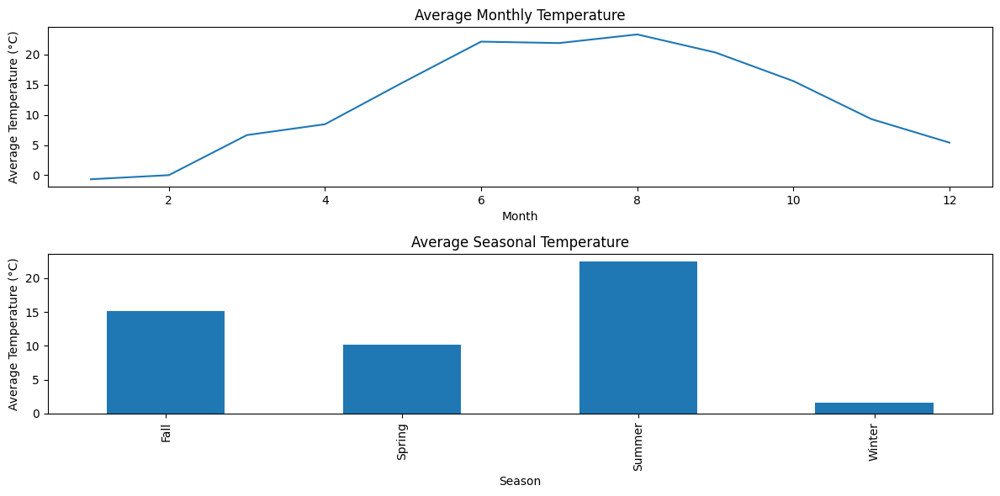

<ipython-input-349-4050b25db6b8>:20: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df['Total Precip (mm)'].resample('M').sum().plot()


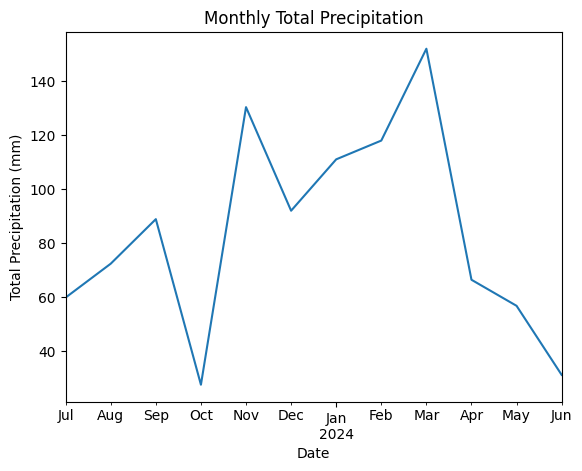

<ipython-input-349-4050b25db6b8>:27: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df[['Total Rain (mm)', 'Total Snow (cm)']].resample('M').sum().plot()


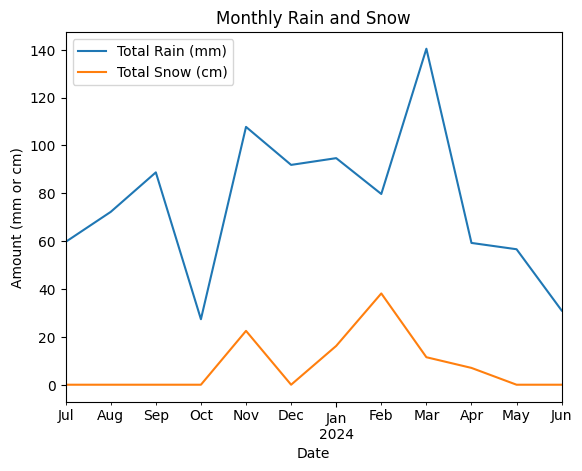

In [ ]:
df['Season'] = pd.cut(df['Month'], [0, 2, 5, 8, 11,12], labels=['Winter', 'Spring', 'Summer', 'Fall','Winter'], include_lowest=True,right=True,ordered=False)

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
df.groupby('Month')['Mean Temp (°C)'].mean().plot()
plt.title('Average Monthly Temperature')
plt.xlabel('Month')
plt.ylabel('Average Temperature (°C)')

plt.subplot(2, 1, 2)
df.groupby('Season')['Mean Temp (°C)'].mean().plot(kind='bar')
plt.title('Average Seasonal Temperature')
plt.xlabel('Season')
plt.ylabel('Average Temperature (°C)')

plt.tight_layout()
plt.show()
df.set_index('Date/Time',inplace=True)
# 2. Precipitation Trends (Rain/Snow)
df['Total Precip (mm)'].resample('M').sum().plot()
plt.title('Monthly Total Precipitation')
plt.xlabel('Date')
plt.ylabel('Total Precipitation (mm)')
plt.show()

# If you have separate 'Total Rain' and 'Total Snow' columns:
df[['Total Rain (mm)', 'Total Snow (cm)']].resample('M').sum().plot()
plt.title('Monthly Rain and Snow')
plt.xlabel('Date')
plt.ylabel('Amount (mm or cm)')
plt.show()

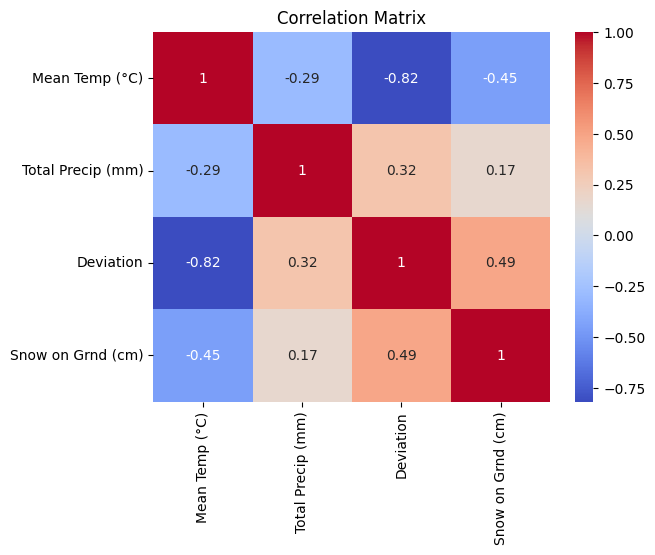

Correlation between Snow Accumulation and Minimum Temperature: -0.45594535468686415


In [ ]:
# 1. Correlation Matrix
correlation_matrix = df[['Mean Temp (°C)', 'Total Precip (mm)', 'Deviation','Snow on Grnd (cm)']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# If you have 'Snow on Grnd (cm)' and 'Min Temp (°C)' columns:
correlation = df['Snow on Grnd (cm)'].corr(df['Min Temp (°C)'])
print(f"Correlation between Snow Accumulation and Minimum Temperature: {correlation}")

In [ ]:
df.columns

Index(['gmv', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'Range of Temp', 'Deviation',
       'PrecipitationCategory', 'TemperatureCategory', 'Extreme Temp Flag',
       'Rain Flag', 'Snow Flag', '7DayAvgTemp', 'YesterdayMeanTemp',
       'YesterdayTotalPrecip', 'Week', 'DayOfWeek', 'Season'],
      dtype='object')

In [ ]:
df['DayOfWeek'].unique()

array([5, 0, 1, 2, 3, 4, 6], dtype=int32)

In [ ]:
weights = {
    'Mean Temp (°C)': 0.3,
    'Total Precip (mm)': 0.2,
    'Deviation': 0.15,
    'Snow on Grnd (cm)': 0.1,
    'Range of Temp': 0.1,
    'Extreme Temp Flag': 0.05,
    'Rain Flag': 0.05,
    'Snow Flag': 0.05
}

df['Weather_Index'] = 0

for feature, weight in weights.items():
    df['Weather_Index'] += df[feature] * weight
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler(feature_range=(0, 100))
# df['Weather_Index'] = scaler.fit_transform(df[['Weather_Index']])

print(df.head())

                 gmv  Year  Month  Day  Data Quality  Max Temp (°C)  \
Date/Time                                                             
2023-07-01   20747.0  2023      7    1           1.0      24.787500   
2023-07-03  534059.0  2023      7    3           1.0      24.860000   
2023-07-04   79378.0  2023      7    4           1.0      24.916667   
2023-07-05    1899.0  2023      7    5           1.0      25.028571   
2023-07-06   52545.0  2023      7    6           NaN      25.093750   

            Min Temp (°C)  Mean Temp (°C)  Total Rain (mm)  Total Snow (cm)  \
Date/Time                                                                     
2023-07-01      14.325000       19.572500         0.000000              0.0   
2023-07-03      14.260000       19.576000         1.720000              0.0   
2023-07-04      14.233333       19.590000         3.833333              0.0   
2023-07-05      14.292857       19.675714         3.785714              0.0   
2023-07-06      14.393750   

In [ ]:
df['YesterdayMeanTemp'].iloc[0]=df['Mean Temp (°C)'].iloc[0]
df['YesterdayTotalPrecip'].iloc[0]=df['Total Precip (mm)'].iloc[0]


<ipython-input-354-a2010140539d>:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['YesterdayMeanTemp'].iloc[0]=df['Mean Temp (°C)'].iloc[0]
<ipython-input-354-a2010140539d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy

In [ ]:
# df['gmv'].fillna(0,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 358 entries, 2023-07-01 to 2024-06-29
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   gmv                    358 non-null    float64 
 1   Year                   358 non-null    int32   
 2   Month                  358 non-null    int32   
 3   Day                    358 non-null    int32   
 4   Data Quality           207 non-null    float64 
 5   Max Temp (°C)          358 non-null    float64 
 6   Min Temp (°C)          358 non-null    float64 
 7   Mean Temp (°C)         358 non-null    float64 
 8   Total Rain (mm)        358 non-null    float64 
 9   Total Snow (cm)        358 non-null    float64 
 10  Total Precip (mm)      358 non-null    float64 
 11  Snow on Grnd (cm)      358 non-null    float64 
 12  Range of Temp          358 non-null    float64 
 13  Deviation              358 non-null    float64 
 14  PrecipitationCategory  

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
features = ['Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'Range of Temp', 'Deviation',
       'PrecipitationCategory', 'TemperatureCategory', 'Extreme Temp Flag',
       'Rain Flag', 'Snow Flag', '7DayAvgTemp', 'YesterdayMeanTemp',
       'YesterdayTotalPrecip', 'Week', 'DayOfWeek', 'Season']
target = 'gmv'
df['Season']=[1 if x=='Winter' else 2 if x=='Spring' else 3 if x=='Summer' else 4 for x in df['Season']]
X = df[features]
y = df[target]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = LinearRegression()
model.fit(X_scaled, y)

weights = dict(zip(features, model.coef_))

print("Feature Weights:")
for feature, weight in weights.items():
    print(f"{feature}: {weight}")

df['Weather_Index_lr'] = 0
for feature, weight in weights.items():
    df['Weather_Index_lr'] += df[feature] * weight
df['Weather_Index_lr']=scaler.fit_transform(df['Weather_Index_lr'].to_numpy(dtype='float32').reshape(-1, 1))

Feature Weights:
Mean Temp (°C): 13943518.216039257
Total Rain (mm): -76230.7466238942
Total Snow (cm): -1692723.9467249562
Total Precip (mm): -473953.40322808776
Snow on Grnd (cm): -444606.39692500804
Range of Temp: 1060870.300199452
Deviation: 1378469.3077351064
PrecipitationCategory: -865415.5667249325
TemperatureCategory: 1111795.9299388784
Extreme Temp Flag: -1941362.9460163456
Rain Flag: 1948248.640484173
Snow Flag: 823419.172305035
7DayAvgTemp: -14761423.22029984
YesterdayMeanTemp: -1515847.2031461536
YesterdayTotalPrecip: -433888.71729733323
Week: 580162.4253200256
DayOfWeek: 365666.4245151242
Season: 933502.3864878457


In [ ]:
!pip install scikit-learn
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
weather_features = ['Mean Temp (°C)', 'Total Precip (mm)', 'Deviation',
                    'Snow on Grnd (cm)', 'Range of Temp', 'Extreme Temp Flag',
                    'Rain Flag', 'Snow Flag']


weather_data = df[weather_features]
scaler = StandardScaler()
scaled_data = scaler.fit_transform(weather_data)


pca = PCA(n_components=1)
weather_index_pca = pca.fit_transform(scaled_data)

df['Weather_Index_PCA'] = weather_index_pca

print(df.head())

                 gmv  Year  Month  Day  Data Quality  Max Temp (°C)  \
Date/Time                                                             
2023-07-01   20747.0  2023      7    1           1.0      24.787500   
2023-07-03  534059.0  2023      7    3           1.0      24.860000   
2023-07-04   79378.0  2023      7    4           1.0      24.916667   
2023-07-05    1899.0  2023      7    5           1.0      25.028571   
2023-07-06   52545.0  2023      7    6           NaN      25.093750   

            Min Temp (°C)  Mean Temp (°C)  Total Rain (mm)  Total Snow (cm)  \
Date/Time                                                                     
2023-07-01      14.325000       19.572500         0.000000              0.0   
2023-07-03      14.260000       19.576000         1.720000              0.0   
2023-07-04      14.233333       19.590000         3.833333              0.0   
2023-07-05      14.292857       19.675714         3.785714              0.0   
2023-07-06      14.393750   

In [ ]:
print('Precipitation',df['PrecipitationCategory'].min(),'-',df['PrecipitationCategory'].max())
print('Temperature',df['TemperatureCategory'].min(),'-',df['TemperatureCategory'].max())
print('Temperature Flag',df['Extreme Temp Flag'].min(),'-',df['Extreme Temp Flag'].max())
print('Rain',df['Rain Flag'].min(),'-',df['Rain Flag'].max())
print('Snow',df['Snow Flag'].min(),'-',df['Snow Flag'].max())
print('Season',df['Season'].min(),'-',df['Season'].max())
df['Extreme Temp Flag'].nunique()

Precipitation 0 - 2
Temperature 0 - 2
Temperature Flag 0 - 1
Rain 0 - 1
Snow 0 - 1
Season 1 - 4


2

In [ ]:
cs=['PrecipitationCategory', 'TemperatureCategory', 'Extreme Temp Flag',
       'Rain Flag', 'Snow Flag','Season']
df['weather_score']=0
for d in cs:
  df['weather_score']+=(df[d]/df[d].max())

In [ ]:
df = df.reset_index(drop=False)

In [ ]:
df.to_csv('wfinal.csv', index=False)

#Final Merge

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
wdata=pd.read_csv('/content/wfinal (4).csv')

In [ ]:
wdata

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,7DayAvgTemp,YesterdayMeanTemp,YesterdayTotalPrecip,Week,DayOfWeek,Season,Weather_Index,Weather_Index_lr,Weather_Index_PCA,weather_score
0,2024-01-01,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,8.522616,5.316111,4.700000,1,0,1,5.633250,-1.264618,-3.368880,3.25
1,2024-02-01,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,9.885515,5.316111,4.700000,5,3,1,5.633250,-1.094524,-3.368880,3.25
2,2024-03-01,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,10.794114,5.316111,4.700000,9,4,2,7.079111,-0.785325,-2.471554,3.50
3,2024-04-01,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,11.443114,9.984074,3.133333,14,0,2,7.048222,-0.599688,-0.800634,3.50
4,2024-05-01,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,12.874685,13.474167,2.350000,18,2,2,6.603567,-0.506084,0.224051,4.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,2024-05-31,9.411335e+06,2024,5,31,0.0,23.083333,11.966667,17.540000,0.460000,...,17.930546,17.626429,2.400000,22,4,2,7.132667,-0.673172,1.809458,3.50
354,2023-07-31,5.910530e+06,2023,7,31,1.0,23.083333,11.966667,17.540000,0.000000,...,17.716510,17.540000,3.200000,31,0,3,8.158667,0.145153,1.149878,3.75
355,2023-08-31,1.373170e+05,2023,8,31,1.0,23.083333,11.966667,17.540000,0.000000,...,17.554405,17.540000,3.200000,35,3,3,7.963667,0.473988,1.275236,3.75
356,2023-10-31,7.083673e+06,2023,10,31,0.0,23.083333,11.966667,17.540000,0.460000,...,17.540000,17.540000,3.200000,44,1,4,7.132667,0.489403,1.809458,4.00


In [ ]:
wdata['Date/Time'] = pd.to_datetime(wdata['Date/Time'], format='%Y-%m-%d')
wdata['Date/Time'] = wdata['Date/Time'].dt.strftime('%d-%m-%Y')
wdata['Date/Time'].head()

,Date/Time
0,01-01-2024
1,01-02-2024
2,01-03-2024
3,01-04-2024
4,01-05-2024


In [ ]:
cod=pd.read_csv('/content/output_fin.csv')

In [ ]:
cod.shape

(1431794, 31)

In [ ]:
cod.head()

,Unnamed: 0,fsn_id,order_id,order_item_id,gmv,Units_Sold,deliverybdays,deliverycdays,order_payment_type,sla,...,total_delivery_days,list_price,Discount,product_type,purchase_frequency,average_order_value,Sale_Period_Flag,isPaydayWeek,isHolidayWeek,isHoliday
0,0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,...,0.0,6400.0,10.987483,Luxury,1,6400.0,1,0,0,0
1,1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,...,0.0,6900.0,4.033380,Luxury,2,3450.0,1,0,0,0
2,2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,...,0.0,1990.0,5.192949,Mass-market,1,1990.0,1,0,0,0
3,3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,...,0.0,1690.0,19.485469,Mass-market,1,1690.0,1,1,1,0
4,4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,...,0.0,1618.0,22.915674,Mass-market,2,809.0,1,0,0,0


In [ ]:
cod.columns

Index(['Unnamed: 0', 'fsn_id', 'order_id', 'order_item_id', 'gmv',
       'Units_Sold', 'deliverybdays', 'deliverycdays', 'order_payment_type',
       'sla', 'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla',
       'date', 'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday',
       'Order Hour', 'total_delivery_days', 'list_price', 'Discount',
       'product_type', 'purchase_frequency', 'average_order_value',
       'Sale_Period_Flag', 'isPaydayWeek', 'isHolidayWeek', 'isHoliday'],
      dtype='object')

In [ ]:
cod.drop(columns=['Unnamed: 0','cust_id', 'pincode','sla','product_procurement_sla','time', 'Order_Combo','Order Hour'
        ,'total_delivery_days', 'list_price', 'Discount','purchase_frequency', 'average_order_value'], inplace=True)

In [ ]:
cod.isna().sum()

,0
fsn_id,0
order_id,0
order_item_id,0
gmv,0
Units_Sold,0
deliverybdays,0
deliverycdays,0
order_payment_type,0
product_mrp,0
date,0


In [ ]:
cod['date'].head()

,date
0,17-10-2023
1,19-10-2023
2,20-10-2023
3,14-10-2023
4,17-10-2023


In [ ]:
cod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1431794 entries, 0 to 1431793
Data columns (total 18 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   fsn_id              1431794 non-null  object 
 1   order_id            1431794 non-null  float64
 2   order_item_id       1431794 non-null  float64
 3   gmv                 1431794 non-null  float64
 4   Units_Sold          1431794 non-null  int64  
 5   deliverybdays       1431794 non-null  float64
 6   deliverycdays       1431794 non-null  float64
 7   order_payment_type  1431794 non-null  object 
 8   product_mrp         1431794 non-null  int64  
 9   date                1431794 non-null  object 
 10  Month               1431794 non-null  object 
 11  Year                1431794 non-null  int64  
 12  Order Weekday       1431794 non-null  object 
 13  product_type        1431794 non-null  object 
 14  Sale_Period_Flag    1431794 non-null  int64  
 15  isPaydayWeek   

In [ ]:
cod['date'].nunique()

358

In [ ]:
wdata['Date/Time'] = pd.to_datetime(wdata['Date/Time'], format='%Y-%m-%d')
wdata['Date/Time'] = wdata['Date/Time'].dt.strftime('%d-%m-%Y')
wdata['Date/Time']

,Date/Time
0,01-01-2024
1,01-02-2024
2,01-03-2024
3,01-04-2024
4,01-05-2024
...,...
353,31-05-2024
354,31-07-2023
355,31-08-2023
356,31-10-2023


In [ ]:
cod['list price']=cod['gmv']/cod['Units_Sold']
cod['discount']=100*((cod['product_mrp']-cod['list price'])/cod['product_mrp'])

### Order Payment

In [ ]:
cod['order_payment_type'].unique()

array(['COD', 'Prepaid'], dtype=object)

In [ ]:
for payment_type in cod['order_payment_type'].unique():
    # Create a temporary DataFrame to count payment types per day
    temp_df = cod[cod['order_payment_type'] == payment_type].groupby('date')['order_payment_type'].count().reset_index(name=payment_type)

    # Merge the temporary DataFrame with the main 'merged' DataFrame
    merged = pd.merge(merged, temp_df, left_on='Date/Time', right_on='date', how='left')

    # Drop the unnecessary 'date' column from the temporary DataFrame
    merged = merged.drop(columns=['date'])

In [ ]:
merged.shape

(358, 38)

In [ ]:
merged.head()

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,DayOfWeek,Season,Weather_Index,Weather_Index_lr,Weather_Index_PCA,weather_score,fsn_ids,order_item_ids,COD,Prepaid
0,01-01-2024,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,0,1,5.633250,-1.264618,-3.368880,3.25,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGAR6NNBMR': 1,...","{1484298082606300.0: 2, 1484411947774000.0: 1,...",3544.0,766.0
1,01-02-2024,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,3,1,5.633250,-1.094524,-3.368880,3.25,"{'ACCCX3S5HGERUPBZ': 1, 'ACCCX3SG2GG9YYAH': 9,...","{1501551500954600.0: 1, 1502255683583600.0: 1,...",2940.0,735.0
2,01-03-2024,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,4,2,7.079111,-0.785325,-2.471554,3.50,"{'ACCCX3SG2GG9YYAH': 3, 'ACCCX3SGAR6NNBMR': 1,...","{1480522881083700.0: 1, 1491178779713200.0: 1,...",3651.0,927.0
3,01-04-2024,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,0,2,7.048222,-0.599688,-0.800634,3.50,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGDGPZAQXD': 3,...","{1562880357047100.0: 2, 1563042228150400.0: 1,...",1874.0,2611.0
4,01-05-2024,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,2,2,6.603567,-0.506084,0.224051,4.00,"{'ACCCX3SG2GG9YYAH': 7, 'ACCCX3SGDGPZAQXD': 7,...","{224819010.0: 1, 1588865809135000.0: 1, 158896...",3226.0,905.0


In [ ]:
merged.isna().sum()

,0
Date/Time,0
gmv,0
Year,0
Month,0
Day,0
Data Quality,0
Max Temp (°C),0
Min Temp (°C),0
Mean Temp (°C),0
Heat Deg Days (°C),0


###Product Type


In [ ]:
for prod_type in cod['product_type'].unique():
    # Create a temporary DataFrame to count payment types per day
    temp_df = cod[cod['product_type'] == prod_type].groupby('date')['product_type'].count().reset_index(name=prod_type)

    # Merge the temporary DataFrame with the main 'merged' DataFrame
    merged = pd.merge(merged, temp_df, left_on='Date/Time', right_on='date', how='left')

    # Drop the unnecessary 'date' column from the temporary DataFrame
    merged = merged.drop(columns=['date'])

In [ ]:
merged.fillna(0, inplace=True)

In [ ]:
merged

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,Weather_Index,Weather_Index_lr,Weather_Index_PCA,weather_score,fsn_ids,order_item_ids,COD,Prepaid,Luxury,Mass-market
0,01-01-2024,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,5.633250,-1.264618,-3.368880,3.25,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGAR6NNBMR': 1,...","{1484298082606300.0: 2, 1484411947774000.0: 1,...",3544.0,766.0,758.0,3552
1,01-02-2024,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,5.633250,-1.094524,-3.368880,3.25,"{'ACCCX3S5HGERUPBZ': 1, 'ACCCX3SG2GG9YYAH': 9,...","{1501551500954600.0: 1, 1502255683583600.0: 1,...",2940.0,735.0,689.0,2986
2,01-03-2024,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,7.079111,-0.785325,-2.471554,3.50,"{'ACCCX3SG2GG9YYAH': 3, 'ACCCX3SGAR6NNBMR': 1,...","{1480522881083700.0: 1, 1491178779713200.0: 1,...",3651.0,927.0,758.0,3820
3,01-04-2024,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,7.048222,-0.599688,-0.800634,3.50,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGDGPZAQXD': 3,...","{1562880357047100.0: 2, 1563042228150400.0: 1,...",1874.0,2611.0,896.0,3589
4,01-05-2024,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,6.603567,-0.506084,0.224051,4.00,"{'ACCCX3SG2GG9YYAH': 7, 'ACCCX3SGDGPZAQXD': 7,...","{224819010.0: 1, 1588865809135000.0: 1, 158896...",3226.0,905.0,814.0,3317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,31-05-2024,9.411335e+06,2024,5,31,0.0,23.083333,11.966667,17.540000,0.460000,...,7.132667,-0.673172,1.809458,3.50,"{'ACCCX3SG2GG9YYAH': 9, 'ACCCX3SGDGPZAQXD': 3,...","{1592001528428200.0: 1, 1606647500163600.0: 1,...",3628.0,886.0,793.0,3721
354,31-07-2023,5.910530e+06,2023,7,31,1.0,23.083333,11.966667,17.540000,0.000000,...,8.158667,0.145153,1.149878,3.75,"{'ACCCX3SGAR6NNBMR': 1, 'ACCCX3SGDGPZAQXD': 2,...","{219704924.0: 1, 221066576.0: 1, 222015682.0: ...",2246.0,756.0,654.0,2348
355,31-08-2023,1.373170e+05,2023,8,31,1.0,23.083333,11.966667,17.540000,0.000000,...,7.963667,0.473988,1.275236,3.75,"{'ACCCX3SG2GG9YYAH': 1, 'ACCCZQ8YWF4AH7GJ': 1,...","{241021674.0: 1, 241024289.0: 1, 241062008.0: ...",72.0,16.0,18.0,70
356,31-10-2023,7.083673e+06,2023,10,31,0.0,23.083333,11.966667,17.540000,0.460000,...,7.132667,0.489403,1.809458,4.00,"{'ACCCX3SGAR6NNBMR': 1, 'ACCCX3SGDGPZAQXD': 9,...","{1417475772481700.0: 1, 1419176908552500.0: 1,...",2988.0,689.0,694.0,2983


###Product_mrp and List Price day wise

In [ ]:
product_mrp_daywise_sum = cod.groupby('date').apply(
    lambda x: (x['product_mrp'] * x['Units_Sold']).sum()
).reset_index(name='product_mrp_sum')
product_mrp_series = pd.Series(
    product_mrp_daywise_sum['product_mrp_sum'].values,
    index=product_mrp_daywise_sum['date']
)
list_price_daywise_sum = cod.groupby('date').apply(
    lambda x: (x['list price'] * x['Units_Sold']).sum()
).reset_index(name='list_price_sum')
list_price_series = pd.Series(
    list_price_daywise_sum['list_price_sum'].values,
    index=list_price_daywise_sum['date']
)

<ipython-input-56-bc64b31b8b5a>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  product_mrp_daywise_sum = cod.groupby('date').apply(
<ipython-input-56-bc64b31b8b5a>:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  list_price_daywise_sum = cod.groupby('date').apply(


In [ ]:
product_mrp_series.shape

(358,)

In [ ]:
product_mrp_series.head()

,0
date,
01-01-2024,16786446
01-02-2024,15179390
01-03-2024,15604323
01-04-2024,18675503
01-05-2024,15818684


In [ ]:
product_mrp_df = product_mrp_series.to_frame(name='prod_mrp')

In [ ]:
product_mrp_df

,prod_mrp
date,
01-01-2024,16786446
01-02-2024,15179390
01-03-2024,15604323
01-04-2024,18675503
01-05-2024,15818684
...,...
31-05-2024,16910795
31-07-2023,10060788
31-08-2023,212403


In [ ]:
merged = pd.merge(merged, product_mrp_df, left_on='Date/Time', right_on='date', how='inner')

merged.head()

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,fsn_ids,order_item_ids,COD,Prepaid,Luxury,Mass-market,del_b,del_c,prod_mrp_x,prod_mrp_y
0,01-01-2024,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGAR6NNBMR': 1,...","{1484298082606300.0: 2, 1484411947774000.0: 1,...",3544.0,766.0,758.0,3552,{1484298082606300.0: {1484298082606300.0: 0.0}...,{1484298082606300.0: {1484298082606300.0: 0.0}...,16786446,16786446
1,01-02-2024,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,"{'ACCCX3S5HGERUPBZ': 1, 'ACCCX3SG2GG9YYAH': 9,...","{1501551500954600.0: 1, 1502255683583600.0: 1,...",2940.0,735.0,689.0,2986,{1501551500954600.0: {1501551500954600.0: 0.0}...,{1501551500954600.0: {1501551500954600.0: 0.0}...,15179390,15179390
2,01-03-2024,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,"{'ACCCX3SG2GG9YYAH': 3, 'ACCCX3SGAR6NNBMR': 1,...","{1480522881083700.0: 1, 1491178779713200.0: 1,...",3651.0,927.0,758.0,3820,{1480522881083700.0: {1480522881083700.0: 0.0}...,{1480522881083700.0: {1480522881083700.0: 0.0}...,15604323,15604323
3,01-04-2024,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGDGPZAQXD': 3,...","{1562880357047100.0: 2, 1563042228150400.0: 1,...",1874.0,2611.0,896.0,3589,{1534172982625000.0: {3.0003734771739e+17: 4.0...,{1534172982625000.0: {3.0003734771739e+17: 5.0...,18675503,18675503
4,01-05-2024,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,"{'ACCCX3SG2GG9YYAH': 7, 'ACCCX3SGDGPZAQXD': 7,...","{224819010.0: 1, 1588865809135000.0: 1, 158896...",3226.0,905.0,814.0,3317,"{178303643.0: {224819010.0: 2.0}, 158886580913...","{178303643.0: {224819010.0: 2.0}, 158886580913...",15818684,15818684


In [ ]:
merged['prod_mrp'] = merged['prod_mrp_x']

# Drop the unwanted columns
merged = merged.drop(columns=['prod_mrp_x', 'prod_mrp_y'])

In [ ]:
list_price_df = list_price_series.to_frame(name='list_price')

In [ ]:
merged = pd.merge(merged, list_price_df, left_on='Date/Time', right_on='date', how='inner')

merged.head()

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,fsn_ids,order_item_ids,COD,Prepaid,Luxury,Mass-market,del_b,del_c,prod_mrp,list_price
0,01-01-2024,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGAR6NNBMR': 1,...","{1484298082606300.0: 2, 1484411947774000.0: 1,...",3544.0,766.0,758.0,3552,{1484298082606300.0: {1484298082606300.0: 0.0}...,{1484298082606300.0: {1484298082606300.0: 0.0}...,16786446,9.919966e+06
1,01-02-2024,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,"{'ACCCX3S5HGERUPBZ': 1, 'ACCCX3SG2GG9YYAH': 9,...","{1501551500954600.0: 1, 1502255683583600.0: 1,...",2940.0,735.0,689.0,2986,{1501551500954600.0: {1501551500954600.0: 0.0}...,{1501551500954600.0: {1501551500954600.0: 0.0}...,15179390,8.714181e+06
2,01-03-2024,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,"{'ACCCX3SG2GG9YYAH': 3, 'ACCCX3SGAR6NNBMR': 1,...","{1480522881083700.0: 1, 1491178779713200.0: 1,...",3651.0,927.0,758.0,3820,{1480522881083700.0: {1480522881083700.0: 0.0}...,{1480522881083700.0: {1480522881083700.0: 0.0}...,15604323,9.249601e+06
3,01-04-2024,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,"{'ACCCX3SG2GG9YYAH': 6, 'ACCCX3SGDGPZAQXD': 3,...","{1562880357047100.0: 2, 1563042228150400.0: 1,...",1874.0,2611.0,896.0,3589,{1534172982625000.0: {3.0003734771739e+17: 4.0...,{1534172982625000.0: {3.0003734771739e+17: 5.0...,18675503,1.119406e+07
4,01-05-2024,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,"{'ACCCX3SG2GG9YYAH': 7, 'ACCCX3SGDGPZAQXD': 7,...","{224819010.0: 1, 1588865809135000.0: 1, 158896...",3226.0,905.0,814.0,3317,"{178303643.0: {224819010.0: 2.0}, 158886580913...","{178303643.0: {224819010.0: 2.0}, 158886580913...",15818684,9.831454e+06


###Sale Period and Holiday Flag

In [ ]:
sale_period_flag = cod.groupby('date')['Sale_Period_Flag'].max().astype(int)
holiday_flag = cod.groupby('date')['isHoliday'].max().astype(int)

,Sale_Period_Flag
date,
01-01-2024,1
01-02-2024,1
01-03-2024,1
01-04-2024,0
01-05-2024,0
...,...
31-05-2024,0
31-07-2023,1
31-08-2023,1


In [ ]:
merged = pd.merge(merged, sale_period_flag, left_on='Date/Time', right_on='date', how='inner')

merged.head()

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,order_item_ids,COD,Prepaid,Luxury,Mass-market,del_b,del_c,prod_mrp,list_price,Sale_Period_Flag
0,01-01-2024,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,"{1484298082606300.0: 2, 1484411947774000.0: 1,...",3544.0,766.0,758.0,3552,{1484298082606300.0: {1484298082606300.0: 0.0}...,{1484298082606300.0: {1484298082606300.0: 0.0}...,16786446,9.919966e+06,1
1,01-02-2024,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,"{1501551500954600.0: 1, 1502255683583600.0: 1,...",2940.0,735.0,689.0,2986,{1501551500954600.0: {1501551500954600.0: 0.0}...,{1501551500954600.0: {1501551500954600.0: 0.0}...,15179390,8.714181e+06,1
2,01-03-2024,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,"{1480522881083700.0: 1, 1491178779713200.0: 1,...",3651.0,927.0,758.0,3820,{1480522881083700.0: {1480522881083700.0: 0.0}...,{1480522881083700.0: {1480522881083700.0: 0.0}...,15604323,9.249601e+06,1
3,01-04-2024,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,"{1562880357047100.0: 2, 1563042228150400.0: 1,...",1874.0,2611.0,896.0,3589,{1534172982625000.0: {3.0003734771739e+17: 4.0...,{1534172982625000.0: {3.0003734771739e+17: 5.0...,18675503,1.119406e+07,0
4,01-05-2024,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,"{224819010.0: 1, 1588865809135000.0: 1, 158896...",3226.0,905.0,814.0,3317,"{178303643.0: {224819010.0: 2.0}, 158886580913...","{178303643.0: {224819010.0: 2.0}, 158886580913...",15818684,9.831454e+06,0


In [ ]:

merged = pd.merge(merged, holiday_flag, left_on='Date/Time', right_on='date', how='inner')

merged.head()

,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),...,COD,Prepaid,Luxury,Mass-market,del_b,del_c,prod_mrp,list_price,Sale_Period_Flag,isHoliday
0,01-01-2024,9.919966e+06,2024,1,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,3544.0,766.0,758.0,3552,{1484298082606300.0: {1484298082606300.0: 0.0}...,{1484298082606300.0: {1484298082606300.0: 0.0}...,16786446,9.919966e+06,1,0
1,01-02-2024,8.714181e+06,2024,2,1,0.0,10.450000,-0.008333,5.316111,12.683889,...,2940.0,735.0,689.0,2986,{1501551500954600.0: {1501551500954600.0: 0.0}...,{1501551500954600.0: {1501551500954600.0: 0.0}...,15179390,8.714181e+06,1,0
2,01-03-2024,9.249601e+06,2024,3,1,1.0,15.133333,4.694444,9.984074,15.200000,...,3651.0,927.0,758.0,3820,{1480522881083700.0: {1480522881083700.0: 0.0}...,{1480522881083700.0: {1480522881083700.0: 0.0}...,15604323,9.249601e+06,1,0
3,01-04-2024,1.119406e+07,2024,4,1,1.0,18.900000,7.840278,13.474167,8.700000,...,1874.0,2611.0,896.0,3589,{1534172982625000.0: {3.0003734771739e+17: 4.0...,{1534172982625000.0: {3.0003734771739e+17: 5.0...,18675503,1.119406e+07,0,0
4,01-05-2024,9.831454e+06,2024,5,1,0.0,20.820000,9.750000,15.337111,2.662889,...,3226.0,905.0,814.0,3317,"{178303643.0: {224819010.0: 2.0}, 158886580913...","{178303643.0: {224819010.0: 2.0}, 158886580913...",15818684,9.831454e+06,0,0


In [ ]:
merged.shape

(358, 44)

In [ ]:
merged.isna().sum()

,0
Date/Time,0
gmv,0
Year,0
Month,0
Day,0
Data Quality,0
Max Temp (°C),0
Min Temp (°C),0
Mean Temp (°C),0
Heat Deg Days (°C),0


In [ ]:
merged.to_csv('merged_data.csv', index=False)

#Time Series Modelling

###LSTM

In [ ]:
wdata=pd.read_csv('wfinal (4).csv')

In [ ]:
wdata.fillna(0,inplace=True)

In [ ]:
wdata = wdata.sort_values(by=['Date/Time'])
wdata = wdata.reset_index(drop=True)

In [ ]:
# Split the data into train, validation, and test sets
from sklearn.model_selection import train_test_split
wdata.reset_index(drop=False,inplace=True)
train_data, test_data = train_test_split(wdata, test_size=0.2, shuffle=False)


# Separate the features (X) and the target (y)
X_train = train_data.drop(columns=['Date/Time', 'gmv'])
y_train = train_data['gmv']
X_test = test_data.drop(columns=['Date/Time', 'gmv'])
y_test = test_data['gmv']

In [ ]:
import torch
# Scale the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)

# Convert the scaled features back to DataFrames
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Initialize a StandardScaler instance for the target variable y
y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train.to_numpy(dtype='float32').reshape(-1, 1))

y_test_scaled = y_scaler.transform(y_test.to_numpy(dtype='float32').reshape(-1, 1))

# Convert DataFrames to NumPy arrays and then to PyTorch tensors
X_train_numpy = X_train_scaled.to_numpy(dtype='float32')

X_test_numpy = X_test_scaled.to_numpy(dtype='float32')
y_train_numpy = y_train_scaled

y_test_numpy = y_test_scaled
X_train_tensor = torch.tensor(X_train_numpy)

X_test_tensor = torch.tensor(X_test_numpy)
y_train_tensor = torch.tensor(y_train_numpy)

y_test_tensor = torch.tensor(y_test_numpy)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Definining the MAPE metric as a MAPE function
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Define RMSE metric as RMSE function
def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

In [ ]:
import torch.nn as nn
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_rate):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout_rate)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden and cell states
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)

        # Adding sequence_length dimension
        x = x.unsqueeze(1)

        # Forward propagate LSTM
        out, _ = self.lstm(x, (h0, c0))

        # Apply dropout
        out = self.dropout(out)

        # Decode the hidden state of the last time step
        out = self.fc(out[:, -1, :])
        return out

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
# Define Hyperparameters
input_size = X_train_scaled.shape[1]
hidden_size = 64
num_layers = 2
output_size = 1
num_epochs = 100
learning_rate = 0.001
batch_size = 32
dropout_rate = 0.2

# Create TensorDatasets and DataLoaders for train and validation sets
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)


# Create TensorDataset and DataLoader for the test set
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Initialize Neural Net
model = LSTM(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)

# Define Loss with Optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error
# Define number of folds for cross-validation
num_folds = 5

# Initialize list to store model evaluations
evaluations = []

# Create KFold cross-validator
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Loop through each fold
for fold, (train_index, test_index) in enumerate(kf.split(X_train_tensor)):
    print(f'Fold {fold+1} / {num_folds}')

    # Split data into train and test sets for this fold
    X_train_fold = X_train_tensor[train_index]
    y_train_fold = y_train_tensor[train_index]
    X_val_fold = X_train_tensor[test_index].to(device)
    y_val_fold = y_train_tensor[test_index]

    # Create train and validation loaders for this fold
    train_fold_dataset = TensorDataset(X_train_fold, y_train_fold)
    train_fold_loader = DataLoader(train_fold_dataset, batch_size=batch_size, shuffle=False)

    val_fold_dataset = TensorDataset(X_val_fold, y_val_fold)
    val_fold_loader = DataLoader(val_fold_dataset, batch_size=batch_size, shuffle=False)


    # Initialize Net
    model = LSTM(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)

    # Define Loss with Optimizer
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Train
    for epoch in range(num_epochs):
        for i, (inputs, targets) in enumerate(train_fold_loader):
            inputs = inputs.to(device).float()
            targets = targets.to(device).float()

            optimizer.zero_grad()
            outputs = model(inputs)
            outputs = outputs.view(-1, 1)  # Reshape the output tensor
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

        if (epoch+1) % 10 == 0:
            print(f'Fold {fold+1} / {num_folds}, Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Fold 1 / 5
Fold 1 / 5, Epoch [10/100], Loss: 0.0320
Fold 1 / 5, Epoch [20/100], Loss: 0.0268
Fold 1 / 5, Epoch [30/100], Loss: 0.0226
Fold 1 / 5, Epoch [40/100], Loss: 0.0094
Fold 1 / 5, Epoch [50/100], Loss: 0.0058
Fold 1 / 5, Epoch [60/100], Loss: 0.0078
Fold 1 / 5, Epoch [70/100], Loss: 0.0232
Fold 1 / 5, Epoch [80/100], Loss: 0.0041
Fold 1 / 5, Epoch [90/100], Loss: 0.0249
Fold 1 / 5, Epoch [100/100], Loss: 0.0089
Fold 2 / 5
Fold 2 / 5, Epoch [10/100], Loss: 0.0558
Fold 2 / 5, Epoch [20/100], Loss: 0.0640
Fold 2 / 5, Epoch [30/100], Loss: 0.0353
Fold 2 / 5, Epoch [40/100], Loss: 0.0438
Fold 2 / 5, Epoch [50/100], Loss: 0.0161
Fold 2 / 5, Epoch [60/100], Loss: 0.0402
Fold 2 / 5, Epoch [70/100], Loss: 0.0040
Fold 2 / 5, Epoch [80/100], Loss: 0.0119
Fold 2 / 5, Epoch [90/100], Loss: 0.0190
Fold 2 / 5, Epoch [100/100], Loss: 0.0245
Fold 3 / 5
Fold 3 / 5, Epoch [10/100], Loss: 0.0461
Fold 3 / 5, Epoch [20/100], Loss: 0.0451
Fold 3 / 5, Epoch [30/100], Loss: 0.0518
Fold 3 / 5, Epoch [40/

In [ ]:
# Train the final model on the entire train set
model.train()
for epoch in range(num_epochs):
    for i, (inputs, targets) in enumerate(train_loader):
        inputs = inputs.to(device).float()
        targets = targets.to(device).float()

        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.view(-1, 1)  # Reshape the output tensor
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


# Model evaluation on the training set
model.eval()
y_pred_train = []
y_true_train = []
with torch.no_grad():
    for inputs, targets in train_loader:
        inputs = inputs.to(device).float()
        targets = targets.cpu().detach().numpy()
        y_pred = model(inputs)
        y_pred = y_pred.cpu().detach().numpy()
        y_pred_train.extend(y_pred)
        y_true_train.extend(targets)

y_pred_unscaled_train = y_scaler.inverse_transform(y_pred_train)
y_train_unscaled = y_scaler.inverse_transform(y_true_train)

mse_train = mean_squared_error(y_train_unscaled, y_pred_unscaled_train)
mae_train = mean_absolute_error(y_train_unscaled, y_pred_unscaled_train)
mape_train = mean_absolute_percentage_error(y_train_unscaled, y_pred_unscaled_train)
rmse_train = calculate_rmse(y_train_unscaled, y_pred_unscaled_train)

print(f'Training Set MSE: {mse_train:.0f}')
print(f'Training Set MAE: {mae_train:.0f}')
print(f'Training Set MAPE: {mape_train:.2f}')
print(f'Training Set RMSE: {rmse_train:.0f}')

Epoch [10/100], Loss: 0.0652
Epoch [20/100], Loss: 0.0652
Epoch [30/100], Loss: 0.0671
Epoch [40/100], Loss: 0.1131
Epoch [50/100], Loss: 0.0484
Epoch [60/100], Loss: 0.0573
Epoch [70/100], Loss: 0.0385
Epoch [80/100], Loss: 0.0635
Epoch [90/100], Loss: 0.0484
Epoch [100/100], Loss: 0.0276
Training Set MSE: 5516164883885
Training Set MAE: 1681611
Training Set MAPE: 30562.93
Training Set RMSE: 2348652


In [ ]:
model.eval()
y_pred_tests = []
y_true_tests = []
with torch.no_grad():
    for inputs, targets in test_loader:
        inputs = inputs.to(device).float()
        targets = targets.cpu().detach().numpy()
        y_pred_test = model(inputs)
        y_pred_test = y_pred_test.cpu().detach().numpy()
        y_pred_tests.extend(y_pred_test)
        y_true_tests.extend(targets)

y_pred_unscaled_test = y_scaler.inverse_transform(y_pred_tests)
y_test_unscaled = y_scaler.inverse_transform(y_true_tests)

mse = mean_squared_error(y_test_unscaled, y_pred_unscaled_test)
mae = mean_absolute_error(y_test_unscaled, y_pred_unscaled_test)
mape = mean_absolute_percentage_error(y_test_unscaled, y_pred_unscaled_test)
rmse = calculate_rmse(y_test_unscaled, y_pred_unscaled_test)

print(f'Test Set MSE: {mse:.0f}')
print(f'Test Set MAE: {mae:.0f}')
print(f'Test Set MAPE: {mape:.2f}')
print(f'Test Set RMSE: {rmse:.0f}')

Test Set MSE: 126949984166239
Test Set MAE: 5643802
Test Set MAPE: 75.72
Test Set RMSE: 11267208


In [ ]:
input_size = X_train_scaled.shape[1]


# Create TensorDatasets and DataLoaders for train and validation sets
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)



# Create TensorDataset and DataLoader for the test set
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
param_grid = {
    'hidden_size': [32, 64, 128, 256],  # Number of units in the hidden state
    'num_layers': [1, 2, 3, 4],        # Number of LSTM layers
    'dropout_rate': [0.2, 0.3, 0.4],     # Dropout rate
    'learning_rate': [0.01, 0.001, 0.0001], # Learning rate for optimizer
    'batch_size': [16, 32, 64, 128]   # Batch size
}
import itertools
all_param_combinations = list(itertools.product(*param_grid.values()))
least_mse = float('inf')
best_param_combination = None
best_model = None
best_scores = None
tot=4*4*3*3*4
cnt=0

In [ ]:
for param_combo in all_param_combinations:
    param_dict = dict(zip(param_grid.keys(), param_combo))
    cnt+=1;
    print("Testing params ",cnt,"out of ",tot)
    print(param_dict)
    hidden_size = param_dict['hidden_size']
    num_layers = param_dict['num_layers']
    dropout_rate = param_dict['dropout_rate']
    learning_rate = param_dict['learning_rate']
    # Initialize Neural Net
    model = LSTM(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)

    # Define Loss with Optimizer
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    # Define number of folds for cross-validation
    num_folds = 5

    # Initialize list to store model evaluations
    evaluations = []

    # Create KFold cross-validator
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Loop through each fold
    for fold, (train_index, test_index) in enumerate(kf.split(X_train_tensor)):
        print(f'Fold {fold+1} / {num_folds}')

        # Split data into train and test sets for this fold
        X_train_fold = X_train_tensor[train_index]
        y_train_fold = y_train_tensor[train_index]
        X_val_fold = X_train_tensor[test_index].to(device)
        y_val_fold = y_train_tensor[test_index]

        # Create train and validation loaders for this fold
        train_fold_dataset = TensorDataset(X_train_fold, y_train_fold)
        train_fold_loader = DataLoader(train_fold_dataset, batch_size=batch_size, shuffle=False)

        val_fold_dataset = TensorDataset(X_val_fold, y_val_fold)
        val_fold_loader = DataLoader(val_fold_dataset, batch_size=batch_size, shuffle=False)


        # Initialize Net
        model = LSTM(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)

        # Define Loss with Optimizer
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

        # Train
        for epoch in range(num_epochs):
            for i, (inputs, targets) in enumerate(train_fold_loader):
                inputs = inputs.to(device).float()
                targets = targets.to(device).float()

                optimizer.zero_grad()
                outputs = model(inputs)
                outputs = outputs.view(-1, 1)  # Reshape the output tensor
                loss = criterion(outputs, targets)
                loss.backward()
                optimizer.step()

            if (epoch+1) % 100 == 0:
                print(f'Fold {fold+1} / {num_folds}, Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


    # Train the final model on the entire train set
    model.train()
    for epoch in range(num_epochs):
        for i, (inputs, targets) in enumerate(train_loader):
            inputs = inputs.to(device).float()
            targets = targets.to(device).float()

            optimizer.zero_grad()
            outputs = model(inputs)
            outputs = outputs.view(-1, 1)  # Reshape the output tensor
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

        if (epoch+1) % 20 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


    # Model evaluation on the training set
    model.eval()
    y_pred_train = []
    y_true_train = []
    with torch.no_grad():
        for inputs, targets in train_loader:
            inputs = inputs.to(device).float()
            targets = targets.cpu().detach().numpy()
            y_pred = model(inputs)
            y_pred = y_pred.cpu().detach().numpy()
            y_pred_train.extend(y_pred)
            y_true_train.extend(targets)

    y_pred_unscaled_train = y_scaler.inverse_transform(y_pred_train)
    y_train_unscaled = y_scaler.inverse_transform(y_true_train)

    mse_train = mean_squared_error(y_train_unscaled, y_pred_unscaled_train)
    mae_train = mean_absolute_error(y_train_unscaled, y_pred_unscaled_train)
    mape_train = mean_absolute_percentage_error(y_train_unscaled, y_pred_unscaled_train)
    rmse_train = calculate_rmse(y_train_unscaled, y_pred_unscaled_train)

    print(f'Training Set MSE: {mse_train:.0f}')
    print(f'Training Set MAE: {mae_train:.0f}')
    print(f'Training Set MAPE: {mape_train:.2f}')
    print(f'Training Set RMSE: {rmse_train:.0f}')
    # Model evaluation on test set
    model.eval()
    y_pred_tests = []
    y_true_tests = []
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = inputs.to(device).float()
            targets = targets.cpu().detach().numpy()
            y_pred_test = model(inputs)
            y_pred_test = y_pred_test.cpu().detach().numpy()
            y_pred_tests.extend(y_pred_test)
            y_true_tests.extend(targets)

    y_pred_unscaled_test = y_scaler.inverse_transform(y_pred_tests)
    y_test_unscaled = y_scaler.inverse_transform(y_true_tests)

    mse = mean_squared_error(y_test_unscaled, y_pred_unscaled_test)
    mae = mean_absolute_error(y_test_unscaled, y_pred_unscaled_test)
    mape = mean_absolute_percentage_error(y_test_unscaled, y_pred_unscaled_test)
    rmse = calculate_rmse(y_test_unscaled, y_pred_unscaled_test)
    if mse < least_mse:
        least_mse = mse
        best_param_combination = param_dict
        best_model = model
        best_scores = {'mse': mse, 'mae': mae, 'mape': mape, 'rmse': rmse}
    print(f'Test Set MSE: {mse:0f}')
    print(f'Test Set MAE: {mae:0f}')
    print(f'Test Set MAPE: {mape:.2f}')
    print(f'Test Set RMSE: {rmse:0f}')

Testing params  1 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0031
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0220
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0040
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0186
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0037
Epoch [20/100], Loss: 0.0406
Epoch [40/100], Loss: 0.0305
Epoch [60/100], Loss: 0.0226
Epoch [80/100], Loss: 0.0263
Epoch [100/100], Loss: 0.0191
Training Set MSE: 1833080692887
Training Set MAE: 922578
Training Set MAPE: 14942.15
Training Set RMSE: 1353913
Test Set MSE: 136997261526256.031250
Test Set MAE: 6350290.940378
Test Set MAPE: 92.79
Test Set RMSE: 11704582.928334
Testing params  2 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0005
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0333
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0057
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0018
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0164
Epoch [20/100], Loss: 0.0304
Epoch [40/100], Loss: 0.0372
Epoch [60/100], Loss: 0.0162
Epoch [80/100], Loss: 0.0160
Epoch [100/100], Loss: 0.0204
Training Set MSE: 1834286943658
Training Set MAE: 853236
Training Set MAPE: 9546.38
Training Set RMSE: 1354358
Test Set MSE: 121644261661154.484375
Test Set MAE: 5804883.329334
Test Set MAPE: 76.92
Test Set RMSE: 11029245.743076
Testing params  3 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0049
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0157
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0052
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0377
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0023
Epoch [20/100], Loss: 0.0452
Epoch [40/100], Loss: 0.0106
Epoch [60/100], Loss: 0.0211
Epoch [80/100], Loss: 0.0090
Epoch [100/100], Loss: 0.0218
Training Set MSE: 1339474232132
Training Set MAE: 841303
Training Set MAPE: 15145.72
Training Set RMSE: 1157357
Test Set MSE: 145823257723731.531250
Test Set MAE: 6946938.678483
Test Set MAPE: 103.69
Test Set RMSE: 12075730.111415
Testing params  4 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0016
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0107
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0093
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0049
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0048
Epoch [20/100], Loss: 0.0588
Epoch [40/100], Loss: 0.0267
Epoch [60/100], Loss: 0.0229
Epoch [80/100], Loss: 0.0132
Epoch [100/100], Loss: 0.0240
Training Set MSE: 1291457555131
Training Set MAE: 813115
Training Set MAPE: 8342.75
Training Set RMSE: 1136423
Test Set MSE: 149014954141688.718750
Test Set MAE: 7100105.801847
Test Set MAPE: 103.56
Test Set RMSE: 12207168.145876
Testing params  5 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0349
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0141
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0176
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0113
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0170
Epoch [20/100], Loss: 0.0681
Epoch [40/100], Loss: 0.0796
Epoch [60/100], Loss: 0.0691
Epoch [80/100], Loss: 0.0849
Epoch [100/100], Loss: 0.0566
Training Set MSE: 24178600294201
Training Set MAE: 2421782
Training Set MAPE: 20343.29
Training Set RMSE: 4917174
Test Set MSE: 121563649196708.312500
Test Set MAE: 6341018.936457
Test Set MAPE: 92.00
Test Set RMSE: 11025590.650696
Testing params  6 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0212
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0176
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0154
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0224
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0040
Epoch [20/100], Loss: 0.0586
Epoch [40/100], Loss: 0.0891
Epoch [60/100], Loss: 0.0945
Epoch [80/100], Loss: 0.1019
Epoch [100/100], Loss: 0.0751
Training Set MSE: 24808307255248
Training Set MAE: 2308738
Training Set MAPE: 25837.86
Training Set RMSE: 4980794
Test Set MSE: 122294161243076.718750
Test Set MAE: 6445278.363388
Test Set MAPE: 88.35
Test Set RMSE: 11058669.053872
Testing params  7 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0113
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0108
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0187
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0189
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0232
Epoch [20/100], Loss: 0.0756
Epoch [40/100], Loss: 0.0766
Epoch [60/100], Loss: 0.0508
Epoch [80/100], Loss: 0.1001
Epoch [100/100], Loss: 0.0805
Training Set MSE: 26780386082101
Training Set MAE: 2362202
Training Set MAPE: 17808.25
Training Set RMSE: 5174977
Test Set MSE: 128187111857475.328125
Test Set MAE: 6644537.250564
Test Set MAPE: 87.74
Test Set RMSE: 11321974.733123
Testing params  8 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0281
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0095
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0404
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0104
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0214
Epoch [20/100], Loss: 0.0810
Epoch [40/100], Loss: 0.0831
Epoch [60/100], Loss: 0.0575
Epoch [80/100], Loss: 0.0903
Epoch [100/100], Loss: 0.1096
Training Set MSE: 24331232988617
Training Set MAE: 2291089
Training Set MAPE: 21434.36
Training Set RMSE: 4932670
Test Set MSE: 119794318008003.109375
Test Set MAE: 6120112.470962
Test Set MAPE: 82.87
Test Set RMSE: 10945059.068274
Testing params  9 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0065
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0543
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0416
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0285
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0493
Epoch [20/100], Loss: 0.0396
Epoch [40/100], Loss: 0.0457
Epoch [60/100], Loss: 0.0448
Epoch [80/100], Loss: 0.0424
Epoch [100/100], Loss: 0.0532
Training Set MSE: 104544853011997
Training Set MAE: 4289469
Training Set MAPE: 62549.65
Training Set RMSE: 10224718
Test Set MSE: 107629312111291.578125
Test Set MAE: 4137400.559985
Test Set MAPE: 67.32
Test Set RMSE: 10374454.786218
Testing params  10 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0273
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0379
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0469
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0201
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0513
Epoch [20/100], Loss: 0.0262
Epoch [40/100], Loss: 0.0318
Epoch [60/100], Loss: 0.0388
Epoch [80/100], Loss: 0.0467
Epoch [100/100], Loss: 0.0463
Training Set MSE: 107185557640916
Training Set MAE: 4263592
Training Set MAPE: 65704.23
Training Set RMSE: 10353046
Test Set MSE: 103306821349628.015625
Test Set MAE: 3956289.500500
Test Set MAPE: 65.22
Test Set RMSE: 10163996.327706
Testing params  11 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0163
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0384
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0477
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0323
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0440
Epoch [20/100], Loss: 0.0353
Epoch [40/100], Loss: 0.0376
Epoch [60/100], Loss: 0.0377
Epoch [80/100], Loss: 0.0414
Epoch [100/100], Loss: 0.0418
Training Set MSE: 107691800277459
Training Set MAE: 4265051
Training Set MAPE: 72129.61
Training Set RMSE: 10377466
Test Set MSE: 98795933312567.796875
Test Set MAE: 3835718.814753
Test Set MAPE: 63.41
Test Set RMSE: 9939614.344257
Testing params  12 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0157
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0369
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0375
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0415
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0365
Epoch [20/100], Loss: 0.0338
Epoch [40/100], Loss: 0.0349
Epoch [60/100], Loss: 0.0401
Epoch [80/100], Loss: 0.0410
Epoch [100/100], Loss: 0.0464
Training Set MSE: 102948982949421
Training Set MAE: 4225416
Training Set MAPE: 64883.73
Training Set RMSE: 10146378
Test Set MSE: 100626017219854.671875
Test Set MAE: 4128814.130364
Test Set MAPE: 69.01
Test Set RMSE: 10031252.026535
Testing params  13 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0051
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0058
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0023
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0338
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0125
Epoch [20/100], Loss: 0.0379
Epoch [40/100], Loss: 0.0288
Epoch [60/100], Loss: 0.0170
Epoch [80/100], Loss: 0.0227
Epoch [100/100], Loss: 0.0403
Training Set MSE: 1731108668463
Training Set MAE: 915610
Training Set MAPE: 14448.25
Training Set RMSE: 1315716
Test Set MSE: 116163804239158.812500
Test Set MAE: 5524411.120352
Test Set MAPE: 77.69
Test Set RMSE: 10777931.352498
Testing params  14 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0068
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0084
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0175
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0057
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0314
Epoch [20/100], Loss: 0.0342
Epoch [40/100], Loss: 0.0469
Epoch [60/100], Loss: 0.0285
Epoch [80/100], Loss: 0.0338
Epoch [100/100], Loss: 0.0179
Training Set MSE: 2051676377685
Training Set MAE: 976826
Training Set MAPE: 20545.59
Training Set RMSE: 1432367
Test Set MSE: 144193655369223.625000
Test Set MAE: 7107323.906588
Test Set MAPE: 105.18
Test Set RMSE: 12008066.262693
Testing params  15 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0047
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0400
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0038
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0018
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0105
Epoch [20/100], Loss: 0.0381
Epoch [40/100], Loss: 0.0461
Epoch [60/100], Loss: 0.0349
Epoch [80/100], Loss: 0.0288
Epoch [100/100], Loss: 0.0162
Training Set MSE: 2842430190321
Training Set MAE: 1021606
Training Set MAPE: 8777.52
Training Set RMSE: 1685951
Test Set MSE: 123989227287792.609375
Test Set MAE: 6363590.426641
Test Set MAPE: 92.21
Test Set RMSE: 11135045.006096
Testing params  16 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0219
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0115
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0079
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0116
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0111
Epoch [20/100], Loss: 0.0219
Epoch [40/100], Loss: 0.0168
Epoch [60/100], Loss: 0.0265
Epoch [80/100], Loss: 0.0280
Epoch [100/100], Loss: 0.0112
Training Set MSE: 2269110554509
Training Set MAE: 974660
Training Set MAPE: 12107.96
Training Set RMSE: 1506357
Test Set MSE: 118798491697128.890625
Test Set MAE: 5827842.627228
Test Set MAPE: 84.77
Test Set RMSE: 10899472.083414
Testing params  17 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0098
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0297
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0019
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0293
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0291
Epoch [20/100], Loss: 0.0971
Epoch [40/100], Loss: 0.0933
Epoch [60/100], Loss: 0.0511
Epoch [80/100], Loss: 0.1116
Epoch [100/100], Loss: 0.0752
Training Set MSE: 34959041493955
Training Set MAE: 2653134
Training Set MAPE: 21660.64
Training Set RMSE: 5912617
Test Set MSE: 126790476423491.531250
Test Set MAE: 6236653.890584
Test Set MAPE: 73.58
Test Set RMSE: 11260127.726784
Testing params  18 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0094
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0202
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0150
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0180
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0317
Epoch [20/100], Loss: 0.0861
Epoch [40/100], Loss: 0.0796
Epoch [60/100], Loss: 0.0732
Epoch [80/100], Loss: 0.0965
Epoch [100/100], Loss: 0.1077
Training Set MSE: 32819377352828
Training Set MAE: 2645893
Training Set MAPE: 22465.10
Training Set RMSE: 5728820
Test Set MSE: 113102821460809.937500
Test Set MAE: 5399211.411928
Test Set MAPE: 75.89
Test Set RMSE: 10634981.027760
Testing params  19 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0120
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0287
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0571
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0987
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0240
Epoch [20/100], Loss: 0.0727
Epoch [40/100], Loss: 0.0721
Epoch [60/100], Loss: 0.1005
Epoch [80/100], Loss: 0.0730
Epoch [100/100], Loss: 0.0664
Training Set MSE: 35962149303278
Training Set MAE: 2651345
Training Set MAPE: 24254.21
Training Set RMSE: 5996845
Test Set MSE: 118979531273827.062500
Test Set MAE: 5890436.043581
Test Set MAPE: 81.31
Test Set RMSE: 10907773.891763
Testing params  20 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0064
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0364
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0155
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0536
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0071
Epoch [20/100], Loss: 0.1002
Epoch [40/100], Loss: 0.0967
Epoch [60/100], Loss: 0.0547
Epoch [80/100], Loss: 0.0718
Epoch [100/100], Loss: 0.0776
Training Set MSE: 37456984730041
Training Set MAE: 2646342
Training Set MAPE: 27001.54
Training Set RMSE: 6120211
Test Set MSE: 121570763709520.328125
Test Set MAE: 6249298.945800
Test Set MAPE: 86.04
Test Set RMSE: 11025913.282333
Testing params  21 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0225
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0604
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0449
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0305
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0390
Epoch [20/100], Loss: 0.0331
Epoch [40/100], Loss: 0.0425
Epoch [60/100], Loss: 0.0357
Epoch [80/100], Loss: 0.0343
Epoch [100/100], Loss: 0.0452
Training Set MSE: 108596808118749
Training Set MAE: 4248357
Training Set MAPE: 74903.16
Training Set RMSE: 10420979
Test Set MSE: 103265548755962.312500
Test Set MAE: 3822775.022237
Test Set MAPE: 62.63
Test Set RMSE: 10161965.791911
Testing params  22 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0276
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0330
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0384
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0573
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0389
Epoch [20/100], Loss: 0.0305
Epoch [40/100], Loss: 0.0364
Epoch [60/100], Loss: 0.0344
Epoch [80/100], Loss: 0.0511
Epoch [100/100], Loss: 0.0492
Training Set MSE: 109254564473400
Training Set MAE: 4169133
Training Set MAPE: 67743.36
Training Set RMSE: 10452491
Test Set MSE: 99256761943711.562500
Test Set MAE: 4091352.074545
Test Set MAPE: 66.94
Test Set RMSE: 9962768.789032
Testing params  23 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0227
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0347
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0224
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0257
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0375
Epoch [20/100], Loss: 0.0313
Epoch [40/100], Loss: 0.0333
Epoch [60/100], Loss: 0.0382
Epoch [80/100], Loss: 0.0457
Epoch [100/100], Loss: 0.0430
Training Set MSE: 108603783654407
Training Set MAE: 4262311
Training Set MAPE: 74404.30
Training Set RMSE: 10421314
Test Set MSE: 104928428024251.390625
Test Set MAE: 3942899.917561
Test Set MAPE: 64.35
Test Set RMSE: 10243457.815809
Testing params  24 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0165
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0375
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0536
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0349
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0367
Epoch [20/100], Loss: 0.0291
Epoch [40/100], Loss: 0.0310
Epoch [60/100], Loss: 0.0350
Epoch [80/100], Loss: 0.0341
Epoch [100/100], Loss: 0.0401
Training Set MSE: 107346026419574
Training Set MAE: 4244484
Training Set MAPE: 77089.64
Training Set RMSE: 10360793
Test Set MSE: 101536053364022.437500
Test Set MAE: 3722563.696217
Test Set MAPE: 61.74
Test Set RMSE: 10076509.979354
Testing params  25 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0248
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0042
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0078
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0071
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0055
Epoch [20/100], Loss: 0.0458
Epoch [40/100], Loss: 0.0270
Epoch [60/100], Loss: 0.0289
Epoch [80/100], Loss: 0.0253
Epoch [100/100], Loss: 0.0191
Training Set MSE: 3358538746093
Training Set MAE: 1181237
Training Set MAPE: 14265.93
Training Set RMSE: 1832632
Test Set MSE: 127964562283546.828125
Test Set MAE: 6036632.309643
Test Set MAPE: 96.42
Test Set RMSE: 11312142.249970
Testing params  26 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0079
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0042
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0075
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0063
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0238
Epoch [20/100], Loss: 0.0362
Epoch [40/100], Loss: 0.0413
Epoch [60/100], Loss: 0.0350
Epoch [80/100], Loss: 0.0221
Epoch [100/100], Loss: 0.0186
Training Set MSE: 2843885145685
Training Set MAE: 1130113
Training Set MAPE: 22245.42
Training Set RMSE: 1686382
Test Set MSE: 124205991977409.453125
Test Set MAE: 6058828.923907
Test Set MAPE: 81.42
Test Set RMSE: 11144774.200378
Testing params  27 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0134
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0242
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0218
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0009
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0047
Epoch [20/100], Loss: 0.0439
Epoch [40/100], Loss: 0.0429
Epoch [60/100], Loss: 0.0273
Epoch [80/100], Loss: 0.0237
Epoch [100/100], Loss: 0.0107
Training Set MSE: 4320561940986
Training Set MAE: 1248505
Training Set MAPE: 18291.67
Training Set RMSE: 2078596
Test Set MSE: 135510044647257.671875
Test Set MAE: 6122595.467851
Test Set MAPE: 86.16
Test Set RMSE: 11640878.173371
Testing params  28 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0724
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0443
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0029
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0140
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0087
Epoch [20/100], Loss: 0.0387
Epoch [40/100], Loss: 0.0284
Epoch [60/100], Loss: 0.0213
Epoch [80/100], Loss: 0.0193
Epoch [100/100], Loss: 0.0185
Training Set MSE: 2926280616228
Training Set MAE: 1095251
Training Set MAPE: 16713.04
Training Set RMSE: 1710637
Test Set MSE: 129247530355633.000000
Test Set MAE: 6097290.977826
Test Set MAPE: 91.17
Test Set RMSE: 11368708.385548
Testing params  29 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0056
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0084
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0207
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0160
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0028
Epoch [20/100], Loss: 0.0858
Epoch [40/100], Loss: 0.1114
Epoch [60/100], Loss: 0.0660
Epoch [80/100], Loss: 0.0986
Epoch [100/100], Loss: 0.0476
Training Set MSE: 41518133042517
Training Set MAE: 2907192
Training Set MAPE: 29971.83
Training Set RMSE: 6443457
Test Set MSE: 117228332218748.906250
Test Set MAE: 5801498.031257
Test Set MAPE: 83.70
Test Set RMSE: 10827203.342449
Testing params  30 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0031
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0663
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0915
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0173
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0159
Epoch [20/100], Loss: 0.0692
Epoch [40/100], Loss: 0.0809
Epoch [60/100], Loss: 0.0788
Epoch [80/100], Loss: 0.0913
Epoch [100/100], Loss: 0.0756
Training Set MSE: 42844346825792
Training Set MAE: 2862026
Training Set MAPE: 34069.86
Training Set RMSE: 6545559
Test Set MSE: 114804002237971.843750
Test Set MAE: 5781674.634968
Test Set MAPE: 81.12
Test Set RMSE: 10714662.954940
Testing params  31 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0373
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0381
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0183
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0155
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0285
Epoch [20/100], Loss: 0.0945
Epoch [40/100], Loss: 0.0793
Epoch [60/100], Loss: 0.0880
Epoch [80/100], Loss: 0.0838
Epoch [100/100], Loss: 0.0717
Training Set MSE: 44563174684199
Training Set MAE: 2978475
Training Set MAPE: 28708.32
Training Set RMSE: 6675565
Test Set MSE: 107337154558140.937500
Test Set MAE: 5367831.653182
Test Set MAPE: 82.95
Test Set RMSE: 10360364.595811
Testing params  32 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0342
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0084
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0337
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0372
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0549
Epoch [20/100], Loss: 0.0992
Epoch [40/100], Loss: 0.1015
Epoch [60/100], Loss: 0.1021
Epoch [80/100], Loss: 0.0870
Epoch [100/100], Loss: 0.1249
Training Set MSE: 44384528475172
Training Set MAE: 2937993
Training Set MAPE: 28521.43
Training Set RMSE: 6662171
Test Set MSE: 112104472395543.968750
Test Set MAE: 5714064.787712
Test Set MAPE: 79.67
Test Set RMSE: 10587939.950507
Testing params  33 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0095
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0327
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0634
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0292
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0572
Epoch [20/100], Loss: 0.0283
Epoch [40/100], Loss: 0.0357
Epoch [60/100], Loss: 0.0372
Epoch [80/100], Loss: 0.0382
Epoch [100/100], Loss: 0.0470
Training Set MSE: 109576598801638
Training Set MAE: 4291750
Training Set MAPE: 75037.00
Training Set RMSE: 10467884
Test Set MSE: 103221433372606.031250
Test Set MAE: 3917728.144156
Test Set MAPE: 63.99
Test Set RMSE: 10159794.947370
Testing params  34 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0440
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0231
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0724
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0294
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0483
Epoch [20/100], Loss: 0.0433
Epoch [40/100], Loss: 0.0456
Epoch [60/100], Loss: 0.0452
Epoch [80/100], Loss: 0.0483
Epoch [100/100], Loss: 0.0596
Training Set MSE: 109993694017042
Training Set MAE: 4284039
Training Set MAPE: 73209.28
Training Set RMSE: 10487788
Test Set MSE: 104668710061010.312500
Test Set MAE: 3966664.460151
Test Set MAPE: 64.29
Test Set RMSE: 10230772.701073
Testing params  35 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0423
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0443
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0367
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0278
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0527
Epoch [20/100], Loss: 0.0343
Epoch [40/100], Loss: 0.0370
Epoch [60/100], Loss: 0.0358
Epoch [80/100], Loss: 0.0439
Epoch [100/100], Loss: 0.0460
Training Set MSE: 109888300749466
Training Set MAE: 4233263
Training Set MAPE: 72288.49
Training Set RMSE: 10482762
Test Set MSE: 103060917423536.437500
Test Set MAE: 3819533.951192
Test Set MAPE: 61.75
Test Set RMSE: 10151892.307523
Testing params  36 out of  576
{'hidden_size': 32, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0260
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0410
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0453
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0369
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0297
Epoch [20/100], Loss: 0.0462
Epoch [40/100], Loss: 0.0390
Epoch [60/100], Loss: 0.0599
Epoch [80/100], Loss: 0.0554
Epoch [100/100], Loss: 0.0550
Training Set MSE: 106567146025904
Training Set MAE: 4256098
Training Set MAPE: 70463.78
Training Set RMSE: 10323136
Test Set MSE: 102064344713641.859375
Test Set MAE: 4015870.345298
Test Set MAPE: 65.70
Test Set RMSE: 10102689.974143
Testing params  37 out of  576
{'hidden_size': 32, 'num_layers': 2, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5
Fold 1 / 5, Epoch [100/100], Loss: 0.0010
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0063
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0029
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0053
Fold 5 / 5
Fold 5 / 5, E

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0091
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0118
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0022
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0075
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0201
Epoch [20/100], Loss: 0.0220
Epoch [40/100], Loss: 0.0381
Epoch [60/100], Loss: 0.0142
Epoch [80/100], Loss: 0.0150
Epoch [100/100], Loss: 0.0205
Training Set MSE: 1280491129329
Training Set MAE: 689474
Training Set MAPE: 11422.42
Training Set RMSE: 1131588
Test Set MSE: 124305539163653.125000
Test Set MAE: 5697019.915204
Test Set MAPE: 83.03
Test Set RMSE: 11149239.398437
Testing params  146 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0052
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0031
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0094
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0207
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0140
Epoch [20/100], Loss: 0.0238
Epoch [40/100], Loss: 0.0175
Epoch [60/100], Loss: 0.0160
Epoch [80/100], Loss: 0.0143
Epoch [100/100], Loss: 0.0149
Training Set MSE: 2179767359692
Training Set MAE: 839128
Training Set MAPE: 12224.06
Training Set RMSE: 1476404
Test Set MSE: 125289079227718.562500
Test Set MAE: 5773440.238713
Test Set MAPE: 85.08
Test Set RMSE: 11193260.437769
Testing params  147 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0057
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0126
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0046
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0079
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0108
Epoch [20/100], Loss: 0.0316
Epoch [40/100], Loss: 0.0157
Epoch [60/100], Loss: 0.0077
Epoch [80/100], Loss: 0.0158
Epoch [100/100], Loss: 0.0121
Training Set MSE: 864567621629
Training Set MAE: 650051
Training Set MAPE: 10075.09
Training Set RMSE: 929821
Test Set MSE: 136256151925638.281250
Test Set MAE: 6398695.069466
Test Set MAPE: 88.26
Test Set RMSE: 11672881.046496
Testing params  148 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0091
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0164
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0097
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0081
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0219
Epoch [20/100], Loss: 0.0170
Epoch [40/100], Loss: 0.0221
Epoch [60/100], Loss: 0.0170
Epoch [80/100], Loss: 0.0293
Epoch [100/100], Loss: 0.0169
Training Set MSE: 1167220134689
Training Set MAE: 699445
Training Set MAPE: 10334.89
Training Set RMSE: 1080380
Test Set MSE: 134134922712824.250000
Test Set MAE: 6354533.561374
Test Set MAPE: 88.79
Test Set RMSE: 11581663.210128
Testing params  149 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0216
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0149
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0068
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0184
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0184
Epoch [20/100], Loss: 0.1081
Epoch [40/100], Loss: 0.0898
Epoch [60/100], Loss: 0.0974
Epoch [80/100], Loss: 0.0916
Epoch [100/100], Loss: 0.1134
Training Set MSE: 13221972052427
Training Set MAE: 2062015
Training Set MAPE: 17887.80
Training Set RMSE: 3636203
Test Set MSE: 137905554697427.031250
Test Set MAE: 7220372.939585
Test Set MAPE: 89.81
Test Set RMSE: 11743319.577420
Testing params  150 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0089
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0214
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0022
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0749
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0132
Epoch [20/100], Loss: 0.0959
Epoch [40/100], Loss: 0.1258
Epoch [60/100], Loss: 0.0864
Epoch [80/100], Loss: 0.0950
Epoch [100/100], Loss: 0.0628
Training Set MSE: 14456367948117
Training Set MAE: 2235192
Training Set MAPE: 15368.10
Training Set RMSE: 3802153
Test Set MSE: 146607225529642.875000
Test Set MAE: 7905506.768852
Test Set MAPE: 104.48
Test Set RMSE: 12108147.072515
Testing params  151 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0169
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0122
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0115
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0217
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0387
Epoch [20/100], Loss: 0.0919
Epoch [40/100], Loss: 0.0725
Epoch [60/100], Loss: 0.0764
Epoch [80/100], Loss: 0.0821
Epoch [100/100], Loss: 0.0621
Training Set MSE: 15118044287608
Training Set MAE: 2166983
Training Set MAPE: 18772.31
Training Set RMSE: 3888193
Test Set MSE: 152437992790427.875000
Test Set MAE: 7685540.909398
Test Set MAPE: 88.77
Test Set RMSE: 12346578.181441
Testing params  152 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0069
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0333
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0132
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0366
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0376
Epoch [20/100], Loss: 0.0715
Epoch [40/100], Loss: 0.0978
Epoch [60/100], Loss: 0.0851
Epoch [80/100], Loss: 0.0827
Epoch [100/100], Loss: 0.1301
Training Set MSE: 15921096168657
Training Set MAE: 2241193
Training Set MAPE: 17262.60
Training Set RMSE: 3990125
Test Set MSE: 131091001589436.859375
Test Set MAE: 7056299.553897
Test Set MAPE: 89.69
Test Set RMSE: 11449497.874992
Testing params  153 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0244
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0330
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0249
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0326
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0369
Epoch [20/100], Loss: 0.0336
Epoch [40/100], Loss: 0.0423
Epoch [60/100], Loss: 0.0441
Epoch [80/100], Loss: 0.0508
Epoch [100/100], Loss: 0.0481
Training Set MSE: 102545650542096
Training Set MAE: 4299272
Training Set MAPE: 60004.81
Training Set RMSE: 10126483
Test Set MSE: 104709071814644.437500
Test Set MAE: 4043830.951605
Test Set MAPE: 66.64
Test Set RMSE: 10232745.077185
Testing params  154 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0162
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0451
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0246
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0265
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0411
Epoch [20/100], Loss: 0.0370
Epoch [40/100], Loss: 0.0426
Epoch [60/100], Loss: 0.0469
Epoch [80/100], Loss: 0.0473
Epoch [100/100], Loss: 0.0547
Training Set MSE: 104293275286265
Training Set MAE: 4353365
Training Set MAPE: 59098.30
Training Set RMSE: 10212408
Test Set MSE: 106131997692338.515625
Test Set MAE: 4301471.886940
Test Set MAPE: 70.25
Test Set RMSE: 10302038.521202
Testing params  155 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0104
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0504
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0400
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0324
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0384
Epoch [20/100], Loss: 0.0392
Epoch [40/100], Loss: 0.0370
Epoch [60/100], Loss: 0.0483
Epoch [80/100], Loss: 0.0464
Epoch [100/100], Loss: 0.0482
Training Set MSE: 102569068792311
Training Set MAE: 4289609
Training Set MAPE: 61709.95
Training Set RMSE: 10127639
Test Set MSE: 104038297380354.781250
Test Set MAE: 4084396.610309
Test Set MAPE: 68.73
Test Set RMSE: 10199916.537911
Testing params  156 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0198
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0463
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0249
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0357
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0393
Epoch [20/100], Loss: 0.0385
Epoch [40/100], Loss: 0.0418
Epoch [60/100], Loss: 0.0461
Epoch [80/100], Loss: 0.0483
Epoch [100/100], Loss: 0.0445
Training Set MSE: 101946726539967
Training Set MAE: 4347404
Training Set MAPE: 59000.53
Training Set RMSE: 10096867
Test Set MSE: 103870416810515.296875
Test Set MAE: 4151517.269268
Test Set MAPE: 70.01
Test Set RMSE: 10191683.708324
Testing params  157 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0115
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0144
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0051
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0091
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0063
Epoch [20/100], Loss: 0.0475
Epoch [40/100], Loss: 0.0364
Epoch [60/100], Loss: 0.0214
Epoch [80/100], Loss: 0.0248
Epoch [100/100], Loss: 0.0270
Training Set MSE: 1449818320611
Training Set MAE: 835344
Training Set MAPE: 12954.20
Training Set RMSE: 1204084
Test Set MSE: 130963722186503.828125
Test Set MAE: 6219364.385868
Test Set MAPE: 90.45
Test Set RMSE: 11443938.228884
Testing params  158 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0249
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0105
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0092
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0114
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0242
Epoch [20/100], Loss: 0.0251
Epoch [40/100], Loss: 0.0184
Epoch [60/100], Loss: 0.0232
Epoch [80/100], Loss: 0.0159
Epoch [100/100], Loss: 0.0296
Training Set MSE: 1240423437966
Training Set MAE: 773589
Training Set MAPE: 9815.34
Training Set RMSE: 1113743
Test Set MSE: 124299002631246.359375
Test Set MAE: 5796829.407761
Test Set MAPE: 81.18
Test Set RMSE: 11148946.256541
Testing params  159 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0209
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0114
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0059
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0028
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0295
Epoch [20/100], Loss: 0.0268
Epoch [40/100], Loss: 0.0358
Epoch [60/100], Loss: 0.0153
Epoch [80/100], Loss: 0.0129
Epoch [100/100], Loss: 0.0199
Training Set MSE: 1517337817707
Training Set MAE: 817282
Training Set MAPE: 6754.82
Training Set RMSE: 1231803
Test Set MSE: 121298593728023.843750
Test Set MAE: 5720580.407321
Test Set MAPE: 87.02
Test Set RMSE: 11013564.079263
Testing params  160 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0284
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0252
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0047
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0038
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0066
Epoch [20/100], Loss: 0.0567
Epoch [40/100], Loss: 0.0259
Epoch [60/100], Loss: 0.0151
Epoch [80/100], Loss: 0.0201
Epoch [100/100], Loss: 0.0167
Training Set MSE: 1940671050897
Training Set MAE: 907968
Training Set MAPE: 12725.59
Training Set RMSE: 1393080
Test Set MSE: 125827574895954.921875
Test Set MAE: 6060337.328642
Test Set MAPE: 83.85
Test Set RMSE: 11217289.106373
Testing params  161 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0789
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0626
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0118
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0116
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0275
Epoch [20/100], Loss: 0.0833
Epoch [40/100], Loss: 0.0975
Epoch [60/100], Loss: 0.0721
Epoch [80/100], Loss: 0.1245
Epoch [100/100], Loss: 0.0801
Training Set MSE: 21493954770242
Training Set MAE: 2590631
Training Set MAPE: 20709.94
Training Set RMSE: 4636157
Test Set MSE: 127232832525714.937500
Test Set MAE: 6712874.380050
Test Set MAPE: 81.54
Test Set RMSE: 11279753.212093
Testing params  162 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0095
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0222
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0130
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0757
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0912
Epoch [20/100], Loss: 0.1208
Epoch [40/100], Loss: 0.0435
Epoch [60/100], Loss: 0.1049
Epoch [80/100], Loss: 0.0993
Epoch [100/100], Loss: 0.0818
Training Set MSE: 21972136245953
Training Set MAE: 2535997
Training Set MAPE: 23424.06
Training Set RMSE: 4687445
Test Set MSE: 129324596427922.062500
Test Set MAE: 6662307.496329
Test Set MAPE: 85.83
Test Set RMSE: 11372097.274818
Testing params  163 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0397
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0290
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0494
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0241
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0114
Epoch [20/100], Loss: 0.0587
Epoch [40/100], Loss: 0.0900
Epoch [60/100], Loss: 0.0776
Epoch [80/100], Loss: 0.1079
Epoch [100/100], Loss: 0.1305
Training Set MSE: 22079818953366
Training Set MAE: 2477478
Training Set MAPE: 20043.82
Training Set RMSE: 4698917
Test Set MSE: 143361826902535.750000
Test Set MAE: 7409898.806974
Test Set MAPE: 91.13
Test Set RMSE: 11973379.928096
Testing params  164 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0125
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0450
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0271
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0750
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0270
Epoch [20/100], Loss: 0.0772
Epoch [40/100], Loss: 0.0930
Epoch [60/100], Loss: 0.0668
Epoch [80/100], Loss: 0.0894
Epoch [100/100], Loss: 0.0630
Training Set MSE: 22059661236044
Training Set MAE: 2524304
Training Set MAPE: 25767.73
Training Set RMSE: 4696771
Test Set MSE: 136587104330930.671875
Test Set MAE: 7014645.259889
Test Set MAPE: 86.42
Test Set RMSE: 11687048.572284
Testing params  165 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0193
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0319
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0335
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0360
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0355
Epoch [20/100], Loss: 0.0492
Epoch [40/100], Loss: 0.0503
Epoch [60/100], Loss: 0.0559
Epoch [80/100], Loss: 0.0499
Epoch [100/100], Loss: 0.0654
Training Set MSE: 103313442892796
Training Set MAE: 4349036
Training Set MAPE: 59161.22
Training Set RMSE: 10164322
Test Set MSE: 106361963169541.812500
Test Set MAE: 4354075.502799
Test Set MAPE: 69.91
Test Set RMSE: 10313193.645498
Testing params  166 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0125
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0398
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0426
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0342
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0525
Epoch [20/100], Loss: 0.0476
Epoch [40/100], Loss: 0.0484
Epoch [60/100], Loss: 0.0523
Epoch [80/100], Loss: 0.0502
Epoch [100/100], Loss: 0.0594
Training Set MSE: 102922533546201
Training Set MAE: 4304808
Training Set MAPE: 58558.44
Training Set RMSE: 10145074
Test Set MSE: 102732203307555.390625
Test Set MAE: 4208412.309957
Test Set MAPE: 69.82
Test Set RMSE: 10135689.582241
Testing params  167 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0246
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0442
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0291
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0306
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0346
Epoch [20/100], Loss: 0.0370
Epoch [40/100], Loss: 0.0462
Epoch [60/100], Loss: 0.0482
Epoch [80/100], Loss: 0.0478
Epoch [100/100], Loss: 0.0552
Training Set MSE: 103911575019467
Training Set MAE: 4315088
Training Set MAPE: 60630.88
Training Set RMSE: 10193703
Test Set MSE: 104010467165668.359375
Test Set MAE: 4203232.058590
Test Set MAPE: 69.29
Test Set RMSE: 10198552.209293
Testing params  168 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0186
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0234
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0334
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0379
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0346
Epoch [20/100], Loss: 0.0400
Epoch [40/100], Loss: 0.0467
Epoch [60/100], Loss: 0.0556
Epoch [80/100], Loss: 0.0538
Epoch [100/100], Loss: 0.0549
Training Set MSE: 103678104642143
Training Set MAE: 4324374
Training Set MAPE: 61454.07
Training Set RMSE: 10182245
Test Set MSE: 104614145469478.578125
Test Set MAE: 4184076.252220
Test Set MAPE: 69.29
Test Set RMSE: 10228105.663781
Testing params  169 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0625
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0309
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0085
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0259
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0101
Epoch [20/100], Loss: 0.0409
Epoch [40/100], Loss: 0.0283
Epoch [60/100], Loss: 0.0252
Epoch [80/100], Loss: 0.0144
Epoch [100/100], Loss: 0.0163
Training Set MSE: 2613854052306
Training Set MAE: 1073967
Training Set MAPE: 16169.97
Training Set RMSE: 1616742
Test Set MSE: 124162315397886.671875
Test Set MAE: 6144852.681335
Test Set MAPE: 95.06
Test Set RMSE: 11142814.518688
Testing params  170 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0123
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0316
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0072
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0063
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0111
Epoch [20/100], Loss: 0.0464
Epoch [40/100], Loss: 0.0217
Epoch [60/100], Loss: 0.0480
Epoch [80/100], Loss: 0.0281
Epoch [100/100], Loss: 0.0189
Training Set MSE: 2372547099071
Training Set MAE: 952529
Training Set MAPE: 11336.67
Training Set RMSE: 1540307
Test Set MSE: 120713614978958.000000
Test Set MAE: 5954965.350483
Test Set MAPE: 88.09
Test Set RMSE: 10986974.787400
Testing params  171 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0655
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0093
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0056
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0255
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0079
Epoch [20/100], Loss: 0.0506
Epoch [40/100], Loss: 0.0421
Epoch [60/100], Loss: 0.0362
Epoch [80/100], Loss: 0.0219
Epoch [100/100], Loss: 0.0189
Training Set MSE: 1973348903876
Training Set MAE: 945661
Training Set MAPE: 11408.70
Training Set RMSE: 1404759
Test Set MSE: 136832297552540.718750
Test Set MAE: 6399845.799810
Test Set MAPE: 92.09
Test Set RMSE: 11697533.823526
Testing params  172 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0104
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0149
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0046
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0019
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0140
Epoch [20/100], Loss: 0.0414
Epoch [40/100], Loss: 0.0239
Epoch [60/100], Loss: 0.0244
Epoch [80/100], Loss: 0.0107
Epoch [100/100], Loss: 0.0265
Training Set MSE: 4693604287733
Training Set MAE: 1089372
Training Set MAPE: 13255.25
Training Set RMSE: 2166473
Test Set MSE: 119075578918693.656250
Test Set MAE: 5530455.613149
Test Set MAPE: 78.41
Test Set RMSE: 10912175.718833
Testing params  173 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0252
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0769
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0351
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0095
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0160
Epoch [20/100], Loss: 0.1136
Epoch [40/100], Loss: 0.0745
Epoch [60/100], Loss: 0.0764
Epoch [80/100], Loss: 0.0950
Epoch [100/100], Loss: 0.0783
Training Set MSE: 28969587313670
Training Set MAE: 2801974
Training Set MAPE: 26842.12
Training Set RMSE: 5382340
Test Set MSE: 120364027312724.250000
Test Set MAE: 6513986.322163
Test Set MAPE: 86.31
Test Set RMSE: 10971054.065710
Testing params  174 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0043
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0388
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0331
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0327
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0430
Epoch [20/100], Loss: 0.0665
Epoch [40/100], Loss: 0.1251
Epoch [60/100], Loss: 0.1131
Epoch [80/100], Loss: 0.0718
Epoch [100/100], Loss: 0.0520
Training Set MSE: 26288899596324
Training Set MAE: 2747509
Training Set MAPE: 27639.94
Training Set RMSE: 5127270
Test Set MSE: 124986591309120.312500
Test Set MAE: 6515312.734233
Test Set MAPE: 84.50
Test Set RMSE: 11179740.216531
Testing params  175 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0236
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.1557
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0197
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0614
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0074
Epoch [20/100], Loss: 0.0767
Epoch [40/100], Loss: 0.0819
Epoch [60/100], Loss: 0.0912
Epoch [80/100], Loss: 0.0925
Epoch [100/100], Loss: 0.0948
Training Set MSE: 29119759196349
Training Set MAE: 2725943
Training Set MAPE: 25131.61
Training Set RMSE: 5396273
Test Set MSE: 127663813346696.437500
Test Set MAE: 6591903.344300
Test Set MAPE: 84.42
Test Set RMSE: 11298841.239114
Testing params  176 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0221
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0308
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0374
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0219
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0597
Epoch [20/100], Loss: 0.0920
Epoch [40/100], Loss: 0.0882
Epoch [60/100], Loss: 0.1365
Epoch [80/100], Loss: 0.1043
Epoch [100/100], Loss: 0.1042
Training Set MSE: 29120071031515
Training Set MAE: 2854432
Training Set MAPE: 26712.08
Training Set RMSE: 5396302
Test Set MSE: 128931513848214.062500
Test Set MAE: 6748218.008589
Test Set MAPE: 84.30
Test Set RMSE: 11354801.356616
Testing params  177 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0205
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0411
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0331
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0266
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0244
Epoch [20/100], Loss: 0.0345
Epoch [40/100], Loss: 0.0473
Epoch [60/100], Loss: 0.0438
Epoch [80/100], Loss: 0.0486
Epoch [100/100], Loss: 0.0447
Training Set MSE: 102849691778011
Training Set MAE: 4374556
Training Set MAPE: 57777.08
Training Set RMSE: 10141484
Test Set MSE: 105411906498455.812500
Test Set MAE: 4135867.432085
Test Set MAPE: 67.24
Test Set RMSE: 10267030.071956
Testing params  178 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0321
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0299
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0377
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0283
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0508
Epoch [20/100], Loss: 0.0328
Epoch [40/100], Loss: 0.0404
Epoch [60/100], Loss: 0.0403
Epoch [80/100], Loss: 0.0506
Epoch [100/100], Loss: 0.0525
Training Set MSE: 104569241860363
Training Set MAE: 4322171
Training Set MAPE: 63549.45
Training Set RMSE: 10225910
Test Set MSE: 103239158400814.812500
Test Set MAE: 4036307.333157
Test Set MAPE: 67.88
Test Set RMSE: 10160667.222226
Testing params  179 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0380
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0380
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0267
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0261
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0509
Epoch [20/100], Loss: 0.0371
Epoch [40/100], Loss: 0.0392
Epoch [60/100], Loss: 0.0422
Epoch [80/100], Loss: 0.0532
Epoch [100/100], Loss: 0.0535
Training Set MSE: 104022754492480
Training Set MAE: 4335878
Training Set MAPE: 63990.85
Training Set RMSE: 10199155
Test Set MSE: 102801241189663.218750
Test Set MAE: 4135032.021041
Test Set MAPE: 67.86
Test Set RMSE: 10139094.692805
Testing params  180 out of  576
{'hidden_size': 64, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0216
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0488
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0540
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0495
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0543
Epoch [20/100], Loss: 0.0398
Epoch [40/100], Loss: 0.0477
Epoch [60/100], Loss: 0.0516
Epoch [80/100], Loss: 0.0553
Epoch [100/100], Loss: 0.0512
Training Set MSE: 103905319516777
Training Set MAE: 4362749
Training Set MAPE: 62471.48
Training Set RMSE: 10193396
Test Set MSE: 103612493284981.562500
Test Set MAE: 4140741.872557
Test Set MAPE: 69.64
Test Set RMSE: 10179022.216548
Testing params  181 out of  576
{'hidden_size': 64, 'num_layers': 2, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5
Fold 1 / 5, Epoch [100/100], Loss: 0.0085
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0022
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0023
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0014
Fold 5 / 5
Fold 5 / 5, 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0156
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0017
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0057
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0030
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0125
Epoch [20/100], Loss: 0.0185
Epoch [40/100], Loss: 0.0171
Epoch [60/100], Loss: 0.0149
Epoch [80/100], Loss: 0.0171
Epoch [100/100], Loss: 0.0235
Training Set MSE: 3534285287511
Training Set MAE: 892493
Training Set MAPE: 11843.87
Training Set RMSE: 1879969
Test Set MSE: 127527821714502.171875
Test Set MAE: 5916564.391547
Test Set MAPE: 81.87
Test Set RMSE: 11292821.689662
Testing params  290 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0253
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0058
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0015
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0115
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0040
Epoch [20/100], Loss: 0.0253
Epoch [40/100], Loss: 0.0205
Epoch [60/100], Loss: 0.0122
Epoch [80/100], Loss: 0.0152
Epoch [100/100], Loss: 0.0179
Training Set MSE: 1407798326039
Training Set MAE: 687936
Training Set MAPE: 6737.34
Training Set RMSE: 1186507
Test Set MSE: 145158873633029.656250
Test Set MAE: 6660401.882770
Test Set MAPE: 87.98
Test Set RMSE: 12048189.641312
Testing params  291 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0040
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0085
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0019
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0067
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0178
Epoch [20/100], Loss: 0.0308
Epoch [40/100], Loss: 0.0297
Epoch [60/100], Loss: 0.0199
Epoch [80/100], Loss: 0.0141
Epoch [100/100], Loss: 0.0070
Training Set MSE: 1111026811057
Training Set MAE: 678980
Training Set MAPE: 7045.09
Training Set RMSE: 1054053
Test Set MSE: 123092637994791.140625
Test Set MAE: 5927294.877613
Test Set MAPE: 80.42
Test Set RMSE: 11094712.163675
Testing params  292 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0355
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0176
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0054
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0205
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0056
Epoch [20/100], Loss: 0.0239
Epoch [40/100], Loss: 0.0172
Epoch [60/100], Loss: 0.0135
Epoch [80/100], Loss: 0.0069
Epoch [100/100], Loss: 0.0119
Training Set MSE: 1777186724875
Training Set MAE: 787209
Training Set MAPE: 5894.01
Training Set RMSE: 1333112
Test Set MSE: 126343337297666.000000
Test Set MAE: 6192357.215131
Test Set MAPE: 86.97
Test Set RMSE: 11240255.214970
Testing params  293 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0079
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0516
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0025
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.1111
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0180
Epoch [20/100], Loss: 0.0840
Epoch [40/100], Loss: 0.1067
Epoch [60/100], Loss: 0.0696
Epoch [80/100], Loss: 0.0624
Epoch [100/100], Loss: 0.0423
Training Set MSE: 9849467844022
Training Set MAE: 2084078
Training Set MAPE: 19401.80
Training Set RMSE: 3138386
Test Set MSE: 155920061642824.843750
Test Set MAE: 8159158.312263
Test Set MAPE: 99.79
Test Set RMSE: 12486795.491351
Testing params  294 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0543
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0393
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0106
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0099
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0224
Epoch [20/100], Loss: 0.0826
Epoch [40/100], Loss: 0.0837
Epoch [60/100], Loss: 0.0812
Epoch [80/100], Loss: 0.0940
Epoch [100/100], Loss: 0.1476
Training Set MSE: 9510864451350
Training Set MAE: 2055754
Training Set MAPE: 17295.62
Training Set RMSE: 3083969
Test Set MSE: 174056744351304.281250
Test Set MAE: 8762043.736369
Test Set MAPE: 101.10
Test Set RMSE: 13193056.672027
Testing params  295 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0545
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0351
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0183
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0348
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0183
Epoch [20/100], Loss: 0.0974
Epoch [40/100], Loss: 0.1030
Epoch [60/100], Loss: 0.1581
Epoch [80/100], Loss: 0.0780
Epoch [100/100], Loss: 0.0565
Training Set MSE: 9862601316518
Training Set MAE: 2090286
Training Set MAPE: 16105.58
Training Set RMSE: 3140478
Test Set MSE: 162441306757311.937500
Test Set MAE: 8278635.034908
Test Set MAPE: 97.85
Test Set RMSE: 12745246.437685
Testing params  296 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0577
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0158
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0301
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0165
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0088
Epoch [20/100], Loss: 0.0769
Epoch [40/100], Loss: 0.0802
Epoch [60/100], Loss: 0.0997
Epoch [80/100], Loss: 0.0835
Epoch [100/100], Loss: 0.0888
Training Set MSE: 9802891462199
Training Set MAE: 2052896
Training Set MAPE: 22068.43
Training Set RMSE: 3130957
Test Set MSE: 157058829226071.437500
Test Set MAE: 8476400.938851
Test Set MAPE: 105.31
Test Set RMSE: 12532311.407959
Testing params  297 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0234
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0536
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0268
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0407
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0437
Epoch [20/100], Loss: 0.0496
Epoch [40/100], Loss: 0.0468
Epoch [60/100], Loss: 0.0522
Epoch [80/100], Loss: 0.0631
Epoch [100/100], Loss: 0.0599
Training Set MSE: 97381370967172
Training Set MAE: 4381309
Training Set MAPE: 50628.83
Training Set RMSE: 9868200
Test Set MSE: 107686906120637.750000
Test Set MAE: 4529277.930493
Test Set MAPE: 75.67
Test Set RMSE: 10377230.175757
Testing params  298 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0281
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0438
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0280
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0417
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0404
Epoch [20/100], Loss: 0.0454
Epoch [40/100], Loss: 0.0516
Epoch [60/100], Loss: 0.0588
Epoch [80/100], Loss: 0.0572
Epoch [100/100], Loss: 0.0619
Training Set MSE: 97163979847850
Training Set MAE: 4367845
Training Set MAPE: 52802.67
Training Set RMSE: 9857179
Test Set MSE: 107060150793829.453125
Test Set MAE: 4517257.896765
Test Set MAPE: 74.86
Test Set RMSE: 10346987.522648
Testing params  299 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0154
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0423
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0365
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0328
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0377
Epoch [20/100], Loss: 0.0458
Epoch [40/100], Loss: 0.0495
Epoch [60/100], Loss: 0.0580
Epoch [80/100], Loss: 0.0600
Epoch [100/100], Loss: 0.0595
Training Set MSE: 98952539119222
Training Set MAE: 4380224
Training Set MAPE: 53511.37
Training Set RMSE: 9947489
Test Set MSE: 107174506290743.781250
Test Set MAE: 4608899.275421
Test Set MAPE: 75.71
Test Set RMSE: 10352512.076339
Testing params  300 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0333
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0440
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0317
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0390
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0366
Epoch [20/100], Loss: 0.0452
Epoch [40/100], Loss: 0.0492
Epoch [60/100], Loss: 0.0575
Epoch [80/100], Loss: 0.0569
Epoch [100/100], Loss: 0.0612
Training Set MSE: 98191055951661
Training Set MAE: 4380478
Training Set MAPE: 51400.18
Training Set RMSE: 9909140
Test Set MSE: 107616303532931.312500
Test Set MAE: 4637234.650249
Test Set MAPE: 76.51
Test Set RMSE: 10373827.814887
Testing params  301 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0263
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0096
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0168
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0183
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0121
Epoch [20/100], Loss: 0.0399
Epoch [40/100], Loss: 0.0192
Epoch [60/100], Loss: 0.0278
Epoch [80/100], Loss: 0.0092
Epoch [100/100], Loss: 0.0171
Training Set MSE: 1646713251697
Training Set MAE: 872040
Training Set MAPE: 8742.49
Training Set RMSE: 1283243
Test Set MSE: 124540449941490.812500
Test Set MAE: 6030222.913522
Test Set MAPE: 83.36
Test Set RMSE: 11159769.260226
Testing params  302 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0310
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0144
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0035
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0017
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0132
Epoch [20/100], Loss: 0.0358
Epoch [40/100], Loss: 0.0258
Epoch [60/100], Loss: 0.0124
Epoch [80/100], Loss: 0.0172
Epoch [100/100], Loss: 0.0194
Training Set MSE: 2392860713399
Training Set MAE: 974111
Training Set MAPE: 14574.99
Training Set RMSE: 1546887
Test Set MSE: 136556189012630.250000
Test Set MAE: 6545103.053389
Test Set MAPE: 95.73
Test Set RMSE: 11685725.865886
Testing params  303 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0071
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0079
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0023
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0331
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0140
Epoch [20/100], Loss: 0.0271
Epoch [40/100], Loss: 0.0169
Epoch [60/100], Loss: 0.0149
Epoch [80/100], Loss: 0.0202
Epoch [100/100], Loss: 0.0135
Training Set MSE: 2035580261603
Training Set MAE: 873067
Training Set MAPE: 13062.16
Training Set RMSE: 1426738
Test Set MSE: 128516712361534.468750
Test Set MAE: 6091283.913883
Test Set MAPE: 87.36
Test Set RMSE: 11336521.175455
Testing params  304 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0408
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0033
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0096
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0308
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0119
Epoch [20/100], Loss: 0.0453
Epoch [40/100], Loss: 0.0417
Epoch [60/100], Loss: 0.0191
Epoch [80/100], Loss: 0.0245
Epoch [100/100], Loss: 0.0155
Training Set MSE: 2072377272620
Training Set MAE: 815384
Training Set MAPE: 9149.38
Training Set RMSE: 1439575
Test Set MSE: 133032890288178.390625
Test Set MAE: 6246228.803518
Test Set MAPE: 86.65
Test Set RMSE: 11533988.481361
Testing params  305 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0277
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0195
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0124
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.1462
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0376
Epoch [20/100], Loss: 0.0856
Epoch [40/100], Loss: 0.1015
Epoch [60/100], Loss: 0.1087
Epoch [80/100], Loss: 0.1237
Epoch [100/100], Loss: 0.1310
Training Set MSE: 14864361499552
Training Set MAE: 2511643
Training Set MAPE: 26249.58
Training Set RMSE: 3855433
Test Set MSE: 144108994256548.812500
Test Set MAE: 7668136.899891
Test Set MAPE: 95.97
Test Set RMSE: 12004540.568325
Testing params  306 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.2756
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0355
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0031
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0130
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0066
Epoch [20/100], Loss: 0.1000
Epoch [40/100], Loss: 0.1252
Epoch [60/100], Loss: 0.1186
Epoch [80/100], Loss: 0.0602
Epoch [100/100], Loss: 0.0931
Training Set MSE: 14902273162480
Training Set MAE: 2415654
Training Set MAPE: 16587.46
Training Set RMSE: 3860346
Test Set MSE: 151909307918327.781250
Test Set MAE: 8097624.228032
Test Set MAPE: 102.51
Test Set RMSE: 12325149.407546
Testing params  307 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0247
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0248
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0285
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0261
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0916
Epoch [20/100], Loss: 0.0869
Epoch [40/100], Loss: 0.0671
Epoch [60/100], Loss: 0.1139
Epoch [80/100], Loss: 0.0791
Epoch [100/100], Loss: 0.0750
Training Set MSE: 14504418105701
Training Set MAE: 2387923
Training Set MAPE: 16076.38
Training Set RMSE: 3808467
Test Set MSE: 144501365610195.625000
Test Set MAE: 8082422.393921
Test Set MAPE: 99.48
Test Set RMSE: 12020872.081933
Testing params  308 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0015
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0296
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0224
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0352
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0556
Epoch [20/100], Loss: 0.0940
Epoch [40/100], Loss: 0.1372
Epoch [60/100], Loss: 0.1510
Epoch [80/100], Loss: 0.0951
Epoch [100/100], Loss: 0.1255
Training Set MSE: 14824518442247
Training Set MAE: 2550506
Training Set MAPE: 17848.62
Training Set RMSE: 3850262
Test Set MSE: 155582431035256.562500
Test Set MAE: 8063269.720491
Test Set MAPE: 100.89
Test Set RMSE: 12473268.658826
Testing params  309 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0183
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0544
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0345
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0352
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0499
Epoch [20/100], Loss: 0.0465
Epoch [40/100], Loss: 0.0466
Epoch [60/100], Loss: 0.0542
Epoch [80/100], Loss: 0.0530
Epoch [100/100], Loss: 0.0633
Training Set MSE: 98364197946939
Training Set MAE: 4391581
Training Set MAPE: 52540.63
Training Set RMSE: 9917873
Test Set MSE: 107210208106582.750000
Test Set MAE: 4351171.947247
Test Set MAPE: 72.73
Test Set RMSE: 10354236.239655
Testing params  310 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0226
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0447
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0344
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0311
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0576
Epoch [20/100], Loss: 0.0435
Epoch [40/100], Loss: 0.0507
Epoch [60/100], Loss: 0.0580
Epoch [80/100], Loss: 0.0600
Epoch [100/100], Loss: 0.0661
Training Set MSE: 99798345160472
Training Set MAE: 4433033
Training Set MAPE: 53222.66
Training Set RMSE: 9989912
Test Set MSE: 107783647465777.015625
Test Set MAE: 4380296.003184
Test Set MAPE: 72.90
Test Set RMSE: 10381890.360901
Testing params  311 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0342
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0304
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0370
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0354
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0492
Epoch [20/100], Loss: 0.0489
Epoch [40/100], Loss: 0.0544
Epoch [60/100], Loss: 0.0508
Epoch [80/100], Loss: 0.0631
Epoch [100/100], Loss: 0.0626
Training Set MSE: 99603967607228
Training Set MAE: 4357187
Training Set MAPE: 52158.42
Training Set RMSE: 9980179
Test Set MSE: 106875121800874.859375
Test Set MAE: 4423479.141389
Test Set MAPE: 73.57
Test Set RMSE: 10338042.454975
Testing params  312 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0140
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0523
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0340
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0259
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0416
Epoch [20/100], Loss: 0.0480
Epoch [40/100], Loss: 0.0526
Epoch [60/100], Loss: 0.0565
Epoch [80/100], Loss: 0.0597
Epoch [100/100], Loss: 0.0636
Training Set MSE: 99714341405800
Training Set MAE: 4395178
Training Set MAPE: 53939.24
Training Set RMSE: 9985707
Test Set MSE: 107124656014515.343750
Test Set MAE: 4618854.729144
Test Set MAPE: 76.58
Test Set RMSE: 10350104.154767
Testing params  313 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0224
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0302
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0048
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0056
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0011
Epoch [20/100], Loss: 0.0265
Epoch [40/100], Loss: 0.0328
Epoch [60/100], Loss: 0.0269
Epoch [80/100], Loss: 0.0245
Epoch [100/100], Loss: 0.0226
Training Set MSE: 5155112318566
Training Set MAE: 1054648
Training Set MAPE: 10427.29
Training Set RMSE: 2270487
Test Set MSE: 139799291533698.171875
Test Set MAE: 6346596.143499
Test Set MAPE: 87.70
Test Set RMSE: 11823675.043475
Testing params  314 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0181
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0230
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0029
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0114
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0078
Epoch [20/100], Loss: 0.0509
Epoch [40/100], Loss: 0.0257
Epoch [60/100], Loss: 0.0308
Epoch [80/100], Loss: 0.0186
Epoch [100/100], Loss: 0.0168
Training Set MSE: 1750845533671
Training Set MAE: 899293
Training Set MAPE: 17809.57
Training Set RMSE: 1323195
Test Set MSE: 129614928237651.328125
Test Set MAE: 5994106.303498
Test Set MAPE: 86.66
Test Set RMSE: 11384855.213732
Testing params  315 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0137
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0127
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0028
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0233
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0151
Epoch [20/100], Loss: 0.0637
Epoch [40/100], Loss: 0.0234
Epoch [60/100], Loss: 0.0159
Epoch [80/100], Loss: 0.0268
Epoch [100/100], Loss: 0.0189
Training Set MSE: 2422089607270
Training Set MAE: 956891
Training Set MAPE: 10131.96
Training Set RMSE: 1556306
Test Set MSE: 130670547776585.078125
Test Set MAE: 6106099.312956
Test Set MAPE: 89.88
Test Set RMSE: 11431121.894923
Testing params  316 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0105
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0155
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0057
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0096
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0335
Epoch [20/100], Loss: 0.0422
Epoch [40/100], Loss: 0.0293
Epoch [60/100], Loss: 0.0217
Epoch [80/100], Loss: 0.0300
Epoch [100/100], Loss: 0.0136
Training Set MSE: 1749799529199
Training Set MAE: 881336
Training Set MAPE: 15026.38
Training Set RMSE: 1322800
Test Set MSE: 127026924049242.000000
Test Set MAE: 5978631.350971
Test Set MAPE: 86.14
Test Set RMSE: 11270622.167797
Testing params  317 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0153
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0183
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0139
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0360
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0237
Epoch [20/100], Loss: 0.1112
Epoch [40/100], Loss: 0.0987
Epoch [60/100], Loss: 0.0819
Epoch [80/100], Loss: 0.0800
Epoch [100/100], Loss: 0.0845
Training Set MSE: 19866444503205
Training Set MAE: 2704907
Training Set MAPE: 24894.27
Training Set RMSE: 4457179
Test Set MSE: 127636034170727.437500
Test Set MAE: 6978423.930689
Test Set MAPE: 87.17
Test Set RMSE: 11297611.879098
Testing params  318 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0076
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0256
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0119
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0652
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0084
Epoch [20/100], Loss: 0.0474
Epoch [40/100], Loss: 0.0710
Epoch [60/100], Loss: 0.0984
Epoch [80/100], Loss: 0.0801
Epoch [100/100], Loss: 0.0992
Training Set MSE: 21075898051881
Training Set MAE: 2776104
Training Set MAPE: 27935.51
Training Set RMSE: 4590849
Test Set MSE: 150115264861751.843750
Test Set MAE: 7609194.669932
Test Set MAPE: 92.14
Test Set RMSE: 12252153.478542
Testing params  319 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0451
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.1230
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0550
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.1481
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0353
Epoch [20/100], Loss: 0.0769
Epoch [40/100], Loss: 0.1118
Epoch [60/100], Loss: 0.1129
Epoch [80/100], Loss: 0.0871
Epoch [100/100], Loss: 0.1304
Training Set MSE: 18461284360134
Training Set MAE: 2627406
Training Set MAPE: 20913.31
Training Set RMSE: 4296660
Test Set MSE: 144186217210334.062500
Test Set MAE: 7638870.503839
Test Set MAPE: 93.83
Test Set RMSE: 12007756.543599
Testing params  320 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0204
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0425
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0208
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0751
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0494
Epoch [20/100], Loss: 0.1168
Epoch [40/100], Loss: 0.1249
Epoch [60/100], Loss: 0.0973
Epoch [80/100], Loss: 0.0661
Epoch [100/100], Loss: 0.1159
Training Set MSE: 19528395893470
Training Set MAE: 2751149
Training Set MAPE: 26360.58
Training Set RMSE: 4419094
Test Set MSE: 127739242678958.328125
Test Set MAE: 6989307.704989
Test Set MAPE: 91.79
Test Set RMSE: 11302178.669573
Testing params  321 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0242
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0526
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0452
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0350
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0243
Epoch [20/100], Loss: 0.0450
Epoch [40/100], Loss: 0.0445
Epoch [60/100], Loss: 0.0567
Epoch [80/100], Loss: 0.0582
Epoch [100/100], Loss: 0.0613
Training Set MSE: 100744306546968
Training Set MAE: 4369437
Training Set MAPE: 55056.51
Training Set RMSE: 10037146
Test Set MSE: 107769036574185.437500
Test Set MAE: 4378827.456683
Test Set MAPE: 72.56
Test Set RMSE: 10381186.665029
Testing params  322 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0193
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0494
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0358
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0364
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0390
Epoch [20/100], Loss: 0.0409
Epoch [40/100], Loss: 0.0574
Epoch [60/100], Loss: 0.0602
Epoch [80/100], Loss: 0.0606
Epoch [100/100], Loss: 0.0583
Training Set MSE: 100724496114311
Training Set MAE: 4389991
Training Set MAPE: 56795.35
Training Set RMSE: 10036159
Test Set MSE: 106033183074994.593750
Test Set MAE: 4459811.912508
Test Set MAPE: 73.48
Test Set RMSE: 10297241.527467
Testing params  323 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0231
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0463
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0281
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0423
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0466
Epoch [20/100], Loss: 0.0410
Epoch [40/100], Loss: 0.0602
Epoch [60/100], Loss: 0.0529
Epoch [80/100], Loss: 0.0636
Epoch [100/100], Loss: 0.0629
Training Set MSE: 102006918489683
Training Set MAE: 4382731
Training Set MAPE: 55693.75
Training Set RMSE: 10099847
Test Set MSE: 106360454954529.046875
Test Set MAE: 4542949.789329
Test Set MAPE: 75.21
Test Set RMSE: 10313120.524581
Testing params  324 out of  576
{'hidden_size': 128, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0259
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0397
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0335
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0318
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0541
Epoch [20/100], Loss: 0.0465
Epoch [40/100], Loss: 0.0428
Epoch [60/100], Loss: 0.0537
Epoch [80/100], Loss: 0.0633
Epoch [100/100], Loss: 0.0690
Training Set MSE: 101454903076711
Training Set MAE: 4382063
Training Set MAPE: 57112.80
Training Set RMSE: 10072482
Test Set MSE: 106206524431979.125000
Test Set MAE: 4399031.448080
Test Set MAPE: 73.75
Test Set RMSE: 10305654.973459
Testing params  325 out of  576
{'hidden_size': 128, 'num_layers': 2, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5
Fold 1 / 5, Epoch [100/100], Loss: 0.0104
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0026
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0043
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0082
Fold 5 / 5
Fold 5 / 5,

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0168
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0011
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0024
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0035
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0073
Epoch [20/100], Loss: 0.0176
Epoch [40/100], Loss: 0.0168
Epoch [60/100], Loss: 0.0085
Epoch [80/100], Loss: 0.0194
Epoch [100/100], Loss: 0.0048
Training Set MSE: 1489302086636
Training Set MAE: 704535
Training Set MAPE: 9412.21
Training Set RMSE: 1220370
Test Set MSE: 138372805307684.968750
Test Set MAE: 6146439.766171
Test Set MAPE: 85.60
Test Set RMSE: 11763197.070001
Testing params  434 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0038
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0209
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0075
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0178
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0040
Epoch [20/100], Loss: 0.0255
Epoch [40/100], Loss: 0.0238
Epoch [60/100], Loss: 0.0104
Epoch [80/100], Loss: 0.0136
Epoch [100/100], Loss: 0.0179
Training Set MSE: 2010913885637
Training Set MAE: 820824
Training Set MAPE: 12012.23
Training Set RMSE: 1418067
Test Set MSE: 124060469510962.390625
Test Set MAE: 5961834.808749
Test Set MAPE: 87.73
Test Set RMSE: 11138243.555919
Testing params  435 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0078
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0023
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0049
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0031
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0017
Epoch [20/100], Loss: 0.0441
Epoch [40/100], Loss: 0.0101
Epoch [60/100], Loss: 0.0152
Epoch [80/100], Loss: 0.0173
Epoch [100/100], Loss: 0.0105
Training Set MSE: 958174284923
Training Set MAE: 627757
Training Set MAPE: 7027.56
Training Set RMSE: 978864
Test Set MSE: 138821568192592.500000
Test Set MAE: 6458404.028155
Test Set MAPE: 86.08
Test Set RMSE: 11782256.498336
Testing params  436 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0299
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0072
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0034
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0157
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0053
Epoch [20/100], Loss: 0.0257
Epoch [40/100], Loss: 0.0141
Epoch [60/100], Loss: 0.0107
Epoch [80/100], Loss: 0.0141
Epoch [100/100], Loss: 0.0120
Training Set MSE: 1249760915865
Training Set MAE: 751703
Training Set MAPE: 12612.53
Training Set RMSE: 1117927
Test Set MSE: 131496056105052.671875
Test Set MAE: 6271371.574428
Test Set MAPE: 82.13
Test Set RMSE: 11467172.977899
Testing params  437 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0726
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0302
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0181
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0126
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0754
Epoch [20/100], Loss: 0.1401
Epoch [40/100], Loss: 0.1172
Epoch [60/100], Loss: 0.0835
Epoch [80/100], Loss: 0.0628
Epoch [100/100], Loss: 0.0482
Training Set MSE: 9928108529995
Training Set MAE: 2141992
Training Set MAPE: 22250.43
Training Set RMSE: 3150890
Test Set MSE: 171377926481966.500000
Test Set MAE: 8683638.450745
Test Set MAPE: 105.76
Test Set RMSE: 13091139.235451
Testing params  438 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0112
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0532
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0367
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0316
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0380
Epoch [20/100], Loss: 0.1335
Epoch [40/100], Loss: 0.0954
Epoch [60/100], Loss: 0.1004
Epoch [80/100], Loss: 0.0504
Epoch [100/100], Loss: 0.0696
Training Set MSE: 8250514018819
Training Set MAE: 1953599
Training Set MAPE: 19302.42
Training Set RMSE: 2872371
Test Set MSE: 173572876366931.375000
Test Set MAE: 9156293.010400
Test Set MAPE: 109.78
Test Set RMSE: 13174705.930947
Testing params  439 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0082
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0336
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0095
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0160
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0419
Epoch [20/100], Loss: 0.0960
Epoch [40/100], Loss: 0.0982
Epoch [60/100], Loss: 0.0938
Epoch [80/100], Loss: 0.0632
Epoch [100/100], Loss: 0.0639
Training Set MSE: 10736741272189
Training Set MAE: 2333003
Training Set MAPE: 15789.90
Training Set RMSE: 3276697
Test Set MSE: 180291297017483.156250
Test Set MAE: 9119332.618494
Test Set MAPE: 111.94
Test Set RMSE: 13427259.475317
Testing params  440 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0131
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0148
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0206
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0893
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0236
Epoch [20/100], Loss: 0.0819
Epoch [40/100], Loss: 0.1132
Epoch [60/100], Loss: 0.0931
Epoch [80/100], Loss: 0.0649
Epoch [100/100], Loss: 0.0507
Training Set MSE: 9735817617503
Training Set MAE: 2167780
Training Set MAPE: 14092.38
Training Set RMSE: 3120227
Test Set MSE: 166679370119635.375000
Test Set MAE: 8529041.486052
Test Set MAPE: 103.91
Test Set RMSE: 12910436.480601
Testing params  441 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0302
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0625
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0364
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0394
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0516
Epoch [20/100], Loss: 0.0568
Epoch [40/100], Loss: 0.0633
Epoch [60/100], Loss: 0.0705
Epoch [80/100], Loss: 0.0723
Epoch [100/100], Loss: 0.0708
Training Set MSE: 94916172343705
Training Set MAE: 4448241
Training Set MAPE: 48776.31
Training Set RMSE: 9742493
Test Set MSE: 110565222076442.437500
Test Set MAE: 4930939.256811
Test Set MAPE: 81.50
Test Set RMSE: 10514999.860982
Testing params  442 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0274
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0552
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0306
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0360
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0447
Epoch [20/100], Loss: 0.0539
Epoch [40/100], Loss: 0.0618
Epoch [60/100], Loss: 0.0664
Epoch [80/100], Loss: 0.0676
Epoch [100/100], Loss: 0.0710
Training Set MSE: 94826374125729
Training Set MAE: 4426005
Training Set MAPE: 47867.41
Training Set RMSE: 9737883
Test Set MSE: 108903776668400.187500
Test Set MAE: 4862063.158617
Test Set MAPE: 80.35
Test Set RMSE: 10435697.229625
Testing params  443 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0377
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0532
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0368
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0392
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0424
Epoch [20/100], Loss: 0.0557
Epoch [40/100], Loss: 0.0578
Epoch [60/100], Loss: 0.0687
Epoch [80/100], Loss: 0.0675
Epoch [100/100], Loss: 0.0689
Training Set MSE: 95366665456122
Training Set MAE: 4458861
Training Set MAPE: 48632.10
Training Set RMSE: 9765586
Test Set MSE: 109705985915170.187500
Test Set MAE: 4885804.153450
Test Set MAPE: 81.32
Test Set RMSE: 10474062.531567
Testing params  444 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.2, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0257
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0686
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0356
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0413
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0505
Epoch [20/100], Loss: 0.0590
Epoch [40/100], Loss: 0.0679
Epoch [60/100], Loss: 0.0676
Epoch [80/100], Loss: 0.0695
Epoch [100/100], Loss: 0.0831
Training Set MSE: 94889110382948
Training Set MAE: 4457910
Training Set MAPE: 48569.19
Training Set RMSE: 9741104
Test Set MSE: 109710220295907.375000
Test Set MAE: 5075574.407409
Test Set MAPE: 83.75
Test Set RMSE: 10474264.666119
Testing params  445 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0223
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0070
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0151
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0085
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0047
Epoch [20/100], Loss: 0.0309
Epoch [40/100], Loss: 0.0195
Epoch [60/100], Loss: 0.0195
Epoch [80/100], Loss: 0.0267
Epoch [100/100], Loss: 0.0279
Training Set MSE: 1234178376836
Training Set MAE: 764298
Training Set MAPE: 13690.81
Training Set RMSE: 1110936
Test Set MSE: 127553666028410.359375
Test Set MAE: 5863085.248814
Test Set MAPE: 79.85
Test Set RMSE: 11293965.912310
Testing params  446 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0361
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0138
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0038
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0247
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0105
Epoch [20/100], Loss: 0.0499
Epoch [40/100], Loss: 0.0166
Epoch [60/100], Loss: 0.0286
Epoch [80/100], Loss: 0.0113
Epoch [100/100], Loss: 0.0138
Training Set MSE: 1538529284905
Training Set MAE: 760416
Training Set MAPE: 10550.36
Training Set RMSE: 1240375
Test Set MSE: 129539291974704.062500
Test Set MAE: 6195448.156766
Test Set MAPE: 84.84
Test Set RMSE: 11381532.936064
Testing params  447 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0279
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0080
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0030
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0143
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0086
Epoch [20/100], Loss: 0.0217
Epoch [40/100], Loss: 0.0221
Epoch [60/100], Loss: 0.0190
Epoch [80/100], Loss: 0.0185
Epoch [100/100], Loss: 0.0209
Training Set MSE: 962057393039
Training Set MAE: 650567
Training Set MAPE: 8181.08
Training Set RMSE: 980845
Test Set MSE: 136450741925213.421875
Test Set MAE: 6269851.069572
Test Set MAPE: 87.26
Test Set RMSE: 11681213.204339
Testing params  448 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0178
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0078
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0103
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0265
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0041
Epoch [20/100], Loss: 0.0303
Epoch [40/100], Loss: 0.0159
Epoch [60/100], Loss: 0.0293
Epoch [80/100], Loss: 0.0113
Epoch [100/100], Loss: 0.0187
Training Set MSE: 1273674408186
Training Set MAE: 659470
Training Set MAPE: 6919.06
Training Set RMSE: 1128572
Test Set MSE: 133635945479662.828125
Test Set MAE: 6345092.946988
Test Set MAPE: 84.45
Test Set RMSE: 11560101.447637
Testing params  449 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0166
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0425
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0081
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0188
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0269
Epoch [20/100], Loss: 0.0952
Epoch [40/100], Loss: 0.0800
Epoch [60/100], Loss: 0.1457
Epoch [80/100], Loss: 0.0786
Epoch [100/100], Loss: 0.0607
Training Set MSE: 12948771971950
Training Set MAE: 2461694
Training Set MAPE: 19257.71
Training Set RMSE: 3598440
Test Set MSE: 170431423468565.875000
Test Set MAE: 8988531.957716
Test Set MAPE: 113.81
Test Set RMSE: 13054938.661999
Testing params  450 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0034
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0138
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0162
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0859
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0589
Epoch [20/100], Loss: 0.0703
Epoch [40/100], Loss: 0.0965
Epoch [60/100], Loss: 0.0743
Epoch [80/100], Loss: 0.0903
Epoch [100/100], Loss: 0.0760
Training Set MSE: 11674461114622
Training Set MAE: 2326798
Training Set MAPE: 18432.57
Training Set RMSE: 3416791
Test Set MSE: 160769790098420.656250
Test Set MAE: 8511813.217184
Test Set MAPE: 103.50
Test Set RMSE: 12679502.754384
Testing params  451 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0239
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0116
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0053
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0161
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0402
Epoch [20/100], Loss: 0.1283
Epoch [40/100], Loss: 0.1495
Epoch [60/100], Loss: 0.1058
Epoch [80/100], Loss: 0.1063
Epoch [100/100], Loss: 0.0905
Training Set MSE: 12161230230032
Training Set MAE: 2370024
Training Set MAPE: 21443.04
Training Set RMSE: 3487296
Test Set MSE: 159942831002560.062500
Test Set MAE: 8393598.183835
Test Set MAPE: 102.78
Test Set RMSE: 12646850.635734
Testing params  452 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0469
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0196
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0185
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0200
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0415
Epoch [20/100], Loss: 0.2045
Epoch [40/100], Loss: 0.0978
Epoch [60/100], Loss: 0.0887
Epoch [80/100], Loss: 0.0840
Epoch [100/100], Loss: 0.0821
Training Set MSE: 11627715616180
Training Set MAE: 2290671
Training Set MAPE: 23705.64
Training Set RMSE: 3409944
Test Set MSE: 161184657014811.062500
Test Set MAE: 8612042.242355
Test Set MAPE: 105.59
Test Set RMSE: 12695851.960968
Testing params  453 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0304
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0583
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0356
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0370
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0520
Epoch [20/100], Loss: 0.0605
Epoch [40/100], Loss: 0.0600
Epoch [60/100], Loss: 0.0686
Epoch [80/100], Loss: 0.0685
Epoch [100/100], Loss: 0.0771
Training Set MSE: 96320970499954
Training Set MAE: 4428400
Training Set MAPE: 49113.66
Training Set RMSE: 9814325
Test Set MSE: 108038492699609.500000
Test Set MAE: 4851530.113293
Test Set MAPE: 81.14
Test Set RMSE: 10394156.661298
Testing params  454 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0204
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0608
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0353
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0479
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0580
Epoch [20/100], Loss: 0.0589
Epoch [40/100], Loss: 0.0662
Epoch [60/100], Loss: 0.0677
Epoch [80/100], Loss: 0.0691
Epoch [100/100], Loss: 0.0699
Training Set MSE: 95468539967148
Training Set MAE: 4447040
Training Set MAPE: 48515.64
Training Set RMSE: 9770800
Test Set MSE: 110137591884082.500000
Test Set MAE: 4931553.431091
Test Set MAPE: 81.34
Test Set RMSE: 10494645.867493
Testing params  455 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0235
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0635
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0363
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0351
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0436
Epoch [20/100], Loss: 0.0584
Epoch [40/100], Loss: 0.0549
Epoch [60/100], Loss: 0.0690
Epoch [80/100], Loss: 0.0745
Epoch [100/100], Loss: 0.0641
Training Set MSE: 96292649496610
Training Set MAE: 4439249
Training Set MAPE: 49842.67
Training Set RMSE: 9812882
Test Set MSE: 109097845005491.281250
Test Set MAE: 4852586.163954
Test Set MAPE: 80.32
Test Set RMSE: 10444991.383696
Testing params  456 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0311
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0582
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0307
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0382
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0402
Epoch [20/100], Loss: 0.0642
Epoch [40/100], Loss: 0.0643
Epoch [60/100], Loss: 0.0749
Epoch [80/100], Loss: 0.0782
Epoch [100/100], Loss: 0.0834
Training Set MSE: 96169885741101
Training Set MAE: 4455858
Training Set MAPE: 50124.02
Training Set RMSE: 9806625
Test Set MSE: 110701129702919.296875
Test Set MAE: 4979896.251711
Test Set MAPE: 82.13
Test Set RMSE: 10521460.435839
Testing params  457 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0085
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0092
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0130
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0135
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0017
Epoch [20/100], Loss: 0.0410
Epoch [40/100], Loss: 0.0418
Epoch [60/100], Loss: 0.0255
Epoch [80/100], Loss: 0.0390
Epoch [100/100], Loss: 0.0181
Training Set MSE: 1257183919852
Training Set MAE: 799026
Training Set MAPE: 7773.89
Training Set RMSE: 1121242
Test Set MSE: 130203527834376.640625
Test Set MAE: 5982698.358194
Test Set MAPE: 83.45
Test Set RMSE: 11410676.046334
Testing params  458 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0033
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0333
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0136
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0294
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0122
Epoch [20/100], Loss: 0.0340
Epoch [40/100], Loss: 0.0202
Epoch [60/100], Loss: 0.0175
Epoch [80/100], Loss: 0.0176
Epoch [100/100], Loss: 0.0252
Training Set MSE: 2005395462035
Training Set MAE: 934418
Training Set MAPE: 13541.54
Training Set RMSE: 1416120
Test Set MSE: 137607033336876.140625
Test Set MAE: 6353866.501960
Test Set MAPE: 88.11
Test Set RMSE: 11730602.428557
Testing params  459 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0064
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0033
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0101
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0295
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0249
Epoch [20/100], Loss: 0.0661
Epoch [40/100], Loss: 0.0334
Epoch [60/100], Loss: 0.0355
Epoch [80/100], Loss: 0.0300
Epoch [100/100], Loss: 0.0174
Training Set MSE: 2864732987565
Training Set MAE: 944680
Training Set MAPE: 12521.74
Training Set RMSE: 1692552
Test Set MSE: 147008565345405.375000
Test Set MAE: 6556006.407085
Test Set MAPE: 88.17
Test Set RMSE: 12124708.876728
Testing params  460 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.01, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0535
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0157
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0098
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0046
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0096
Epoch [20/100], Loss: 0.0600
Epoch [40/100], Loss: 0.0292
Epoch [60/100], Loss: 0.0294
Epoch [80/100], Loss: 0.0124
Epoch [100/100], Loss: 0.0182
Training Set MSE: 4020088357188
Training Set MAE: 975898
Training Set MAPE: 14127.92
Training Set RMSE: 2005016
Test Set MSE: 130315419533015.578125
Test Set MAE: 5914786.676935
Test Set MAPE: 82.67
Test Set RMSE: 11415577.932502
Testing params  461 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0287
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0297
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0283
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0033
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0143
Epoch [20/100], Loss: 0.0802
Epoch [40/100], Loss: 0.0956
Epoch [60/100], Loss: 0.1245
Epoch [80/100], Loss: 0.1029
Epoch [100/100], Loss: 0.1031
Training Set MSE: 16698078552549
Training Set MAE: 2730518
Training Set MAPE: 31399.87
Training Set RMSE: 4086328
Test Set MSE: 154302663141150.875000
Test Set MAE: 8362491.522287
Test Set MAPE: 105.01
Test Set RMSE: 12421862.305675
Testing params  462 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0236
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0673
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0251
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.3383
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0426
Epoch [20/100], Loss: 0.0858
Epoch [40/100], Loss: 0.1068
Epoch [60/100], Loss: 0.1269
Epoch [80/100], Loss: 0.1102
Epoch [100/100], Loss: 0.1278
Training Set MSE: 16284008572060
Training Set MAE: 2755680
Training Set MAPE: 23262.01
Training Set RMSE: 4035345
Test Set MSE: 154090588235788.062500
Test Set MAE: 8127402.351115
Test Set MAPE: 97.59
Test Set RMSE: 12413323.013431
Testing params  463 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0383
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0046
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0220
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0062
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0271
Epoch [20/100], Loss: 0.1179
Epoch [40/100], Loss: 0.1066
Epoch [60/100], Loss: 0.0882
Epoch [80/100], Loss: 0.1347
Epoch [100/100], Loss: 0.0675
Training Set MSE: 15922384794049
Training Set MAE: 2676154
Training Set MAPE: 22878.65
Training Set RMSE: 3990286
Test Set MSE: 147907359164684.500000
Test Set MAE: 8202132.652573
Test Set MAPE: 104.14
Test Set RMSE: 12161716.949703
Testing params  464 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0258
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0434
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0425
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0361
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0168
Epoch [20/100], Loss: 0.0983
Epoch [40/100], Loss: 0.0734
Epoch [60/100], Loss: 0.1044
Epoch [80/100], Loss: 0.1082
Epoch [100/100], Loss: 0.0845
Training Set MSE: 15915190486165
Training Set MAE: 2672661
Training Set MAPE: 23189.63
Training Set RMSE: 3989385
Test Set MSE: 150721601545238.125000
Test Set MAE: 8009567.012635
Test Set MAPE: 100.24
Test Set RMSE: 12276872.628859
Testing params  465 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 16}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0193
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0505
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0314
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0445
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0515
Epoch [20/100], Loss: 0.0546
Epoch [40/100], Loss: 0.0627
Epoch [60/100], Loss: 0.0603
Epoch [80/100], Loss: 0.0684
Epoch [100/100], Loss: 0.0727
Training Set MSE: 97728596040314
Training Set MAE: 4454940
Training Set MAPE: 50534.22
Training Set RMSE: 9885777
Test Set MSE: 109348491974681.890625
Test Set MAE: 4921710.871541
Test Set MAPE: 82.05
Test Set RMSE: 10456982.928870
Testing params  466 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 32}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0269
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0503
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0436
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0478
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0458
Epoch [20/100], Loss: 0.0546
Epoch [40/100], Loss: 0.0536
Epoch [60/100], Loss: 0.0654
Epoch [80/100], Loss: 0.0666
Epoch [100/100], Loss: 0.0699
Training Set MSE: 97191094542361
Training Set MAE: 4435867
Training Set MAPE: 49871.69
Training Set RMSE: 9858554
Test Set MSE: 108514062912961.671875
Test Set MAE: 4754864.468358
Test Set MAPE: 79.45
Test Set RMSE: 10417008.347552
Testing params  467 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 64}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0199
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0637
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0361
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0413
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0562
Epoch [20/100], Loss: 0.0553
Epoch [40/100], Loss: 0.0636
Epoch [60/100], Loss: 0.0599
Epoch [80/100], Loss: 0.0671
Epoch [100/100], Loss: 0.0692
Training Set MSE: 97880765282593
Training Set MAE: 4457788
Training Set MAPE: 50022.25
Training Set RMSE: 9893471
Test Set MSE: 109046781233206.609375
Test Set MAE: 4877646.206419
Test Set MAPE: 80.58
Test Set RMSE: 10442546.683315
Testing params  468 out of  576
{'hidden_size': 256, 'num_layers': 1, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 128}
Fold 1 / 5


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(


Fold 1 / 5, Epoch [100/100], Loss: 0.0276
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0512
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0359
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0400
Fold 5 / 5
Fold 5 / 5, Epoch [100/100], Loss: 0.0441
Epoch [20/100], Loss: 0.0549
Epoch [40/100], Loss: 0.0595
Epoch [60/100], Loss: 0.0709
Epoch [80/100], Loss: 0.0748
Epoch [100/100], Loss: 0.0757
Training Set MSE: 97980989443192
Training Set MAE: 4447665
Training Set MAPE: 49793.95
Training Set RMSE: 9898535
Test Set MSE: 108189144799833.984375
Test Set MAE: 4859358.548120
Test Set MAPE: 80.08
Test Set RMSE: 10401401.097921
Testing params  469 out of  576
{'hidden_size': 256, 'num_layers': 2, 'dropout_rate': 0.2, 'learning_rate': 0.01, 'batch_size': 16}
Fold 1 / 5
Fold 1 / 5, Epoch [100/100], Loss: 0.0078
Fold 2 / 5
Fold 2 / 5, Epoch [100/100], Loss: 0.0045
Fold 3 / 5
Fold 3 / 5, Epoch [100/100], Loss: 0.0039
Fold 4 / 5
Fold 4 / 5, Epoch [100/100], Loss: 0.0018
Fold 5 / 5
Fold 5 / 5, E

In [ ]:
print(f'Best Parameters: {best_param_combination}')
print(f'Best Scores: {best_scores}')

Best Parameters: {'hidden_size': 32, 'num_layers': 4, 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 64}
Best Scores: {'mse': 96849868590794.39, 'mae': 3732133.750611484, 'mape': 64.80208668378722, 'rmse': 9841233.082840502}


###ARIMA


In [ ]:
# !pip install pmdarima
# from statsmodels.tsa.arima.model import ARIMA
# from prophet import Prophet
# from pmdarima import auto_arima
ts_data = train_data[['Date/Time', 'gmv']]
ts_data.set_index('Date/Time', inplace=True)

In [ ]:
p, d, q = 2, 1, 2
arima_model = ARIMA(ts_data, order=(p, d, q))
arima_results = arima_model.fit()

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsm

In [ ]:
num_days_to_forecast = len(test_data)
forecast = arima_results.forecast(steps=num_days_to_forecast)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [ ]:
y_true = test_data['gmv'].values
y_pred = forecast.values
from sklearn.metrics import mean_absolute_error
# Calculate the errors
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)
rmse = calculate_rmse(y_test, y_pred)

# Print the metrics
print(f"MSE: {mse:.0f}")
print(f"MAE: {mae:.0f}")
print(f"MAPE: {mape:.2f}")
print(f"RMSE: {rmse:.0f}")

MSE: 36269888966740
MAE: 3802011
MAPE: 103173.91
RMSE: 6022449


In [ ]:
import pandas as pd
w=pd.read_csv("/content/wfinal (2).csv")
w.fillna(0,inplace=True)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error,root_mean_squared_error
#tuning
# Optimize ARIMA parameters:
p, d, q = 2, 2, 29
#  2, 1, 2   -> MAPE: 19.14654043763821
#  3, 1, 2   -> MAPE: 18.954782302239803
#  4, 1, 2   -> MAPE: 18.9630595309994
#  5, 1, 2   -> MAPE: 16.350338073577586
#  6, 1, 2   -> MAPE: 16.14226008785524
#  7, 1, 2   -> MAPE: 16.11943258021819
#  7, 1, 3   -> MAPE: 17.41210596788206
#  8, 1, 2   -> MAPE: 16.19727822939094
#  9, 1, 2   -> MAPE: 16.117065945630987
#  9, 1, 3   -> MAPE: 16.08926694184344  <- THIS BEST
#  9, 1, 3   -> MAPE: 18.072316769000377
# 10, 1, 2   -> MAPE: 16.644005935965865
#  2, 2, 2   -> MAPE: 49.75753809402474
#  2, 3, 2   -> MAPE: 56.63395819823229
#  2, 1, 3   -> MAPE: 19.818077053045226
#  2, 1, 4   -> MAPE: 18.949446249777857
#  2, 1, 5   -> MAPE: 18.82454591839221
#  2, 1, 6   -> MAPE: 18.599928952181337
#  2, 1, 7   -> MAPE: 17.18717355015279
#  2, 1, 8   -> MAPE: 17.693167353153537
#  2, 1, 9   -> MAPE: 16.80128146177257

arima_model = ARIMA(ts_data, order=(p, d, q))
arima_results = arima_model.fit()

# Get the forecast for the next months
num_months_to_forecast = len(test_data)
forecast = arima_results.forecast(steps=num_months_to_forecast)

# Prepare the test data for evaluation
y_true = test_data['gmv'].values
y_pred = forecast.values

# Calculate the errors
arima_man_mse = mean_squared_error(y_true, y_pred)
arima_man_mae = mean_absolute_error(y_true, y_pred)
arima_man_mape = mean_absolute_percentage_error(y_true, y_pred)
arima_man_rmse = root_mean_squared_error(y_true, y_pred)

# Print the errors
print("MSE:", arima_man_mse)
print("MAE:", arima_man_mae)
print("MAPE:", arima_man_mape)
print("RMSE:", arima_man_rmse)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MSE: 193641721277796.28
MAE: 12619780.92467334
MAPE: 1.5717622791075754
RMSE: 13915520.876984673


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [ ]:
test_data.columns

Index(['index', 'Date/Time', 'gmv', 'Year', 'Month', 'Day', 'Data Quality',
       'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Total Rain (mm)',
       'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)',
       'Range of Temp', 'Deviation', 'PrecipitationCategory',
       'TemperatureCategory', 'Extreme Temp Flag', 'Rain Flag', 'Snow Flag',
       '7DayAvgTemp', 'YesterdayMeanTemp', 'YesterdayTotalPrecip', 'Week',
       'DayOfWeek', 'Season', 'Weather_Index', 'Weather_Index_lr',
       'Weather_Index_PCA', 'weather_score'],
      dtype='object')

In [ ]:
!pip install arm-mango
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from mango import scheduler, Tuner

def arima_objective_function(args_list):
    global data_values

    params_evaluated = []
    results = []
    results1=[]
    for params in args_list:
        try:
            p,d,q = params['p'],params['d'], params['q']
            trend = params['trend']

            model = ARIMA(ts_data, order=(p,d,q), trend = trend)
            predictions = model.fit()
            mse = mean_squared_error(test_data['gmv'].values, predictions.fittedvalues)
            mape=mean_absolute_percentage_error(test_data['gmv'].values, predictions.fittedvalues)
            params_evaluated.append(params)
            results.append(mse)
        except:
            #print(f"Exception raised for {params}")
            #pass
            params_evaluated.append(params)
            results.append(1e5)

        #print(params_evaluated, mse)
    return params_evaluated, results

param_space = dict(p= range(0, 30),
                   d= range(0, 30),
                   q =range(0, 30),
                   trend = ['n', 'c', 't', 'ct']
                  )

conf_Dict = dict()
conf_Dict['num_iteration'] = 200
data_values = list(w['gmv'])
tuner = Tuner(param_space, arima_objective_function, conf_Dict)
results = tuner.minimize()
print('best parameters:', results['best_params'])
print('best loss:', results['best_objective'])

  0%|          | 0/200 [00:00<?, ?it/s]

best parameters: {'trend': 'n', 'q': 2, 'p': 2, 'd': 29}
best loss: 100000.0


###SARIMA

In [ ]:
#Taking month data from the datetime object
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
#w['Date/Time'] = pd.to_datetime(w['Date/Time'])
#w.set_index('Date/Time', inplace=True)
train_data,test_data=train_test_split(w,test_size=0.2)
train_data['Date/Time'] = pd.to_numeric(pd.to_datetime(train_data['Date/Time']))
test_data['Date/Time'] = pd.to_numeric(pd.to_datetime(test_data['Date/Time']))
#Fitting a linear regression to data from 1991 to 2018, using 2019 to 2022 as test set
regression = LinearRegression().fit(train_data.drop(columns=['gmv']), train_data['gmv'])

weather_pred = regression.predict(test_data.drop(columns=['gmv']))
test_data['prediction'] = weather_pred
print("Mean squared error: %.3f" % mean_squared_error(test_data['gmv'], weather_pred))

print("Coefficient of determination: %.3f" % r2_score(test_data['gmv'], weather_pred))

Mean squared error: 435126718071306.250
Coefficient of determination: -0.003


In [ ]:
w.index

RangeIndex(start=0, stop=360, step=1)

In [ ]:
!pip install statsmodels
from statsmodels.tsa.stattools import adfuller
def ad_fuller(timeseries):
    print ('Dickey-Fuller Test indicates:')
    df_test = adfuller(timeseries, regression='ct', autolag='AIC')
    output = pd.Series(df_test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    print(output)

print(ad_fuller(w['gmv']))

Dickey-Fuller Test indicates:
Test Statistic                -1.220625e+01
p-value                        1.811126e-19
#Lags Used                     0.000000e+00
Number of Observations Used    3.590000e+02
dtype: float64
None


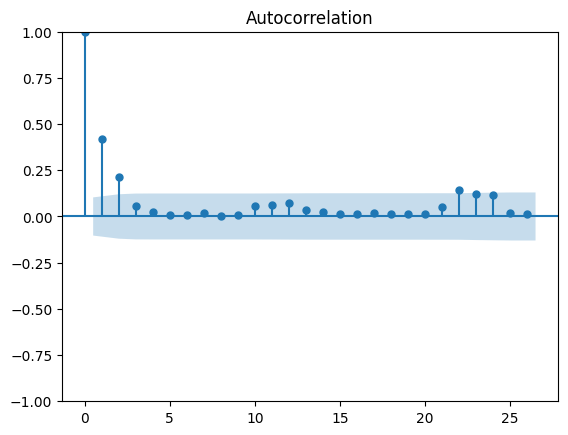

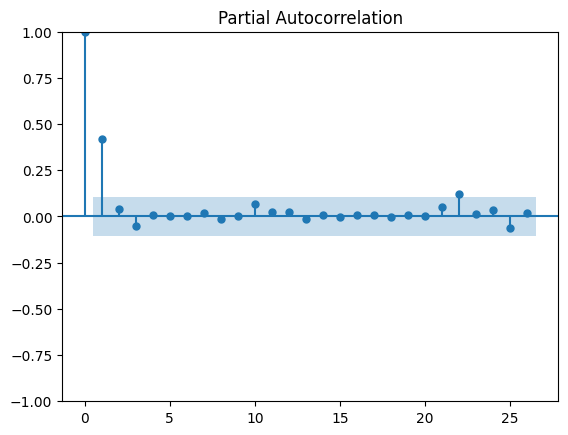

In [ ]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
sm.graphics.tsa.plot_acf(w['gmv'])
plt.show()
sm.graphics.tsa.plot_pacf(w['gmv'])
plt.show()

In [ ]:
model = sm.tsa.statespace.SARIMAX(train_data['gmv'],
                         order=(2, 0, 1),
                         seasonal_order=(0, 1, 1, 12))
result = model.fit()
print(result.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                gmv   No. Observations:                  288
Model:             SARIMAX(2, 0, 1)x(0, 1, 1, 12)   Log Likelihood               -4788.650
Date:                            Thu, 13 Mar 2025   AIC                           9587.301
Time:                                    19:09:23   BIC                           9605.403
Sample:                                         0   HQIC                          9594.565
                                            - 288                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6879      0.579      1.189      0.235      -0.446       1.822
ar.L2          0.0875      0.133   

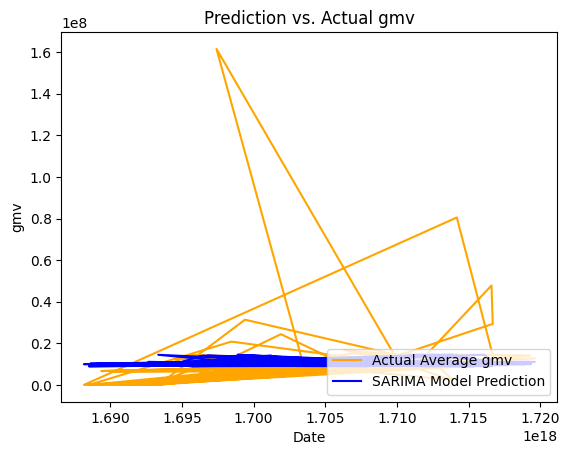

In [ ]:
#Training the model again after each prediction, making one-step-ahead prediction each time
one_step_predictions = []
for i in range(len(test_data)):
  cut_point = len(w) - len(test_data) + i
  model = sm.tsa.statespace.SARIMAX(train_data['gmv'][:cut_point],
                         order=(2, 0, 1),
                         seasonal_order=(0, 1, 1, 12),
                         enforce_stationarity=False,
                         enforce_invertibility=False)
  result = model.fit()
  one_step_predictions.append(result.predict(cut_point).values[0])

test_data['prediction'] = one_step_predictions
test_data.set_index('Date/Time', inplace=True)
test_data['gmv'].plot(label='Actual Average gmv', color='orange')
test_data['prediction'].plot(label='SARIMA Model Prediction', color='blue')
plt.title("Prediction vs. Actual gmv")
plt.xlabel('Date')
plt.ylabel('gmv')

plt.legend(loc='lower right')

In [ ]:
mse = mean_squared_error(test_data['gmv'], test_data['prediction'])
print(f"MSE: {mse:.2f}")

MSE: 443212509309233.94


In [ ]:
import itertools
import statsmodels.api as sm
p_values = range(0, 30)
d_values = range(0, 30)
q_values = range(0, 30)
P_values = range(0, 30)
D_values = range(0, 30)
Q_values = range(0, 30)
s_value = 12


best_order = None
best_seasonal_order = None
best_mse = float('inf')

for p, d, q, P, D, Q in itertools.product(p_values, d_values, q_values, P_values, D_values, Q_values):
    try:
        model = sm.tsa.statespace.SARIMAX(train_data['gmv'],
                                         order=(p, d, q),
                                         seasonal_order=(P, D, Q, s_value),
                                         enforce_stationarity=False,
                                         enforce_invertibility=False)
        result = model.fit()
        predictions = result.get_forecast(steps=len(test_data)).predicted_mean
        mse = mean_squared_error(test_data['gmv'], predictions)
        if mse < best_mse:
            best_mse = mse
            best_order = (p, d, q)
            best_seasonal_order = (P, D, Q, s_value)

    except Exception as e:
        print(f"Error with order ({p}, {d}, {q}) and seasonal_order ({P}, {D}, {Q}, {s_value}): {e}")
        continue

print(f"Best order: {best_order}")
print(f"Best seasonal_order: {best_seasonal_order}")
print(f"Best MSE: {best_mse:.2f}")

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from math import sqrt
import matplotlib.pyplot as plt

def sarima_forecast(time_series, exogenous_features=None, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), forecast_steps=12):
    """
    Forecasts a time series using SARIMAX.

    Args:
        time_series (pd.Series): The time series data.
        exogenous_features (pd.DataFrame, optional): Exogenous variables (if any). Defaults to None.
        order (tuple, optional): The (p, d, q) order of the model. Defaults to (1, 1, 1).
        seasonal_order (tuple, optional): The (P, D, Q, s) seasonal order of the model. Defaults to (1, 1, 1, 12).
        forecast_steps (int, optional): The number of steps to forecast. Defaults to 12.

    Returns:
        tuple: (forecast, confidence_intervals, model)
    """

    try:
        if exogenous_features is not None:
            model = SARIMAX(time_series, exog=exogenous_features, order=order, seasonal_order=seasonal_order)
        else:
            model = SARIMAX(time_series, order=order, seasonal_order=seasonal_order)

        model_fit = model.fit(disp=False)
        forecast = model_fit.get_forecast(steps=forecast_steps, exog=exogenous_features[-forecast_steps:] if exogenous_features is not None else None)
        forecast_values = forecast.predicted_mean
        confidence_intervals = forecast.conf_int()

        return forecast_values, confidence_intervals, model_fit

    except Exception as e:
        print(f"An error occurred: {e}")
        return None, None, None

def evaluate_sarima(time_series, exogenous_features=None, testdata ,order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), test_size=12):
    """
    Evaluates SARIMA model using train-test split and RMSE.
    """
    train = time_series[:-test_size]
    test = time_series[-test_size:]

    exog_train = exogenous_features[:-test_size] if exogenous_features is not None else None
    exog_test = exogenous_features[-test_size:] if exogenous_features is not None else None

    forecast, _, _ = sarima_forecast(train, exog_train, order, seasonal_order, test_size)
    if forecast is None:
        return None

    rmse = sqrt(mean_squared_error(test, forecast))
    print(f"RMSE: {rmse}")

    plt.figure(figsize=(12, 6))
    plt.plot(time_series.index, time_series, label='Original')
    plt.plot(test.index, forecast, label='Forecast', color='red')
    plt.plot(test.index, test, label = "Test", color = "green")
    plt.legend()
    plt.show()

    return rmse

exogenous_data = train_data.drop(columns=['gmv'])

rmse=evaluate_sarima(train_data['gmv'], exogenous_data, test_data, order=(2, 1, 2), seasonal_order=(2, 1, 2, 12))

forecast_values, confidence_intervals, model_fit = sarima_forecast(w['gmv'], exogenous_data)

if forecast_values is not None:
    print("Forecasted Values:")
    print(forecast_values)
    print("Confidence Intervals:")
    print(confidence_intervals)

In [ ]:
# w.set_index('Date/Time', inplace=True)
# w.index = pd.to_datetime(w.index)
w.index

DatetimeIndex(['2023-07-01', '2023-07-03', '2023-07-04', '2023-07-05',
               '2023-07-06', '2023-07-07', '2023-07-08', '2023-07-09',
               '2023-07-10', '2023-07-11',
               ...
               '2024-06-20', '2024-06-21', '2024-06-22', '2024-06-23',
               '2024-06-24', '2024-06-25', '2024-06-26', '2024-06-27',
               '2024-06-28', '2024-06-29'],
              dtype='datetime64[ns]', name='Date/Time', length=360, freq=None)

###Prophet

In [ ]:
prophet_train_data = train_data[['Date/Time', 'gmv']].rename(columns={'Date/Time': 'ds', 'gmv': 'y'})
prophet_train_data.head()

,ds,y
0,2023-07-01,20747.0
1,2023-07-03,534059.0
2,2023-07-04,79378.0
3,2023-07-05,1899.0
4,2023-07-06,52545.0


In [ ]:
# Disable warnings and set logger level
import warnings
import logging
warnings.filterwarnings("ignore")
logging.getLogger("cmdstanpy").setLevel(logging.WARNING)
logger = logging.getLogger('cmdstanpy')
logger.setLevel(logging.WARNING)
from prophet import Prophet
# Create and fit the Prophet model
prophet_model = Prophet()
prophet_model.fit(prophet_train_data);

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j1gae9wb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j8zaa8r4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99329', 'data', 'file=/tmp/tmpaqij8a90/j1gae9wb.json', 'init=/tmp/tmpaqij8a90/j8zaa8r4.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelrq9f9y4a/prophet_model-20250316171147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:11:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:11:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Create a future dataframe for the number of days in the test set
num_days = len(test_data)
future = prophet_model.make_future_dataframe(periods=num_days)
prophet_forecast = prophet_model.predict(future)

In [ ]:
test_data.head()

,index,Date/Time,gmv,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),...,7DayAvgTemp,YesterdayMeanTemp,YesterdayTotalPrecip,Week,DayOfWeek,Season,Weather_Index,Weather_Index_lr,Weather_Index_PCA,weather_score
286,286,2024-04-19,7.638933e+06,2024,4,19,1.0,18.491270,7.400000,12.971429,...,11.985921,12.176667,1.933333,16,4,2,6.494841,-0.418356,0.315762,2.5
287,287,2024-04-20,1.576147e+07,2024,4,20,1.0,17.405556,6.527257,12.000799,...,12.015689,11.183056,0.000000,16,5,2,5.588069,-0.608681,0.753723,1.0
288,288,2024-04-21,5.879030e+06,2024,4,21,0.0,13.631944,3.785268,8.919286,...,10.543447,7.029911,1.750000,16,6,2,5.422561,-0.640564,-1.167927,2.0
289,289,2024-04-22,4.235687e+06,2024,4,22,1.0,22.212500,10.348611,16.361667,...,16.821124,15.984333,2.320000,17,0,2,7.599889,-0.672267,0.504616,4.0
290,290,2024-04-23,2.257834e+06,2024,4,23,0.0,17.322222,7.944802,12.787444,...,13.014999,11.389444,0.680000,17,1,2,5.881859,-0.894429,-0.891326,2.0


In [ ]:
prophet_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-07-01,2.438299e+06,-1.058823e+07,1.761666e+07,2.438299e+06,2.438299e+06,1.180049e+06,1.180049e+06,1.180049e+06,1.180049e+06,1.180049e+06,1.180049e+06,0.0,0.0,0.0,3.618348e+06
1,2023-07-03,2.582099e+06,-9.229431e+06,1.812709e+07,2.582099e+06,2.582099e+06,1.444876e+06,1.444876e+06,1.444876e+06,1.444876e+06,1.444876e+06,1.444876e+06,0.0,0.0,0.0,4.026975e+06
2,2023-07-04,2.653999e+06,-1.217992e+07,1.625931e+07,2.653999e+06,2.653999e+06,-5.756303e+05,-5.756303e+05,-5.756303e+05,-5.756303e+05,-5.756303e+05,-5.756303e+05,0.0,0.0,0.0,2.078368e+06
3,2023-07-05,2.725899e+06,-1.219198e+07,1.413368e+07,2.725899e+06,2.725899e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,0.0,0.0,0.0,8.462375e+05
4,2023-07-06,2.797799e+06,-1.096155e+07,1.671896e+07,2.797799e+06,2.797799e+06,4.825405e+05,4.825405e+05,4.825405e+05,4.825405e+05,4.825405e+05,4.825405e+05,0.0,0.0,0.0,3.280339e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,2024-06-25,1.192576e+07,-2.466954e+06,2.461891e+07,1.151382e+07,1.233895e+07,-5.756303e+05,-5.756303e+05,-5.756303e+05,-5.756303e+05,-5.756303e+05,-5.756303e+05,0.0,0.0,0.0,1.135013e+07
354,2024-06-26,1.192933e+07,-4.413842e+06,2.366709e+07,1.150621e+07,1.235301e+07,-1.879661e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,-1.879661e+06,0.0,0.0,0.0,1.004967e+07
355,2024-06-27,1.193290e+07,-1.924747e+06,2.573855e+07,1.149637e+07,1.236736e+07,4.825405e+05,4.825405e+05,4.825405e+05,4.825405e+05,4.825405e+05,4.825405e+05,0.0,0.0,0.0,1.241544e+07
356,2024-06-28,1.193647e+07,-1.872321e+06,2.569565e+07,1.148712e+07,1.237414e+07,4.792251e+05,4.792251e+05,4.792251e+05,4.792251e+05,4.792251e+05,4.792251e+05,0.0,0.0,0.0,1.241570e+07


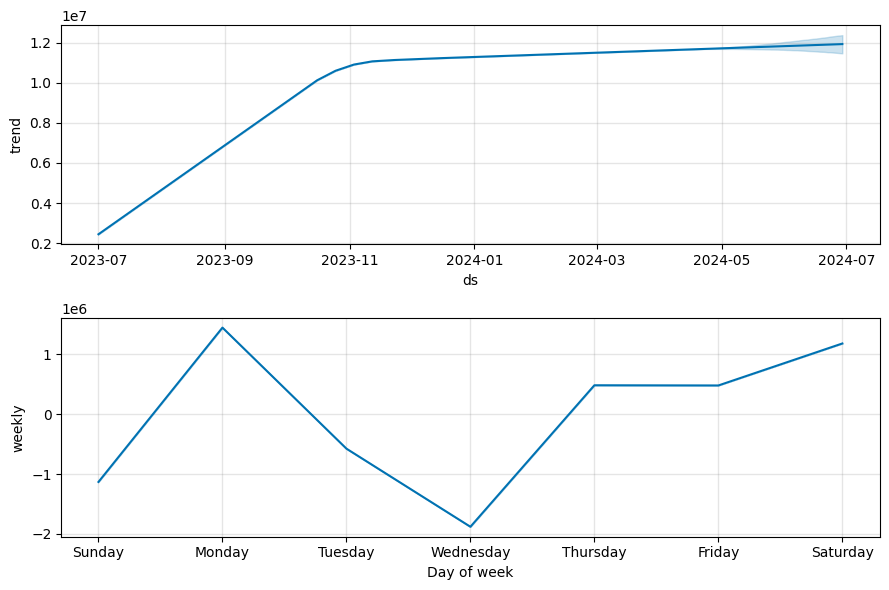

In [ ]:
fig = prophet_model.plot_components(prophet_forecast) # Change 'model' to 'prophet_model' and 'forecast' to 'prophet_forecast'

In [ ]:
# Evaluate the model
test_forecast = prophet_forecast.tail(num_days)

# Get the true values from the original test_data
y_true = test_data['gmv'].values

# Calculate the errors
y_pred = test_forecast['yhat'].values
from sklearn.metrics import mean_squared_error, mean_absolute_error
# Calculate the errors
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)
rmse = calculate_rmse(y_test, y_pred)

print(f'MSE: {mse:.0f}')
print(f'MAE: {mae:.0f}')
print(f'MAPE: {mape:.2f}')
print(f'RMSE: {rmse:.0f}')

MSE: 89732241670193
MAE: 4470534
MAPE: 79.64
RMSE: 9472710


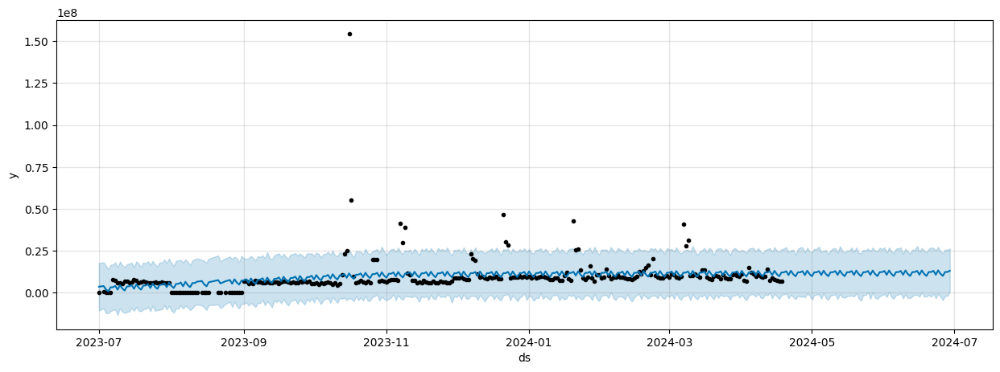

In [ ]:
import matplotlib.pyplot as plt



# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)

# Use prophet_model.plot() to plot the forecast
fig = prophet_model.plot(prophet_forecast, ax=ax)  # Pass the forecast dataframe to plot()

plt.show()

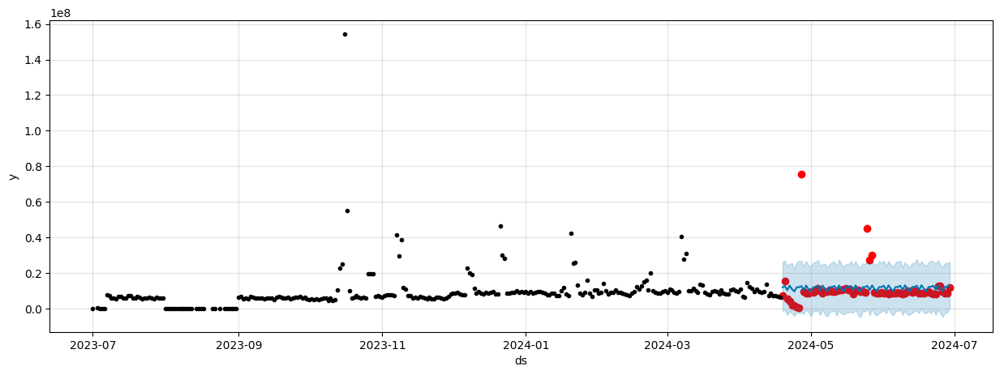

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
# Convert 'Date/Time' to datetime objects for plotting
test_data['Date/Time'] = pd.to_datetime(test_data['Date/Time'])

ax.scatter(test_data['Date/Time'], test_data['gmv'], color='r')
fig = prophet_model.plot(test_forecast, ax=ax)

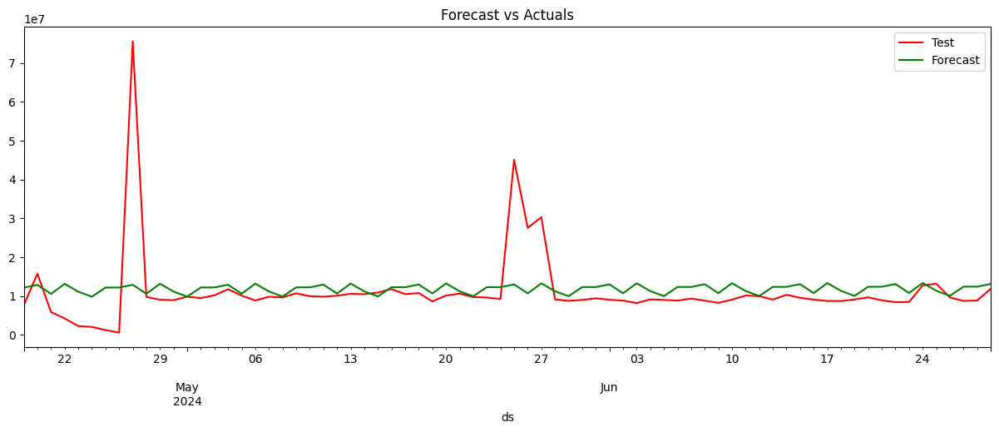

In [ ]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
test_data.plot(kind='line',x='Date/Time', y='gmv', color='red', label='Test', ax=ax)
test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

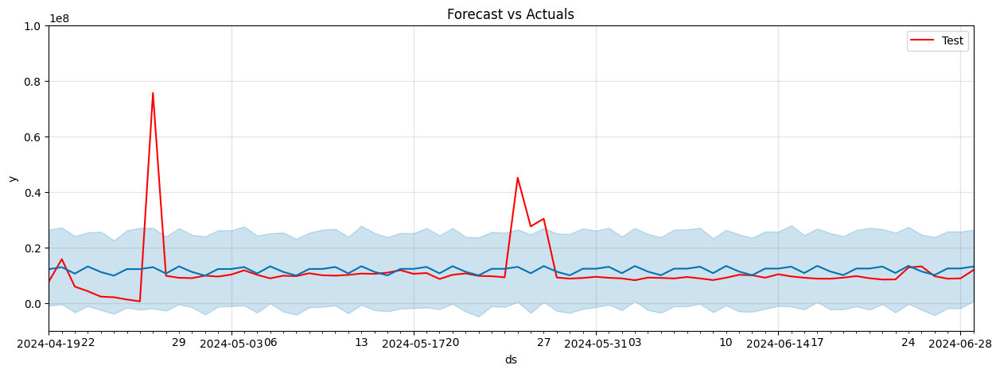

In [ ]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
test_data.plot(kind='line',x='Date/Time', y='gmv', color='red', label='Test', ax=ax)

#ax.scatter(test_data['Date/Time'], test_data['gmv'], color='r')

fig = prophet_model.plot(test_forecast, ax=ax)
ax.set_ylim(-0.1e8, 1e8)
plt.title('Forecast vs Actuals')
plt.show()

#### Holidays

In [ ]:
holiday=pd.read_csv("/content/holiday_formatted.csv")

In [ ]:
holiday.head()

,Occassion,Day,formatted_day
0,Canada Day,"July 1, 2023",01-07-2023
1,Civic Holiday,"August 3, 2023",03-08-2023
2,Labour Day,"September 7, 2023",07-09-2023
3,Thanksgiving,"October 12, 2023",12-10-2023
4,Halloween,"October 31, 2023",31-10-2023


In [ ]:
holiday.rename(columns={'formatted_day':'ds','Occassion':'holiday'},inplace=True)
holiday.drop(columns=['Day'],inplace=True)

In [ ]:
holiday.head()

,holiday,ds
0,Canada Day,01-07-2023
1,Civic Holiday,03-08-2023
2,Labour Day,07-09-2023
3,Thanksgiving,12-10-2023
4,Halloween,31-10-2023


In [ ]:
# Setup and train model with holidays
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%d-%m-%Y') # Specify the correct format for 'ds' column
model_with_holidays = Prophet(holidays=holiday)
model_with_holidays.fit(prophet_train_data)

In [ ]:
future = model_with_holidays.make_future_dataframe(periods=num_days)
forecast = model_with_holidays.predict(future)

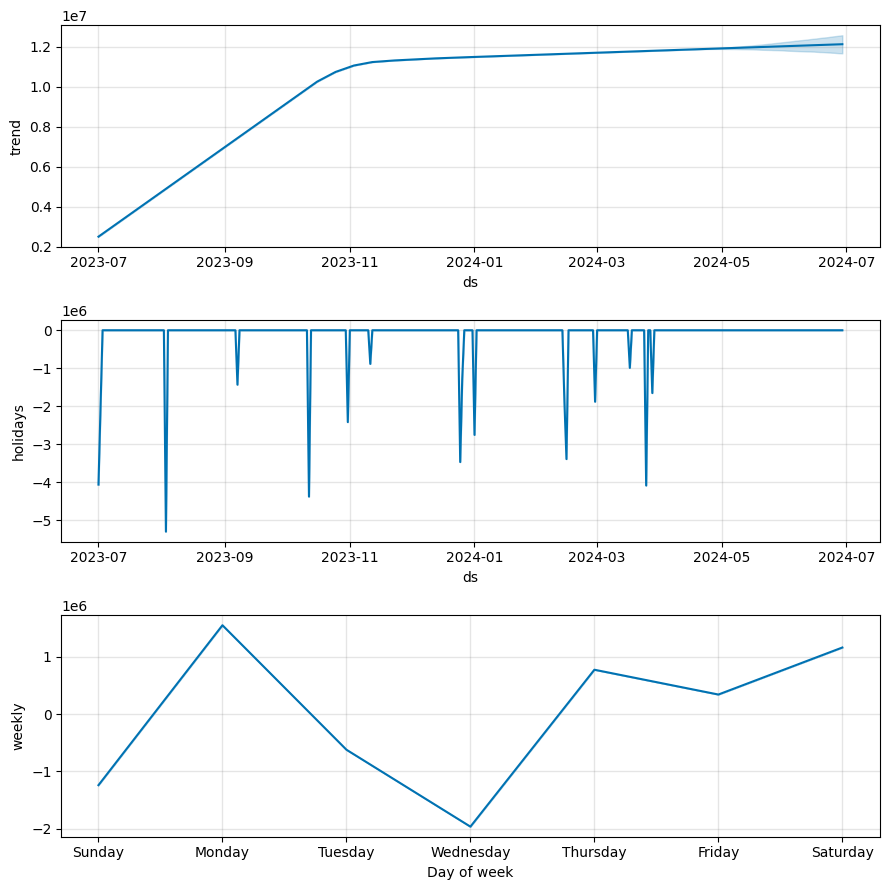

In [ ]:
fig = model_with_holidays.plot_components(forecast)

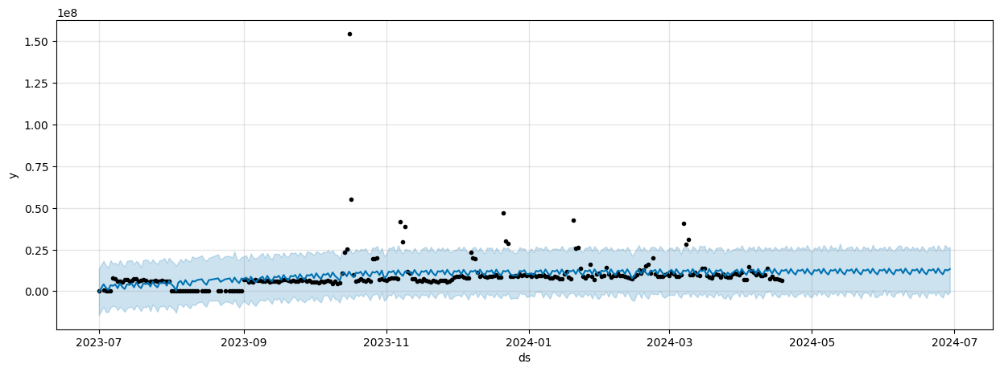

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model_with_holidays.plot(forecast,ax=ax)
plt.show()

In [ ]:
X_tst_forecast_holiday = forecast.tail(num_days)

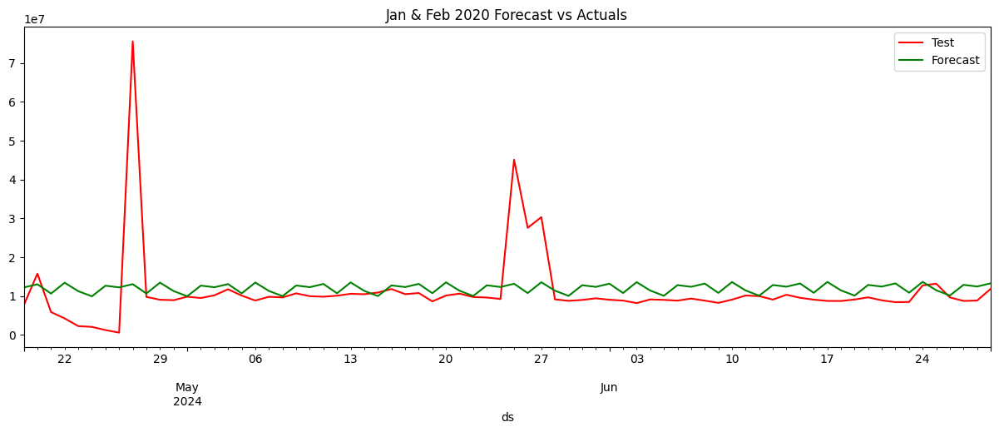

In [ ]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
test_data.plot(kind='line',x='Date/Time', y='gmv', color='red', label='Test', ax=ax)
X_tst_forecast_holiday.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Jan & Feb 2020 Forecast vs Actuals')
plt.show()

In [ ]:
# Evaluate the model
#test_forecast = prophet_forecast.tail(num_days)

# Get the true values from the original test_data
y_true = test_data['gmv'].values

# Calculate the errors
y_pred = X_tst_forecast_holiday['yhat'].values

# Calculate the errors
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)
rmse = calculate_rmse(y_test, y_pred)

print(f'MSE: {mse:.0f}')
print(f'MAE: {mae:.0f}')
print(f'MAPE: {mape:.2f}')
print(f'RMSE: {rmse:.0f}')

MSE: 90222760941771
MAE: 4619161
MAPE: 82.03
RMSE: 9498566


####Hyperparameter Tuning


In [ ]:
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'n_changepoints' : [100,150,200]}
grid = ParameterGrid(params_grid)

In [ ]:
tot=2*5*5*3
cnt=0

In [ ]:
import random
model_parameters = pd.DataFrame(columns = ['MSE','MAE','MAPE','RMSE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(cnt,'/',tot)
    cnt+=1
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         holidays=holiday,
                         interval_width=0.95)

    train_model.fit(prophet_train_data)
    train_forecast = train_model.make_future_dataframe(periods=num_days, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']].tail(num_days)
    #Actual = df[(df['ds']>strt) & (df['ds']<=end)]
    y_true = test_data['gmv'].values
    y_pred = test['yhat'].values
    # Calculate the errors
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    rmse = calculate_rmse(y_test, y_pred)
    print(f'MSE: {mse:.0f}')
    print(f'MAE: {mae:.0f}')
    print(f'MAPE: {mape:.2f}')
    print(f'RMSE: {rmse:.0f}')
    model_parameters = pd.concat([model_parameters, pd.DataFrame([{'MSE': mse, 'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'Parameters': p}])], ignore_index=True)
    #model_parameters = model_parameters.append({'MSE':mse,'MAE':mae,'MAPE':mape,'RMSE':rmse,'Parameters':p},ignore_index=True)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/9gly8xk9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u53sxu67.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30103', 'data', 'file=/tmp/tmpaqij8a90/9gly8xk9.json', 'init=/tmp/tmpaqij8a90/u53sxu67.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model75ntoz2u/prophet_model-20250316185526.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


0 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/yijyujmf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/lgaovbpv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90669', 'data', 'file=/tmp/tmpaqij8a90/yijyujmf.json', 'init=/tmp/tmpaqij8a90/lgaovbpv.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelbe4i57fr/prophet_model-20250316185526.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 105679947151652
MAE: 5848604
MAPE: 68.47
RMSE: 10280075
1 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/dw3tq26a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5uqtbccm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51429', 'data', 'file=/tmp/tmpaqij8a90/dw3tq26a.json', 'init=/tmp/tmpaqij8a90/5uqtbccm.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelcqjacpji/prophet_model-20250316185527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 256959014166375
MAE: 12360542
MAPE: 121.48
RMSE: 16029941
2 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gmcdpnof.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ixmmex9g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17937', 'data', 'file=/tmp/tmpaqij8a90/gmcdpnof.json', 'init=/tmp/tmpaqij8a90/ixmmex9g.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model8p8zs3y_/prophet_model-20250316185527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 105029242950029
MAE: 5706081
MAPE: 65.90
RMSE: 10248378
3 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/a67swkcz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7pzk0s33.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1708', 'data', 'file=/tmp/tmpaqij8a90/a67swkcz.json', 'init=/tmp/tmpaqij8a90/7pzk0s33.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelbwsx_f7p/prophet_model-20250316185527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 260692066313864
MAE: 12477988
MAPE: 120.59
RMSE: 16145961
4 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_mhadq4v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/05btkh6x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99232', 'data', 'file=/tmp/tmpaqij8a90/_mhadq4v.json', 'init=/tmp/tmpaqij8a90/05btkh6x.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model9n1lki8y/prophet_model-20250316185528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 113824705087545
MAE: 6636830
MAPE: 76.31
RMSE: 10668866
5 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ma0lov9z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ozl6676s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82545', 'data', 'file=/tmp/tmpaqij8a90/ma0lov9z.json', 'init=/tmp/tmpaqij8a90/ozl6676s.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model6ihrx1ap/prophet_model-20250316185528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 204132442889470
MAE: 10628266
MAPE: 101.97
RMSE: 14287493
6 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/s5zacszn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/goz6e77p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71304', 'data', 'file=/tmp/tmpaqij8a90/s5zacszn.json', 'init=/tmp/tmpaqij8a90/goz6e77p.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelprfvxa03/prophet_model-20250316185529.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 104134108413568
MAE: 5619023
MAPE: 65.41
RMSE: 10204612
7 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


18:55:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/mwsh4e2c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/radu3v9y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70649', 'data', 'file=/tmp/tmpaqij8a90/mwsh4e2c.json', 'init=/tmp/tmpaqij8a90/radu3v9y.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelo97xd861/prophet_model-20250316185529.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 298182442895254
MAE: 13608765
MAPE: 137.36
RMSE: 17267960
8 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/uezf83r4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/45ekmok3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21990', 'data', 'file=/tmp/tmpaqij8a90/uezf83r4.json', 'init=/tmp/tmpaqij8a90/45ekmok3.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelwxtbqect/prophet_model-20250316185530.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 105486957606112
MAE: 5757154
MAPE: 66.23
RMSE: 10270684
9 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/c_zw9jg3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g33f46ew.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29120', 'data', 'file=/tmp/tmpaqij8a90/c_zw9jg3.json', 'init=/tmp/tmpaqij8a90/g33f46ew.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelxl_0ivm1/prophet_model-20250316185530.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 319978257858676
MAE: 14221188
MAPE: 144.83
RMSE: 17887936
10 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wavh71q5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ygkec1nh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1348', 'data', 'file=/tmp/tmpaqij8a90/wavh71q5.json', 'init=/tmp/tmpaqij8a90/ygkec1nh.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelz57sgzyh/prophet_model-20250316185531.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 112907865691514
MAE: 6425207
MAPE: 71.64
RMSE: 10625811
11 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qqd02e5p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ijgq72y2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94408', 'data', 'file=/tmp/tmpaqij8a90/qqd02e5p.json', 'init=/tmp/tmpaqij8a90/ijgq72y2.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model2xv2kz6r/prophet_model-20250316185531.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 293224610715440
MAE: 13401369
MAPE: 131.66
RMSE: 17123802
12 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/w5k_2p_s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gqbejze7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91779', 'data', 'file=/tmp/tmpaqij8a90/w5k_2p_s.json', 'init=/tmp/tmpaqij8a90/gqbejze7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model971uv1yg/prophet_model-20250316185531.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 106064905259808
MAE: 5692883
MAPE: 63.58
RMSE: 10298782
13 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


18:55:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/beda4lb_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j_hxh6o7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98303', 'data', 'file=/tmp/tmpaqij8a90/beda4lb_.json', 'init=/tmp/tmpaqij8a90/j_hxh6o7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modellhkn5if1/prophet_model-20250316185532.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 254594219587657
MAE: 12420464
MAPE: 127.88
RMSE: 15956009
14 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g7at62ud.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u1h7tq1d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85293', 'data', 'file=/tmp/tmpaqij8a90/g7at62ud.json', 'init=/tmp/tmpaqij8a90/u1h7tq1d.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelwyjc3hk4/prophet_model-20250316185532.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 105321746870325
MAE: 5663426
MAPE: 64.35
RMSE: 10262638
15 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/s7uu8gbr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/mw3dw2sq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29298', 'data', 'file=/tmp/tmpaqij8a90/s7uu8gbr.json', 'init=/tmp/tmpaqij8a90/mw3dw2sq.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model1en0n1jn/prophet_model-20250316185532.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 288970278991644
MAE: 13302111
MAPE: 133.06
RMSE: 16999126
16 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/0falhdk7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/mvloeudw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54255', 'data', 'file=/tmp/tmpaqij8a90/0falhdk7.json', 'init=/tmp/tmpaqij8a90/mvloeudw.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model0xyvbvcr/prophet_model-20250316185533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 114171428504289
MAE: 6549781
MAPE: 73.00
RMSE: 10685103
17 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wqcxcqis.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/a5h5xh6h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64343', 'data', 'file=/tmp/tmpaqij8a90/wqcxcqis.json', 'init=/tmp/tmpaqij8a90/a5h5xh6h.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelt0t372zw/prophet_model-20250316185533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 293106639008434
MAE: 13592841
MAPE: 142.43
RMSE: 17120357
18 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/d_fpbgd9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g2uvw5kx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41835', 'data', 'file=/tmp/tmpaqij8a90/d_fpbgd9.json', 'init=/tmp/tmpaqij8a90/g2uvw5kx.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelwfdqrzm0/prophet_model-20250316185534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 106233892486708
MAE: 5845941
MAPE: 67.34
RMSE: 10306983
19 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4dv3anor.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/un2_a3fy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46272', 'data', 'file=/tmp/tmpaqij8a90/4dv3anor.json', 'init=/tmp/tmpaqij8a90/un2_a3fy.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelyqme2daz/prophet_model-20250316185534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 338409227677603
MAE: 14589972
MAPE: 145.41
RMSE: 18395902
20 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/pha55dk1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/28yizpu0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18769', 'data', 'file=/tmp/tmpaqij8a90/pha55dk1.json', 'init=/tmp/tmpaqij8a90/28yizpu0.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelnbsu3awe/prophet_model-20250316185535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 109685229438145
MAE: 6118537
MAPE: 68.52
RMSE: 10473072
21 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/el3ozdap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/jw6l9t_5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39976', 'data', 'file=/tmp/tmpaqij8a90/el3ozdap.json', 'init=/tmp/tmpaqij8a90/jw6l9t_5.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeluvz_8wv1/prophet_model-20250316185535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:35 - cmdstanpy - INFO - Chain [1] start processing


MSE: 295990022472592
MAE: 13502198
MAPE: 134.83
RMSE: 17204361
22 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


INFO:cmdstanpy:Chain [1] start processing
18:55:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/46c0vp1f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/bsb8udym.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72341', 'data', 'file=/tmp/tmpaqij8a90/46c0vp1f.json', 'init=/tmp/tmpaqij8a90/bsb8udym.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelm_a2na5l/prophet_model-20250316185536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 113751755038753
MAE: 6482770
MAPE: 71.79
RMSE: 10665447
23 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/9tf1_grr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/zz4yt9cc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6393', 'data', 'file=/tmp/tmpaqij8a90/9tf1_grr.json', 'init=/tmp/tmpaqij8a90/zz4yt9cc.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model9dlv4m88/prophet_model-20250316185536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 323457716622278
MAE: 14509477
MAPE: 154.98
RMSE: 17984930
24 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g2a178cl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/816m4029.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32298', 'data', 'file=/tmp/tmpaqij8a90/g2a178cl.json', 'init=/tmp/tmpaqij8a90/816m4029.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelqbqurmxt/prophet_model-20250316185537.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:37 - cmdstanpy - INFO - Chain [1] start processing


MSE: 105496365354288
MAE: 5661910
MAPE: 63.82
RMSE: 10271142
25 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


INFO:cmdstanpy:Chain [1] start processing
18:55:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ns5_sudy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/k48k0joy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26426', 'data', 'file=/tmp/tmpaqij8a90/ns5_sudy.json', 'init=/tmp/tmpaqij8a90/k48k0joy.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelm5e0knbg/prophet_model-20250316185538.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 278871089229016
MAE: 13069166
MAPE: 131.94
RMSE: 16699434
26 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/cukqtzav.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qb8mbxxs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49623', 'data', 'file=/tmp/tmpaqij8a90/cukqtzav.json', 'init=/tmp/tmpaqij8a90/qb8mbxxs.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelv0_4cwi8/prophet_model-20250316185538.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 105521441039245
MAE: 5717036
MAPE: 65.44
RMSE: 10272363
27 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/kqupae_a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/me787ccg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35706', 'data', 'file=/tmp/tmpaqij8a90/kqupae_a.json', 'init=/tmp/tmpaqij8a90/me787ccg.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelgkm34_dr/prophet_model-20250316185538.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 384605155436573
MAE: 16508353
MAPE: 190.06
RMSE: 19611353
28 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/bcdundm5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/81hy_nh7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89192', 'data', 'file=/tmp/tmpaqij8a90/bcdundm5.json', 'init=/tmp/tmpaqij8a90/81hy_nh7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeliorkqlk5/prophet_model-20250316185539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 108939593098197
MAE: 6192421
MAPE: 72.15
RMSE: 10437413
29 / 150
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/p9b0_v1z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/pin9vk2v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2399', 'data', 'file=/tmp/tmpaqij8a90/p9b0_v1z.json', 'init=/tmp/tmpaqij8a90/pin9vk2v.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model1e38pqbf/prophet_model-20250316185539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 313681253847360
MAE: 14018612
MAPE: 141.35
RMSE: 17711049
30 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/kupyc1qo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/tvb81yf2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96338', 'data', 'file=/tmp/tmpaqij8a90/kupyc1qo.json', 'init=/tmp/tmpaqij8a90/tvb81yf2.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelittxpfb7/prophet_model-20250316185540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:40 - cmdstanpy - INFO - Chain [1] done processing


MSE: 100190378580744
MAE: 4707708
MAPE: 51.36
RMSE: 10009514
31 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/puof3ilo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/rj7oeyt3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15998', 'data', 'file=/tmp/tmpaqij8a90/puof3ilo.json', 'init=/tmp/tmpaqij8a90/rj7oeyt3.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelde2slwi_/prophet_model-20250316185540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 275885983696803
MAE: 13047555
MAPE: 133.94
RMSE: 16609816
32 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ktpgnl1w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_2_4jy2j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74207', 'data', 'file=/tmp/tmpaqij8a90/ktpgnl1w.json', 'init=/tmp/tmpaqij8a90/_2_4jy2j.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelh5rdc897/prophet_model-20250316185540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 101044973660803
MAE: 5070795
MAPE: 58.00
RMSE: 10052113
33 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/9mfo9_t9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/28c7j0_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54477', 'data', 'file=/tmp/tmpaqij8a90/9mfo9_t9.json', 'init=/tmp/tmpaqij8a90/28c7j0_k.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelvcsbqa86/prophet_model-20250316185541.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 598473444088792
MAE: 21084816
MAPE: 241.80
RMSE: 24463717
34 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7z3pqfzk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5dg_t130.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26294', 'data', 'file=/tmp/tmpaqij8a90/7z3pqfzk.json', 'init=/tmp/tmpaqij8a90/5dg_t130.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model2z2m40b8/prophet_model-20250316185541.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 98850634850040
MAE: 4312449
MAPE: 46.78
RMSE: 9942366
35 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j10f9p7b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ro2usjgk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38708', 'data', 'file=/tmp/tmpaqij8a90/j10f9p7b.json', 'init=/tmp/tmpaqij8a90/ro2usjgk.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modele0ky3_eu/prophet_model-20250316185542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 288150512900497
MAE: 13451790
MAPE: 140.92
RMSE: 16974997
36 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/el6tfnuw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/s_c4g1y2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79472', 'data', 'file=/tmp/tmpaqij8a90/el6tfnuw.json', 'init=/tmp/tmpaqij8a90/s_c4g1y2.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model85vohf4v/prophet_model-20250316185542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:42 - cmdstanpy - INFO - Chain [1] done processing


MSE: 100105181377576
MAE: 4775023
MAPE: 53.01
RMSE: 10005258
37 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7d6wis4z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hzhx5h1n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8902', 'data', 'file=/tmp/tmpaqij8a90/7d6wis4z.json', 'init=/tmp/tmpaqij8a90/hzhx5h1n.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model7x0jkmnz/prophet_model-20250316185543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 354600277301556
MAE: 15425603
MAPE: 167.53
RMSE: 18830833
38 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_nyzi_m8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/9j0ea9cr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=603', 'data', 'file=/tmp/tmpaqij8a90/_nyzi_m8.json', 'init=/tmp/tmpaqij8a90/9j0ea9cr.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model5yxotgt_/prophet_model-20250316185543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 102021889280322
MAE: 5108914
MAPE: 56.73
RMSE: 10100589
39 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/i8oyzzix.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/clz_3gp7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59877', 'data', 'file=/tmp/tmpaqij8a90/i8oyzzix.json', 'init=/tmp/tmpaqij8a90/clz_3gp7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeligbin2l0/prophet_model-20250316185543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 299394951752851
MAE: 13795619
MAPE: 145.99
RMSE: 17303033
40 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/f74ey6he.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1uevhngt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10201', 'data', 'file=/tmp/tmpaqij8a90/f74ey6he.json', 'init=/tmp/tmpaqij8a90/1uevhngt.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model8wxegy42/prophet_model-20250316185544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 99688229673428
MAE: 4393874
MAPE: 46.53
RMSE: 9984399
41 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/z82gek1q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j3_kfmkg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74418', 'data', 'file=/tmp/tmpaqij8a90/z82gek1q.json', 'init=/tmp/tmpaqij8a90/j3_kfmkg.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model01rdwliz/prophet_model-20250316185544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 323625780041899
MAE: 14489095
MAPE: 154.06
RMSE: 17989602
42 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/oeuj4qi1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gw4bsjl0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36953', 'data', 'file=/tmp/tmpaqij8a90/oeuj4qi1.json', 'init=/tmp/tmpaqij8a90/gw4bsjl0.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelkdd6uq26/prophet_model-20250316185544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 101272650203616
MAE: 5140513
MAPE: 58.83
RMSE: 10063431
43 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
MSE: 316649960741060
MAE: 14263188
MAPE: 151.44
RMSE: 17794661
44 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/fmxsq0x1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/bjco_q3w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98942', 'data', 'file=/tmp/tmpaqij8a90/fmxsq0x1.json', 'init=/tmp/tmpaqij8a90/bjco_q3w.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model1akdx_je/prophet_model-20250316185544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qc84_u9l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/2x32gsqx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

MSE: 101294665594988
MAE: 5114678
MAPE: 58.44
RMSE: 10064525
45 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/i37c0wkd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wyem_229.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49330', 'data', 'file=/tmp/tmpaqij8a90/i37c0wkd.json', 'init=/tmp/tmpaqij8a90/wyem_229.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model02cmqjmq/prophet_model-20250316185545.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 480882813393558
MAE: 18548000
MAPE: 207.81
RMSE: 21929040
46 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gq2ahapy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/rp72nk5r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63457', 'data', 'file=/tmp/tmpaqij8a90/gq2ahapy.json', 'init=/tmp/tmpaqij8a90/rp72nk5r.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelj30mocoa/prophet_model-20250316185545.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 99133360017570
MAE: 4348005
MAPE: 46.90
RMSE: 9956574
47 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5j9yhgxx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/oxvf1cx6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86413', 'data', 'file=/tmp/tmpaqij8a90/5j9yhgxx.json', 'init=/tmp/tmpaqij8a90/oxvf1cx6.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelcfuw5roh/prophet_model-20250316185545.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 374014510806729
MAE: 15982803
MAPE: 175.43
RMSE: 19339455
48 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/dekgv3x4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/70e5yneo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32037', 'data', 'file=/tmp/tmpaqij8a90/dekgv3x4.json', 'init=/tmp/tmpaqij8a90/70e5yneo.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelnf6qkckx/prophet_model-20250316185546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 99792083994806
MAE: 4728255
MAPE: 52.48
RMSE: 9989599
49 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/h5qiinmc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/22vjp62r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70604', 'data', 'file=/tmp/tmpaqij8a90/h5qiinmc.json', 'init=/tmp/tmpaqij8a90/22vjp62r.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model8grb9mv8/prophet_model-20250316185546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:46 - cmdstanpy - INFO - Chain [1] done processing


MSE: 334825061828991
MAE: 14754315
MAPE: 156.23
RMSE: 18298226
50 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/nzc755m_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/nammt547.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1013', 'data', 'file=/tmp/tmpaqij8a90/nzc755m_.json', 'init=/tmp/tmpaqij8a90/nammt547.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelgixlthw2/prophet_model-20250316185546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 100251204494516
MAE: 4991998
MAPE: 57.48
RMSE: 10012552
51 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wo0pzmdb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/cprpq08d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21063', 'data', 'file=/tmp/tmpaqij8a90/wo0pzmdb.json', 'init=/tmp/tmpaqij8a90/cprpq08d.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelf9w1h8ho/prophet_model-20250316185546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 311478620759308
MAE: 14142633
MAPE: 150.11
RMSE: 17648757
52 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/y0colvpd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wnvk7k34.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70228', 'data', 'file=/tmp/tmpaqij8a90/y0colvpd.json', 'init=/tmp/tmpaqij8a90/wnvk7k34.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model3h35dl9s/prophet_model-20250316185547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 99475081974879
MAE: 4354415
MAPE: 46.36
RMSE: 9973720
53 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/zm4lw926.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/jnkhr9s4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43136', 'data', 'file=/tmp/tmpaqij8a90/zm4lw926.json', 'init=/tmp/tmpaqij8a90/jnkhr9s4.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model6bcn8lh5/prophet_model-20250316185547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 393963276301872
MAE: 16538062
MAPE: 183.53
RMSE: 19848508
54 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/74282eay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u59bc5w7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21269', 'data', 'file=/tmp/tmpaqij8a90/74282eay.json', 'init=/tmp/tmpaqij8a90/u59bc5w7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model6vxnmw3z/prophet_model-20250316185547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 96818259255429
MAE: 4138028
MAPE: 47.01
RMSE: 9839627
55 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/2qutdw04.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/yazyokpp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16837', 'data', 'file=/tmp/tmpaqij8a90/2qutdw04.json', 'init=/tmp/tmpaqij8a90/yazyokpp.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model9akzrmbl/prophet_model-20250316185547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 291624577663348
MAE: 13509061
MAPE: 141.30
RMSE: 17077019
56 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/608tyqeg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/fh6g6i8j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4801', 'data', 'file=/tmp/tmpaqij8a90/608tyqeg.json', 'init=/tmp/tmpaqij8a90/fh6g6i8j.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model4w692wyh/prophet_model-20250316185548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 102285018718342
MAE: 5248590
MAPE: 59.35
RMSE: 10113606
57 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/lt1jfy9q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/3wumtfpn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=366', 'data', 'file=/tmp/tmpaqij8a90/lt1jfy9q.json', 'init=/tmp/tmpaqij8a90/3wumtfpn.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modellxjiw25h/prophet_model-20250316185548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 372621077377112
MAE: 15931316
MAPE: 174.58
RMSE: 19303395
58 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1yu74psg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/h872vhlt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55491', 'data', 'file=/tmp/tmpaqij8a90/1yu74psg.json', 'init=/tmp/tmpaqij8a90/h872vhlt.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeldhz6fq4q/prophet_model-20250316185548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 98982532794279
MAE: 4452202
MAPE: 48.76
RMSE: 9948997
59 / 150
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1rkpdvsp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/sz9jzdjj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88099', 'data', 'file=/tmp/tmpaqij8a90/1rkpdvsp.json', 'init=/tmp/tmpaqij8a90/sz9jzdjj.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelx2zpv0wi/prophet_model-20250316185549.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 334698434578221
MAE: 14773117
MAPE: 157.15
RMSE: 18294765
60 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/fq7pk9m6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/t5t8wzew.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38820', 'data', 'file=/tmp/tmpaqij8a90/fq7pk9m6.json', 'init=/tmp/tmpaqij8a90/t5t8wzew.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelee_ktnli/prophet_model-20250316185552.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 154461970937210
MAE: 8172925
MAPE: 75.52
RMSE: 12428273
61 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


18:55:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/roydr51b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/69f3rk7e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13841', 'data', 'file=/tmp/tmpaqij8a90/roydr51b.json', 'init=/tmp/tmpaqij8a90/69f3rk7e.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelxqt9_ubd/prophet_model-20250316185552.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 858532560148965
MAE: 25638128
MAPE: 300.22
RMSE: 29300726
62 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:55:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7dblmob5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wwb1v7jw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89506', 'data', 'file=/tmp/tmpaqij8a90/7dblmob5.json', 'init=/tmp/tmpaqij8a90/wwb1v7jw.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelttodeoga/prophet_model-20250316185555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 135786921977035
MAE: 6959438
MAPE: 66.54
RMSE: 11652765
63 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:55:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/tik7jfkl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/txg56uma.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18258', 'data', 'file=/tmp/tmpaqij8a90/tik7jfkl.json', 'init=/tmp/tmpaqij8a90/txg56uma.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model5i4j24jh/prophet_model-20250316185555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 575494621527497
MAE: 20617529
MAPE: 235.48
RMSE: 23989469
64 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:55:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_v_h5dv6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/3enk6drg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73426', 'data', 'file=/tmp/tmpaqij8a90/_v_h5dv6.json', 'init=/tmp/tmpaqij8a90/3enk6drg.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeltylv3ey6/prophet_model-20250316185556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 101289662927382
MAE: 3924047
MAPE: 39.78
RMSE: 10064277
65 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:55:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7y1sitwj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/r_jta07y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8139', 'data', 'file=/tmp/tmpaqij8a90/7y1sitwj.json', 'init=/tmp/tmpaqij8a90/r_jta07y.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelyny65smi/prophet_model-20250316185556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1906613887774752
MAE: 38943485
MAPE: 478.50
RMSE: 43664790
66 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:55:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/rj3p437i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/xohr_ohj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43323', 'data', 'file=/tmp/tmpaqij8a90/rj3p437i.json', 'init=/tmp/tmpaqij8a90/xohr_ohj.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model4d4bb2la/prophet_model-20250316185558.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 132961791708702
MAE: 6633693
MAPE: 60.87
RMSE: 11530906
67 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/fenytp3t.json


MSE: 532848180519547
MAE: 19686834
MAPE: 222.75
RMSE: 23083505
68 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/xkmlb3wp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62508', 'data', 'file=/tmp/tmpaqij8a90/fenytp3t.json', 'init=/tmp/tmpaqij8a90/xkmlb3wp.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelpp4mgwmx/prophet_model-20250316185559.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/90ccpgqa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1prkq8ax.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.b

MSE: 101483563966232
MAE: 3899300
MAPE: 39.94
RMSE: 10073905
69 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/p26u0urn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g1gpe9ug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87738', 'data', 'file=/tmp/tmpaqij8a90/p26u0urn.json', 'init=/tmp/tmpaqij8a90/g1gpe9ug.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model5ke648zb/prophet_model-20250316185600.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 1405568346019176
MAE: 33268525
MAPE: 403.88
RMSE: 37490910
70 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/3b_bipzs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hkpti2ht.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1589', 'data', 'file=/tmp/tmpaqij8a90/3b_bipzs.json', 'init=/tmp/tmpaqij8a90/hkpti2ht.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelokf4i5id/prophet_model-20250316185600.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 112052647277776
MAE: 4897233
MAPE: 47.45
RMSE: 10585492
71 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/fs9iiw3d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hjbzthil.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86958', 'data', 'file=/tmp/tmpaqij8a90/fs9iiw3d.json', 'init=/tmp/tmpaqij8a90/hjbzthil.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelj68t7k5r/prophet_model-20250316185601.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2172660767083748
MAE: 41619569
MAPE: 510.83
RMSE: 46611809
72 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/9cr4echw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/iimdfgry.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89820', 'data', 'file=/tmp/tmpaqij8a90/9cr4echw.json', 'init=/tmp/tmpaqij8a90/iimdfgry.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelm41yrts4/prophet_model-20250316185602.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 136551301305238
MAE: 6950999
MAPE: 64.89
RMSE: 11685517
73 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


18:56:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/fubinhhr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/i6_cz30_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90637', 'data', 'file=/tmp/tmpaqij8a90/fubinhhr.json', 'init=/tmp/tmpaqij8a90/i6_cz30_.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model6xjxi_4s/prophet_model-20250316185603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1675801812611730
MAE: 36430821
MAPE: 442.68
RMSE: 40936558
74 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ywe5s6a2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/rrtr0cy9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58049', 'data', 'file=/tmp/tmpaqij8a90/ywe5s6a2.json', 'init=/tmp/tmpaqij8a90/rrtr0cy9.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model1n_lv_b3/prophet_model-20250316185605.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 134567184472868
MAE: 6882048
MAPE: 66.75
RMSE: 11600310
75 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qvw6gec0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qxqyuurg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79659', 'data', 'file=/tmp/tmpaqij8a90/qvw6gec0.json', 'init=/tmp/tmpaqij8a90/qxqyuurg.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model993qf2w4/prophet_model-20250316185605.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1606988299073347
MAE: 35486447
MAPE: 425.80
RMSE: 40087259
76 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u5p5lkup.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/eufy4f_o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70012', 'data', 'file=/tmp/tmpaqij8a90/u5p5lkup.json', 'init=/tmp/tmpaqij8a90/eufy4f_o.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelxso23zch/prophet_model-20250316185606.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 132943537702657
MAE: 6708598
MAPE: 63.69
RMSE: 11530114
77 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/yru8pytl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4v5l7ewf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27336', 'data', 'file=/tmp/tmpaqij8a90/yru8pytl.json', 'init=/tmp/tmpaqij8a90/4v5l7ewf.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model_ae3igil/prophet_model-20250316185607.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 816435460969378
MAE: 25060929
MAPE: 296.04
RMSE: 28573335
78 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/llneoy9f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/xaw0zg0f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21065', 'data', 'file=/tmp/tmpaqij8a90/llneoy9f.json', 'init=/tmp/tmpaqij8a90/xaw0zg0f.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelxi89p2cv/prophet_model-20250316185607.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 184989104662664
MAE: 9644008
MAPE: 82.09
RMSE: 13601070
79 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/to0tsvp4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/q3cl2usf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50031', 'data', 'file=/tmp/tmpaqij8a90/to0tsvp4.json', 'init=/tmp/tmpaqij8a90/q3cl2usf.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelnqm4phob/prophet_model-20250316185607.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1563225712331193
MAE: 35194678
MAPE: 427.65
RMSE: 39537649
80 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/vl8ylcay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/xrt4_42h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76655', 'data', 'file=/tmp/tmpaqij8a90/vl8ylcay.json', 'init=/tmp/tmpaqij8a90/xrt4_42h.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelot74_i6s/prophet_model-20250316185609.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 129336791947840
MAE: 6438337
MAPE: 62.25
RMSE: 11372633
81 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5hf0wcep.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/uh6xj7s7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94094', 'data', 'file=/tmp/tmpaqij8a90/5hf0wcep.json', 'init=/tmp/tmpaqij8a90/uh6xj7s7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model40fraw5f/prophet_model-20250316185609.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1607458256707283
MAE: 35624696
MAPE: 431.62
RMSE: 40093120
82 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4a3atbcs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7x0obzh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32478', 'data', 'file=/tmp/tmpaqij8a90/4a3atbcs.json', 'init=/tmp/tmpaqij8a90/7x0obzh8.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model_nwh_9at/prophet_model-20250316185611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 134729024936493
MAE: 6820516
MAPE: 64.70
RMSE: 11607283
83 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/vdpb7vtq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5zpu_unh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=252', 'data', 'file=/tmp/tmpaqij8a90/vdpb7vtq.json', 'init=/tmp/tmpaqij8a90/5zpu_unh.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model4jowj_y1/prophet_model-20250316185611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2028912937285346
MAE: 40104100
MAPE: 489.89
RMSE: 45043456
84 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5vr45fuv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/16zqnb_7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45094', 'data', 'file=/tmp/tmpaqij8a90/5vr45fuv.json', 'init=/tmp/tmpaqij8a90/16zqnb_7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model39cg_8ts/prophet_model-20250316185611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 149111005613953
MAE: 7179636
MAPE: 57.76
RMSE: 12211102
85 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/0lod_s6n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g03lr737.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86308', 'data', 'file=/tmp/tmpaqij8a90/0lod_s6n.json', 'init=/tmp/tmpaqij8a90/g03lr737.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelj6ufnpwt/prophet_model-20250316185612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2165537436618811
MAE: 41458549
MAPE: 508.69
RMSE: 46535335
86 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_j42sn_c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/z5rdjpb5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67840', 'data', 'file=/tmp/tmpaqij8a90/_j42sn_c.json', 'init=/tmp/tmpaqij8a90/z5rdjpb5.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model8trtvrpe/prophet_model-20250316185613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 128276114429856
MAE: 6378102
MAPE: 61.62
RMSE: 11325905
87 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/on0scvg8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/6xdzdxj6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64980', 'data', 'file=/tmp/tmpaqij8a90/on0scvg8.json', 'init=/tmp/tmpaqij8a90/6xdzdxj6.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelie32ergr/prophet_model-20250316185613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 690472890054389
MAE: 22797605
MAPE: 264.18
RMSE: 26276851
88 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/s5o_4mby.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/7dvykvtg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81135', 'data', 'file=/tmp/tmpaqij8a90/s5o_4mby.json', 'init=/tmp/tmpaqij8a90/7dvykvtg.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeltji8yzgp/prophet_model-20250316185616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 142651993591031
MAE: 7404738
MAPE: 69.33
RMSE: 11943701
89 / 150
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:56:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/lx6jk715.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gxs17f4k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89936', 'data', 'file=/tmp/tmpaqij8a90/lx6jk715.json', 'init=/tmp/tmpaqij8a90/gxs17f4k.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model07pj265u/prophet_model-20250316185616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1322599853528396
MAE: 32298657
MAPE: 390.22
RMSE: 36367566
90 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/twdayl89.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_9ucmi9t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95519', 'data', 'file=/tmp/tmpaqij8a90/twdayl89.json', 'init=/tmp/tmpaqij8a90/_9ucmi9t.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelx5j03rlu/prophet_model-20250316185618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 129912271840215
MAE: 6588454
MAPE: 64.49
RMSE: 11397906
91 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
MSE: 1497444828669712
MAE: 34444003
MAPE: 416.92
RMSE: 38696832
92 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/uwisw2dw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/bkxl9kot.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35267', 'data', 'file=/tmp/tmpaqij8a90/uwisw2dw.json', 'init=/tmp/tmpaqij8a90/bkxl9kot.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelj0z7booa/prophet_model-20250316185618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/kin4fdo7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/txmff4as.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

MSE: 125082970785089
MAE: 6184612
MAPE: 60.58
RMSE: 11184050
93 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/apko5myv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/vvs96mvw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79784', 'data', 'file=/tmp/tmpaqij8a90/apko5myv.json', 'init=/tmp/tmpaqij8a90/vvs96mvw.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelpvu6p1lc/prophet_model-20250316185619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1133612018762341
MAE: 29842916
MAPE: 357.02
RMSE: 33669155
94 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ru1mf94g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/mh5wfbs_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34044', 'data', 'file=/tmp/tmpaqij8a90/ru1mf94g.json', 'init=/tmp/tmpaqij8a90/mh5wfbs_.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model21run61v/prophet_model-20250316185621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 119109426729088
MAE: 5437166
MAPE: 48.86
RMSE: 10913727
95 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/38j35a1d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/r2w_circ.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96339', 'data', 'file=/tmp/tmpaqij8a90/38j35a1d.json', 'init=/tmp/tmpaqij8a90/r2w_circ.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelp33cru8b/prophet_model-20250316185621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1172152356289986
MAE: 30347445
MAPE: 364.90
RMSE: 34236711
96 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/brnc4jy8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qzxqd3i9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71171', 'data', 'file=/tmp/tmpaqij8a90/brnc4jy8.json', 'init=/tmp/tmpaqij8a90/qzxqd3i9.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelx8zx6gwg/prophet_model-20250316185623.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 138454531994308
MAE: 7188614
MAPE: 69.52
RMSE: 11766670
97 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wls5j6ug.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/iu8cdkv8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51398', 'data', 'file=/tmp/tmpaqij8a90/wls5j6ug.json', 'init=/tmp/tmpaqij8a90/iu8cdkv8.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeltvnty60h/prophet_model-20250316185623.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1753090344355682
MAE: 37270859
MAPE: 453.33
RMSE: 41869922
98 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4de_3yq0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/sgo_7s5h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85231', 'data', 'file=/tmp/tmpaqij8a90/4de_3yq0.json', 'init=/tmp/tmpaqij8a90/sgo_7s5h.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelz5a8r_wz/prophet_model-20250316185624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 121408538005484
MAE: 6105979
MAPE: 65.87
RMSE: 11018554
99 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/y14xbhjx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/zndql_gr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25670', 'data', 'file=/tmp/tmpaqij8a90/y14xbhjx.json', 'init=/tmp/tmpaqij8a90/zndql_gr.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelb5l0k2i7/prophet_model-20250316185624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2296042877293204
MAE: 42808991
MAPE: 526.30
RMSE: 47917042
100 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/y48r0p0m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4ptdg7_q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10129', 'data', 'file=/tmp/tmpaqij8a90/y48r0p0m.json', 'init=/tmp/tmpaqij8a90/4ptdg7_q.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelqb7guhxz/prophet_model-20250316185626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 121374814954147
MAE: 5841645
MAPE: 55.85
RMSE: 11017024
101 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1240ffjp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/_iatc7g3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65795', 'data', 'file=/tmp/tmpaqij8a90/1240ffjp.json', 'init=/tmp/tmpaqij8a90/_iatc7g3.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelampiv48v/prophet_model-20250316185626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1333446656494601
MAE: 32391463
MAPE: 391.53
RMSE: 36516389
102 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/kya5hl8o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/piv_wqx6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86454', 'data', 'file=/tmp/tmpaqij8a90/kya5hl8o.json', 'init=/tmp/tmpaqij8a90/piv_wqx6.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model8vqbtg85/prophet_model-20250316185628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 129458093729853
MAE: 6458484
MAPE: 62.84
RMSE: 11377965
103 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hks3vfnb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/i_s5n61w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7933', 'data', 'file=/tmp/tmpaqij8a90/hks3vfnb.json', 'init=/tmp/tmpaqij8a90/i_s5n61w.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modely080mup0/prophet_model-20250316185629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1328751463810146
MAE: 32311596
MAPE: 388.38
RMSE: 36452043
104 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/8h8nzem3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/19wsmpo_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54136', 'data', 'file=/tmp/tmpaqij8a90/8h8nzem3.json', 'init=/tmp/tmpaqij8a90/19wsmpo_.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modely9llzwiw/prophet_model-20250316185630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 124164845944985
MAE: 6124001
MAPE: 60.36
RMSE: 11142928
105 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/8s_gsbe9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5c9pjv3k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92065', 'data', 'file=/tmp/tmpaqij8a90/8s_gsbe9.json', 'init=/tmp/tmpaqij8a90/5c9pjv3k.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeluc5kucvp/prophet_model-20250316185631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1158041530379430
MAE: 30061913
MAPE: 358.21
RMSE: 34030009
106 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/c7c2pwof.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ljkhan4w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95893', 'data', 'file=/tmp/tmpaqij8a90/c7c2pwof.json', 'init=/tmp/tmpaqij8a90/ljkhan4w.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model9m0he8a6/prophet_model-20250316185632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 130601962887196
MAE: 6626134
MAPE: 66.10
RMSE: 11428122
107 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/__elxd20.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/y3g5zkf4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78953', 'data', 'file=/tmp/tmpaqij8a90/__elxd20.json', 'init=/tmp/tmpaqij8a90/y3g5zkf4.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeloex5hvix/prophet_model-20250316185633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1115805607339416
MAE: 29522846
MAPE: 353.39
RMSE: 33403677
108 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/auoi35k0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u0015dwn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47889', 'data', 'file=/tmp/tmpaqij8a90/auoi35k0.json', 'init=/tmp/tmpaqij8a90/u0015dwn.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelqgdpu9no/prophet_model-20250316185634.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 130539036505583
MAE: 6551888
MAPE: 63.36
RMSE: 11425368
109 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/8gqtng1v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j2wakhu5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5618', 'data', 'file=/tmp/tmpaqij8a90/8gqtng1v.json', 'init=/tmp/tmpaqij8a90/j2wakhu5.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model60wd46ja/prophet_model-20250316185634.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1502292845845474
MAE: 34456587
MAPE: 416.55
RMSE: 38759423
110 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/rsczxiud.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/x04n_fij.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63848', 'data', 'file=/tmp/tmpaqij8a90/rsczxiud.json', 'init=/tmp/tmpaqij8a90/x04n_fij.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modely1r03zyg/prophet_model-20250316185636.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 124482786560469
MAE: 6132754
MAPE: 60.55
RMSE: 11157185
111 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/q0lgy78y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/dhq81ipk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42647', 'data', 'file=/tmp/tmpaqij8a90/q0lgy78y.json', 'init=/tmp/tmpaqij8a90/dhq81ipk.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model18_zy19k/prophet_model-20250316185636.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2299110418573428
MAE: 42810526
MAPE: 526.33
RMSE: 47949040
112 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/cevkmtqy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4pn4m3fl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51938', 'data', 'file=/tmp/tmpaqij8a90/cevkmtqy.json', 'init=/tmp/tmpaqij8a90/4pn4m3fl.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model7q8pou4q/prophet_model-20250316185637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 124253166117054
MAE: 6102307
MAPE: 59.51
RMSE: 11146890
113 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/sn50ciy_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u5tyw6ij.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43842', 'data', 'file=/tmp/tmpaqij8a90/sn50ciy_.json', 'init=/tmp/tmpaqij8a90/u5tyw6ij.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeli5p_g3r1/prophet_model-20250316185638.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1349024469605513
MAE: 32594702
MAPE: 391.34
RMSE: 36729068
114 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/0qcvhohm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/0v7fvwtw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28868', 'data', 'file=/tmp/tmpaqij8a90/0qcvhohm.json', 'init=/tmp/tmpaqij8a90/0v7fvwtw.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeltwmkvqt7/prophet_model-20250316185639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 125788532017698
MAE: 6287115
MAPE: 62.98
RMSE: 11215549
115 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gvboh9tj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/parwm94b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90998', 'data', 'file=/tmp/tmpaqij8a90/gvboh9tj.json', 'init=/tmp/tmpaqij8a90/parwm94b.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelz783i69x/prophet_model-20250316185639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1339761420544917
MAE: 32514017
MAPE: 389.93
RMSE: 36602752
116 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/r9cjw1k2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/zmuivrs1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3109', 'data', 'file=/tmp/tmpaqij8a90/r9cjw1k2.json', 'init=/tmp/tmpaqij8a90/zmuivrs1.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelzeeb7cp6/prophet_model-20250316185641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 136361769315756
MAE: 7051367
MAPE: 69.85
RMSE: 11677404
117 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


18:56:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/msvokvet.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/sz8bvxzo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87428', 'data', 'file=/tmp/tmpaqij8a90/msvokvet.json', 'init=/tmp/tmpaqij8a90/sz8bvxzo.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeletwmrmv1/prophet_model-20250316185642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1957165746753204
MAE: 39440825
MAPE: 481.92
RMSE: 44239866
118 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/si1ybvwh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/r99shlva.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5808', 'data', 'file=/tmp/tmpaqij8a90/si1ybvwh.json', 'init=/tmp/tmpaqij8a90/r99shlva.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model144vzsym/prophet_model-20250316185644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 118221061241766
MAE: 5645540
MAPE: 55.23
RMSE: 10872951
119 / 150
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/vo4_ekse.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/grfiftsj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88652', 'data', 'file=/tmp/tmpaqij8a90/vo4_ekse.json', 'init=/tmp/tmpaqij8a90/grfiftsj.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model7d8cvnfs/prophet_model-20250316185644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1980098346473845
MAE: 39719906
MAPE: 485.13
RMSE: 44498296
120 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/sk849u68.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5krrv5kv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71061', 'data', 'file=/tmp/tmpaqij8a90/sk849u68.json', 'init=/tmp/tmpaqij8a90/5krrv5kv.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelg5rmz6q1/prophet_model-20250316185645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 128429146489215
MAE: 6331353
MAPE: 59.81
RMSE: 11332658
121 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/04qgosgo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g5yp9v4f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57514', 'data', 'file=/tmp/tmpaqij8a90/04qgosgo.json', 'init=/tmp/tmpaqij8a90/g5yp9v4f.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelighm3qtb/prophet_model-20250316185645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1477555869110507
MAE: 34289195
MAPE: 415.61
RMSE: 38438989
122 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g0vgshas.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/yy3pljco.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22680', 'data', 'file=/tmp/tmpaqij8a90/g0vgshas.json', 'init=/tmp/tmpaqij8a90/yy3pljco.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model37dju3zk/prophet_model-20250316185647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 123113473014179
MAE: 6070331
MAPE: 60.79
RMSE: 11095651
123 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1q5g3gl8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/b6uhkm0m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8070', 'data', 'file=/tmp/tmpaqij8a90/1q5g3gl8.json', 'init=/tmp/tmpaqij8a90/b6uhkm0m.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeliujxrfg8/prophet_model-20250316185647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1543425197322836
MAE: 35064317
MAPE: 425.29
RMSE: 39286451
124 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g_e85_v3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/j8p61g1a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5942', 'data', 'file=/tmp/tmpaqij8a90/g_e85_v3.json', 'init=/tmp/tmpaqij8a90/j8p61g1a.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelqz54xs8e/prophet_model-20250316185649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 121107156726288
MAE: 5816668
MAPE: 56.56
RMSE: 11004870
125 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/b7rozehy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/3kfyx212.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33110', 'data', 'file=/tmp/tmpaqij8a90/b7rozehy.json', 'init=/tmp/tmpaqij8a90/3kfyx212.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model1zx9jyw3/prophet_model-20250316185649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 954144529462244
MAE: 27212464
MAPE: 321.49
RMSE: 30889230
126 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/gjhc3pva.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5wl8kwvj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79760', 'data', 'file=/tmp/tmpaqij8a90/gjhc3pva.json', 'init=/tmp/tmpaqij8a90/5wl8kwvj.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelcooe8q9f/prophet_model-20250316185650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 124272904700906
MAE: 6120438
MAPE: 60.96
RMSE: 11147776
127 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/e_3mwtld.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/p0_wg1m5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1986', 'data', 'file=/tmp/tmpaqij8a90/e_3mwtld.json', 'init=/tmp/tmpaqij8a90/p0_wg1m5.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelk4_w10ck/prophet_model-20250316185650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1294655141453956
MAE: 31921625
MAPE: 383.59
RMSE: 35981317
128 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/nw_sffx8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/3gm58gqj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70321', 'data', 'file=/tmp/tmpaqij8a90/nw_sffx8.json', 'init=/tmp/tmpaqij8a90/3gm58gqj.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model15_oln_p/prophet_model-20250316185652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 127759123589685
MAE: 6351905
MAPE: 62.12
RMSE: 11303058
129 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1f5vuvw_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4zz74a0d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69135', 'data', 'file=/tmp/tmpaqij8a90/1f5vuvw_.json', 'init=/tmp/tmpaqij8a90/4zz74a0d.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model4hof3uru/prophet_model-20250316185652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1401452756035739
MAE: 33245208
MAPE: 400.41
RMSE: 37435982
130 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:56:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/2zvasqff.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ga40r5ef.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27754', 'data', 'file=/tmp/tmpaqij8a90/2zvasqff.json', 'init=/tmp/tmpaqij8a90/ga40r5ef.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelu5c4igps/prophet_model-20250316185655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 122969780955344
MAE: 6001620
MAPE: 59.43
RMSE: 11089174
131 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


18:56:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ppa2n_mn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/lch_svty.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46578', 'data', 'file=/tmp/tmpaqij8a90/ppa2n_mn.json', 'init=/tmp/tmpaqij8a90/lch_svty.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model3e9502rm/prophet_model-20250316185655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1801010832090749
MAE: 37814363
MAPE: 461.42
RMSE: 42438318
132 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:56:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/oqfb8trg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/n745mfz8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39230', 'data', 'file=/tmp/tmpaqij8a90/oqfb8trg.json', 'init=/tmp/tmpaqij8a90/n745mfz8.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelvpbp21sj/prophet_model-20250316185657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 134129684508360
MAE: 6906899
MAPE: 68.94
RMSE: 11581437
133 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/tqa8te58.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/5y4_hc_7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57872', 'data', 'file=/tmp/tmpaqij8a90/tqa8te58.json', 'init=/tmp/tmpaqij8a90/5y4_hc_7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeltt3ktxvb/prophet_model-20250316185657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1863355853269160
MAE: 38523844
MAPE: 469.09
RMSE: 43166606
134 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:56:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/613mrojw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/81xlnj61.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67713', 'data', 'file=/tmp/tmpaqij8a90/613mrojw.json', 'init=/tmp/tmpaqij8a90/81xlnj61.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model44crz52d/prophet_model-20250316185658.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 125458851600381
MAE: 6211079
MAPE: 62.04
RMSE: 11200842
135 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wirgxz6j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/1dk8w1y7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85932', 'data', 'file=/tmp/tmpaqij8a90/wirgxz6j.json', 'init=/tmp/tmpaqij8a90/1dk8w1y7.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelswivxyr5/prophet_model-20250316185658.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1589593779954040
MAE: 35496401
MAPE: 429.83
RMSE: 39869710
136 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:57:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/dr7ao55i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/h8y0kxrl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23374', 'data', 'file=/tmp/tmpaqij8a90/dr7ao55i.json', 'init=/tmp/tmpaqij8a90/h8y0kxrl.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelddpw3cit/prophet_model-20250316185700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 124130675151988
MAE: 6115258
MAPE: 61.26
RMSE: 11141395
137 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/m5t45bpa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/07em724u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53852', 'data', 'file=/tmp/tmpaqij8a90/m5t45bpa.json', 'init=/tmp/tmpaqij8a90/07em724u.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelz9g0zv87/prophet_model-20250316185700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1737923578367669
MAE: 37157084
MAPE: 451.51
RMSE: 41688411
138 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:57:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/monv7ai_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hea8hgyp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32194', 'data', 'file=/tmp/tmpaqij8a90/monv7ai_.json', 'init=/tmp/tmpaqij8a90/hea8hgyp.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelq_mr5fl6/prophet_model-20250316185702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 128753442255734
MAE: 6417427
MAPE: 62.56
RMSE: 11346957
139 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/39n62lfk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/00tmoo_e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94501', 'data', 'file=/tmp/tmpaqij8a90/39n62lfk.json', 'init=/tmp/tmpaqij8a90/00tmoo_e.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelf_9r7ghk/prophet_model-20250316185702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1465713517931337
MAE: 34047222
MAPE: 410.85
RMSE: 38284638
140 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:57:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hyi8en9u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ri626fq3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7799', 'data', 'file=/tmp/tmpaqij8a90/hyi8en9u.json', 'init=/tmp/tmpaqij8a90/ri626fq3.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelr90b_bzg/prophet_model-20250316185703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 137264069993164
MAE: 7076393
MAPE: 68.47
RMSE: 11715975
141 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/88rtjf8y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/l1goaigw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82395', 'data', 'file=/tmp/tmpaqij8a90/88rtjf8y.json', 'init=/tmp/tmpaqij8a90/l1goaigw.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelk4ehhf6_/prophet_model-20250316185703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2157369078179269
MAE: 41411669
MAPE: 506.91
RMSE: 46447487
142 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:57:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/u4kfdxzy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/g7cv34at.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30151', 'data', 'file=/tmp/tmpaqij8a90/u4kfdxzy.json', 'init=/tmp/tmpaqij8a90/g7cv34at.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modellztnj4aw/prophet_model-20250316185705.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 118672290528947
MAE: 5639578
MAPE: 55.06
RMSE: 10893681
143 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/r_kp48ue.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ovp3d9gs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86108', 'data', 'file=/tmp/tmpaqij8a90/r_kp48ue.json', 'init=/tmp/tmpaqij8a90/ovp3d9gs.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model2sn6m1d4/prophet_model-20250316185705.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 2214733006162092
MAE: 42001142
MAPE: 514.90
RMSE: 47060950
144 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


18:57:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/om2j9y6v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/3iven2nf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64305', 'data', 'file=/tmp/tmpaqij8a90/om2j9y6v.json', 'init=/tmp/tmpaqij8a90/3iven2nf.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelrg0m1t52/prophet_model-20250316185707.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 128177425963810
MAE: 6376102
MAPE: 62.62
RMSE: 11321547
145 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/12km2cwu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/ilol5_zl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=148', 'data', 'file=/tmp/tmpaqij8a90/12km2cwu.json', 'init=/tmp/tmpaqij8a90/ilol5_zl.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modeld0lgp877/prophet_model-20250316185708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1173750251373632
MAE: 30319926
MAPE: 361.78
RMSE: 34260039
146 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


18:57:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/iv7xksb7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/wolegjag.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47227', 'data', 'file=/tmp/tmpaqij8a90/iv7xksb7.json', 'init=/tmp/tmpaqij8a90/wolegjag.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_modelnmg9jls1/prophet_model-20250316185709.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 133244970711234
MAE: 6748165
MAPE: 64.78
RMSE: 11543179
147 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/4vhrz7mo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/uys5ulft.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55941', 'data', 'file=/tmp/tmpaqij8a90/4vhrz7mo.json', 'init=/tmp/tmpaqij8a90/uys5ulft.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model7hv5yicq/prophet_model-20250316185710.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


MSE: 1787951967088274
MAE: 37698028
MAPE: 457.94
RMSE: 42284181
148 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


18:57:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/qa7e84ig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/hkh2wxgy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94099', 'data', 'file=/tmp/tmpaqij8a90/qa7e84ig.json', 'init=/tmp/tmpaqij8a90/hkh2wxgy.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model1xo2p02t/prophet_model-20250316185711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MSE: 122585021174922
MAE: 5924610
MAPE: 57.42
RMSE: 11071812
149 / 150
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
MSE: 2280000230272820
MAE: 42676958
MAPE: 522.78
RMSE: 47749348


In [ ]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MSE,MAE,MAPE,RMSE,Parameters
0,1.012897e+14,3.924047e+06,39.783737,1.006428e+07,"{'changepoint_prior_scale': 0.3, 'holidays_pri..."
1,1.014836e+14,3.899300e+06,39.944177,1.007391e+07,"{'changepoint_prior_scale': 0.3, 'holidays_pri..."
2,9.947508e+13,4.354415e+06,46.355797,9.973720e+06,"{'changepoint_prior_scale': 0.2, 'holidays_pri..."
3,9.968823e+13,4.393874e+06,46.525514,9.984399e+06,"{'changepoint_prior_scale': 0.2, 'holidays_pri..."
4,9.885063e+13,4.312449e+06,46.782386,9.942366e+06,"{'changepoint_prior_scale': 0.2, 'holidays_pri..."


In [ ]:
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.3,
 'holidays_prior_scale': 0.1,
 'n_changepoints': 200,
 'seasonality_mode': 'multiplicative'}

In [ ]:
# Setup and train model with holidays
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.3,
                      holidays_prior_scale = 0.1,
                      n_changepoints = 200,
                      seasonality_mode = 'multiplicative',
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)

final_model.fit(prophet_train_data)
future = final_model.make_future_dataframe(periods=num_days, freq='D')
forecast = final_model.predict(future)
test=forecast[['ds','yhat']].tail(num_days)
    #Actual = df[(df['ds']>strt) & (df['ds']<=end)]
y_true = test_data['gmv'].values
y_pred = test['yhat'].values

DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/yp9kzgzp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpaqij8a90/rzqx4i9z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55378', 'data', 'file=/tmp/tmpaqij8a90/yp9kzgzp.json', 'init=/tmp/tmpaqij8a90/rzqx4i9z.json', 'output', 'file=/tmp/tmpaqij8a90/prophet_model8huk0ouh/prophet_model-20250316191916.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


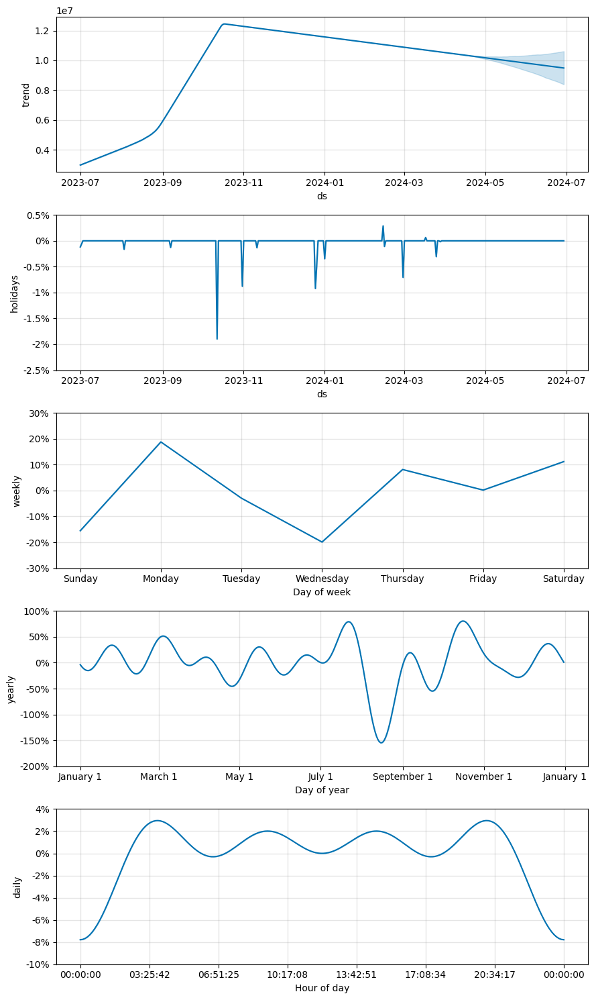

In [ ]:
fig = final_model.plot_components(forecast)

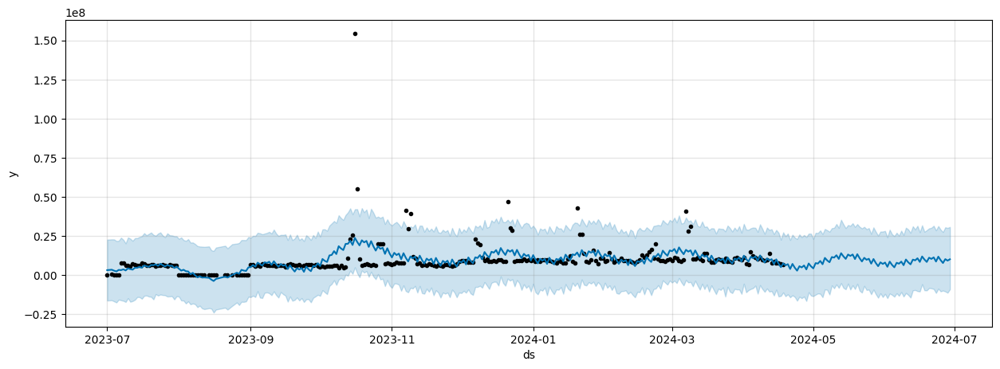

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.show()

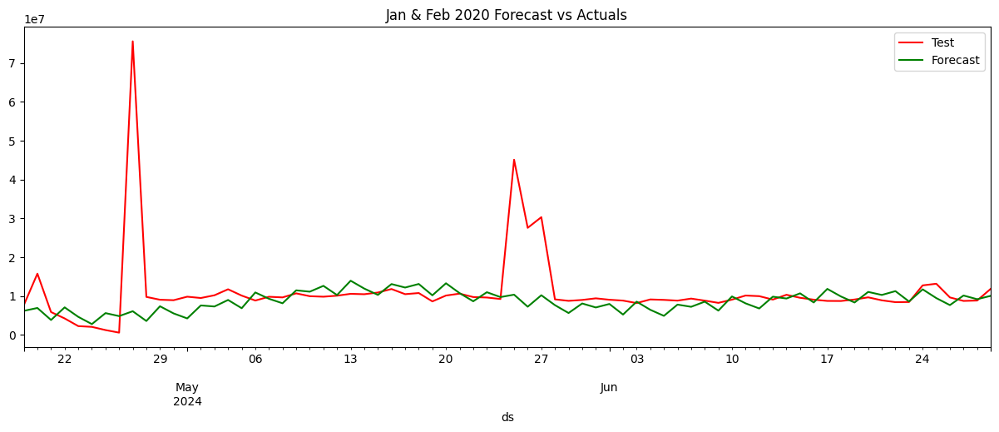

In [ ]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
test_data.plot(kind='line',x='Date/Time', y='gmv', color='red', label='Test', ax=ax)
test.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Jan & Feb 2020 Forecast vs Actuals')
plt.show()

###Informer

In [ ]:
import argparse
import os
import torch
import sys
import pandas as pd
sys.path.append('/content/informer/Informer2020-main')
print(sys.path)
from data.data_loader import Dataset_ETT_hour, Dataset_ETT_minute, Dataset_Custom, Dataset_Pred
import matplotlib.pyplot as plt

####Data preview

In [ ]:
raw_data = pd.read_csv('/content/merged_data.csv')
raw_data.rename(columns={'Date/Time':'date'},inplace=True)
raw_data.fillna(0,inplace=True)
raw_data.drop(columns=['fsn_ids','order_it
em_ids','del_b','del_c','isHoliday'],inplace=True)
raw_data['date']=pd.to_datetime(raw_data['date'])
# raw_data.set_index('date',inplace=True)
raw_data.to_csv('wfinal.csv')


In [ ]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358 entries, 0 to 357
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date                   358 non-null    datetime64[ns]
 1   gmv                    358 non-null    float64       
 2   Year                   358 non-null    int64         
 3   Month                  358 non-null    int64         
 4   Day                    358 non-null    int64         
 5   Data Quality           358 non-null    float64       
 6   Max Temp (°C)          358 non-null    float64       
 7   Min Temp (°C)          358 non-null    float64       
 8   Mean Temp (°C)         358 non-null    float64       
 9   Heat Deg Days (°C)     358 non-null    float64       
 10  Cool Deg Days (°C)     358 non-null    float64       
 11  Total Rain (mm)        358 non-null    float64       
 12  Total Snow (cm)        358 non-null    float64       
 13  Total

####Argument
设置参数

In [ ]:
parser = argparse.ArgumentParser(description='[Informer] Long Sequences Forecasting')

parser.add_argument('--model', type=str, required=False, default='informer',help='model of experiment, options: [informer, informerstack, informerlight(TBD)]')

parser.add_argument('--data', type=str, required=False, default='wfinal', help='data') #用于后面选data_dict数据处理器
parser.add_argument('--root_path', type=str, default='/kaggle/working/', help='root path of the data file') #数据的存储路径
parser.add_argument('--data_path', type=str, default='wfinal.csv', help='data file')    #文件名
#预测方式，是多维预测多维还是一维预测一维,...
parser.add_argument('--features', type=str, default='MS', help='forecasting task, options:[M, S, MS]; M:multivariate predict multivariate, S:univariate predict univariate, MS:multivariate predict univariate')
# 预测的target也就是想要预测的结果。比如我想预测的是主轴承温度
parser.add_argument('--target', type=str, default='gmv', help='target feature in S or MS task')
# 时序数据的频率，这里就是10min
parser.add_argument('--freq', type=str, default='d', help='freq for time features encoding, options:[s:secondly, t:minutely, h:hourly, d:daily, b:business days, w:weekly, m:monthly], you can also use more detailed freq like 15min or 3h')
# checkpints的存储位置
parser.add_argument('--checkpoints', type=str, default='./checkpoints/', help='location of model checkpoints')

parser.add_argument('--seq_len', type=int, default=179, help='input sequence length of Informer encoder')
parser.add_argument('--label_len', type=int, default=60, help='start token length of Informer decoder')
# encoder和decoder输入的长度
# Informer decoder input: concat[start token series(label_len), zero padding series(pred_len)]
# 我写的这样 就是encoder 输入576，decoder输入288
parser.add_argument('--pred_len', type=int, default=30, help='prediction sequence length')
# encoder 和decoder输入的维度
parser.add_argument('--enc_in', type=int, default=39, help='encoder input size') #encoder输入的维度
parser.add_argument('--dec_in', type=int, default=39, help='decoder input size') #decoder输入的维度
parser.add_argument('--c_out', type=int, default=1, help='output size') #最终预测输出的维度 这里写了其实会在后面复写掉
# 模型的参数
parser.add_argument('--d_model', type=int, default=512, help='dimension of model')
parser.add_argument('--n_heads', type=int, default=8, help='num of heads')
parser.add_argument('--e_layers', type=int, default=2, help='num of encoder layers')
parser.add_argument('--d_layers', type=int, default=1, help='num of decoder layers')
parser.add_argument('--s_layers', type=str, default='3,2,1', help='num of stack encoder layers')
parser.add_argument('--d_ff', type=int, default=2048, help='dimension of fcn')
parser.add_argument('--factor', type=int, default=5, help='probsparse attn factor')
parser.add_argument('--padding', type=int, default=0, help='padding type')
parser.add_argument('--distil', action='store_false', help='whether to use distilling in encoder, using this argument means not using distilling', default=True)
parser.add_argument('--dropout', type=float, default=0.05, help='dropout')
parser.add_argument('--attn', type=str, default='prob', help='attention used in encoder, options:[prob, full]')
parser.add_argument('--embed', type=str, default='timeF', help='time features encoding, options:[timeF, fixed, learned]')
parser.add_argument('--activation', type=str, default='gelu',help='activation')
parser.add_argument('--output_attention', action='store_true', help='whether to output attention in ecoder')
parser.add_argument('--do_predict', action='store_true', help='whether to predict unseen future data')
parser.add_argument('--mix', action='store_false', help='use mix attention in generative decoder', default=True)
parser.add_argument('--cols', type=str, nargs='+', help='certain cols from the data files as the input features')
# 实验的参数
parser.add_argument('--num_workers', type=int, default=0, help='data loader num workers')
parser.add_argument('--itr', type=int, default=2, help='experiments times') #实验几次
parser.add_argument('--train_epochs', type=int, default=6, help='train epochs') #6个epoch，每个epoch遍历所有数据
parser.add_argument('--batch_size', type=int, default=32, help='batch size of train input data')
parser.add_argument('--patience', type=int, default=3, help='early stopping patience')
parser.add_argument('--learning_rate', type=float, default=0.0001, help='optimizer learning rate')
parser.add_argument('--des', type=str, default='test',help='exp description')
parser.add_argument('--loss', type=str, default='mse',help='loss function')
parser.add_argument('--lradj', type=str, default='type1',help='adjust learning rate')
parser.add_argument('--use_amp', action='store_true', help='use automatic mixed precision training', default=False)
parser.add_argument('--inverse', action='store_true', help='inverse output data', default=False)

parser.add_argument('--use_gpu', type=bool, default=True, help='use gpu')
parser.add_argument('--gpu', type=int, default=0, help='gpu')
parser.add_argument('--use_multi_gpu', action='store_true', help='use multiple gpus', default=True)
parser.add_argument('--devices', type=str, default='0,1',help='device ids of multile gpus')

args = parser.parse_args([])


In [ ]:
args.use_gpu = True if (torch.cuda.is_available() and args.use_gpu) else False
args.use_gpu

True

In [ ]:
if args.use_gpu and args.use_multi_gpu:
    args.devices = args.devices.replace(' ','')
    device_ids = args.devices.split(',')
    args.device_ids = [int(id_) for id_ in device_ids]
    args.gpu = args.device_ids[0]


data_parser = {
    'ETTh1':{'data':'ETTh1.csv','T':'OT','M':[7,7,7],'S':[1,1,1],'MS':[7,7,1]},
    'ETTh2':{'data':'ETTh2.csv','T':'OT','M':[7,7,7],'S':[1,1,1],'MS':[7,7,1]},
    'ETTm1':{'data':'ETTm1.csv','T':'OT','M':[7,7,7],'S':[1,1,1],'MS':[7,7,1]},
    'ETTm2':{'data':'ETTm2.csv','T':'OT','M':[7,7,7],'S':[1,1,1],'MS':[7,7,1]},
    'WTH':{'data':'WTH.csv','T':'WetBulbCelsius','M':[12,12,12],'S':[1,1,1],'MS':[12,12,1]},
    'ECL':{'data':'ECL.csv','T':'MT_320','M':[321,321,321],'S':[1,1,1],'MS':[321,321,1]},
    'Solar':{'data':'solar_AL.csv','T':'POWER_136','M':[137,137,137],'S':[1,1,1],'MS':[137,137,1]},
    'winformer':{'data':'wfinal-2.csv','T':'gmv','M':[5,5,5],'S':[1,1,1],'MS':[5,5,1]}
}
if args.data in data_parser.keys():
    data_info = data_parser[args.data] #提取字典
    args.data_path = data_info['data'] #保存csv文件名称
    args.target = data_info['T'] #label 的特征名
    args.enc_in, args.dec_in, args.c_out = data_info[args.features] #一些维度

args.s_layers = [str(x) for x in args.s_layers] #convert integers to strings in list
# args.s_layers_str = ','.join(args.s_layers)
# args.s_layers = [int(s_l) for s_l in args.s_layers_str.replace(' ','').split(',')] #num of stack encoder layers
args.detail_freq = args.freq #freq for time features encoding, options:[s:secondly, t:minutely, h:hourly,
#d:daily,b:business days, w:weekly, m:monthly], you can also use more detailed freq like 15min or 3h
args.freq = args.freq[-1:]


In [ ]:
print('Args in experiment:')
print(args)
print(args.seq_len, args.label_len, args.pred_len)


Args in experiment:
Namespace(model='informer', data='wfinal', root_path='/kaggle/working/', data_path='wfinal.csv', features='MS', target='gmv', freq='d', checkpoints='./checkpoints/', seq_len=179, label_len=60, pred_len=30, enc_in=39, dec_in=39, c_out=1, d_model=512, n_heads=8, e_layers=2, d_layers=1, s_layers=['3', ',', '2', ',', '1'], d_ff=2048, factor=5, padding=0, distil=True, dropout=0.05, attn='prob', embed='timeF', activation='gelu', output_attention=False, do_predict=False, mix=True, cols=None, num_workers=0, itr=2, train_epochs=6, batch_size=32, patience=3, learning_rate=0.0001, des='test', loss='mse', lradj='type1', use_amp=False, inverse=False, use_gpu=True, gpu=0, use_multi_gpu=True, devices='0,1', device_ids=[0, 1], detail_freq='d')
179 60 30


#### Wandb 可视化

In [ ]:
import wandb
wandb.login(key='Wandb_API')
# notes = f'steeldefectdetection:{path}'
wandb.init(entity='khushboohp1811',project="Informer",
           config={
    "learning_rate": args.learning_rate,
    "epochs": args.train_epochs,
    "batch_size":args.batch_size,
    "architecture": args.model,
    "dataset": args.data_path,
    "features":args.features,
    "target":args.target,
    "freq":args.detail_freq,
    }
,)

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


####Exp_Informer

##### Exp_basic

In [ ]:
print(args.use_multi_gpu)
print(args.gpu)
print(args.devices)
print(args.use_gpu)

True
0
0,1
True


In [ ]:
class Exp_Basic(object):
    def __init__(self, args):
        self.args = args
        self.device = self._acquire_device()
        if not args.use_multi_gpu:
            self.model = self._build_model().to(self.device)
        else:
            self.model =  torch.nn.DataParallel(self._build_model()).cuda()

    def _build_model(self):
        raise NotImplementedError
        return None

    def _acquire_device(self):
        if self.args.use_gpu:
            os.environ["CUDA_VISIBLE_DEVICES"] = str(self.args.gpu) if not self.args.use_multi_gpu else self.args.devices
            if not self.args.use_multi_gpu:
                os.environ["CUDA_VISIBLE_DEVICES"] = str(self.args.gpu)
                device = torch.device('cuda:{}'.format(self.args.gpu))
            else:
                os.environ["CUDA_VISIBLE_DEVICES"] = self.args.devices
                print('Use GPU: cuda:{}'.format(self.args.gpu))
                device = torch.device('cuda:{}'.format(self.args.gpu))
        else:
            device = torch.device('cpu')
            print('Use CPU')
        return device

    def _get_data(self):
        pass

    def vali(self):
        pass

    def train(self):
        pass

    def test(self):
        pass


In [ ]:
from data.data_loader import Dataset_ETT_hour, Dataset_ETT_minute, Dataset_Custom, Dataset_Pred
# from exp.exp_basic import Exp_Basic
from models.model import Informer, InformerStack

from utils.tools import EarlyStopping, adjust_learning_rate
from utils.metrics import metric

import numpy as np

import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader

import os
import time

import warnings
warnings.filterwarnings('ignore')

In [ ]:

class Exp_Informer(Exp_Basic):
    def __init__(self, args):
        super(Exp_Informer, self).__init__(args)

    def _build_model(self):
        model_dict = {
            'informer':Informer,
            'informerstack':InformerStack,
        }
        if self.args.model=='informer' or self.args.model=='informerstack':
            model = model_dict[self.args.model](
                self.args.enc_in, #5
                self.args.dec_in,  #5
                self.args.c_out, #1
                self.args.seq_len, #576
                self.args.label_len, #144
                self.args.pred_len, #144
                self.args.factor, #5
                self.args.d_model, #512
                self.args.n_heads,  #8
                self.args.e_layers, #2 encoder layer
                self.args.d_layers, #1 decoder layer
                self.args.d_ff, #2048 dimension of fcn 全卷积神经网络？
                self.args.dropout, #0.05
                self.args.attn, #prob
                self.args.embed, #timeF
                self.args.freq, #freq for timefeature embedding h means hour
                self.args.activation, #gelu
                self.args.output_attention, #false
                self.args.distil, #true
                self.device
            )

        return model.double()

    def _get_data(self, flag):
        args = self.args

        data_dict = {
            'ETTh1':Dataset_ETT_hour,
            'ETTh2':Dataset_ETT_hour,
            'ETTm1':Dataset_ETT_minute,
            'ETTm2':Dataset_ETT_minute,
            'custom':Dataset_Custom,
            'wfinal':Dataset_Custom ####自己新加的，呼应args里的data
        }
        Data = data_dict[self.args.data]
        timeenc = 0 if args.embed!='timeF' else 1 # 1

        if flag == 'test':
            shuffle_flag = False; drop_last = True; batch_size = args.batch_size
        else:
            shuffle_flag = True; drop_last = True; batch_size = args.batch_size

        data_set = Data(  # Dataset_ETT_hour
            root_path=args.root_path,
            data_path=args.data_path,
            flag=flag,
            size=[args.seq_len, args.label_len, args.pred_len],
                 #576   144   144
            features=args.features, #MS
            target=args.target,# 主轴温度那一列
            timeenc=timeenc, #0
            freq=args.freq #t
        )
        print(flag, len(data_set))
        data_loader = DataLoader(
            data_set,
            batch_size=batch_size, #32
            shuffle=shuffle_flag, #是否在每个epoch都重新洗牌
            num_workers=args.num_workers, #默认为0，data will be loaded in the main process
            drop_last=drop_last) #drop the last incomplete batch

        return data_set, data_loader

    def _select_optimizer(self):
        model_optim = optim.Adam(self.model.parameters(), lr=self.args.learning_rate) #learning_rate = 0.0001
        return model_optim

    def _select_criterion(self):
        criterion =  nn.MSELoss()
        return criterion

    def vali(self, vali_data, vali_loader, criterion):
        self.model.eval()
        total_loss = []
        for i, (batch_x,batch_y,batch_x_mark,batch_y_mark) in enumerate(vali_loader):
            batch_x = batch_x.double().to(self.device)
            batch_y = batch_y.double()

            batch_x_mark = batch_x_mark.double().to(self.device)
            batch_y_mark = batch_y_mark.double().to(self.device)

            # decoder input
            dec_inp = torch.zeros_like(batch_y[:,-self.args.pred_len:,:]).double()
            dec_inp = torch.cat([batch_y[:,:self.args.label_len,:], dec_inp], dim=1).double().to(self.device)
            # encoder - decoder
            if self.args.output_attention: #False
                outputs = self.model(batch_x, batch_x_mark, dec_inp, batch_y_mark)[0]
            else:
                outputs = self.model(batch_x, batch_x_mark, dec_inp, batch_y_mark)
            f_dim = -1 if self.args.features=='MS' else 0
            batch_y = batch_y[:,-self.args.pred_len:,f_dim:].to(self.device)

            pred = outputs.detach().cpu()
            true = batch_y.detach().cpu()
            loss = criterion(pred, true)
            wandb.log({"vali_loss":loss})
            total_loss.append(loss)
        total_loss = np.average(total_loss)
        self.model.train()
        return total_loss

    def train(self, setting):
        train_data, train_loader = self._get_data(flag = 'train')
        vali_data, vali_loader = self._get_data(flag = 'val')
        test_data, test_loader = self._get_data(flag = 'test')

        path = './checkpoints/'+setting
        if not os.path.exists(path):
            os.makedirs(path)

        time_now = time.time()

        train_steps = len(train_loader)
        early_stopping = EarlyStopping(patience=self.args.patience, verbose=True)

        model_optim = self._select_optimizer()
        criterion =  self._select_criterion()

        for epoch in range(self.args.train_epochs):
            iter_count = 0
            train_loss = []

            self.model.train()
            for i, (batch_x,batch_y,batch_x_mark,batch_y_mark) in enumerate(train_loader):
                iter_count += 1

                model_optim.zero_grad()

                batch_x = batch_x.double().to(self.device)
                batch_y = batch_y.double()

                batch_x_mark = batch_x_mark.double().to(self.device)
                batch_y_mark = batch_y_mark.double().to(self.device)

                # decoder input
                dec_inp = torch.zeros_like(batch_y[:,-self.args.pred_len:,:]).double() #用0 mask pred部分
                dec_inp = torch.cat([batch_y[:,:self.args.label_len,:], dec_inp], dim=1).double().to(self.device)
                # encoder - decoder
                if self.args.output_attention: #False
                    outputs = self.model(batch_x, batch_x_mark, dec_inp, batch_y_mark)[0]
                else:
                    outputs = self.model(batch_x, batch_x_mark, dec_inp, batch_y_mark)

                f_dim = -1 if self.args.features=='MS' else 0
                batch_y = batch_y[:,-self.args.pred_len:,f_dim:].to(self.device) #预测的部分
                loss = criterion(outputs, batch_y)

                wandb.log({"train_loss":loss,})

                train_loss.append(loss.item())

                if (i+1) % 100==0:
                    print("\titers: {0}, epoch: {1} | loss: {2:.7f}".format(i + 1, epoch + 1, loss.item()))
                    speed = (time.time()-time_now)/iter_count
                    left_time = speed*((self.args.train_epochs - epoch)*train_steps - i)
                    print('\tspeed: {:.4f}s/iter; left time: {:.4f}s'.format(speed, left_time))
                    pred = outputs.detach().cpu().numpy().reshape(-1,outputs.shape[-2])
                    true = batch_y.detach().cpu().numpy().reshape(-1,batch_y.shape[-2])
                    pred0 = pred[0]
                    true0 = true[0]
    #                 print(pred.shape)
    #                 print(true.shape)
    #                 print('train shape:', pred.shape, true.shape)
    #                 print(pred)
    #                 print(true)
                    mae, mse, rmse, mape, mspe = metric(pred,true)
                    fig, ax = plt.subplots(figsize=(15,3))
                    ax.plot(np.arange(pred0.shape[0]),pred0,color='blue',label='predict')
                    ax.plot(np.arange(true0.shape[0]),true0,color='red',label='target')
                    ax.legend()
                    wandb.log({'mae':mae,'mse':mse,'rmse':rmse,'mape':mape,'mspe':mspe,"plt":wandb.Plotly(plt.gcf())})
                    iter_count = 0
                    time_now = time.time()


                loss.backward()
                model_optim.step()

            train_loss = np.average(train_loss)
            vali_loss = self.vali(vali_data, vali_loader, criterion)
            test_loss = self.vali(test_data, test_loader, criterion)

            print("Epoch: {0}, Steps: {1} | Train Loss: {2:.7f} Vali Loss: {3:.7f} Test Loss: {4:.7f}".format(
                epoch + 1, train_steps, train_loss, vali_loss, test_loss))
#             wandb.log({"epoch":epoch+1,"Steps":train_steps,"loss":train_loss,"vali_loss":vali_loss,"test_loss":test_loss})
            early_stopping(vali_loss, self.model, path)
            if early_stopping.early_stop:
                print("Early stopping")
                break

            adjust_learning_rate(model_optim, epoch+1, self.args)

        best_model_path = path+'/'+'checkpoint.pth'
        self.model.load_state_dict(torch.load(best_model_path))

        return self.model

    def test(self, setting):
        test_data, test_loader = self._get_data(flag='test')

        self.model.eval()

        preds = []
        trues = []

        for i, (batch_x,batch_y,batch_x_mark,batch_y_mark) in enumerate(test_loader):
            batch_x = batch_x.double().to(self.device)
            batch_y = batch_y.double()
            batch_x_mark = batch_x_mark.double().to(self.device)
            batch_y_mark = batch_y_mark.double().to(self.device)

            # decoder input
            dec_inp = torch.zeros_like(batch_y[:,-self.args.pred_len:,:]).double()
            dec_inp = torch.cat([batch_y[:,:self.args.label_len,:], dec_inp], dim=1).double().to(self.device)
            # encoder - decoder
            if self.args.output_attention:
                outputs = self.model(batch_x, batch_x_mark, dec_inp, batch_y_mark)[0]
            else:
                outputs = self.model(batch_x, batch_x_mark, dec_inp, batch_y_mark)
            f_dim = -1 if self.args.features=='MS' else 0
            batch_y = batch_y[:,-self.args.pred_len:,f_dim:].to(self.device)

            pred = outputs.detach().cpu().numpy()#.squeeze()
            true = batch_y.detach().cpu().numpy()#.squeeze()

            preds.append(pred)
            trues.append(true)

        preds = np.array(preds)
        trues = np.array(trues)
        print('test shape:', preds.shape, trues.shape)
        preds = preds.reshape(-1, preds.shape[-2], preds.shape[-1])
        trues = trues.reshape(-1, trues.shape[-2], trues.shape[-1])
        print('test shape:', preds.shape, trues.shape)

        # result save
        folder_path = './results/' + setting +'/'
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)

        mae, mse, rmse, mape, mspe = metric(preds, trues)
        print('mse:{}, mae:{}'.format(mse, mae))
        wandb.log({"mae":mae,"mse":mse,"rmse":rmse,"mape":mape,"mspe":mspe})
        np.save(folder_path+'metrics.npy', np.array([mae, mse, rmse, mape, mspe]))
        np.save(folder_path+'pred.npy', preds)
        np.save(folder_path+'true.npy', trues)

        return

In [ ]:
Exp = Exp_Informer

In [ ]:
for ii in range(args.itr):
    # setting record of experiments
    setting = '{}_{}_ft{}_sl{}_ll{}_pl{}_dm{}_nh{}_el{}_dl{}_df{}_at{}_fc{}_eb{}_dt{}_mx{}_{}_{}'.format(args.model, args.data, args.features,
                args.seq_len, args.label_len, args.pred_len,
                args.d_model, args.n_heads, args.e_layers, args.d_layers, args.d_ff, args.attn, args.factor,
                args.embed, args.distil, args.mix, args.des, ii)

    exp = Exp(args) # set experiments
    print('>>>>>>>start training : {}>>>>>>>>>>>>>>>>>>>>>>>>>>'.format(setting))
    exp.train(setting)

    print('>>>>>>>testing : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(setting))
    exp.test(setting)

    if args.do_predict:
        print('>>>>>>>predicting : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(setting))
        exp.predict(setting, True)

    torch.cuda.empty_cache()

Use GPU: cuda:0
>>>>>>>start training : informer_wfinal_ftMS_sl179_ll60_pl30_dm512_nh8_el2_dl1_df2048_atprob_fc5_ebtimeF_dtTrue_mxTrue_test_0>>>>>>>>>>>>>>>>>>>>>>>>>>
train 42
val 8
test 42
Epoch: 1, Steps: 1 | Train Loss: 2.2958876 Vali Loss: nan Test Loss: 1.7129822
Validation loss decreased (inf --> nan).  Saving model ...
Updating learning rate to 0.0001
Epoch: 2, Steps: 1 | Train Loss: 2.6913062 Vali Loss: nan Test Loss: 1.1589053
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3, Steps: 1 | Train Loss: 1.9366687 Vali Loss: nan Test Loss: 1.1679567
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 2.5e-05
Epoch: 4, Steps: 1 | Train Loss: 1.6641149 Vali Loss: nan Test Loss: 1.1787607
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1.25e-05
Epoch: 5, Steps: 1 | Train Loss: 1.7651640 Vali Loss: nan Test Loss: 1.1845702
Validation loss decreased (nan --> nan).  Sa

###Autoformer

In [ ]:
!git clone https://github.com/thuml/Autoformer.git

Cloning into 'Autoformer'...
remote: Enumerating objects: 376, done.
remote: Counting objects: 100% (212/212), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 376 (delta 157), reused 143 (delta 143), pack-reused 164 (from 2)
Receiving objects: 100% (376/376), 2.20 MiB | 4.98 MiB/s, done.
Resolving deltas: 100% (221/221), done.


In [ ]:
!pip install -r /content/Autoformer/requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
import pandas as pd
raw_data = pd.read_csv('/content/merged_data.csv')
raw_data.rename(columns={'Date/Time':'date'},inplace=True)
raw_data.fillna(0,inplace=True)
raw_data.drop(columns=['fsn_ids','order_item_ids','del_b','del_c','isHoliday'],inplace=True)
raw_data['date'] = pd.to_datetime(raw_data['date'], format='%d-%m-%Y', errors='coerce')
raw_data.to_csv('/content/merged.csv')

In [ ]:
import os
os.chdir('/content/Autoformer')
!python run.py

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: khushboohp1811 (hex-plane) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.19.8
wandb: Run data is saved locally in /content/Autoformer/wandb/run-20250320_173408-1zl2cq9g
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run woven-cosmos-50
wandb: ⭐️ View project at https://wandb.ai/khushboohp1811/Informer
wandb: 🚀 View run at https://wandb.ai/khushboohp1811/Informer/runs/1zl2cq9g
2025-03-20:17:34:09,604 INFO     [utils.py:162] NumExpr defaulting to 2 threads.
Args in experiment:
Namespace(is_training=1, model_id='pred', model='Autoformer', data='merged', root_path='/content/', data_path='merged.csv', features='MS', target='gmv', freq='d', checkpoints='./checkpoints/', seq_len=60, label_len=45, pred_len=30, bucket_size=4, n_hashes=4, enc_in=39, dec_in=39, c_out=1, d_model=512, n_heads=8, e_layers=2, d_layers=1,

In [ ]:
class dotdict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__
args = dotdict({
    'is_training': 0,  # 0 for prediction
    'model_id': 'predict',
    'model': 'Autoformer',

    # data loader
    'data': 'merged',
    'root_path': '/content/',
    'data_path': 'merged.csv',
    'features': 'MS',
    'target': 'gmv',
    'freq': 'd',
    'checkpoints': '/content/Autoformer/checkpoints/pred_Autoformer_merged_ftMS_sl60_ll45_pl30_dm512_nh8_el2_dl1_df2048_fc1_ebtimeF_dtTrue_test_1',  # Or your checkpoint path

    # forecasting task
    'seq_len': 358,  # Prediction seq_len
    'label_len': 30,  # Prediction label_len
    'pred_len': 358, # Prediction pred_len

    # model define
    'bucket_size': 4,
    'n_hashes': 4,
    'enc_in': 39,
    'dec_in': 39,
    'c_out': 1,
    'd_model': 512,
    'n_heads': 8,
    'e_layers': 2,
    'd_layers': 1,
    'd_ff': 2048,
    'moving_avg': 25,
    'factor': 1,
    'distil': True,
    'dropout': 0.05,
    'embed': 'timeF',
    'activation': 'gelu',
    'output_attention': False,
    'do_predict': True,

    # optimization (not used for prediction, but still needed)
    'num_workers': 10,
    'itr': 1,  # Usually 1 for prediction
    'train_epochs': 1,  # Not used for prediction
    'batch_size': 1,  # Prediction often uses batch size 1
    'patience': 3,  # Not used for prediction
    'learning_rate': 0.0001,  # Not used for prediction
    'des': 'test',  # Or your experiment description
    'loss': 'mse',  # Not used for prediction, but needed for Exp_Main
    'lradj': 'type1',  # Not used for prediction
    'use_amp': False,  # Or your AMP setting

    # GPU
    'use_gpu': True,
    'gpu': 0,
    'use_multi_gpu': False,
    'devices': '0,1,2,3',
})

In [ ]:
import os
import torch
os.chdir('/content/Autoformer')
from exp.exp_main import Exp_Main
print('>>>>>>>predicting : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(args.data)) #use args.data instead of setting.
exp = Exp_Main(args)

>>>>>>>predicting : merged<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
Use GPU: cuda:0


In [ ]:


setting = '/content/Autoformer/checkpoints/test_Autoformer_merged_ftMS_sl60_ll45_pl30_dm512_nh8_el2_dl1_df2048_fc1_ebtimeF_dtTrue_test_1'

print('>>>>>>>predicting : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(setting))
exp.predict(setting, True)
torch.cuda.empty_cache()

>>>>>>>predicting : /content/Autoformer/checkpoints/test_Autoformer_merged_ftMS_sl60_ll45_pl30_dm512_nh8_el2_dl1_df2048_fc1_ebtimeF_dtTrue_test_1<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
pred 1


In [ ]:
import numpy as np
import pandas as pd
pred=np.load('/content/Autoformer/results/content/Autoformer/checkpoints/test_Autoformer_merged_ftMS_sl60_ll45_pl30_dm512_nh8_el2_dl1_df2048_fc1_ebtimeF_dtTrue_test_1/real_prediction.npy')

In [ ]:
pred=pd.DataFrame(pred)
pred.to_csv('content/pred.csv',index=False)

##**Final Comparision on Testing Set:**
1. LSTM:
Test Set MSE: 75462877465637
Test Set MAE: 5456093
Test Set MAPE: 48181.76
Test Set RMSE: 8686937

Test Set MSE: 72174252973019.656250
Test Set MAE: 5504184.437268
Test Set MAPE: 62020.13
Test Set RMSE: 8495543.124075

2. ARIMA:
MSE: 88659828216005
MAE: 7463200
MAPE: 151513.91
RMSE: 9415935

3. Prophet
MSE: 264347704143536
MAE: 14840165
MAPE: 264766.81
RMSE: 16258773

# Budget Reduction

In [ ]:
df=pd.read_csv("budget_data.csv")

In [ ]:
df.columns

Index(['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio',
       'Other', 'gmv', 'Weather_Index_PCA', 'weather_score', 'count_holiday',
       'count_sales_day', 'list_price', 'discount_percentage',
       'purchase_frequency', 'average_order_value', 'total_delivery_days',
       'deliverybdays', 'deliverycdays', 'product_procurement_sla',
       'product_mrp'],
      dtype='object')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import pymc as pm
from skopt import gp_minimize

In [ ]:
channels = ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
            ' Affiliates', 'SEM', 'Radio', 'Other']
external_factors = ['Weather_Index_PCA', 'weather_score', 'count_holiday',
       'count_sales_day', 'discount_percentage',
       'purchase_frequency', 'average_order_value', 'total_delivery_days',]

# adstock
def apply_adstock(x, rate=0.5):
  result = np.zeros_like(x)
  result[0] = x[0]
  for t in range(1, len(x)):
    result[t] = x[t] + rate * result[t-1]
  return result

adstocked_df = df.copy()
for channel in channels:
  adstocked_df[channel] = apply_adstock(df[channel].values)

# calculate total investment and profit
adstocked_df['Total Investment'] = adstocked_df[channels].sum(axis=1)
adstocked_df['Profit'] = adstocked_df['gmv'] - adstocked_df['Total Investment']

# bayesian ROI estimation per channel
roi_estimates = {}
for channel in channels:
  with pm.Model() as model:
    beta = pm.Normal("beta", mu=0, sigma=1)
    sigma = pm.HalfNormal("sigma", sigma=1)
    mu = beta * adstocked_df[channel].values
    obs = pm.Normal("obs", mu=mu, sigma=sigma, observed=adstocked_df['gmv'].values)

    trace = pm.sample(1000, tune=1000, cores=1, random_seed=42, target_accept=0.9, progressbar=False)
    roi_mean = trace.posterior['beta'].mean().values.item()
    roi_estimates[channel] = roi_mean

# external factor coefficients (Bayesian)
with pm.Model() as ext_model:
  betas_ext = pm.Normal("betas_ext", mu=0, sigma=1, shape=len(external_factors))
  sigma_ext = pm.HalfNormal("sigma_ext", sigma=1)
  mu_ext = sum(betas_ext[j] * adstocked_df[external_factors[j]].values for j in range(len(external_factors)))
  obs_ext = pm.Normal("obs_ext", mu=mu_ext, sigma=sigma_ext, observed=adstocked_df['gmv'].values)

  trace_ext = pm.sample(1000, tune=1000, cores=1, random_seed=42, target_accept=0.9, progressbar=False)
  ext_coeff_means = trace_ext.posterior['betas_ext'].mean(axis=(0, 1)).values
  external_coeffs = dict(zip(external_factors, ext_coeff_means))

# define profit maximization objective
def negative_profit(spend_array):
  predicted_rev = 0
  for i, ch in enumerate(channels):
    predicted_rev += roi_estimates[ch] * spend_array[i]
  for j, ef in enumerate(external_factors):
    predicted_rev += external_coeffs[ef] * adstocked_df[ef].mean()
  total_investment = sum(spend_array)
  profit = predicted_rev - total_investment
  return -profit  # maximize profit

# optimization setup
initial_spend = adstocked_df[channels].sum().values
bounds = [(0.8 * val, 1.2 * val) for val in initial_spend]

result = gp_minimize(negative_profit, bounds, n_calls=50, random_state=42)
optimized_spend = result.x

# results
# print("Original Total Investment:", round(initial_spend.sum(), 2))
# print("Optimized Total Investment:", round(sum(optimized_spend), 2))
# print("Original Profit Estimate:", round(adstocked_df['Profit'].sum(), 2))
# print("Optimized Profit Estimate:", round(-result.fun * len(df), 2))

# plots
# plt.figure(figsize=(6, 4))
# bar_width = 0.4
# index = np.arange(len(channels))

# plt.bar(index, initial_spend, bar_width, label="Current Budget", color='red', alpha=0.6)
# plt.bar(index + bar_width, optimized_spend, bar_width, label="Optimized Budget", color='green')

# plt.xlabel("Marketing Channels")
# plt.ylabel("Total Investment")
# plt.title("Optimized vs Current Budget")
# plt.xticks(index + bar_width / 2, channels, rotation=45)
# plt.legend()
# plt.tight_layout()
# plt.show()

Original Total Investment: 1576.0
Optimized Total Investment: 1477.32
Original Profit Estimate: -1222.41
Optimized Profit Estimate: 815.43
Original Total Revenue: 353.6
Optimized Total Revenue: 2292.75


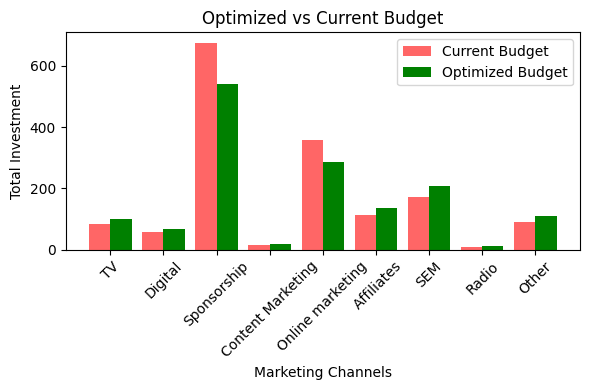

In [ ]:
# --- Results and Visualization ---
print("Original Total Investment:", round(initial_spend.sum(), 2))
print("Optimized Total Investment:", round(sum(optimized_spend), 2))
print("Original Profit Estimate:", round(adstocked_df['Profit'].sum(), 2))
print("Optimized Profit Estimate:", round(-result.fun, 2))
print("Original Total Revenue:", round(initial_spend.sum()+adstocked_df['Profit'].sum(), 2))
print("Optimized Total Revenue:", round(sum(optimized_spend)-result.fun, 2))

plt.figure(figsize=(6, 4))
bar_width = 0.4
index = np.arange(len(channels))

plt.bar(index, initial_spend, bar_width, label="Current Budget", color='red', alpha=0.6)
plt.bar(index + bar_width, optimized_spend, bar_width, label="Optimized Budget", color='green')

plt.xlabel("Marketing Channels")
plt.ylabel("Total Investment")
plt.title("Optimized vs Current Budget")
plt.xticks(index + bar_width / 2, channels, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import pymc as pm

roi_estimates = {}

for channel in channels:
  with pm.Model() as model:
    beta = pm.Normal("beta", mu=0, sigma=1)
    sigma = pm.HalfNormal("sigma", sigma=1)
    mu = beta * df[channel].values
    revenue_obs = pm.Normal("revenue_obs", mu=mu, sigma=sigma, observed=df['gmv'].values)

    trace = pm.sample(1000, tune=1000, cores=1, progressbar=False, random_seed=42, target_accept=0.9)
    roi_mean = trace.posterior['beta'].mean().values.item()
    roi_estimates[channel] = roi_mean

print("\n--- ROI Estimates per Channel ---")
for ch, roi in roi_estimates.items():
  print(f"{ch}: {roi:.4f}")


--- ROI Estimates per Channel ---
TV: 5.3827
Digital: 3.9787
Sponsorship: 0.6782
Content Marketing: 2.8239
Online marketing: 1.7123
 Affiliates: 5.2016
SEM: 2.2712
Radio: 1.5561
Other: 1.5961


In [ ]:
external_coefficients = {}

with pm.Model() as model:
  # Priors for coefficients of external factors
  betas = pm.Normal("betas", mu=0, sigma=1, shape=len(external_factors))
  sigma = pm.HalfNormal("sigma", sigma=1)

  # Linear combination of external factors
  mu = pm.math.dot(df[external_factors].values, betas)
  revenue_obs = pm.Normal("revenue_obs", mu=mu, sigma=sigma, observed=df['gmv'].values)

  trace = pm.sample(1000, tune=1000, cores=1, progressbar=False, random_seed=42, target_accept=0.9)
  beta_means = trace.posterior['betas'].mean(dim=["chain", "draw"]).values

for i, factor in enumerate(external_factors):
  external_coefficients[factor] = beta_means[i]

print("\n--- Coefficients of External Factors ---")
for ef, coeff in external_coefficients.items():
  print(f"{ef}: {coeff:.4f}")


--- Coefficients of External Factors ---
Weather_Index_PCA: -1.1572
weather_score: -1.0653
count_holiday: 0.7776
count_sales_day: -0.5475
discount_percentage: -0.9176
purchase_frequency: -0.0852
average_order_value: 0.0396
total_delivery_days: -0.0449


## CREATING 80%-120% bound on profit optimization

In [ ]:
import numpy as np
import pandas as pd
import pymc as pm
import scipy.optimize as opt

# Assume df is already defined with your data
channels = ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
            ' Affiliates', 'SEM', 'Radio', 'Other']
external_factors = ['Weather_Index_PCA', 'weather_score', 'count_holiday',
                    'count_sales_day', 'discount_percentage',
                    'purchase_frequency', 'average_order_value', 'total_delivery_days']

# --- Apply Adstock ---
def apply_adstock(x, rate=0.5):
  result = np.zeros_like(x)
  result[0] = x[0]
  for t in range(1, len(x)):
    result[t] = x[t] + rate * result[t-1]
  return result

adstocked_df = df.copy()
for channel in channels:
  adstocked_df[channel] = apply_adstock(df[channel].values)

# --- Compute Total Investment and Profit ---
adstocked_df['Total Investment'] = adstocked_df[channels].sum(axis=1)
adstocked_df['Profit'] = adstocked_df['gmv'] - adstocked_df['Total Investment']

# --- Bayesian ROI Estimates per Channel ---
roi_estimates = {}
for channel in channels:
  with pm.Model() as model:
    beta = pm.Normal("beta", mu=0, sigma=1)
    sigma = pm.HalfNormal("sigma", sigma=1)
    mu = beta * adstocked_df[channel].values
    obs = pm.Normal("obs", mu=mu, sigma=sigma, observed=adstocked_df['gmv'].values)

    trace = pm.sample(1000, tune=1000, cores=1, random_seed=42, target_accept=0.9, progressbar=False)
    roi_mean = trace.posterior['beta'].mean().values.item()
    roi_estimates[channel] = roi_mean

# --- Bayesian Coefficients for External Factors ---
with pm.Model() as ext_model:
  betas_ext = pm.Normal("betas_ext", mu=0, sigma=1, shape=len(external_factors))
  sigma_ext = pm.HalfNormal("sigma_ext", sigma=1)
  mu_ext = sum(betas_ext[j] * adstocked_df[external_factors[j]].values for j in range(len(external_factors)))
  obs_ext = pm.Normal("obs_ext", mu=mu_ext, sigma=sigma_ext, observed=adstocked_df['gmv'].values)

  trace_ext = pm.sample(1000, tune=1000, cores=1, random_seed=42, target_accept=0.9, progressbar=False)
  ext_coeff_means = trace_ext.posterior['betas_ext'].mean(axis=(0, 1)).values
  external_coeffs = dict(zip(external_factors, ext_coeff_means))

# --- Profit Maximization Objective ---
def negative_profit(spend_array):
  predicted_rev = sum(roi_estimates[ch] * spend_array[i] for i, ch in enumerate(channels))
  predicted_rev += sum(external_coeffs[ef] * adstocked_df[ef].mean() for ef in external_factors)
  total_investment = sum(spend_array)
  profit = predicted_rev - total_investment
  return -profit  # minimize negative profit = maximize profit

# --- Original Total Profit ---
original_profit = adstocked_df['Profit'].sum()
abs_original_profit = abs(original_profit)

# --- Constraint Setup: Profit within ±10% of original absolute profit ---
profit_margin = 0.1  # 10%
min_allowed_profit = original_profit - profit_margin * abs_original_profit
max_allowed_profit = original_profit + profit_margin * abs_original_profit

def profit_constraint(spend_array):
  predicted_rev = sum(roi_estimates[ch] * spend_array[i] for i, ch in enumerate(channels))
  predicted_rev += sum(external_coeffs[ef] * adstocked_df[ef].mean() for ef in external_factors)
  total_investment = sum(spend_array)
  profit = predicted_rev - total_investment
  return max_allowed_profit - profit  # profit must be <= max_allowed_profit

def min_profit_constraint(spend_array):
  predicted_rev = sum(roi_estimates[ch] * spend_array[i] for i, ch in enumerate(channels))
  predicted_rev += sum(external_coeffs[ef] * adstocked_df[ef].mean() for ef in external_factors)
  total_investment = sum(spend_array)
  profit = predicted_rev - total_investment
  return profit - min_allowed_profit  # profit must be >= min_allowed_profit

constraints = [
  {'type': 'ineq', 'fun': profit_constraint},
  {'type': 'ineq', 'fun': min_profit_constraint}
]

# --- Optimization Setup ---
initial_spend = adstocked_df[channels].sum().values
bounds = [(0.8 * val, 1.2 * val) for val in initial_spend]

result = opt.minimize(negative_profit, x0=initial_spend, bounds=bounds, constraints=constraints, method='SLSQP')

optimized_spend = result.x

# --- Reporting ---
print("Original Total Investment:", round(initial_spend.sum(), 2))
print("Optimized Total Investment:", round(sum(optimized_spend), 2))
print("Original Profit Estimate:", round(original_profit, 2))
print("Optimized Profit Estimate:", round(-result.fun, 2))

Original Total Investment: 1576.0
Optimized Total Investment: 1674.69
Original Profit Estimate: -1222.41
Optimized Profit Estimate: 301.35


In [ ]:
channels = ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
            ' Affiliates', 'SEM', 'Radio', 'Other']

external_factors = ['Weather_Index_PCA', 'weather_score', 'count_holiday',
       'count_sales_day', 'discount_percentage',
       'purchase_frequency', 'average_order_value', 'total_delivery_days']

# Apply adstock transformation
def apply_adstock(x, rate=0.5):
  result = np.zeros_like(x)
  result[0] = x[0]
  for t in range(1, len(x)):
    result[t] = x[t] + rate * result[t-1]
  return result

adstocked_df = df.copy()
for channel in channels:
  adstocked_df[channel] = apply_adstock(df[channel].values)

# Calculate total investment and profit
adstocked_df['Total Investment'] = adstocked_df[channels].sum(axis=1)
adstocked_df['Profit'] = adstocked_df['gmv'] - adstocked_df['Total Investment']

# Bayesian ROI estimation per channel
roi_estimates = {}
for channel in channels:
  with pm.Model() as model:
    beta = pm.Normal("beta", mu=0, sigma=1)
    sigma = pm.HalfNormal("sigma", sigma=1)
    mu = beta * adstocked_df[channel].values
    obs = pm.Normal("obs", mu=mu, sigma=sigma, observed=adstocked_df['gmv'].values)

    trace = pm.sample(1000, tune=1000, cores=1, random_seed=42, target_accept=0.9, progressbar=False)
    roi_mean = trace.posterior['beta'].mean().values.item()
    roi_estimates[channel] = roi_mean

# External factor coefficients (Bayesian)
with pm.Model() as ext_model:
  betas_ext = pm.Normal("betas_ext", mu=0, sigma=1, shape=len(external_factors))
  sigma_ext = pm.HalfNormal("sigma_ext", sigma=1)
  mu_ext = sum(betas_ext[j] * adstocked_df[external_factors[j]].values for j in range(len(external_factors)))
  obs_ext = pm.Normal("obs_ext", mu=mu_ext, sigma=sigma_ext, observed=adstocked_df['gmv'].values)

  trace_ext = pm.sample(1000, tune=1000, cores=1, random_seed=42, target_accept=0.9, progressbar=False)
  ext_coeff_means = trace_ext.posterior['betas_ext'].mean(axis=(0, 1)).values
  external_coeffs = dict(zip(external_factors, ext_coeff_means))

# Original profit and GMV
original_profit = adstocked_df['Profit'].sum()
original_gmv = adstocked_df['gmv'].sum()

# Set profit bounds (±10% of total GMV)
profit_lower_bound = original_profit - 0.1 * original_gmv
profit_upper_bound = original_profit + 0.1 * original_gmv

# Define profit maximization with constraint
def negative_profit_constrained(spend_array):
  predicted_rev = 0
  for i, ch in enumerate(channels):
    predicted_rev += roi_estimates[ch] * spend_array[i]
  for ef in external_factors:
    predicted_rev += external_coeffs[ef] * adstocked_df[ef].mean()
  total_investment = sum(spend_array)
  profit = predicted_rev - total_investment

  # Apply constraint on profit change
  if not (profit_lower_bound <= profit <= profit_upper_bound):
    return 1e6  # Penalty if outside allowed profit range
  return -profit  # Otherwise, return negative profit for maximization

# Optimization setup
initial_spend = adstocked_df[channels].sum().values
bounds = [(0.8 * val, 1.2 * val) for val in initial_spend]

result = gp_minimize(negative_profit_constrained, bounds, n_calls=50, random_state=42)
optimized_spend = result.x

# Compute optimized profit
predicted_rev_optimized = 0
for i, ch in enumerate(channels):
  predicted_rev_optimized += roi_estimates[ch] * optimized_spend[i]
for ef in external_factors:
  predicted_rev_optimized += external_coeffs[ef] * adstocked_df[ef].mean()
optimized_profit = predicted_rev_optimized - sum(optimized_spend)

# Print results
print("Original Total Investment:", round(initial_spend.sum(), 2))
print("Optimized Total Investment:", round(sum(optimized_spend), 2))
print("Original Profit Estimate:", round(original_profit, 2))
print("Optimized Profit Estimate:", round(optimized_profit, 2))

Original Total Investment: 1576.0
Optimized Total Investment: 1612.69
Original Profit Estimate: -1222.41
Optimized Profit Estimate: 477.55


## TRY 2

In [ ]:
import numpy as np
import pandas as pd
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
from scipy.optimize import minimize
data=pd.read_csv("/kaggle/input/budget-data/budget_data.csv")
channels = ['TV', 'Digital', 'Sponsorship', 'Content Marketing',
            'Online Marketing', 'Affiliates', 'SEM', 'Radio', 'Other']

# Create investment data
investments = {}
for channel in channels:
    investments[channel] = np.random.gamma(shape=5, scale=1000, size=n_weeks)


# True coefficients (in real-world scenario, these would be unknown)
true_channel_effects = {
    'TV': 0.8,
    'Digital': 1.2,
    'Sponsorship': 0.5,
    'Content Marketing': 0.7,
    'Online Marketing': 1.1,
    'Affiliates': 0.6,
    'SEM': 1.3,
    'Radio': 0.4,
    'Other': 0.2
}

true_external_effects = {
    'Seasonality': 2000,
    'Promotions': 5000,
    'Competitor Activity': -2000
}

base_revenue = 50000

# Generate revenue based on investments and external factors
revenue = np.zeros(n_weeks)
for week in range(n_weeks):
    channel_contribution = sum(true_channel_effects[channel] * investments[channel][week]
                              for channel in channels)
    external_contribution = sum(true_external_effects[factor] * external_factors[factor][week]
                               for factor in external_factors)
    revenue[week] = base_revenue + channel_contribution + external_contribution + np.random.normal(0, 2000)

# Calculate profit as per Step 1
total_investment = np.sum([investments[channel] for channel in channels], axis=0)
profit = revenue - total_investment

# Create a dataframe for all data
data = pd.DataFrame({
    'Revenue': revenue,
    'Total_Investment': total_investment,
    'Profit': profit
})

for channel in channels:
    data[f'{channel}_Investment'] = investments[channel]

for factor in external_factors:
    data[f'{factor}'] = external_factors[factor]

print("Data Sample:")
print(data.head())

# Step 2: Bayesian Marketing Mix Modeling
def build_bayesian_mmm(data, channels, external_factors):
    """
    Build a Bayesian Marketing Mix Model to estimate channel and external factor effects
    """
    with pm.Model() as model:
        # Priors for channel effects (ROI coefficients)
        channel_effects = {}
        for channel in channels:
            # Use a half-normal prior for ROI coefficients (always positive)
            channel_effects[channel] = pm.HalfNormal(f'effect_{channel}', sigma=2)

        # Priors for external factors
        external_effects = {}
        for factor in external_factors:
            # Use normal prior for external factors (can be positive or negative)
            external_effects[factor] = pm.Normal(f'effect_{factor}', mu=0, sigma=5000)

        # Base revenue
        base = pm.Normal('base', mu=50000, sigma=10000)

        # Model variance
        sigma = pm.HalfNormal('sigma', sigma=5000)

        # Expected revenue based on the model
        expected_revenue = base

        # Add channel contributions
        for channel in channels:
            expected_revenue = expected_revenue + channel_effects[channel] * data[f'{channel}_Investment'].values

        # Add external factor contributions
        for factor in external_factors:
            expected_revenue = expected_revenue + external_effects[factor] * data[f'{factor}'].values

        # Likelihood
        likelihood = pm.Normal('likelihood', mu=expected_revenue, sigma=sigma, observed=data['Revenue'].values)

        # Sample from the posterior
        trace = pm.sample(1000, tune=1000, chains=2, cores=1, return_inferencedata=True)

    return model, trace

model, trace = build_bayesian_mmm(data, channels, external_factors)

# Extract posterior means for ROI coefficients
roi_estimates = {}
for channel in channels:
    roi_estimates[channel] = az.summary(trace, var_names=[f'effect_{channel}'])['mean'].values[0]

external_factor_estimates = {}
for factor in external_factors:
    external_factor_estimates[factor] = az.summary(trace, var_names=[f'effect_{factor}'])['mean'].values[0]

print("\nEstimated ROI Coefficients:")
for channel, roi in roi_estimates.items():
    print(f"{channel}: {roi:.4f}")

print("\nEstimated External Factor Effects:")
for factor, effect in external_factor_estimates.items():
    print(f"{factor}: {effect:.2f}")

# Step 3: Budget Optimization using Bayesian estimates
def revenue_model(investments, roi_coefficients, external_values, external_coefficients, base):
    """
    Revenue model based on investments and external factors
    """
    channel_contribution = sum(roi_coefficients[channel] * investments[i]
                              for i, channel in enumerate(roi_coefficients))
    external_contribution = sum(external_coefficients[factor] * external_values[factor]
                               for factor in external_coefficients)
    return base + channel_contribution + external_contribution

def negative_profit(investments, roi_coefficients, external_values, external_coefficients, base):
    """
    Negative profit function for minimization
    """
    rev = revenue_model(investments, roi_coefficients, external_values, external_coefficients, base)
    total_inv = sum(investments)
    return -(rev - total_inv)  # Negative because we want to maximize profit

def optimize_budget(roi_coefficients, external_values, external_coefficients, total_budget, base_revenue):
    """
    Optimize budget allocation across channels
    """
    n_channels = len(roi_coefficients)

    # Initial allocation - equal split
    initial_allocation = [total_budget / n_channels] * n_channels

    # Constraints
    bounds = [(0, total_budget) for _ in range(n_channels)]  # Each channel's budget must be between 0 and total
    constraint = {'type': 'eq', 'fun': lambda x: sum(x) - total_budget}  # Sum must equal total budget

    # Optimization
    result = minimize(
        negative_profit,
        initial_allocation,
        args=(roi_coefficients, external_values, external_coefficients, base_revenue),
        method='SLSQP',
        bounds=bounds,
        constraints=constraint
    )

    return result.x

# Set external factor values for prediction (could be future expected values)
future_external_values = {
    'Seasonality': 1.5,  # Positive seasonal effect
    'Promotions': 1.0,   # Promotion is active
    'Competitor Activity': 0.2  # Slight competitor activity
}

# Base revenue from the model
base_revenue_estimate = az.summary(trace, var_names=['base'])['mean'].values[0]

# Total budget to allocate
total_budget = 100000  # Example budget constraint

# Optimize budget allocation
optimal_allocation = optimize_budget(
    roi_estimates,
    future_external_values,
    external_factor_estimates,
    total_budget,
    base_revenue_estimate
)

# Display results
print("\nOptimal Budget Allocation:")
total_allocated = 0
for i, channel in enumerate(channels):
    print(f"{channel}: ${optimal_allocation[i]:.2f} ({optimal_allocation[i]/total_budget*100:.2f}%)")
    total_allocated += optimal_allocation[i]

estimated_revenue = revenue_model(
    optimal_allocation,
    roi_estimates,
    future_external_values,
    external_factor_estimates,
    base_revenue_estimate
)

estimated_profit = estimated_revenue - total_budget

print(f"\nTotal Budget: ${total_budget:.2f}")
print(f"Total Allocated: ${total_allocated:.2f}")
print(f"Estimated Revenue: ${estimated_revenue:.2f}")
print(f"Estimated Profit: ${estimated_profit:.2f}")

# Step 4: Refining external factor coefficients
def refine_external_factor_coefficients(data, channels, external_factors,
                                       initial_channel_roi, initial_external_coefficients,
                                       learning_rate=0.01, max_iterations=100):
    """
    Refine external factor coefficients using gradient descent
    """
    # Extract data
    X_channels = np.array([data[f'{channel}_Investment'].values for channel in channels]).T
    X_external = np.array([data[f'{factor}'].values for factor in external_factors]).T
    y = data['Revenue'].values

    # Initialize coefficients
    channel_coef = np.array([initial_channel_roi[channel] for channel in channels])
    external_coef = np.array([initial_external_coefficients[factor] for factor in external_factors])
    base = data['Revenue'].mean() - np.sum(X_channels * channel_coef, axis=1).mean() - np.sum(X_external * external_coef, axis=1).mean()

    # Training loop
    for iteration in range(max_iterations):
        # Predict
        y_pred = base + np.sum(X_channels * channel_coef, axis=1) + np.sum(X_external * external_coef, axis=1)

        # Calculate error
        error = y - y_pred

        # Update external factor coefficients
        for i, factor in enumerate(external_factors):
            gradient = -2 * np.mean(error * X_external[:, i])
            external_coef[i] -= learning_rate * gradient

        # Calculate loss
        loss = np.mean(error ** 2)

        if iteration % 10 == 0:
            print(f"Iteration {iteration}, Loss: {loss:.2f}")

    # Return updated coefficients
    refined_external_coefficients = {factor: external_coef[i] for i, factor in enumerate(external_factors)}

    return refined_external_coefficients

print("\nStep 4: Refining External Factor Coefficients")
refined_external_coefficients = refine_external_factor_coefficients(
    data,
    channels,
    external_factors.keys(),
    roi_estimates,
    external_factor_estimates
)

print("\nRefined External Factor Coefficients:")
for factor, coef in refined_external_coefficients.items():
    print(f"{factor}: {coef:.2f} (Initial: {external_factor_estimates[factor]:.2f})")

# Re-optimize with refined coefficients
optimal_allocation_refined = optimize_budget(
    roi_estimates,
    future_external_values,
    refined_external_coefficients,
    total_budget,
    base_revenue_estimate
)

print("\nOptimal Budget Allocation with Refined External Factors:")
for i, channel in enumerate(channels):
    print(f"{channel}: ${optimal_allocation_refined[i]:.2f} ({optimal_allocation_refined[i]/total_budget*100:.2f}%)")

# Compare results
print("\nComparison of Original vs Refined Optimization:")
for i, channel in enumerate(channels):
    diff = optimal_allocation_refined[i] - optimal_allocation[i]
    print(f"{channel}: ${diff:.2f} change ({diff/optimal_allocation[i]*100:.2f}% change)")

# Visualize the optimal allocation
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.pie(optimal_allocation, labels=channels, autopct='%1.1f%%')
plt.title('Original Optimal Budget Allocation')

plt.subplot(1, 2, 2)
plt.pie(optimal_allocation_refined, labels=channels, autopct='%1.1f%%')
plt.title('Refined Optimal Budget Allocation')

plt.tight_layout()
plt.savefig('budget_allocation_comparison.png')
plt.close()

# Final ROI analysis per channel
final_roi_analysis = pd.DataFrame({
    'Channel': channels,
    'ROI Coefficient': [roi_estimates[channel] for channel in channels],
    'Optimal Budget': optimal_allocation_refined,
    'Budget Percentage': optimal_allocation_refined / total_budget * 100,
    'Expected Revenue Contribution': [roi_estimates[channel] * optimal_allocation_refined[i]
                                     for i, channel in enumerate(channels)]
})

final_roi_analysis['Expected Revenue Contribution %'] = (
    final_roi_analysis['Expected Revenue Contribution'] /
    final_roi_analysis['Expected Revenue Contribution'].sum() * 100
)

print("\nFinal ROI Analysis per Channel:")
print(final_roi_analysis.sort_values('Expected Revenue Contribution', ascending=False))

## CALCULATING BUDGET FROM PREDICTED REVENUE BASED ON OPTIMISED ROI

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pred-gmv/pred_gmv.csv
/kaggle/input/budget-data/budget_data.csv


In [ ]:
pred_gmv=pd.read_csv("/kaggle/input/pred-gmv/pred_gmv.csv")

In [ ]:
df = pd.read_csv('/kaggle/input/budget-data/budget_data.csv')
df.head().T

,0,1,2,3,4
Year,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000
Month,7.000000,8.000000,9.000000,10.000000,11.000000
Total Investment,17.061775,5.064306,96.254380,170.156297,51.216220
TV,0.215330,0.006438,3.879504,6.144711,4.220630
Digital,2.533014,1.278074,1.356528,12.622480,1.275469
Sponsorship,7.414270,1.063332,62.787651,84.672532,14.172116
Content Marketing,0.000933,0.000006,0.610292,3.444075,0.168633
Online marketing,1.327278,0.129244,16.379990,24.371778,19.561574
Affiliates,0.547254,0.073684,5.038266,6.973711,6.595767
SEM,5.023697,2.513528,6.202149,31.927011,5.222032


In [ ]:
pred_gmv['pred_gmv'] = pred_gmv['pred_gmv'].apply(lambda x: max(x, 0))

In [ ]:
import numpy as np
import pandas as pd

total_predicted_gmv = pred_gmv['pred_gmv'].sum()

# ROI estimates provided
roi_ext_2 = {
    'TV': -0.6589,
    'Digital': -0.9139,
    'Sponsorship': -0.8180,
    'Content Marketing': -0.7325,
    'Online marketing': -0.9945,
    ' Affiliates': -0.7281,
    'SEM': -0.7559,
    'Radio': -0.8748,
    'Other': -0.8653
}

channels = list(roi_ext_2.keys())
roi_values = np.array([roi_ext_2[ch] for ch in channels])

weights = 1 / np.abs(1 + roi_values)  # Lower ROI -> lower weight
normalized_weights = weights / weights.sum()

revenue_shares = normalized_weights * total_predicted_gmv

# investment_i = revenue_i / (1 + ROI_i)
investments = revenue_shares / (1 + roi_values)

# Output results
allocation_df = pd.DataFrame({
    'Channel': channels,
    'ROI': roi_values,
    'Revenue_Share': revenue_shares,
    'Investment': investments
})

print("\nPredicted Total GMV (Revenue):", round(total_predicted_gmv, 2))
print("\nBudget Allocation per Channel:")
print(allocation_df[['Channel', 'ROI', 'Investment']])
print("\nTotal Investment:", round(allocation_df['Investment'].sum(), 2))



Predicted Total GMV (Revenue): 3798556430.32

Budget Allocation per Channel:
             Channel     ROI    Investment
0                 TV -0.6589  1.427026e+08
1            Digital -0.9139  2.239696e+09
2        Sponsorship -0.8180  5.012479e+08
3  Content Marketing -0.7325  2.320319e+08
4   Online marketing -0.9945  5.488706e+11
5         Affiliates -0.7281  2.245830e+08
6                SEM -0.7559  2.786505e+08
7              Radio -0.8748  1.059221e+09
8              Other -0.8653  9.150823e+08

Total Investment: 554463815453.32


# Budget Reallocation

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pymc as pm
import numpy as np
import arviz as az
import scipy.optimize as opt

In [ ]:
df_budget = pd.read_csv('/content/budget_data.csv')
df_forecast = pd.read_csv('/content/pred_gmv.csv')

In [ ]:
df_budget

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,...,count_sales_day,list_price,discount_percentage,purchase_frequency,average_order_value,total_delivery_days,deliverybdays,deliverycdays,product_procurement_sla,product_mrp
0,2023,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,...,2.0,1997.337624,39.252057,1.575426,1562.858686,0.006657,0.003227,0.003431,4.616162,3301.657930
1,2023,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,...,6.0,1658.367188,40.318960,1.468750,1298.406380,0.085938,0.039062,0.046875,2.734375,2525.375000
2,2023,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,...,0.0,2044.958011,39.961151,1.615311,1588.292421,0.003472,0.001615,0.001856,6.565763,3296.929821
3,2023,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,...,3.0,2676.661775,44.674741,1.616237,2094.734834,0.002855,0.001308,0.001547,4.172246,4749.196265
4,2023,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,...,8.0,2791.502084,41.403082,1.743951,2113.380066,0.001385,0.000630,0.000755,5.161507,4440.469949
5,2023,12,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,...,7.0,3014.426607,44.856216,1.891129,2143.384898,0.004267,0.001968,0.002299,5.480340,4795.753588
6,2024,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,...,6.0,2756.743126,44.387503,1.841260,1988.556695,0.028431,0.013123,0.015308,4.982690,4590.063586
7,2024,2,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,...,6.0,2314.929995,46.326938,1.786586,1708.847705,0.133479,0.061600,0.071879,4.888284,3845.110219
8,2024,3,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,...,3.0,2684.568129,45.409398,1.861263,1975.978346,0.559312,0.258655,0.300657,4.683214,4405.406849
9,2024,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,...,0.0,2547.053308,44.317125,1.887718,1837.524374,7.871857,3.633879,4.237978,5.184551,3975.520761


In [ ]:
df_budget['gmv']

,gmv
0,16.099696
1,0.020660
2,18.847465
3,47.147829
4,30.269649
5,39.667655
6,35.806716
7,30.677422
8,37.859974
9,31.577302


In [ ]:
df_forecast

,Unnamed: 0,pred_gmv,date
0,0,9.307193e+04,2024-07-01
1,1,-2.842518e+06,2024-07-02
2,2,8.460196e+04,2024-07-03
3,3,6.607318e+06,2024-07-04
4,4,7.715613e+06,2024-07-05
...,...,...,...
360,360,6.957094e+06,2025-06-26
361,361,6.918423e+06,2025-06-27
362,362,5.391952e+06,2025-06-28
363,363,5.902905e+06,2025-06-29


In [ ]:
df_forecast['pred_gmv'] = df_forecast['pred_gmv'].clip(lower=0)

In [ ]:
df_forecast['pred_gmv'].sum()

np.float64(3798556430.320455)

In [ ]:
df_forecast.describe()

,Unnamed: 0,pred_gmv
count,365.000000,3.650000e+02
mean,182.000000,1.040700e+07
std,105.510663,7.932704e+06
min,0.000000,0.000000e+00
25%,91.000000,3.040894e+06
50%,182.000000,9.712091e+06
75%,273.000000,1.710515e+07
max,364.000000,2.591551e+07


In [ ]:
df_budget

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,...,count_sales_day,list_price,discount_percentage,purchase_frequency,average_order_value,total_delivery_days,deliverybdays,deliverycdays,product_procurement_sla,product_mrp
0,2023,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,...,2.0,1997.337624,39.252057,1.575426,1562.858686,0.006657,0.003227,0.003431,4.616162,3301.657930
1,2023,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,...,6.0,1658.367188,40.318960,1.468750,1298.406380,0.085938,0.039062,0.046875,2.734375,2525.375000
2,2023,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,...,0.0,2044.958011,39.961151,1.615311,1588.292421,0.003472,0.001615,0.001856,6.565763,3296.929821
3,2023,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,...,3.0,2676.661775,44.674741,1.616237,2094.734834,0.002855,0.001308,0.001547,4.172246,4749.196265
4,2023,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,...,8.0,2791.502084,41.403082,1.743951,2113.380066,0.001385,0.000630,0.000755,5.161507,4440.469949
5,2023,12,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,...,7.0,3014.426607,44.856216,1.891129,2143.384898,0.004267,0.001968,0.002299,5.480340,4795.753588
6,2024,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,...,6.0,2756.743126,44.387503,1.841260,1988.556695,0.028431,0.013123,0.015308,4.982690,4590.063586
7,2024,2,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,...,6.0,2314.929995,46.326938,1.786586,1708.847705,0.133479,0.061600,0.071879,4.888284,3845.110219
8,2024,3,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,...,3.0,2684.568129,45.409398,1.861263,1975.978346,0.559312,0.258655,0.300657,4.683214,4405.406849
9,2024,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,...,0.0,2547.053308,44.317125,1.887718,1837.524374,7.871857,3.633879,4.237978,5.184551,3975.520761


In [ ]:
df_budget.columns

Index(['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio',
       'Other', 'gmv', 'Weather_Index_PCA', 'weather_score', 'count_holiday',
       'count_sales_day', 'list_price', 'discount_percentage',
       'purchase_frequency', 'average_order_value', 'total_delivery_days',
       'deliverybdays', 'deliverycdays', 'product_procurement_sla',
       'product_mrp'],
      dtype='object')

In [ ]:
df_forecast['Year'] = pd.to_datetime(df_forecast['date']).dt.year
df_forecast['Month'] = pd.to_datetime(df_forecast['date']).dt.month
df_forecast['pred_gmv'] = df_forecast['pred_gmv']/1e7

# Group by year and month and sum GMV
monthly_gmv = df_forecast.groupby(['Year', 'Month'])['pred_gmv'].sum().reset_index()

df_budget['pred_gmv'] = monthly_gmv['pred_gmv']

df_budget

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,...,list_price,discount_percentage,purchase_frequency,average_order_value,total_delivery_days,deliverybdays,deliverycdays,product_procurement_sla,product_mrp,pred_gmv
0,2023,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,...,1997.337624,39.252057,1.575426,1562.858686,0.006657,0.003227,0.003431,4.616162,3301.657930,36.212820
1,2023,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,...,1658.367188,40.318960,1.468750,1298.406380,0.085938,0.039062,0.046875,2.734375,2525.375000,32.086558
2,2023,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,...,2044.958011,39.961151,1.615311,1588.292421,0.003472,0.001615,0.001856,6.565763,3296.929821,32.819167
3,2023,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,...,2676.661775,44.674741,1.616237,2094.734834,0.002855,0.001308,0.001547,4.172246,4749.196265,32.356380
4,2023,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,...,2791.502084,41.403082,1.743951,2113.380066,0.001385,0.000630,0.000755,5.161507,4440.469949,32.482615
5,2023,12,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,...,3014.426607,44.856216,1.891129,2143.384898,0.004267,0.001968,0.002299,5.480340,4795.753588,32.023786
6,2024,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,...,2756.743126,44.387503,1.841260,1988.556695,0.028431,0.013123,0.015308,4.982690,4590.063586,32.896411
7,2024,2,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,...,2314.929995,46.326938,1.786586,1708.847705,0.133479,0.061600,0.071879,4.888284,3845.110219,29.162365
8,2024,3,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,...,2684.568129,45.409398,1.861263,1975.978346,0.559312,0.258655,0.300657,4.683214,4405.406849,32.344583
9,2024,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,...,2547.053308,44.317125,1.887718,1837.524374,7.871857,3.633879,4.237978,5.184551,3975.520761,29.546815


In [ ]:
monthly_gmv

,Year,Month,pred_gmv
0,2024,7,36.212820
1,2024,8,32.086558
2,2024,9,32.819167
3,2024,10,32.356380
4,2024,11,32.482615
5,2024,12,32.023786
6,2025,1,32.896411
7,2025,2,29.162365
8,2025,3,32.344583
9,2025,4,29.546815


In [ ]:
print(df_budget['gmv'].sum())

353.5954822835325


In [ ]:
print(df_budget['pred_gmv'].sum())
print(df_forecast['pred_gmv'].sum())

379.85564303204546
379.8556430320455


In [ ]:
df_budget[['gmv', 'pred_gmv']]

,gmv,pred_gmv
0,16.099696,36.212820
1,0.020660,32.086558
2,18.847465,32.819167
3,47.147829,32.356380
4,30.269649,32.482615
5,39.667655,32.023786
6,35.806716,32.896411
7,30.677422,29.162365
8,37.859974,32.344583
9,31.577302,29.546815


In [ ]:
final_df = pd.DataFrame()

Output()

Optimal Budget Allocation for Next Year: [  3.21699047 183.45387976   7.98988261  39.35314165  15.65966962
  13.51233425   4.46576815   6.76148576 105.44249001]
Optimal budget:  379.85564228743726


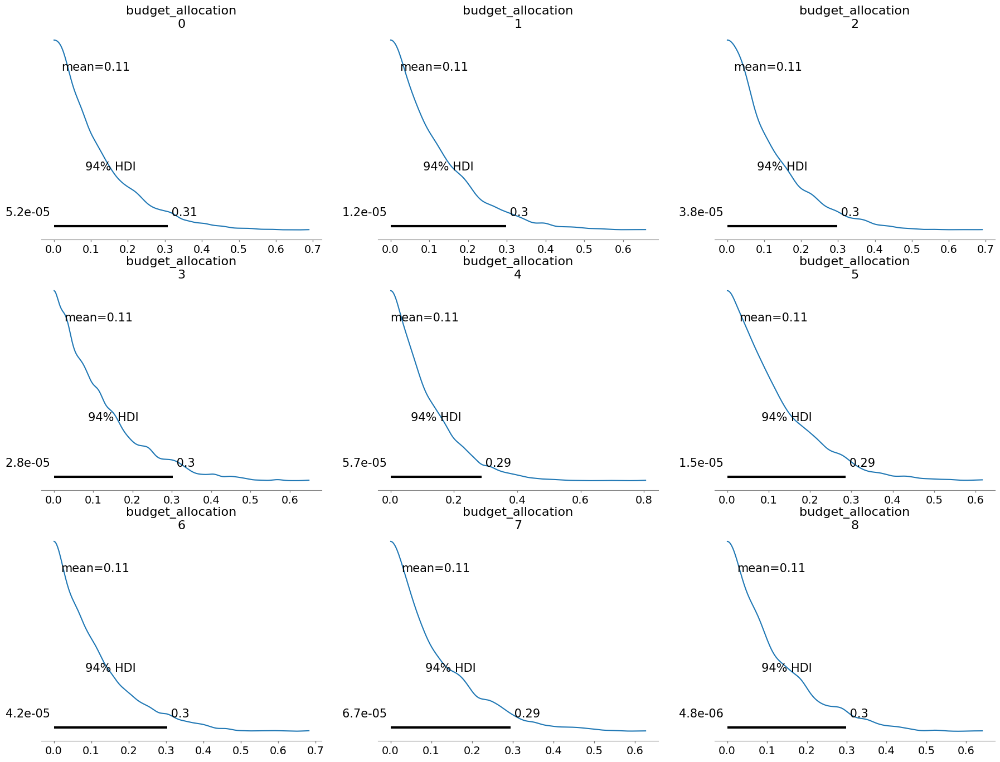

In [ ]:
# Given Data
import scipy.optimize as opt
from scipy.optimize import differential_evolution
final_df = pd.DataFrame() # Reinitialize final_df
for i in range(9):
    # Create a new column name for each budget allocation
    col_name = f'past_budget_alloc_{i}'
    # Sum the values for the current budget category and assign to the new column
    final_df[col_name] = [df_budget.iloc[:, 4 + i].sum()]

total_investment_yearly = df_budget['Total Investment'].sum()

# Access the values from the columns of final_df
current_budget = np.array(final_df.iloc[0].values / total_investment_yearly * 100)
current_revenue = df_budget['gmv'].sum()  # Current revenue in dollars
predicted_revenue = df_budget['pred_gmv'].sum()  # Predicted revenue for next year

# Normalize current budget allocation
current_budget = current_budget / np.sum(current_budget)

with pm.Model() as model:
    # Priors for budget allocation (Dirichlet distribution ensures sum = 1)
    budget_allocation = pm.Dirichlet("budget_allocation", a=np.ones(len(current_budget)))

    # Expected revenue function (linear model for simplicity)
    expected_revenue = predicted_revenue * pm.math.dot(budget_allocation, current_budget)

    # Likelihood: Revenue follows a normal distribution around the expected revenue
    observed_revenue = pm.Normal("observed_revenue", mu=expected_revenue, sigma=50000, observed=predicted_revenue)

    # Sampling
    trace = pm.sample(2000, return_inferencedata=True, cores=2)

# Bayesian Posterior Analysis
az.plot_posterior(trace, var_names=["budget_allocation"])

# Optimization Step: Find the optimal budget allocation maximizing revenue

def objective(budget):
    penalty = 1000 * abs(np.sum(budget) - 1)  # Large penalty for violating sum constraint
    return -np.sum(budget * current_budget) + 0.1 * np.sum(budget * np.log(budget + 1e-6)) + penalty

def constraint(budget):
    return np.sum(budget) - 1  # Budget proportions should sum to 1

bounds = [(0, 1) for _ in range(len(current_budget))]

# Using Differential Evolution for better optimization
result = differential_evolution(objective, bounds)

# Optimal budget allocation
optimal_budget = result.x * predicted_revenue
print("Optimal Budget Allocation for Next Year:", optimal_budget)
print("Optimal budget: ",optimal_budget.sum())

In [ ]:
final_df

,past_budget_alloc_0,past_budget_alloc_1,past_budget_alloc_2,past_budget_alloc_3,past_budget_alloc_4,past_budget_alloc_5,past_budget_alloc_6,past_budget_alloc_7,past_budget_alloc_8
0,29.660227,365.367769,8.027973,193.639614,61.369784,91.202143,4.67,48.022545,353.595482


In [ ]:
marketing_channels = ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
                      ' Affiliates', 'SEM', 'Radio', 'Other']

# Melt the DataFrame to transform it into a single column form
melted_df = pd.DataFrame({
    "Channel": marketing_channels,
    "past_budget_allocation": final_df.iloc[0, :],
    "future_budget_allocation": optimal_budget
})

melted_df = melted_df.reset_index(drop=True)

# Display the resulting DataFrame
print(melted_df)
print("Total investment in past year", total_investment_yearly)
print("Total investment in future year", optimal_budget.sum())

             Channel  past_budget_allocation  future_budget_allocation
0                 TV               29.660227                  3.216990
1            Digital              365.367769                183.453880
2        Sponsorship                8.027973                  7.989883
3  Content Marketing              193.639614                 39.353142
4   Online marketing               61.369784                 15.659670
5         Affiliates               91.202143                 13.512334
6                SEM                4.670000                  4.465768
7              Radio               48.022545                  6.761486
8              Other              353.595482                105.442490
Total investment in past year 846.5103701313128
Total investment in future year 379.85564228743726


#Target Product Categories for upcoming Campaigns

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## **Reading all the Necessary files**

In [ ]:
df_product = pd.read_csv('/content/SKU_details.csv', na_values="\\N")

In [ ]:
df_customers = pd.read_csv('/content/PreProcessed_13.03.2025 (1).csv')

In [ ]:
df_holiday = pd.read_csv('/content/holidays.csv')

In [ ]:
df_sales = pd.read_csv('/content/Sales_Calendar_NoMonth.csv')

In [ ]:
df_sku = pd.read_csv('/content/final_sku.csv')

### Checking shape and columns and head of different dataframes

In [ ]:
df_sku.shape

(1431794, 35)

In [ ]:
df_sku.columns

Index(['fsn_id', 'order_id', 'order_item_id', 'gmv', 'Units_Sold',
       'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla',
       'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', 'date',
       'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday', 'Order Hour',
       'total_delivery_days', 'list_price', 'Discount', 'product_type',
       'purchase_frequency', 'average_order_value', 'Sale_Period_Flag',
       'isPaydayWeek', 'isHolidayWeek', 'isHoliday',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'week_number'],
      dtype='object')

In [ ]:
df_sales.shape

(13, 3)

In [ ]:
df_sales.columns

Index(['Year', 'Start Date', 'End Date'], dtype='object')

In [ ]:
df_sales.head()

,Year,Start Date,End Date
0,2023,18-07-2023,19-07-2023
1,2023,15-08-2023,17-08-2023
2,2023,28-08-2023,30-08-2023
3,2023,15-10-2023,17-10-2023
4,2023,07-11-2023,14-11-2023


In [ ]:
df_sales.dtypes

,0
Year,int64
Start Date,object
End Date,object


In [ ]:
df_product.shape

(21219, 5)

In [ ]:
df_product.columns

Index(['fsn_id', 'product_analytic_super_category',
       'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical'],
      dtype='object')

In [ ]:
df_product.head()

,fsn_id,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical
0,ACCCX3S58G7B5F6P,CE,CameraAccessory,CameraAccessory,CameraTripod
1,ACCCX3S5AHMF55FV,CE,CameraAccessory,CameraAccessory,CameraTripod
2,ACCCX3S5JGAJETYR,CE,CameraAccessory,CameraAccessory,CameraTripod
3,ACCCX3SG2GG9YYAH,CE,CameraAccessory,CameraAccessory,Lens
4,ACCCX3SGAR6NNBMR,CE,CameraAccessory,CameraAccessory,Lens


In [ ]:
df_product.isna().sum()

,0
fsn_id,0
product_analytic_super_category,0
product_analytic_category,0
product_analytic_sub_category,0
product_analytic_vertical,52


In [ ]:
df_customers.shape

(1431794, 27)

In [ ]:
df_customers.columns

Index(['Unnamed: 0', 'fsn_id', 'order_id', 'order_item_id', 'gmv', 'units',
       'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla',
       'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', 'date',
       'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday', 'Order Hour',
       'total_delivery_days', 'list_price', 'discount_percentage',
       'product_type', 'purchase_frequency', 'average_order_value'],
      dtype='object')

In [ ]:
df_customers.head()

,Unnamed: 0,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,...,Month,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value
0,0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,...,10,2023,Tuesday,15,0.0,6400.0,10.987483,Luxury,1,6400.0
1,1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,...,10,2023,Thursday,10,0.0,6900.0,4.033380,Luxury,2,3450.0
2,2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,...,10,2023,Friday,15,0.0,1990.0,5.192949,Mass-market,1,1990.0
3,3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,...,10,2023,Saturday,12,0.0,1690.0,19.485469,Mass-market,1,1690.0
4,4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,...,10,2023,Tuesday,21,0.0,1618.0,22.915674,Mass-market,2,809.0


In [ ]:
df_holiday.head()

,Occasion,Date
0,Canada Day,01-07-2023
1,Civic Holiday,03-08-2023
2,Labour Day,07-09-2023
3,Thanksgiving,12-10-2023
4,Halloween,31-10-2023


### Checking the unique values of fsn_id in df_customers and df_products

In [ ]:
df_customers['fsn_id'].nunique()

20454

In [ ]:
df_product['fsn_id'].nunique()

21219

### Creating a dataframe df_unique_fsn where the number of rows of the original df_customers is reduced by grouping with fsn_id resulting in a dataframe where each row's fsn_id is different.

In [ ]:
df_unique_fsn = df_customers.groupby('fsn_id')['gmv'].sum().reset_index()

In [ ]:
df_unique_fsn.columns

Index(['fsn_id', 'gmv'], dtype='object')

In [ ]:
df_unique_fsn.head()

,fsn_id,gmv
0,ACCCX3S58G7B5F6P,33071.0
1,ACCCX3S59WDFY7GF,14793.0
2,ACCCX3S5AHMF55FV,27739.0
3,ACCCX3S5ENYZHHGM,2899.0
4,ACCCX3S5HGERUPBZ,5300.0


In [ ]:
df_unique_fsn.shape

(20454, 2)

Created three new columns for category, sub category and vertical of a product by mapping with fsn_id


In [ ]:
df_unique_fsn['product_analytic_category'] = df_unique_fsn['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_category'])
df_unique_fsn['product_analytic_sub_category'] = df_unique_fsn['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_sub_category'])
df_unique_fsn['product_analytic_vertical'] = df_unique_fsn['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_vertical'])


Added another column units to df_unique_fsn by grouping values from df_customers

In [ ]:
units = df_customers.groupby('fsn_id')['units'].sum()

df_unique_fsn = df_unique_fsn.merge(units, on='fsn_id', how='left')

df_unique_fsn = df_unique_fsn.rename(columns={'units': 'units'})

df_unique_fsn.head()

,fsn_id,gmv,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,units
0,ACCCX3S58G7B5F6P,33071.0,CameraAccessory,CameraAccessory,CameraTripod,5
1,ACCCX3S59WDFY7GF,14793.0,CameraAccessory,CameraAccessory,CameraTripod,6
2,ACCCX3S5AHMF55FV,27739.0,CameraAccessory,CameraAccessory,CameraTripod,17
3,ACCCX3S5ENYZHHGM,2899.0,CameraAccessory,CameraAccessory,CameraTripod,1
4,ACCCX3S5HGERUPBZ,5300.0,CameraAccessory,CameraAccessory,CameraTripod,1


In [ ]:
df_unique_fsn.head()

,fsn_id,gmv,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,units
0,ACCCX3S58G7B5F6P,33071.0,CameraAccessory,CameraAccessory,CameraTripod,5
1,ACCCX3S59WDFY7GF,14793.0,CameraAccessory,CameraAccessory,CameraTripod,6
2,ACCCX3S5AHMF55FV,27739.0,CameraAccessory,CameraAccessory,CameraTripod,17
3,ACCCX3S5ENYZHHGM,2899.0,CameraAccessory,CameraAccessory,CameraTripod,1
4,ACCCX3S5HGERUPBZ,5300.0,CameraAccessory,CameraAccessory,CameraTripod,1


### Created another dataframe gmv_by_sub_category by merging rows from df_unique_fsn subcategory wise

In [ ]:
gmv_by_sub_category = df_unique_fsn.groupby('product_analytic_sub_category')['gmv'].sum().reset_index()
units_by_sub_category = df_unique_fsn.groupby('product_analytic_sub_category')['units'].sum()
gmv_by_sub_category['units'] = gmv_by_sub_category['product_analytic_sub_category'].map(units_by_sub_category)

In [ ]:
gmv_by_sub_category.shape

(14, 3)

In [ ]:
gmv_by_sub_category.head()

,product_analytic_sub_category,gmv,units
0,AmplifierReceiver,6.148752e+06,3437
1,AudioAccessory,1.586986e+07,10530
2,AudioMP3Player,1.262906e+08,103220
3,Camera,1.548167e+09,86695
4,CameraAccessory,2.442420e+08,211570


### Created another dataframe gmv_by_category by merging rows on the basis of product_analytic_category

In [ ]:
gmv_by_category = df_unique_fsn.groupby('product_analytic_category')['gmv'].sum().reset_index()

units_by_category = df_unique_fsn.groupby('product_analytic_category')['units'].sum()
gmv_by_category['units'] = gmv_by_category['product_analytic_category'].map(units_by_category)

gmv_by_category.head()

,product_analytic_category,gmv,units
0,Camera,1.548167e+09,86695
1,CameraAccessory,2.589979e+08,228514
2,EntertainmentSmall,1.163520e+09,835530
3,GameCDDVD,1.763779e+08,95824
4,GamingHardware,3.888914e+08,213314


### Plotted graphs between product_analytic_sub_category vs gmv and units sold. Also plotted between product category vs gmv and units.

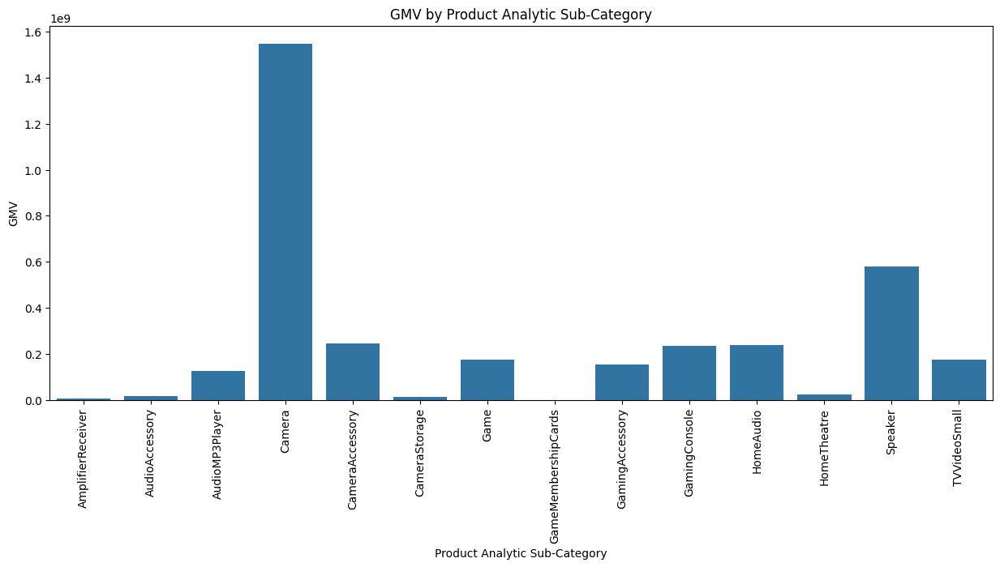

In [ ]:
plt.figure(figsize=(15, 6))
sns.barplot(x='product_analytic_sub_category', y='gmv', data=gmv_by_sub_category)
plt.xticks(rotation=90)
plt.title('GMV by Product Analytic Sub-Category')
plt.xlabel('Product Analytic Sub-Category')
plt.ylabel('GMV')
plt.show()


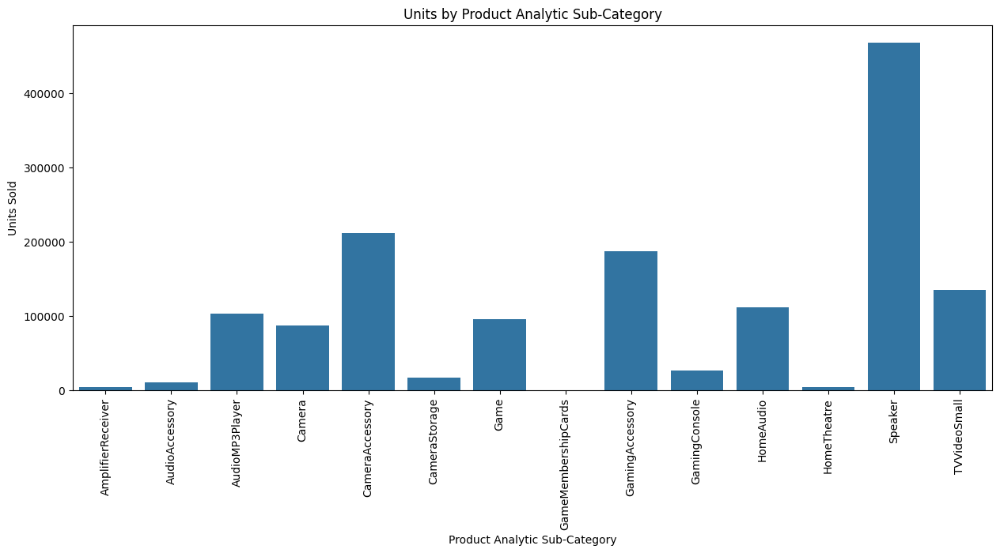

In [ ]:
plt.figure(figsize=(15, 6))
sns.barplot(x='product_analytic_sub_category', y='units', data=gmv_by_sub_category)
plt.xticks(rotation=90)
plt.title('Units by Product Analytic Sub-Category')
plt.xlabel('Product Analytic Sub-Category')
plt.ylabel('Units Sold')
plt.show()

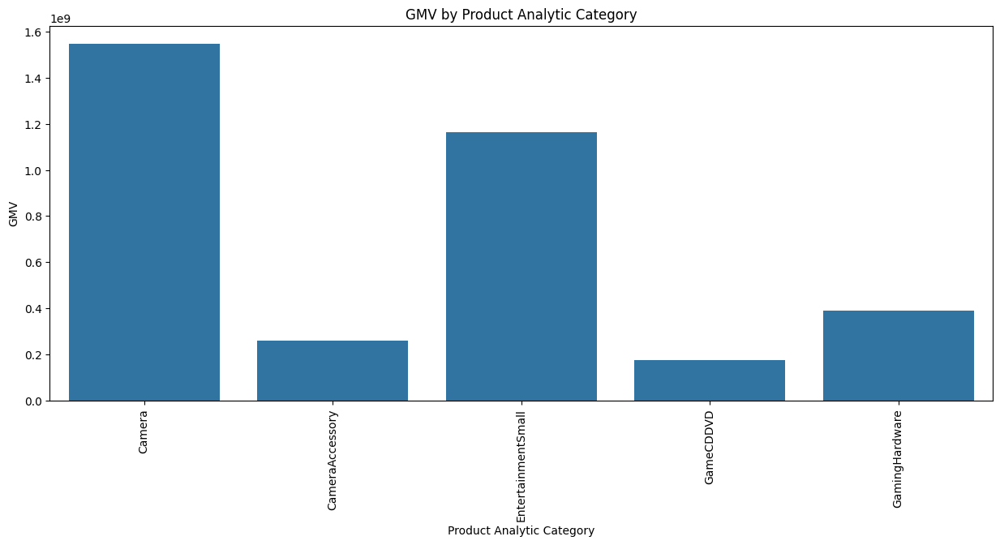

In [ ]:
plt.figure(figsize=(15, 6))
sns.barplot(x='product_analytic_category', y='gmv', data=gmv_by_category)
plt.xticks(rotation=90)
plt.title('GMV by Product Analytic Category')
plt.xlabel('Product Analytic Category')
plt.ylabel('GMV')
plt.show()

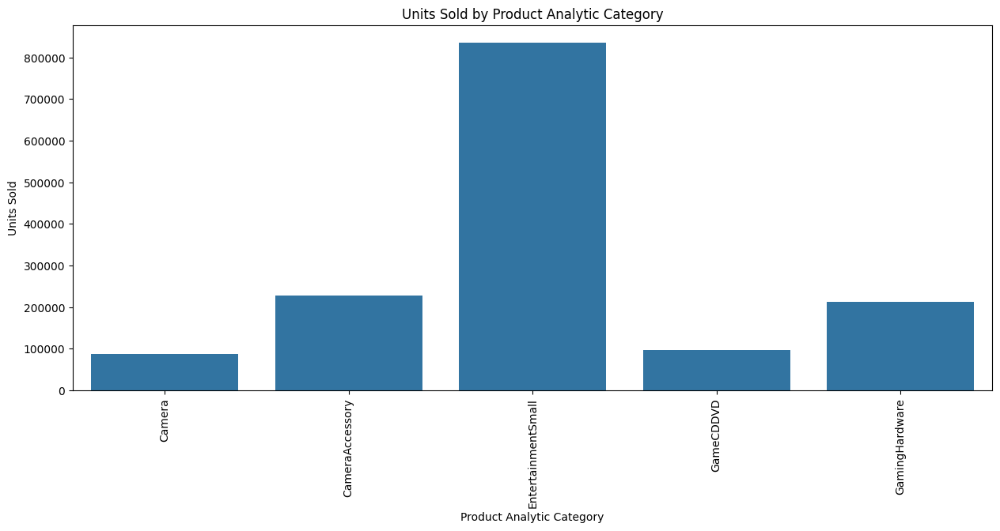

In [ ]:
plt.figure(figsize=(15, 6))
sns.barplot(x='product_analytic_category', y='units', data=gmv_by_category)
plt.xticks(rotation=90)
plt.title('Units Sold by Product Analytic Category')
plt.xlabel('Product Analytic Category')
plt.ylabel('Units Sold')
plt.show()

### Calculated total_revenue and total_purchases in the whole year to get percentages of contribution by each category of product to total revenue and Units sold

In [ ]:
total_revenue = gmv_by_category['gmv'].sum()
total_purchases = gmv_by_category['units'].sum()

In [ ]:
gmv_by_category['revenue_percentage'] = (gmv_by_category['gmv'] / total_revenue) * 100
gmv_by_category['units_percentage'] = (gmv_by_category['units'] / total_purchases) * 100

In [ ]:
gmv_by_category

,product_analytic_category,gmv,units,revenue_percentage,units_percentage
0,Camera,1.548167e+09,86695,43.783577,5.938514
1,CameraAccessory,2.589979e+08,228514,7.324695,15.652963
2,EntertainmentSmall,1.163520e+09,835530,32.905401,57.232904
3,GameCDDVD,1.763779e+08,95824,4.988128,6.563841
4,GamingHardware,3.888914e+08,213314,10.998200,14.611779


## Trying to find out which product to campain on specific holidays

In [ ]:
df_holiday['Date'] = df_holiday['Date'].str[:6] + df_holiday['Date'].str[8:]

In [ ]:
df_holiday.head()

,Occasion,Date
0,Canada Day,01-07-23
1,Civic Holiday,03-08-23
2,Labour Day,07-09-23
3,Thanksgiving,12-10-23
4,Halloween,31-10-23


In [ ]:
df_filtered_holidays = df_customers[df_customers['date'].isin(df_holiday['Date'])]
df_filtered_holidays.head()

,Unnamed: 0,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,...,Month,Year,Order Weekday,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value
54,55,ACCCX3SGAR6NNBMR,1.415007e+15,1.415007e+15,6565.0,1,0.0,0.0,COD,5,...,10,2023,Thursday,15,0.0,6565.0,8.181818,Luxury,1,6565.0
76,77,ACCCX3SGAR6NNBMR,1.415036e+15,1.415036e+15,6565.0,1,0.0,0.0,COD,5,...,10,2023,Thursday,16,0.0,6565.0,8.181818,Luxury,1,6565.0
107,109,ACCCX3SGAR6NNBMR,3.415095e+15,3.415095e+15,6565.0,1,0.0,0.0,Prepaid,6,...,10,2023,Thursday,18,0.0,6565.0,8.181818,Luxury,2,3282.5
111,113,ACCCX3SGAR6NNBMR,3.431241e+15,3.431241e+15,6589.0,1,0.0,0.0,COD,6,...,10,2023,Tuesday,10,0.0,6589.0,7.846154,Luxury,2,3294.5
117,119,ACCCX3SGDGPZAQXD,3.414907e+15,3.414907e+15,8923.0,1,0.0,0.0,Prepaid,7,...,10,2023,Thursday,13,0.0,8923.0,50.414004,Luxury,2,4461.5


In [ ]:
df_filtered_holidays.shape

(74287, 27)

### Created the columns for product category, sub category and vertical in the holidays dataframe

In [ ]:
df_filtered_holidays.loc[:, 'product_analytic_category'] = df_filtered_holidays['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_category'])
df_filtered_holidays.loc[:, 'product_analytic_sub_category'] = df_filtered_holidays['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_sub_category'])
df_filtered_holidays.loc[:, 'product_analytic_vertical'] = df_filtered_holidays['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_vertical'])


<ipython-input-48-de0f848eb355>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_holidays.loc[:, 'product_analytic_category'] = df_filtered_holidays['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_category'])
<ipython-input-48-de0f848eb355>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_holidays.loc[:, 'product_analytic_sub_category'] = df_filtered_holidays['fsn_id'].map(df_product.set_index('fsn_id')['product_analytic_sub_category'])
<ipython-input-48-de0f848eb355>:

In [ ]:
df_filtered_holidays.head()

,Unnamed: 0,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,...,Order Hour,total_delivery_days,list_price,discount_percentage,product_type,purchase_frequency,average_order_value,product_analytic_category,product_analytic_sub_category,product_analytic_vertical
54,55,ACCCX3SGAR6NNBMR,1.415007e+15,1.415007e+15,6565.0,1,0.0,0.0,COD,5,...,15,0.0,6565.0,8.181818,Luxury,1,6565.0,CameraAccessory,CameraAccessory,Lens
76,77,ACCCX3SGAR6NNBMR,1.415036e+15,1.415036e+15,6565.0,1,0.0,0.0,COD,5,...,16,0.0,6565.0,8.181818,Luxury,1,6565.0,CameraAccessory,CameraAccessory,Lens
107,109,ACCCX3SGAR6NNBMR,3.415095e+15,3.415095e+15,6565.0,1,0.0,0.0,Prepaid,6,...,18,0.0,6565.0,8.181818,Luxury,2,3282.5,CameraAccessory,CameraAccessory,Lens
111,113,ACCCX3SGAR6NNBMR,3.431241e+15,3.431241e+15,6589.0,1,0.0,0.0,COD,6,...,10,0.0,6589.0,7.846154,Luxury,2,3294.5,CameraAccessory,CameraAccessory,Lens
117,119,ACCCX3SGDGPZAQXD,3.414907e+15,3.414907e+15,8923.0,1,0.0,0.0,Prepaid,7,...,13,0.0,8923.0,50.414004,Luxury,2,4461.5,CameraAccessory,CameraAccessory,Lens


### Found out in which holiday which product category contributed how much to total revenue and total units sold

In [ ]:
df_holiday_campaign = df_filtered_holidays.pivot_table(
    index='date',
    columns='product_analytic_category',
    values=['gmv', 'units'],
    aggfunc='sum'
).reset_index()

df_holiday_campaign.columns = ['date'] + [f'{col[0]}_{col[1]}' for col in df_holiday_campaign.columns[1:]]

df_holiday_campaign.head()

,date,gmv_Camera,gmv_CameraAccessory,gmv_EntertainmentSmall,gmv_GameCDDVD,gmv_GamingHardware,units_Camera,units_CameraAccessory,units_EntertainmentSmall,units_GameCDDVD,units_GamingHardware
0,01-01-24,4024393.0,751271.0,3359707.0,448587.0,1336008.0,206.0,596.0,2679.0,214.0,663.0
1,01-07-23,NaN,299.0,15037.0,2599.0,2812.0,NaN,1.0,24.0,2.0,3.0
2,03-08-23,NaN,NaN,2728.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN
3,07-09-23,1772750.0,762126.0,2985925.0,310794.0,568469.0,146.0,613.0,1828.0,158.0,437.0
4,11-11-23,5527276.0,596910.0,3713527.0,566160.0,524459.0,279.0,688.0,3146.0,231.0,528.0


In [ ]:
df_holiday_campaign.shape

(20, 11)

In [ ]:
df_holiday_campaign = df_holiday_campaign.fillna(0)
df_holiday_campaign.head()

,date,gmv_Camera,gmv_CameraAccessory,gmv_EntertainmentSmall,gmv_GameCDDVD,gmv_GamingHardware,units_Camera,units_CameraAccessory,units_EntertainmentSmall,units_GameCDDVD,units_GamingHardware
0,01-01-24,4024393.0,751271.0,3359707.0,448587.0,1336008.0,206.0,596.0,2679.0,214.0,663.0
1,01-07-23,0.0,299.0,15037.0,2599.0,2812.0,0.0,1.0,24.0,2.0,3.0
2,03-08-23,0.0,0.0,2728.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
3,07-09-23,1772750.0,762126.0,2985925.0,310794.0,568469.0,146.0,613.0,1828.0,158.0,437.0
4,11-11-23,5527276.0,596910.0,3713527.0,566160.0,524459.0,279.0,688.0,3146.0,231.0,528.0


In [ ]:
for index, row in df_holiday_campaign.iterrows():
    total_gmv = row['gmv_Camera'] + row['gmv_CameraAccessory'] + row['gmv_EntertainmentSmall'] + row['gmv_GameCDDVD'] + row['gmv_GamingHardware']
    if total_gmv != 0:  # Avoid division by zero
        df_holiday_campaign.loc[index, 'gmv_camera_percentage'] = (row['gmv_Camera'] / total_gmv) * 100
        df_holiday_campaign.loc[index, 'gmv_Accessory_percentage'] = (row['gmv_CameraAccessory'] / total_gmv) * 100
        df_holiday_campaign.loc[index, 'gmv_EntertainmentSmall_percentage'] = (row['gmv_EntertainmentSmall'] / total_gmv) * 100  # Fixed column name
        df_holiday_campaign.loc[index, 'gmv_GameCDDVD_percentage'] = (row['gmv_GameCDDVD'] / total_gmv) * 100
        df_holiday_campaign.loc[index, 'gmv_GamingHardware_percentage'] = (row['gmv_GamingHardware'] / total_gmv) * 100
    else:
        # Handle cases where total_gmv is zero, e.g., set percentages to 0
        df_holiday_campaign.loc[index, ['gmv_camera_percentage', 'gmv_Accessory_percentage', 'gmv_EntertainmentSmall', 'gmv_GameCDDVD', 'gmv_GamingHardware']] = 0

In [ ]:
for index, row in df_holiday_campaign.iterrows():
    total_gmv = row['units_Camera'] + row['units_CameraAccessory'] + row['units_EntertainmentSmall'] + row['units_GameCDDVD'] + row['units_GamingHardware']
    if total_gmv != 0:  # Avoid division by zero
        df_holiday_campaign.loc[index, 'purchase_cam_percentage'] = (row['units_Camera'] / total_gmv) * 100
        df_holiday_campaign.loc[index, 'purchase_camAcc_percentage'] = (row['units_CameraAccessory'] / total_gmv) * 100
        df_holiday_campaign.loc[index, 'purchase_enter_percentage'] = (row['units_EntertainmentSmall'] / total_gmv) * 100  # Fixed column name
        df_holiday_campaign.loc[index, 'purchase_game_percentage'] = (row['units_GameCDDVD'] / total_gmv) * 100
        df_holiday_campaign.loc[index, 'purchase_gamingHardware_percentage'] = (row['units_GamingHardware'] / total_gmv) * 100
    else:
        # Handle cases where total_gmv is zero, e.g., set percentages to 0
        df_holiday_campaign.loc[index, ['purchase_cam_percentage', 'purchase_camAcc_percentage', 'purchase_enter_percentage', 'purchase_game_percentage', 'purchase_gamingHardware_percentage']] = 0

In [ ]:
df_holiday_campaign.shape

(20, 21)

In [ ]:
df_holiday_campaign.head()

,date,gmv_Camera,gmv_CameraAccessory,gmv_EntertainmentSmall,gmv_GameCDDVD,gmv_GamingHardware,units_Camera,units_CameraAccessory,units_EntertainmentSmall,units_GameCDDVD,...,gmv_camera_percentage,gmv_Accessory_percentage,gmv_EntertainmentSmall_percentage,gmv_GameCDDVD_percentage,gmv_GamingHardware_percentage,purchase_cam_percentage,purchase_camAcc_percentage,purchase_enter_percentage,purchase_game_percentage,purchase_gamingHardware_percentage
0,01-01-24,4024393.0,751271.0,3359707.0,448587.0,1336008.0,206.0,596.0,2679.0,214.0,...,40.568617,7.573322,33.868130,4.522062,13.467869,4.726939,13.675998,61.473153,4.910509,15.213401
1,01-07-23,0.0,299.0,15037.0,2599.0,2812.0,0.0,1.0,24.0,2.0,...,0.000000,1.441172,72.477949,12.527112,13.553767,0.000000,3.333333,80.000000,6.666667,10.000000
2,03-08-23,0.0,0.0,2728.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000
3,07-09-23,1772750.0,762126.0,2985925.0,310794.0,568469.0,146.0,613.0,1828.0,158.0,...,27.698942,11.908100,46.654612,4.856108,8.882239,4.588309,19.264613,57.448146,4.965431,13.733501
4,11-11-23,5527276.0,596910.0,3713527.0,566160.0,524459.0,279.0,688.0,3146.0,231.0,...,50.577490,5.462041,33.980730,5.180663,4.799076,5.726601,14.121511,64.573071,4.741379,10.837438


In [ ]:
df_holiday_campaign = df_holiday_campaign.drop(columns = ['gmv_Camera', 'gmv_CameraAccessory', 'gmv_EntertainmentSmall', 'gmv_GameCDDVD', 'gmv_GamingHardware', 'units_Camera', 'units_CameraAccessory', 'units_EntertainmentSmall', 'units_GameCDDVD', 'units_GamingHardware'])

In [ ]:
df_holiday_campaign.shape

(20, 11)

In [ ]:
df_holiday_campaign.head()

,date,gmv_camera_percentage,gmv_Accessory_percentage,gmv_EntertainmentSmall_percentage,gmv_GameCDDVD_percentage,gmv_GamingHardware_percentage,purchase_cam_percentage,purchase_camAcc_percentage,purchase_enter_percentage,purchase_game_percentage,purchase_gamingHardware_percentage
0,01-01-24,40.568617,7.573322,33.868130,4.522062,13.467869,4.726939,13.675998,61.473153,4.910509,15.213401
1,01-07-23,0.000000,1.441172,72.477949,12.527112,13.553767,0.000000,3.333333,80.000000,6.666667,10.000000
2,03-08-23,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000
3,07-09-23,27.698942,11.908100,46.654612,4.856108,8.882239,4.588309,19.264613,57.448146,4.965431,13.733501
4,11-11-23,50.577490,5.462041,33.980730,5.180663,4.799076,5.726601,14.121511,64.573071,4.741379,10.837438


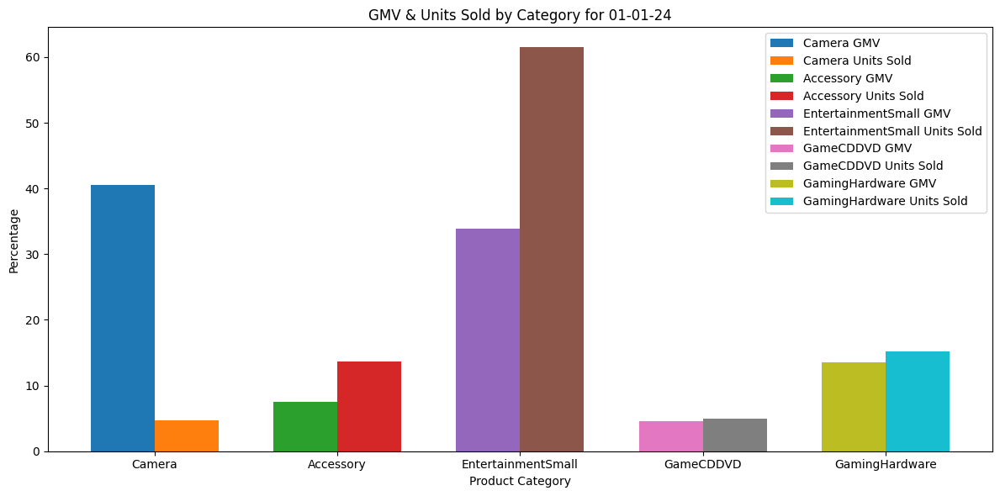

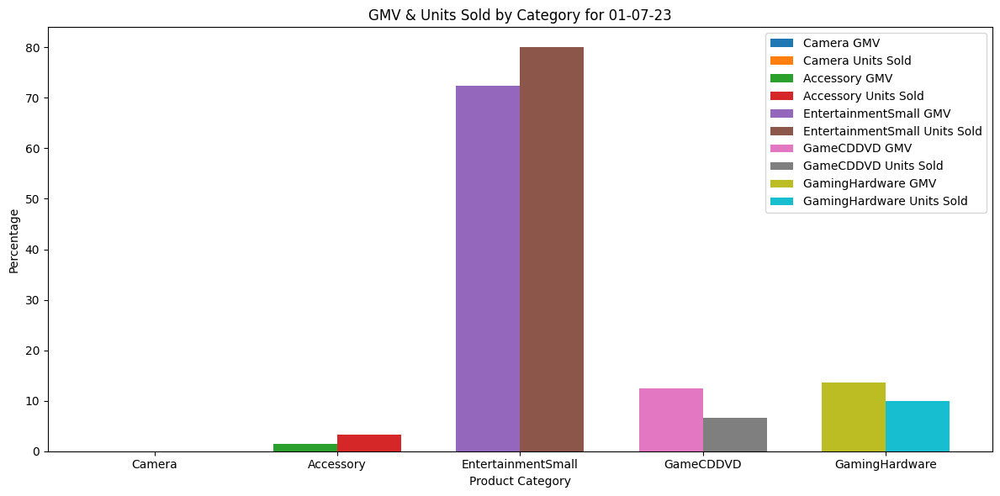

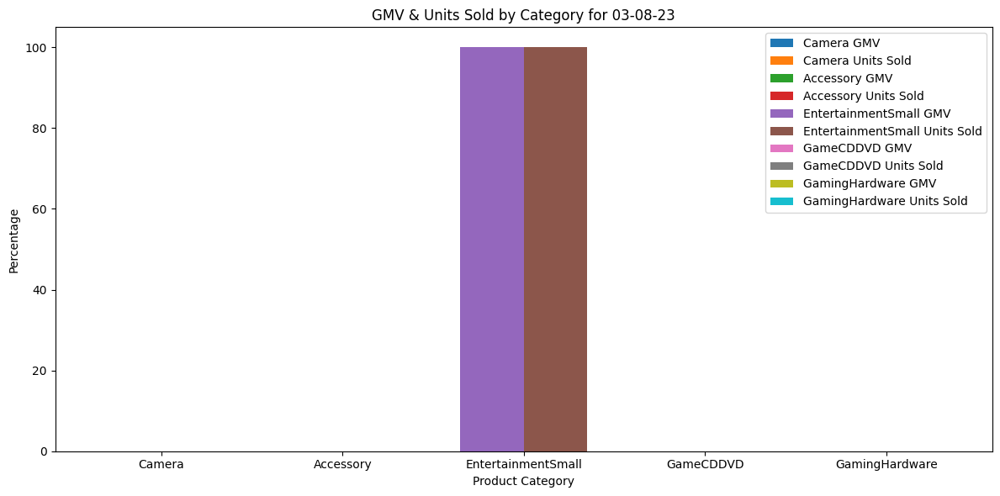

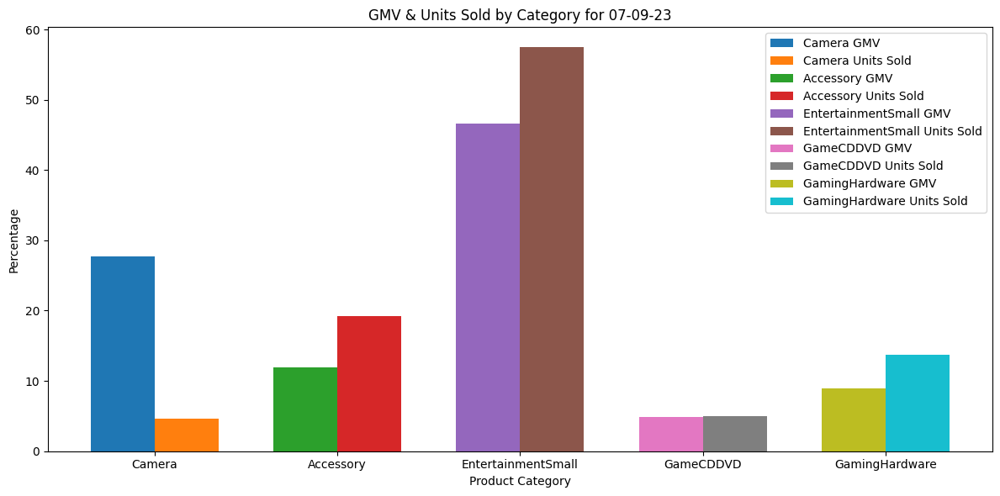

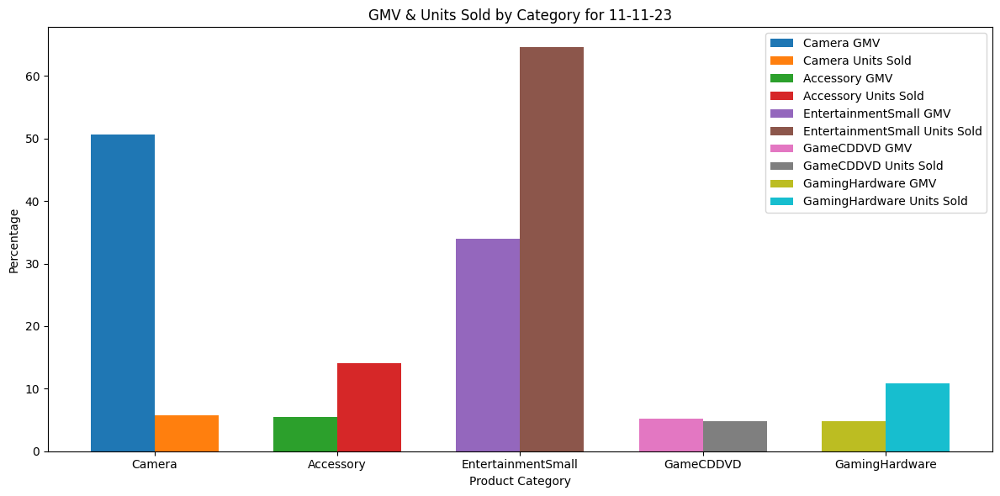

...

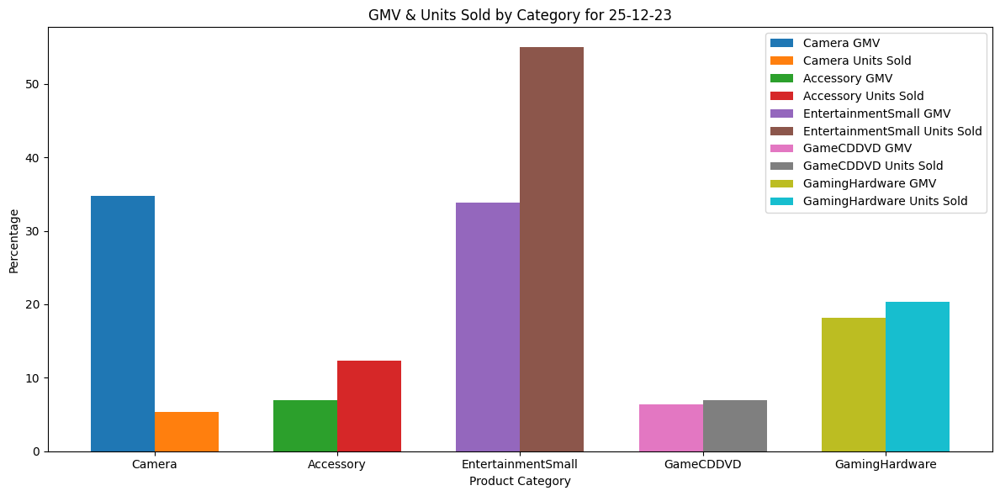

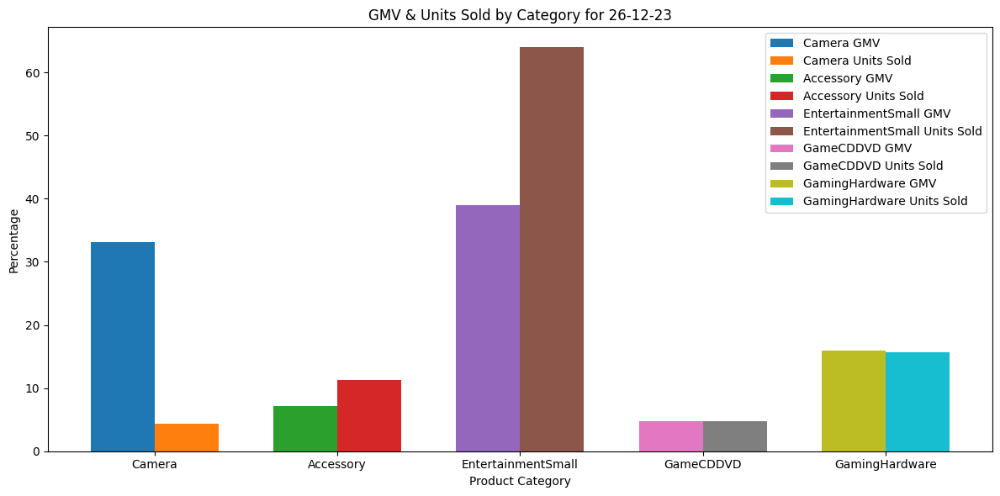

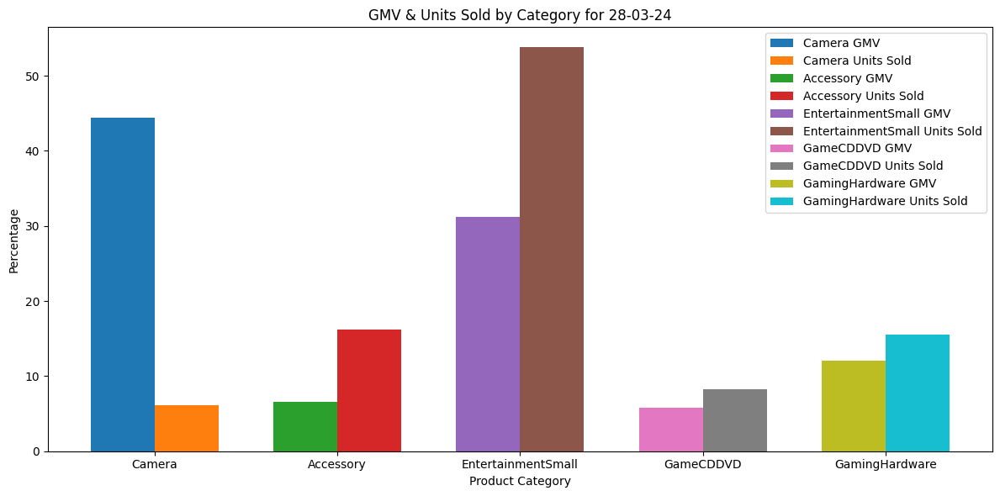

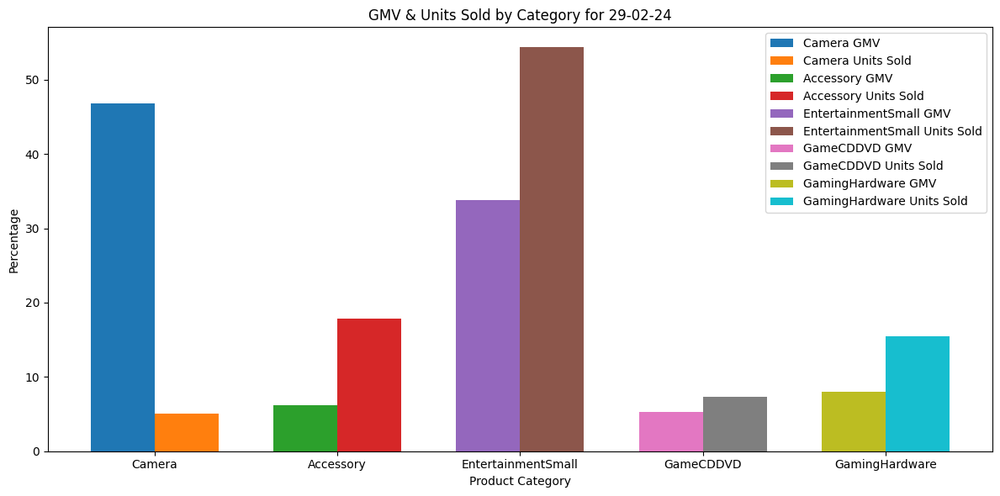

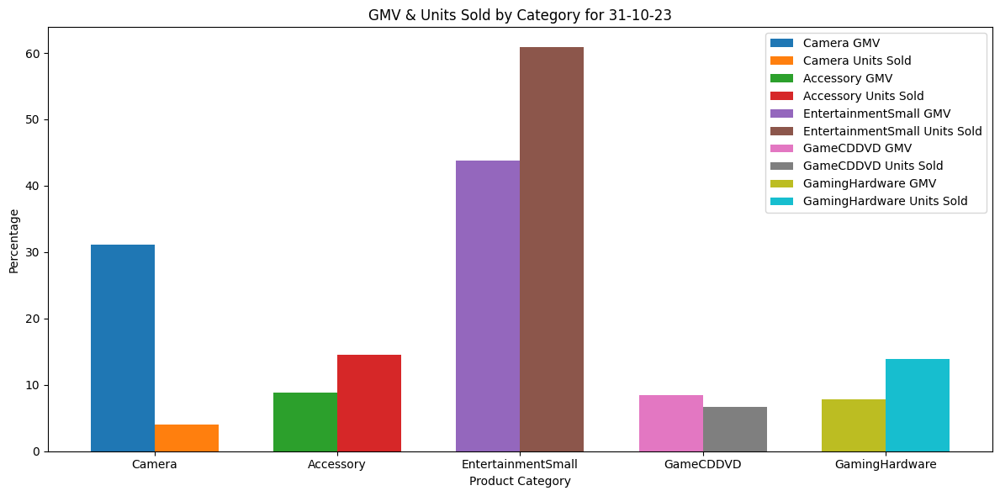

In [ ]:
dates = df_holiday_campaign['date'].unique()

# Loop through each date and create a plot
for date in dates:
    # Filter the DataFrame for the current date
    df_date = df_holiday_campaign[df_holiday_campaign['date'] == date]

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(12, 6))

    product_categories = ['Camera', 'Accessory', 'EntertainmentSmall', 'GameCDDVD', 'GamingHardware']
    gmv_columns = ['gmv_camera_percentage', 'gmv_Accessory_percentage', 'gmv_EntertainmentSmall_percentage',
                   'gmv_GameCDDVD_percentage', 'gmv_GamingHardware_percentage']
    purchase_columns = ['purchase_cam_percentage', 'purchase_camAcc_percentage', 'purchase_enter_percentage',
                       'purchase_game_percentage', 'purchase_gamingHardware_percentage']

    # Define bar width and x-axis positions
    bar_width = 0.35
    x_positions = range(len(product_categories))

    for i, category in enumerate(product_categories):
        ax.bar(x_positions[i] - bar_width / 2, df_date[gmv_columns[i]].values[0], width=bar_width, label=f'{category} GMV')
        ax.bar(x_positions[i] + bar_width / 2, df_date[purchase_columns[i]].values[0], width=bar_width, label=f'{category} Units Sold')

    # Customize the plot
    ax.set_title(f'GMV & Units Sold by Category for {date}')
    ax.set_xlabel('Product Category')
    ax.set_ylabel('Percentage')
    ax.set_xticks(x_positions)
    ax.set_xticklabels(product_categories)
    ax.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()


In [ ]:
df_sales.columns

Index(['Year', 'Start Date', 'End Date'], dtype='object')

In [ ]:
df_sku['date'] = pd.to_datetime(df_sku['date'])
df_sales['Start Date'] = pd.to_datetime(df_sales['Start Date'])
df_sales['End Date'] = pd.to_datetime(df_sales['End Date'])

<ipython-input-62-582bc1b2838a>:2: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sales['Start Date'] = pd.to_datetime(df_sales['Start Date'])
<ipython-input-62-582bc1b2838a>:3: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sales['End Date'] = pd.to_datetime(df_sales['End Date'])


In [ ]:
unique_categories = df_sku['product_analytic_category'].unique()  # Select first five unique values

sales_period_data = []

for _, row in df_sales.iterrows():
    start_date, end_date = row['Start Date'], row['End Date']

    df_filtered = df_sku[(df_sku['date'] >= start_date) & (df_sku['date'] <= end_date)]

    sales_period_summary = {
        'Start Date': start_date,
        'End Date': end_date
    }

    for cat in unique_categories:
        gmv_col = f'gmv_{cat}'
        freq_col = f'units_{cat}'

        sales_period_summary[f'gmv_sum_{cat}'] = df_filtered[df_filtered['product_analytic_category'] == cat]['gmv'].sum()
        sales_period_summary[f'units_sum_{cat}'] = df_filtered[df_filtered['product_analytic_category'] == cat]['Units_Sold'].sum()

    sales_period_data.append(sales_period_summary)

df_sales_summary = pd.DataFrame(sales_period_data)

df_sales = df_sales.merge(df_sales_summary, on=['Start Date', 'End Date'], how='left')

In [ ]:
df_sales.head()

,Year,Start Date,End Date,gmv_sum_CameraAccessory,units_sum_CameraAccessory,gmv_sum_GamingHardware,units_sum_GamingHardware,gmv_sum_EntertainmentSmall,units_sum_EntertainmentSmall,gmv_sum_GameCDDVD,units_sum_GameCDDVD,gmv_sum_Camera,units_sum_Camera
0,2023,2023-07-18,2023-07-19,1.194484e+06,954,1.234020e+06,840,6.148413e+06,3934,8.732360e+05,459,2.854224e+06,235
1,2023,2023-08-15,2023-08-17,2.990000e+02,1,0.000000e+00,0,2.529000e+03,2,0.000000e+00,0,0.000000e+00,0
2,2023,2023-08-28,2023-08-30,1.380000e+02,1,2.049000e+03,3,3.305000e+03,2,0.000000e+00,0,2.450000e+04,1
3,2023,2023-10-15,2023-10-17,9.723014e+06,8313,1.096494e+07,9808,7.724141e+07,52360,5.187420e+06,2958,1.316196e+08,7988
4,2023,2023-11-07,2023-11-14,6.981536e+06,5941,1.428527e+07,4997,3.100359e+07,22552,6.094036e+06,2726,9.553580e+07,4603


In [ ]:
for index, row in df_sales.iterrows():
    total_gmv = row['gmv_sum_CameraAccessory'] + row['gmv_sum_Camera'] + row['gmv_sum_EntertainmentSmall'] + row['gmv_sum_GameCDDVD'] + row['gmv_sum_GamingHardware']
    if total_gmv != 0:  # Avoid division by zero
        df_sales.loc[index, 'gmv_camera_percentage'] = (row['gmv_sum_Camera'] / total_gmv) * 100
        df_sales.loc[index, 'gmv_Accessory_percentage'] = (row['gmv_sum_CameraAccessory'] / total_gmv) * 100
        df_sales.loc[index, 'gmv_EntertainmentSmall_percentage'] = (row['gmv_sum_EntertainmentSmall'] / total_gmv) * 100  # Fixed column name
        df_sales.loc[index, 'gmv_GameCDDVD_percentage'] = (row['gmv_sum_GameCDDVD'] / total_gmv) * 100
        df_sales.loc[index, 'gmv_GamingHardware_percentage'] = (row['gmv_sum_GamingHardware'] / total_gmv) * 100
    else:
        # Handle cases where total_gmv is zero, e.g., set percentages to 0
        df_sales.loc[index, ['gmv_camera_percentage', 'gmv_Accessory_percentage', 'gmv_EntertainmentSmall', 'gmv_GameCDDVD', 'gmv_GamingHardware']] = 0

In [ ]:
for index, row in df_sales.iterrows():
    total_gmv = row['units_sum_Camera'] + row['units_sum_CameraAccessory'] + row['units_sum_EntertainmentSmall'] + row['units_sum_GameCDDVD'] + row['units_sum_GamingHardware']
    if total_gmv != 0:  # Avoid division by zero
        df_sales.loc[index, 'purchase_cam_percentage'] = (row['units_sum_Camera'] / total_gmv) * 100
        df_sales.loc[index, 'purchase_CameraAccessory_percentage'] = (row['units_sum_CameraAccessory'] / total_gmv) * 100
        df_sales.loc[index, 'purchase_enter_percentage'] = (row['units_sum_EntertainmentSmall'] / total_gmv) * 100  # Fixed column name
        df_sales.loc[index, 'purchase_game_percentage'] = (row['units_sum_GameCDDVD'] / total_gmv) * 100
        df_sales.loc[index, 'purchase_gamingHardware_percentage'] = (row['units_sum_GamingHardware'] / total_gmv) * 100
    else:
        # Handle cases where total_gmv is zero, e.g., set percentages to 0
        df_sales.loc[index, ['purchase_cam_percentage', 'purchase_camAcc_percentage', 'purchase_enter_percentage', 'purchase_game_percentage', 'purchase_gamingHardware_percentage']] = 0

In [ ]:
df_sales = df_sales.drop(columns = ['gmv_sum_Camera', 'gmv_sum_CameraAccessory', 'gmv_sum_EntertainmentSmall', 'gmv_sum_GameCDDVD', 'gmv_sum_GamingHardware', 'units_sum_Camera', 'units_sum_CameraAccessory', 'units_sum_EntertainmentSmall', 'units_sum_GameCDDVD', 'units_sum_GamingHardware'])

In [ ]:
df_sales.head()

,Year,Start Date,End Date,gmv_camera_percentage,gmv_Accessory_percentage,gmv_EntertainmentSmall_percentage,gmv_GameCDDVD_percentage,gmv_GamingHardware_percentage,purchase_cam_percentage,purchase_CameraAccessory_percentage,purchase_enter_percentage,purchase_game_percentage,purchase_gamingHardware_percentage
0,2023,2023-07-18,2023-07-19,23.196818,9.707797,49.969314,7.096954,10.029117,3.659296,14.855185,61.258175,7.147306,13.080037
1,2023,2023-08-15,2023-08-17,0.000000,10.572843,89.427157,0.000000,0.000000,0.000000,33.333333,66.666667,0.000000,0.000000
2,2023,2023-08-28,2023-08-30,81.688450,0.460123,11.019605,0.000000,6.831822,14.285714,14.285714,28.571429,0.000000,42.857143
3,2023,2023-10-15,2023-10-17,56.071244,4.142099,32.905595,2.209891,4.671171,9.810014,10.209144,64.302995,3.632702,12.045145
4,2023,2023-11-07,2023-11-14,62.076449,4.536404,20.145254,3.959732,9.282162,11.276611,14.554497,55.248781,6.678263,12.241848


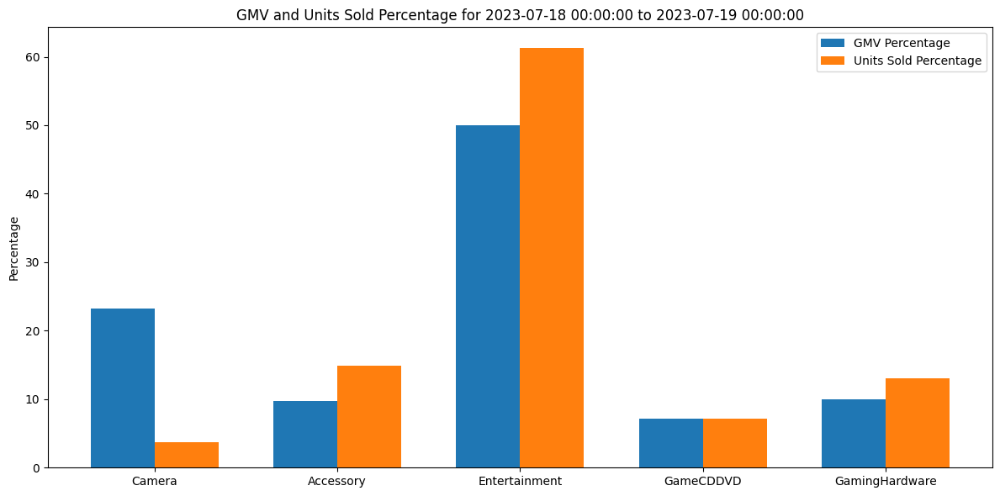

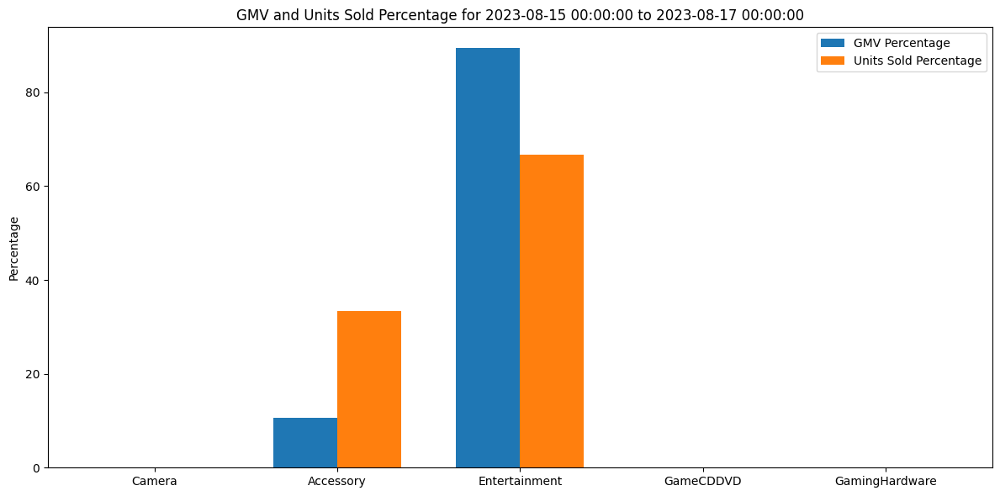

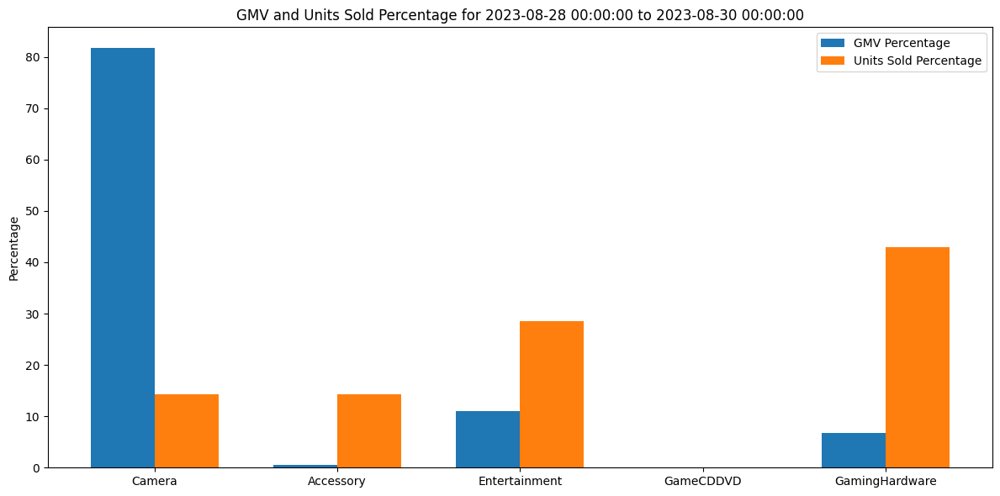

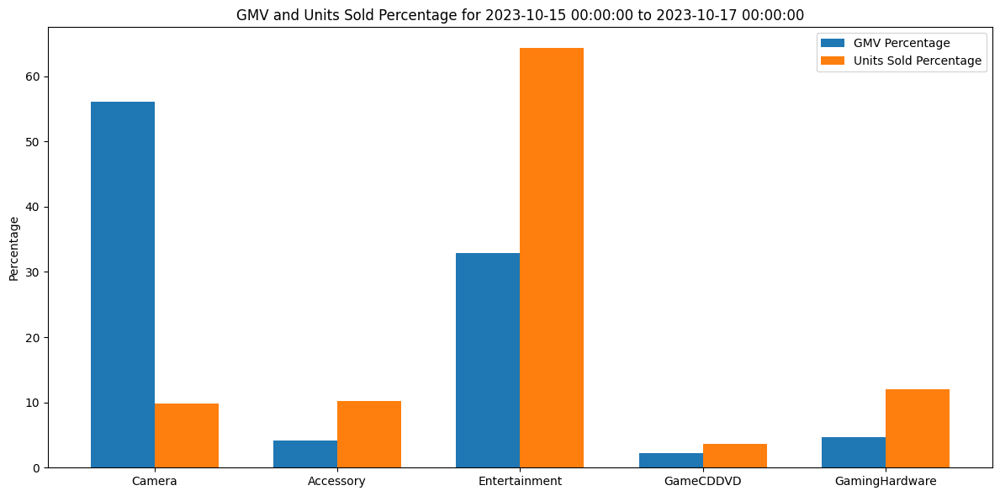

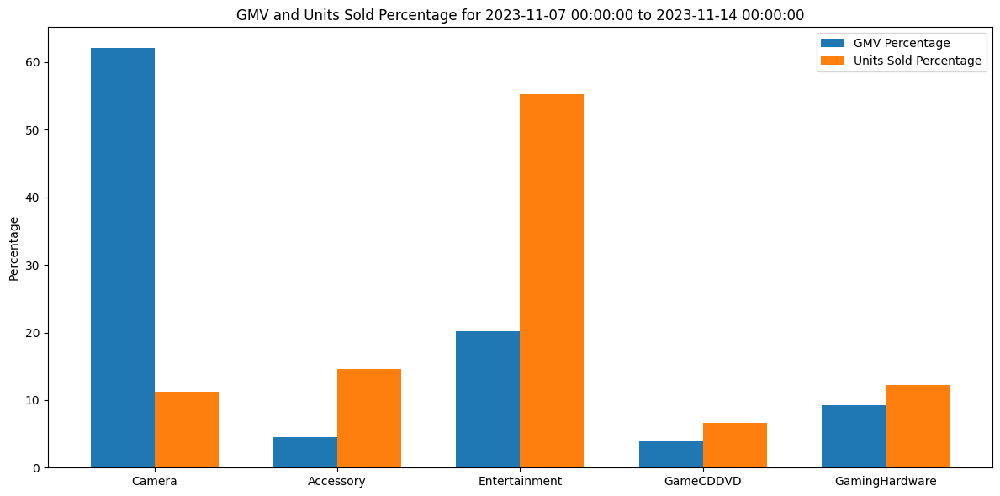

...

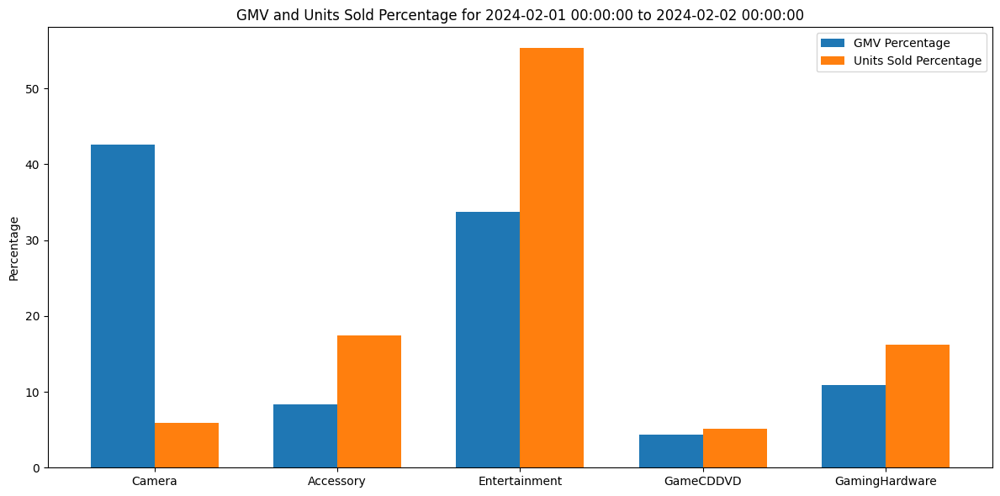

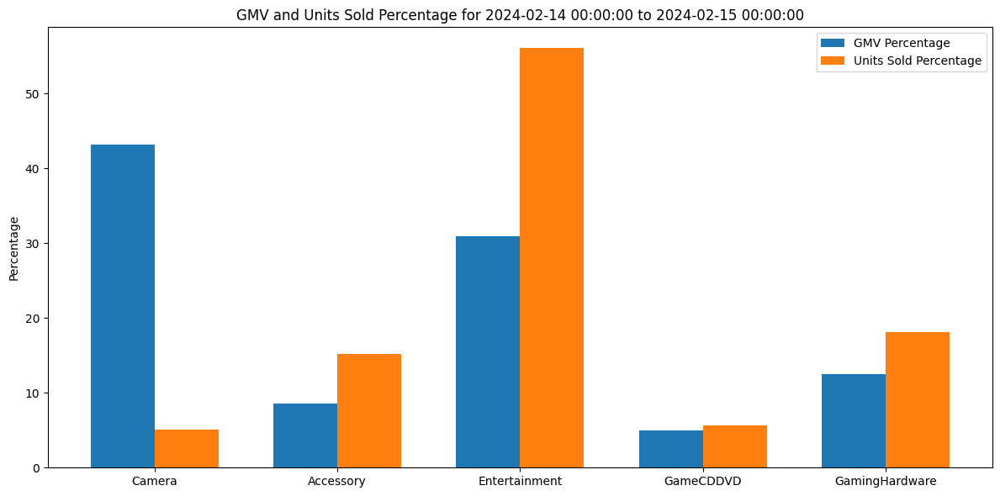

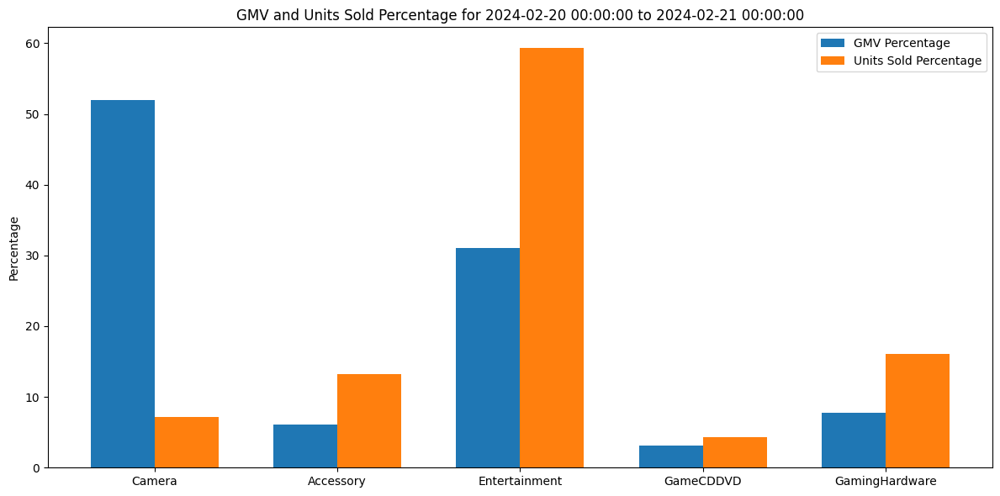

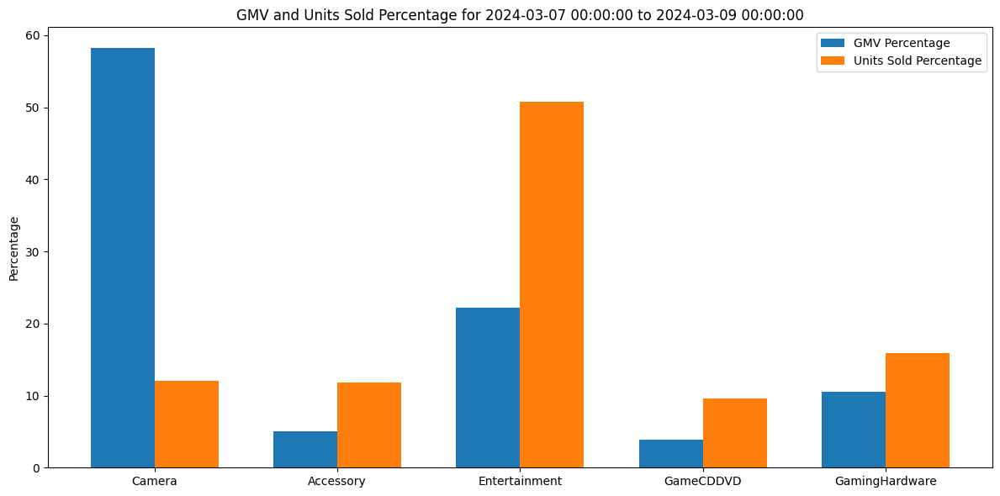

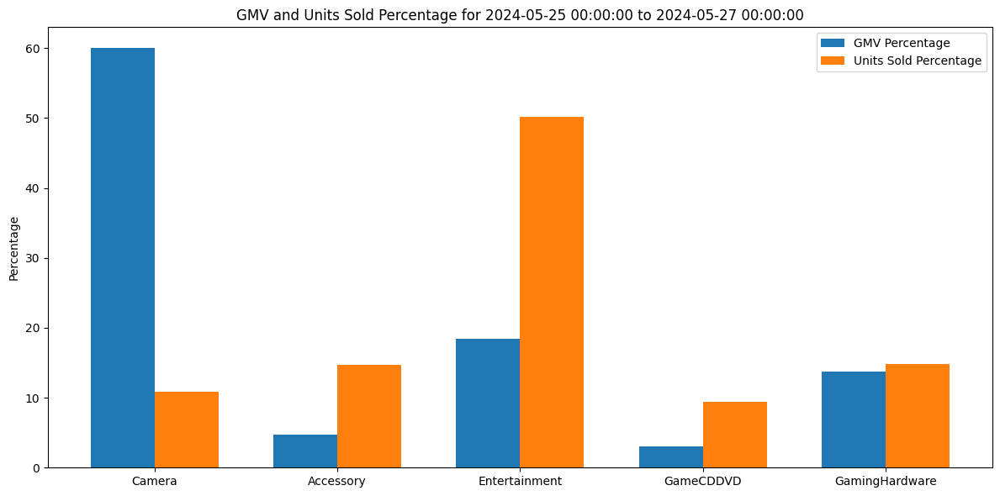

In [ ]:
for index, row in df_sales.iterrows():
    # Extract GMV percentages
    gmv_percentages = [
        row['gmv_camera_percentage'],
        row['gmv_Accessory_percentage'],
        row['gmv_EntertainmentSmall_percentage'],
        row['gmv_GameCDDVD_percentage'],
        row['gmv_GamingHardware_percentage']
    ]

    # Extract purchase frequency percentages
    purchase_percentages = [
        row['purchase_cam_percentage'],
        row['purchase_CameraAccessory_percentage'],
        row['purchase_enter_percentage'],
        row['purchase_game_percentage'],
        row['purchase_gamingHardware_percentage']
    ]

    categories = ["Camera", "Accessory", "Entertainment", "GameCDDVD", "GamingHardware"]

    # Create the bar chart
    fig, ax = plt.subplots(figsize=(12, 6))  # Adjust figure size as needed

    width = 0.35  # Adjust bar width as needed

    x = np.arange(len(categories))

    rects1 = ax.bar(x - width / 2, gmv_percentages, width, label='GMV Percentage')
    rects2 = ax.bar(x + width / 2, purchase_percentages, width, label='Units Sold Percentage')


    ax.set_ylabel('Percentage')
    ax.set_title(f"GMV and Units Sold Percentage for {row['Start Date']} to {row['End Date']}")
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend()

    fig.tight_layout()
    plt.show()



# Optimal Marketing Channel Allocation for Each Product Category and its Rationale

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df_media=pd.read_csv("/content/df_media_fixed.csv")

In [ ]:
orders_sku=pd.read_csv("/content/final_sku.csv")

In [ ]:
df_media.columns

Index(['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online Marketing', 'Affiliates', 'SEM', 'Radio',
       'Other', 'Date', 'Monthly_revenue', 'Spending_Category',
       'marketing_efficiency_score', 'ROI (%)'],
      dtype='object')

In [ ]:
orders_sku.columns

Index(['fsn_id', 'order_id', 'order_item_id', 'gmv', 'Units_Sold',
       'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla',
       'cust_id', 'pincode', 'product_mrp', 'product_procurement_sla', 'date',
       'time', 'Order_Combo', 'Month', 'Year', 'Order Weekday', 'Order Hour',
       'total_delivery_days', 'list_price', 'Discount', 'product_type',
       'purchase_frequency', 'average_order_value', 'Sale_Period_Flag',
       'isPaydayWeek', 'isHolidayWeek', 'isHoliday',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'week_number'],
      dtype='object')

In [ ]:
orders_sku.rename(columns={'Units_Sold':'units'},inplace=True)

In [ ]:
num_unique2= orders_sku['product_analytic_category'].nunique('product_analytic_category')
print(num_unique2)

num_unique3= orders_sku['product_analytic_sub_category'].nunique('product_analytic_sub_category')
print(num_unique3)

num_unique4= orders_sku['product_analytic_vertical'].nunique('product_analytic_vertical')
print(num_unique4)

5
14
73


In [ ]:
orders_sku.drop(columns=['product_analytic_super_category'],inplace=True)

In [ ]:
orders_sku.head()

,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,...,purchase_frequency,average_order_value,Sale_Period_Flag,isPaydayWeek,isHolidayWeek,isHoliday,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,week_number
0,ACCCX3S58G7B5F6P,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,COD,5,1.012991e+18,...,1,6400.0,1,0,0,0,CameraAccessory,CameraAccessory,CameraTripod,42
1,ACCCX3S58G7B5F6P,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,COD,7,8.990325e+18,...,2,3450.0,1,0,0,0,CameraAccessory,CameraAccessory,CameraTripod,42
2,ACCCX3S5AHMF55FV,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,COD,10,1.040443e+18,...,1,1990.0,1,0,0,0,CameraAccessory,CameraAccessory,CameraTripod,42
3,ACCCX3S5AHMF55FV,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,Prepaid,4,7.604961e+18,...,1,1690.0,1,1,1,0,CameraAccessory,CameraAccessory,CameraTripod,41
4,ACCCX3S5AHMF55FV,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,Prepaid,6,2.894557e+18,...,2,809.0,1,0,0,0,CameraAccessory,CameraAccessory,CameraTripod,42


In [ ]:
orders_sku['Month'][0]

'2023-10'

In [ ]:
# Ensure 'Month' is in string format (yyyy-mm)
orders_sku['Month'] = orders_sku['Month'].astype(str)

# Get sorted unique months for structured ordering
unique_months = sorted(orders_sku['Month'].unique())

# Create separate DataFrame variables dynamically
for month in unique_months:
    var_name = f"df{month.replace('-', '_')}"  # Converts '2024-01' to 'df2024_01'
    globals()[var_name] = orders_sku[orders_sku['Month'] == month]
    print(f"Created DataFrame: {var_name}")  # Print confirmation

df2024_01.head()

Created DataFrame: df2023_07
Created DataFrame: df2023_08
Created DataFrame: df2023_09
Created DataFrame: df2023_10
Created DataFrame: df2023_11
Created DataFrame: df2023_12
Created DataFrame: df2024_01
Created DataFrame: df2024_02
Created DataFrame: df2024_03
Created DataFrame: df2024_04
Created DataFrame: df2024_05
Created DataFrame: df2024_06


,fsn_id,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,...,purchase_frequency,average_order_value,Sale_Period_Flag,isPaydayWeek,isHolidayWeek,isHoliday,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,week_number
14209,ACCDHNVH8RDQQUBD,2.424488e+15,2.424488e+15,1999.0,1,7.0,9.0,Prepaid,11,6.017700e+18,...,1,1999.000000,1,1,0,0,EntertainmentSmall,Speaker,MobileSpeaker,3
23246,ACCDRJK2ZBHSNCFU,1.425651e+15,1.425651e+15,190.0,1,0.0,0.0,Prepaid,9,3.262809e+18,...,3,63.333333,1,0,0,0,CameraAccessory,CameraAccessory,CameraBag,2
27930,ACCDVUZFPGSGGYRD,2.415906e+15,2.415906e+15,295.0,1,0.0,0.0,Prepaid,9,8.247987e+18,...,1,295.000000,1,1,0,0,EntertainmentSmall,Speaker,LaptopSpeaker,5
33866,ACCDXEGXG8HJUCSK,2.418308e+15,2.418308e+15,599.0,1,2.0,3.0,Prepaid,4,3.718647e+18,...,2,299.500000,1,1,0,0,EntertainmentSmall,Speaker,LaptopSpeaker,5
38126,ACCDYZ72ZDMA49CH,4.417683e+15,4.417683e+15,2999.0,1,16.0,19.0,Prepaid,6,1.273258e+18,...,1,2999.000000,1,0,0,0,EntertainmentSmall,Speaker,MobileSpeaker,2


In [ ]:
dataframes=['df2023_07','df2023_08','df2023_09','df2023_10'
, 'df2023_11','df2023_12', 'df2024_01', 'df2024_02', 'df2024_03', 'df2024_04', 'df2024_05', 'df2024_06']

dataframes = {
    "df2023_07": df2023_07,
    "df2023_08": df2023_08,
    "df2023_09": df2023_09,
    "df2023_10": df2023_10,
    "df2023_11": df2023_11,
    "df2023_12": df2023_12,
    "df2024_01": df2024_01,
    "df2024_02": df2024_02,
    "df2024_03": df2024_03,
    "df2024_04": df2024_04,
    "df2024_05": df2024_05,
    "df2024_06": df2024_06
}
results = {}

for name, df in dataframes.items():
    df_pivot = df.pivot_table(
        index='date',
        columns='product_analytic_category',
        values=['gmv', 'units'],
        aggfunc='sum'
    ).reset_index()

    df_pivot.columns = ['date'] + [f'{col[0]}_{col[1]}' for col in df_pivot.columns[1:]]
    results[name] = df_pivot

In [ ]:
results['df2023_07'].head()

,date,gmv_Camera,gmv_CameraAccessory,gmv_EntertainmentSmall,gmv_GameCDDVD,gmv_GamingHardware,units_Camera,units_CameraAccessory,units_EntertainmentSmall,units_GameCDDVD,units_GamingHardware
0,2023-07-01,NaN,299.0,15037.0,2599.0,2812.0,NaN,1.0,24.0,2.0,3.0
1,2023-07-03,92940.0,18394.0,311872.0,66251.0,44602.0,8.0,31.0,149.0,21.0,24.0
2,2023-07-04,12400.0,NaN,54489.0,1978.0,10511.0,1.0,NaN,25.0,1.0,7.0
3,2023-07-05,NaN,NaN,1899.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN
4,2023-07-06,31445.0,NaN,11223.0,NaN,9877.0,1.0,NaN,6.0,NaN,4.0


In [ ]:
results['df2023_07'].fillna(0)
results['df2023_08'].fillna(0)
results['df2023_09'].fillna(0)
results['df2023_10'].fillna(0)
results['df2023_11'].fillna(0)
results['df2023_12'].fillna(0)
results['df2024_01'].fillna(0)
results['df2024_02'].fillna(0)
results['df2024_03'].fillna(0)
results['df2024_04'].fillna(0)
results['df2024_05'].fillna(0)
results['df2024_06'].fillna(0)

,date,gmv_Camera,gmv_CameraAccessory,gmv_EntertainmentSmall,gmv_GameCDDVD,gmv_GamingHardware,units_Camera,units_CameraAccessory,units_EntertainmentSmall,units_GameCDDVD,units_GamingHardware
0,2024-06-01,2862750.0,750805.0,3.566078e+06,517916.000000,1.349493e+06,179,810,2482,329,787
1,2024-06-02,2849150.0,778638.0,3.310233e+06,504011.000000,1.384046e+06,161,770,2415,311,699
2,2024-06-03,2794436.0,656490.0,3.378036e+06,460928.000000,8.953050e+05,170,817,2540,274,701
3,2024-06-04,2935906.0,716255.0,3.452688e+06,604494.000000,1.418667e+06,155,777,2456,314,680
4,2024-06-05,2892157.0,552400.0,3.419105e+06,539378.000000,1.608332e+06,151,770,2378,288,696
5,2024-06-06,3294171.0,618883.0,3.249686e+06,566851.000000,1.089325e+06,177,840,2283,296,598
6,2024-06-07,3418545.0,672532.0,3.530157e+06,601022.000000,1.122955e+06,185,908,2471,298,681
7,2024-06-08,2991722.0,825625.0,3.365403e+06,603348.000000,1.033514e+06,158,910,2273,333,652
8,2024-06-09,2909180.0,642938.0,3.174805e+06,557405.000000,9.565960e+05,164,864,2295,310,626
9,2024-06-10,3379139.0,759705.0,3.244616e+06,546892.000000,1.146966e+06,174,802,2382,303,608


In [ ]:
for name, df in results.items():
  for index, row in df.iterrows():
    total_gmv = row['gmv_Camera'] + row['gmv_CameraAccessory'] + row['gmv_EntertainmentSmall'] + row['gmv_GameCDDVD'] + row['gmv_GamingHardware']
    if total_gmv != 0:  # Avoid division by zero
        df.loc[index, 'gmv_camera_percentage'] = (row['gmv_Camera'] / total_gmv) * 100
        df.loc[index, 'gmv_Accessory_percentage'] = (row['gmv_CameraAccessory'] / total_gmv) * 100
        df.loc[index, 'gmv_EntertainmentSmall_percentage'] = (row['gmv_EntertainmentSmall'] / total_gmv) * 100  # Fixed column name
        df.loc[index, 'gmv_GameCDDVD_percentage'] = (row['gmv_GameCDDVD'] / total_gmv) * 100
        df.loc[index, 'gmv_GamingHardware_percentage'] = (row['gmv_GamingHardware'] / total_gmv) * 100
    #The total_gmv loop should be outside the if statement and should have an else statement to handle cases where total_gmv is 0 and avoid the KeyError
    total_units = row['units_Camera'] + row['units_CameraAccessory'] + row['units_EntertainmentSmall'] + row['units_GameCDDVD'] + row['units_GamingHardware']
    if total_units != 0:  # Avoid division by zero
        df.loc[index, 'purchase_cam_percentage'] = (row['units_Camera'] / total_units) * 100
        df.loc[index, 'purchase_camAcc_percentage'] = (row['units_CameraAccessory'] / total_units) * 100
        df.loc[index, 'purchase_enter_percentage'] = (row['units_EntertainmentSmall'] / total_units) * 100  # Fixed column name
        df.loc[index, 'purchase_game_percentage'] = (row['units_GameCDDVD'] / total_units) * 100
        df.loc[index, 'purchase_gamingHardware_percentage'] = (row['units_GamingHardware'] / total_units) * 100
    else:
        # Handle cases where total_units is zero, e.g., set percentages to 0
        df.loc[index, ['purchase_cam_percentage', 'purchase_camAcc_percentage', 'purchase_enter_percentage', 'purchase_game_percentage', 'purchase_gamingHardware_percentage']] = 0

In [ ]:
final_df = pd.DataFrame(columns=['month', 'gmv_camera_percentage', 'gmv_Accessory_percentage',
                                   'gmv_EntertainmentSmall_percentage', 'gmv_GameCDDVD_percentage',
                                   'gmv_GamingHardware_percentage', 'purchase_cam_percentage',
                                   'purchase_camAcc_percentage', 'purchase_enter_percentage',
                                   'purchase_game_percentage', 'purchase_gamingHardware_percentage'])


In [ ]:
idx = 0
for name, df in results.items():
  month = df['date'].str[5:7].iloc[0]
  final_df.loc[idx, 'month'] = month
  final_df.loc[idx, 'gmv_camera_percentage'] = df['gmv_camera_percentage'].mean()
  final_df.loc[idx, 'gmv_Accessory_percentage'] = df['gmv_Accessory_percentage'].mean()
  final_df.loc[idx, 'gmv_EntertainmentSmall_percentage'] = df['gmv_EntertainmentSmall_percentage'].mean()
  final_df.loc[idx, 'gmv_GameCDDVD_percentage'] = df['gmv_GameCDDVD_percentage'].mean()
  final_df.loc[idx, 'gmv_GamingHardware_percentage'] = df['gmv_GamingHardware_percentage'].mean()
  final_df.loc[idx, 'purchase_cam_percentage'] = df['purchase_cam_percentage'].mean()
  final_df.loc[idx, 'purchase_camAcc_percentage'] = df['purchase_camAcc_percentage'].mean()
  final_df.loc[idx, 'purchase_enter_percentage'] = df['purchase_enter_percentage'].mean()
  final_df.loc[idx, 'purchase_game_percentage'] = df['purchase_game_percentage'].mean()
  final_df.loc[idx, 'purchase_gamingHardware_percentage'] = df['purchase_gamingHardware_percentage'].mean()
  idx += 1

In [ ]:
final_df

,month,gmv_camera_percentage,gmv_Accessory_percentage,gmv_EntertainmentSmall_percentage,gmv_GameCDDVD_percentage,gmv_GamingHardware_percentage,purchase_cam_percentage,purchase_camAcc_percentage,purchase_enter_percentage,purchase_game_percentage,purchase_gamingHardware_percentage
0,07,22.956382,10.006129,50.493046,6.487338,10.057104,3.432384,14.483239,63.318782,5.87504,12.890555
1,08,4.569718,11.721054,70.689718,4.179381,8.840129,1.111111,12.222222,68.888889,2.222222,15.555556
2,09,29.302881,11.027932,44.970295,5.275356,9.423536,4.013972,16.939634,60.300846,5.456457,13.289091
3,10,35.195194,9.084742,41.685111,6.076002,7.958952,5.90671,15.515011,59.572774,6.197813,12.807691
4,11,39.034861,8.903829,35.103638,6.792453,10.165219,5.750833,14.966141,57.250776,6.573834,15.458415
5,12,42.439184,7.596817,32.171454,5.118601,12.673944,6.411605,13.240545,58.537362,6.439823,15.370664
6,01,42.940349,7.468376,33.104819,4.349226,12.13723,6.263797,14.898984,57.268926,5.72192,15.846373
7,02,44.480645,7.731731,32.587439,4.574417,10.625769,5.431218,16.582605,56.559378,5.633793,15.793005
8,03,43.154041,6.895312,33.049768,5.632769,11.268109,5.634387,16.136713,55.721114,7.839255,14.668532
9,04,41.709001,7.324957,31.520672,5.971572,13.473799,5.749223,18.332657,52.405217,8.710376,14.802527


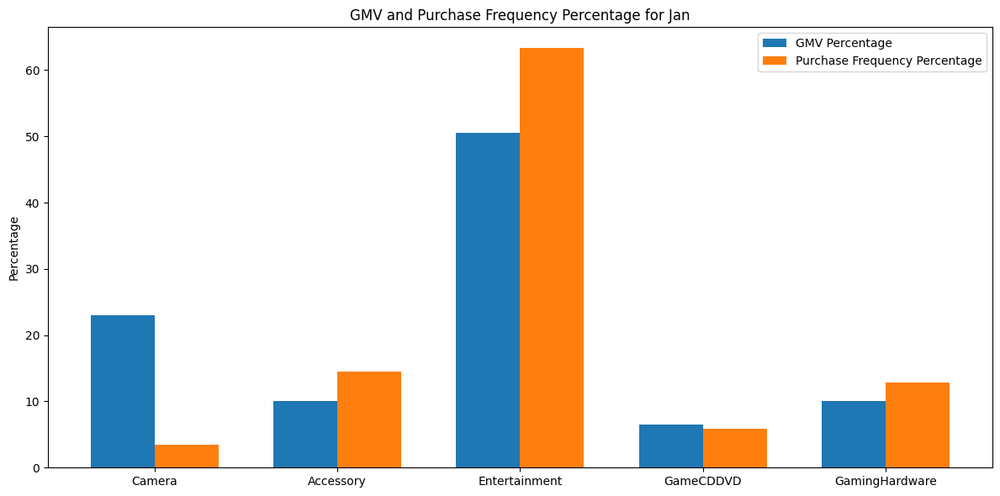

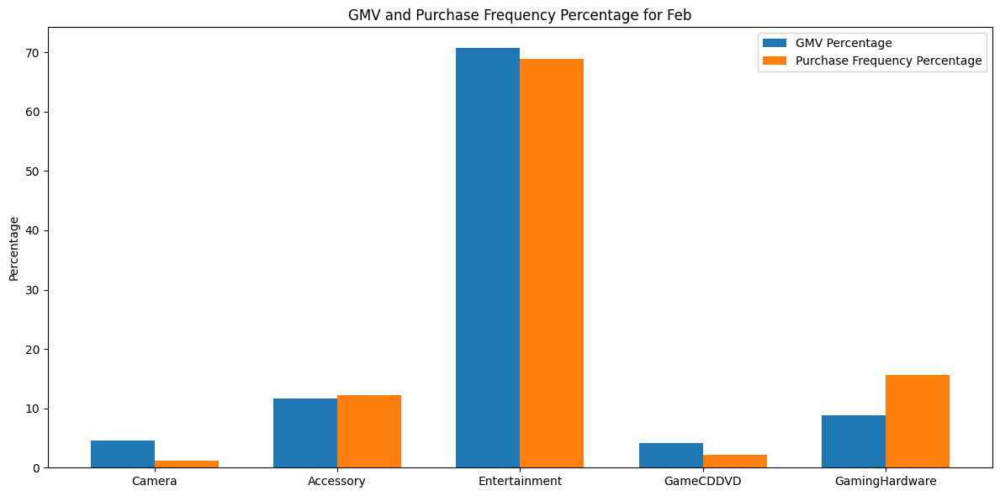

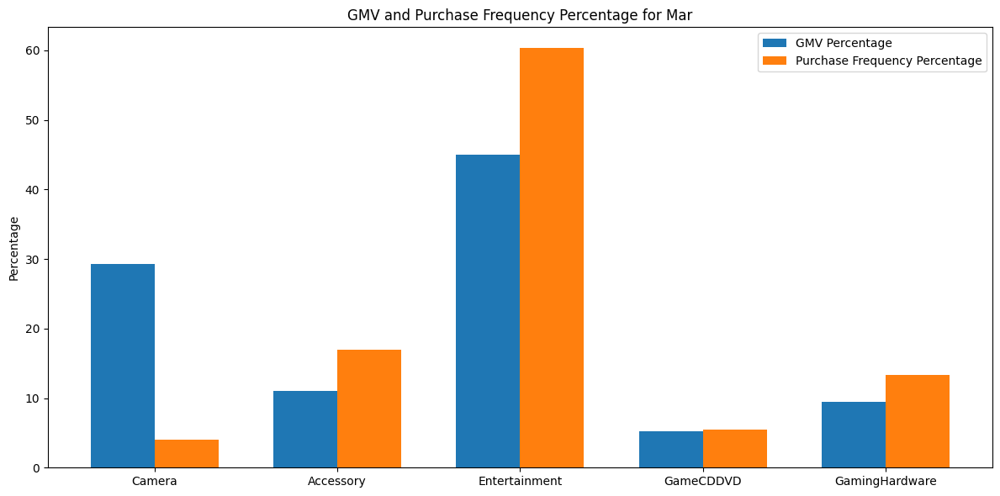

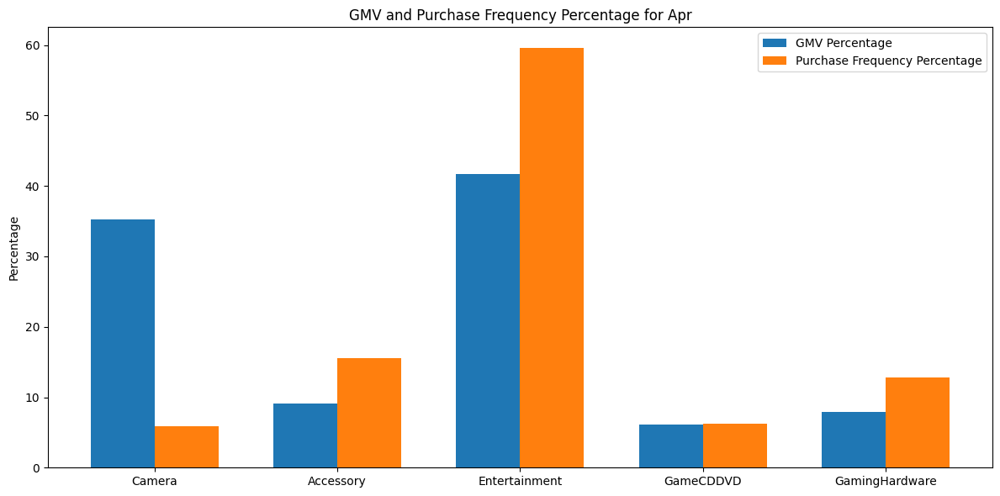

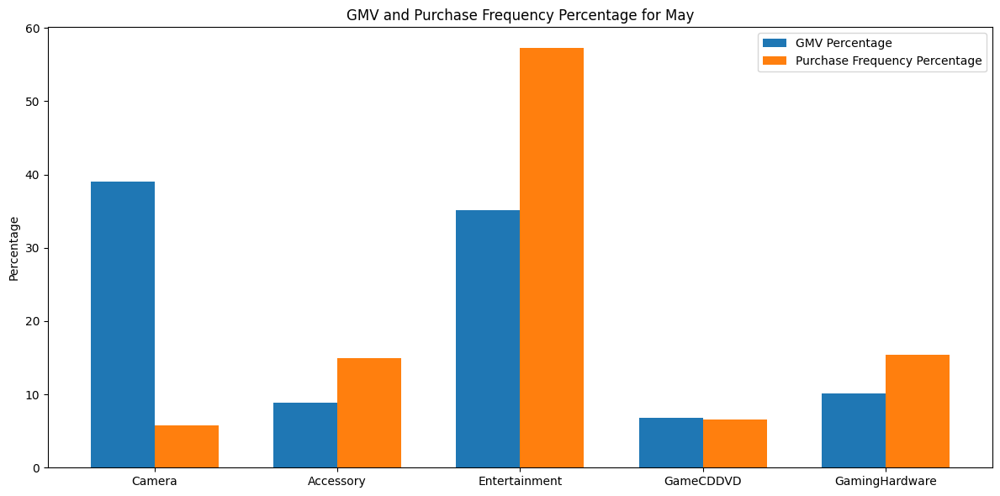

...

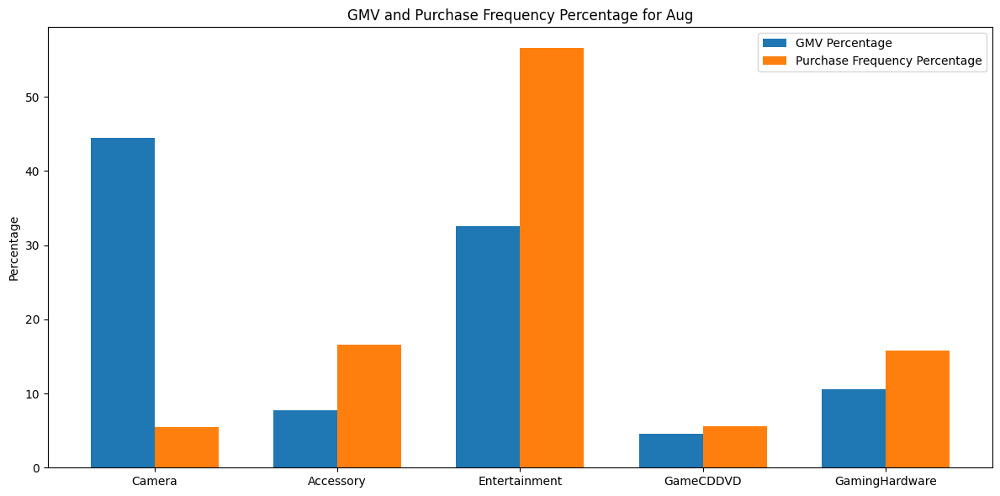

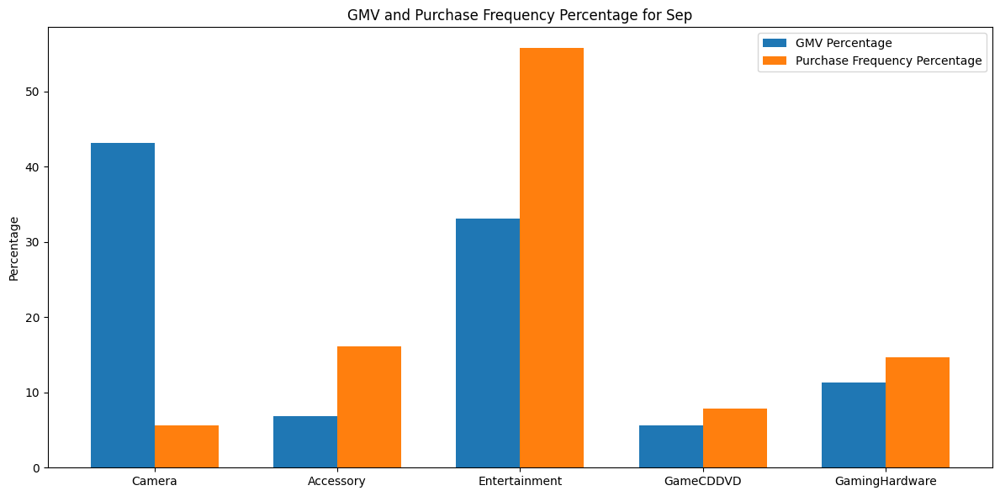

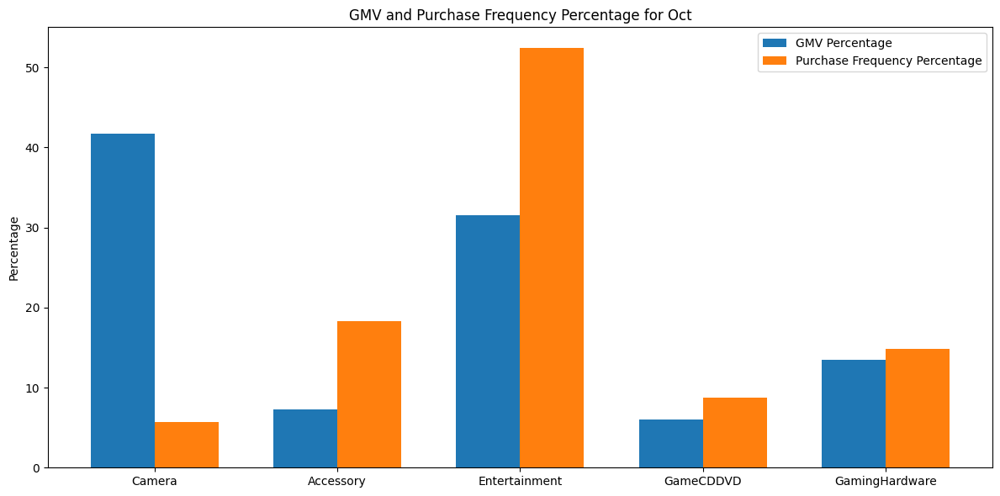

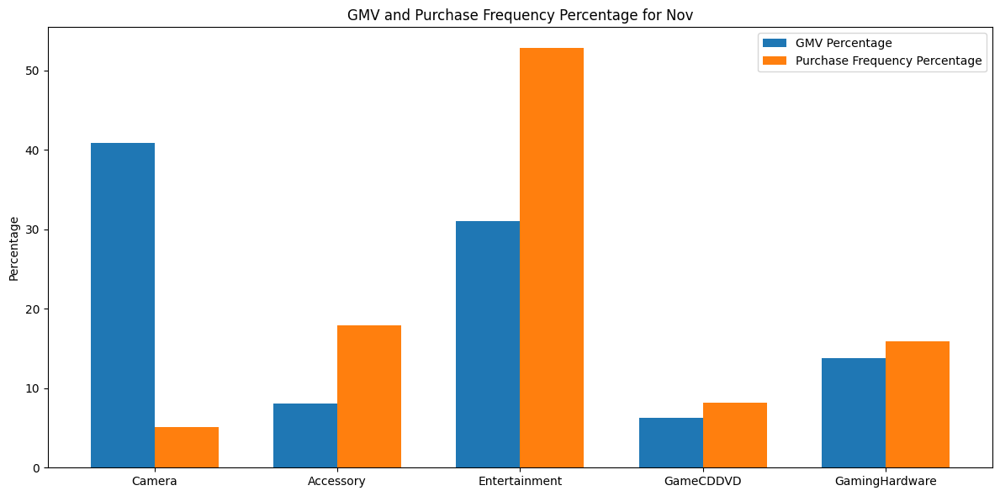

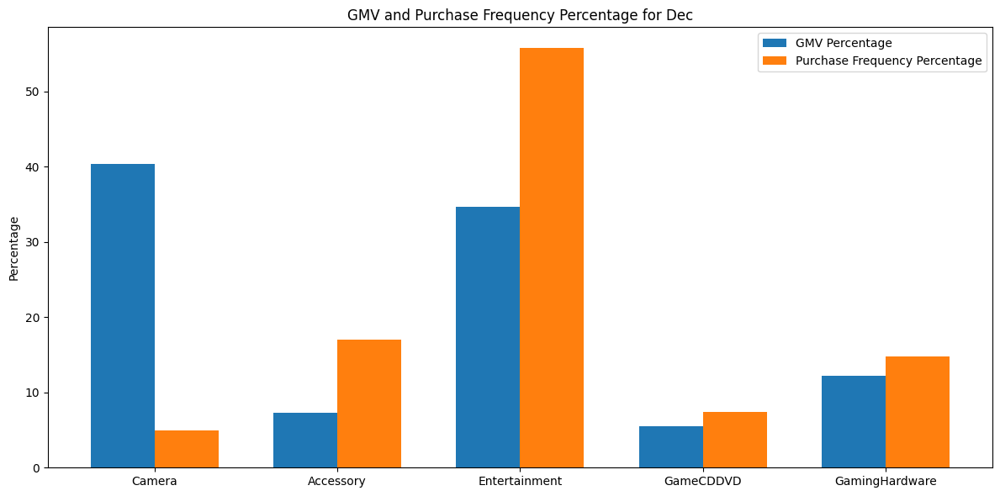

In [ ]:
for index, row in final_df.iterrows():
      # Extract GMV percentages
      gmv_percentages = [
          row['gmv_camera_percentage'],
          row['gmv_Accessory_percentage'],
          row['gmv_EntertainmentSmall_percentage'],
          row['gmv_GameCDDVD_percentage'],
          row['gmv_GamingHardware_percentage']
      ]

      # Extract purchase frequency percentages
      purchase_percentages = [
          row['purchase_cam_percentage'],
          row['purchase_camAcc_percentage'],
          row['purchase_enter_percentage'],
          row['purchase_game_percentage'],
          row['purchase_gamingHardware_percentage']
      ]

      categories = ["Camera", "Accessory", "Entertainment", "GameCDDVD", "GamingHardware"]

      # Create the bar chart
      fig, ax = plt.subplots(figsize=(12, 6))  # Adjust figure size as needed

      width = 0.35  # Adjust bar width as needed

      x = np.arange(len(categories))

      rects1 = ax.bar(x - width / 2, gmv_percentages, width, label='GMV Percentage')
      rects2 = ax.bar(x + width / 2, purchase_percentages, width, label='Purchase Frequency Percentage')

      dict=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
      ax.set_ylabel('Percentage')
      ax.set_title(f'GMV and Purchase Frequency Percentage for {dict[index]}')
      ax.set_xticks(x)
      ax.set_xticklabels(categories)
      ax.legend()

      fig.tight_layout()
      plt.show()



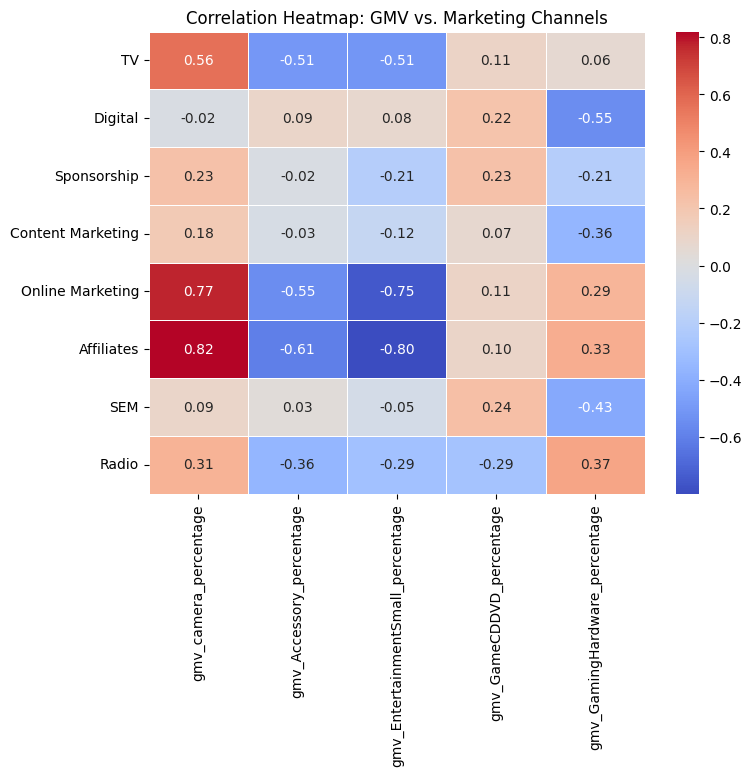

In [ ]:
# Merge on 'Month' to align the data
df_media['month']=df_media['Date'].str[5:7]
df_merged = pd.merge(df_media, final_df, on='month')

#df_merged.head()

#Compute correlation matrix between GMV & Marketing Spend
correlation_matrix = df_merged.drop(columns=['month','Month','purchase_cam_percentage','purchase_camAcc_percentage','purchase_enter_percentage','purchase_game_percentage','purchase_gamingHardware_percentage','Year', 'Total Investment','Date', 'Monthly_revenue', 'Spending_Category',
       'marketing_efficiency_score', 'ROI (%)']).corr()

selected_corr = correlation_matrix.loc[[ 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online Marketing', 'Affiliates', 'SEM', 'Radio'], ['gmv_camera_percentage',	'gmv_Accessory_percentage',	'gmv_EntertainmentSmall_percentage',	'gmv_GameCDDVD_percentage',	'gmv_GamingHardware_percentage']]

# Plot Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(selected_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap: GMV vs. Marketing Channels")
plt.show()


In [ ]:
final_df['month'][0]

'07'

In [ ]:
orders_sku['month']=orders_sku['Month'].str[5:7]

In [ ]:
orders_sku['month'][0]

'10'

In [ ]:
final_df.shape

(12, 11)

In [ ]:
orders_sku.shape

(1431794, 35)

In [ ]:
df_media.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online Marketing,Affiliates,SEM,Radio,Other,Date,Monthly_revenue,Spending_Category,marketing_efficiency_score,ROI (%)
0,2023,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2023-07-01,17.245755,Low,0.010783,1.078315
1,2023,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.0,0.0,2023-08-01,0.041610,Low,-0.991784,-99.178375
2,2023,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,0.0,0.0,2023-09-01,41.744114,High,-0.566315,-56.631466
3,2023,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,0.0,0.0,2023-10-01,50.045967,High,-0.705882,-70.588237
4,2023,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,0.0,0.0,2023-11-01,32.870461,Low,-0.358202,-35.820213
